<a href="https://colab.research.google.com/github/wuqy052/ASD_ObsLearn/blob/main/code/Main_analysis_SRS_Variability_Stability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Tentative study title: **Variability and stability of autistic traits in online and in-lab samples**

Summarize data for the SRS between & within individual differences paper.

This is a reorganized subset of code from Analyses_June2024.ipynb (+ some new analyses) to follow more closely the updated plan for the paper, assessing stability and variability in SRS scores.

Additionally it uses a '_v2' version of the data files.

In [ ]:
# load packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import pearsonr, ttest_ind, zscore, ttest_rel, norm, chi2_contingency
import statsmodels.formula.api as smf
from datetime import datetime

In [ ]:
# mount drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data summary

## Load and display data files

Note - unless we need it for anything at this stage, we may want to delete the DoB column + maybe only keep some other form of ID (not prolific or CC, etc), so we can share the data without any privacy concerns??

In [ ]:
# load data
data_srs_items = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Cleaned_data/SRS_item_merged_v2.csv')
data_all = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Cleaned_data/summary_scores_merged_v2.csv')
data_reinvite = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Cleaned_data/Autism_traits_reinvite_final_clean.csv')

In [ ]:
cols_to_num = data_srs_items.loc[:, 'SRS_1_1':'SRS_7_5'].columns
data_srs_items[cols_to_num] = data_srs_items[cols_to_num].apply(pd.to_numeric, errors='coerce')
data_srs_items = data_srs_items.drop(columns = ['Unnamed: 0'])
data_srs_items

,Source,ParticipantID,Study_ID,ID,date,SRS_1_1,SRS_1_2,SRS_1_3,SRS_1_4,SRS_1_5,...,SRS_6_6,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5
0,Conte,CP0002,CC0046,QT001,2022-06-23,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,1.0,1.0,0.0,3.0,1.0,0.0,0.0,1.0
1,Conte,CP0002,CC0046_20150204,QT002,2015-02-04,1.0,1.0,2.0,0.0,0.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0
2,Alab,CP0002,CP0002,QT003,2022-10-12,0.0,0.0,2.0,1.0,0.0,...,0.0,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0
3,CPC,CP0002,CP0002,QT004,2019-09-30,0.0,1.0,2.0,1.0,0.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0
4,Kennedy,CP0002,RA0906,QT005,2018-03-01,1.0,0.0,2.0,1.0,0.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,2024-01-28,3.0,1.0,0.0,2.0,0.0,...,0.0,3.0,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,2024-01-29,0.0,1.0,0.0,2.0,2.0,...,0.0,3.0,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,2024-01-29,2.0,1.0,1.0,1.0,2.0,...,2.0,3.0,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,2024-01-29,3.0,2.0,1.0,0.0,1.0,...,0.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0


In [ ]:
data_all = data_all.drop(columns = ['Unnamed: 0'])
data_all

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,PSWQ,STAI_state,STAI_trait,PSS,DoB,group_label,format,date,SES,AQ10
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,NaN,32.0,36.0,19.0,5/11/1985,Control,In lab,2022-06-23,NaN,NaN
1,Conte,CP0002,CC0046_20150204,QT002,NaN,NaN,NaN,NaN,29.0,50.0,...,NaN,NaN,NaN,NaN,5/11/1985,Control,In lab,2015-02-04,NaN,NaN
2,Alab,CP0002,CP0002,QT003,NaN,NaN,NaN,NaN,37.0,52.0,...,NaN,34.0,NaN,NaN,5/11/1985,Control,In lab,2022-10-12,NaN,NaN
3,CPC,CP0002,CP0002,QT004,F,NaN,Caucasian / White,Bachelors,34.0,49.0,...,32.0,NaN,41.0,NaN,5/11/1985,Control,In lab,2019-09-30,NaN,NaN
4,Kennedy,CP0002,RA0906,QT005,F,Female,Other,Bachelor's Degree,32.0,49.0,...,NaN,NaN,NaN,NaN,5/11/1985,Control,In lab,2018-03-01,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,NaN,NaN,61.0,NaN,NaN,NaN,Online,2024-01-28,NaN,NaN
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,NaN,NaN,69.0,NaN,NaN,NaN,Online,2024-01-29,NaN,NaN
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,NaN,NaN,52.0,NaN,NaN,NaN,Online,2024-01-29,NaN,NaN
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,NaN,NaN,29.0,NaN,NaN,NaN,Online,2024-01-29,NaN,NaN


In [ ]:
data_reinvite

,StartDate,IPAddress,Duration (in seconds),Finished,ID,autism,family_autism,family_autism_2,family_autism_2_15_TEXT,OCD,...,AQ_Total,LSAS_Performance_Fear,LSAS_Performance_Avoidance,LSAS_Social_Fear,LSAS_Social_Avoid,LSAS_Social,LSAS_Performance,LSAS_Fear,LSAS_Avoid,LSAS_Total
0,4/8/2024 20:59,88.19.100.199,1703,True,5e92178e8ee4fe54b65b7c39,No,No,NaN,NaN,No - but I self identify as having OCD,...,17.0,18.0,20.0,19.0,18.0,37.0,38.0,37.0,38.0,75.0
1,4/8/2024 21:13,69.220.156.184,4389,True,606a3cf263a18869ac8ee0ed,No,No,NaN,NaN,No,...,9.0,9.0,14.0,5.0,7.0,12.0,23.0,14.0,21.0,35.0
2,4/8/2024 21:48,47.208.63.218,2498,True,559fa17cfdf99b69c369d364,No,No,NaN,NaN,No,...,8.0,7.0,5.0,3.0,2.0,5.0,12.0,10.0,7.0,17.0
3,4/8/2024 22:36,70.175.93.13,1461,True,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,NaN,No,...,38.0,28.0,32.0,32.0,30.0,62.0,60.0,60.0,62.0,122.0
4,4/9/2024 0:22,104.186.234.163,2321,True,567dd32b4f0ef30006dbb718,No,I don't know,NaN,NaN,No,...,25.0,8.0,6.0,12.0,7.0,19.0,14.0,20.0,13.0,33.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,6/4/2024 13:16,99.174.168.47,1441,True,6111790b8ab52f3d075ca8a0,No,I don't know,NaN,NaN,No,...,17.0,13.0,5.0,12.0,11.0,23.0,18.0,25.0,16.0,41.0
228,6/4/2024 14:23,174.34.209.178,1221,True,610ad34844dd2b51bf5d87f5,No,I don't know,NaN,NaN,No,...,18.0,14.0,8.0,12.0,10.0,22.0,22.0,26.0,18.0,44.0
229,6/6/2024 8:09,68.10.23.237,1930,True,5b954f10754b700001f06bf0,No,Yes,niece,NaN,No,...,24.0,22.0,18.0,12.0,15.0,27.0,40.0,34.0,33.0,67.0
230,6/6/2024 11:07,216.82.43.96,2492,True,5edcadb5e81cb9000c4b07e0,No,I don't know,NaN,NaN,No,...,26.0,31.0,23.0,29.0,21.0,50.0,54.0,60.0,44.0,104.0


## Additional cleaning steps

#### Merge data_all and data_srs_items

In [ ]:
data_merged = pd.merge(data_all, data_srs_items,
                     on=['Source','ParticipantID','ID'],
                     how='left')
data_merged.rename({'Study_ID_x':'Study_ID', 'date_x':'date'}, axis=1, inplace=True)
data_merged = data_merged.drop(columns = ['Study_ID_y','date_y'])
data_merged

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_6,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,0.0,1.0,1.0,1.0,0.0,3.0,1.0,0.0,0.0,1.0
1,Conte,CP0002,CC0046_20150204,QT002,NaN,NaN,NaN,NaN,29.0,50.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0
2,Alab,CP0002,CP0002,QT003,NaN,NaN,NaN,NaN,37.0,52.0,...,0.0,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0
3,CPC,CP0002,CP0002,QT004,F,NaN,Caucasian / White,Bachelors,34.0,49.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0
4,Kennedy,CP0002,RA0906,QT005,F,Female,Other,Bachelor's Degree,32.0,49.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,0.0,3.0,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,0.0,3.0,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,2.0,3.0,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,0.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0


In [ ]:
data_merged.keys()

Index(['Source', 'ParticipantID', 'Study_ID', 'ID', 'Sex', 'Gender', 'Race',
       'Education', 'age', 'SRS', 'SRS_AWR', 'SRS_COG', 'SRS_COM', 'SRS_MOT',
       'SRS_RRB', 'AQ', 'BDI', 'LSAS', 'OCI-R', 'PSWQ', 'STAI_state',
       'STAI_trait', 'PSS', 'DoB', 'group_label', 'format', 'date', 'SES',
       'AQ10', 'SRS_1_1', 'SRS_1_2', 'SRS_1_3', 'SRS_1_4', 'SRS_1_5',
       'SRS_1_6', 'SRS_1_7', 'SRS_1_8', 'SRS_1_9', 'SRS_1_10', 'SRS_2_1',
       'SRS_2_2', 'SRS_2_3', 'SRS_2_4', 'SRS_2_5', 'SRS_2_6', 'SRS_2_7',
       'SRS_2_8', 'SRS_2_9', 'SRS_2_10', 'SRS_3_1', 'SRS_3_2', 'SRS_3_3',
       'SRS_3_4', 'SRS_3_5', 'SRS_3_6', 'SRS_3_7', 'SRS_3_8', 'SRS_3_9',
       'SRS_3_10', 'SRS_4_1', 'SRS_4_2', 'SRS_4_3', 'SRS_4_4', 'SRS_4_5',
       'SRS_4_6', 'SRS_4_7', 'SRS_4_8', 'SRS_4_9', 'SRS_4_10', 'SRS_5_1',
       'SRS_5_2', 'SRS_5_3', 'SRS_5_4', 'SRS_5_5', 'SRS_5_6', 'SRS_5_7',
       'SRS_5_8', 'SRS_5_9', 'SRS_5_10', 'SRS_6_1', 'SRS_6_2', 'SRS_6_3',
       'SRS_6_4', 'SRS_6_5', 'SRS_6_6', '

#### Exclude ASD participants



Justification for this should be that we are interested in SRS in the general population, so we exclude participants in studies that were specifically included because of their ASD diagnosis.
But for participants in other studies who just happen to report a diagnosis (i.e. in the Prolific questions), we keep them and can control for that diagnosis in later analyses, as those diagnoses are part of the "normal" variability in the population.

In [ ]:
#keep asd participants in separate dataframe in case we need them later
data_merged_asd = data_merged[(data_merged['group_label']=='asd_comorb') | (data_merged['group_label']=='asd_clean') | (data_merged['group_label']=='ASD')]
data_merged_asd

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_6,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5
721,Alab,RA0259,RA0259,QT722,NaN,NaN,NaN,NaN,34.0,33.0,...,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0
722,Alab,RA0516,RA0516,QT723,NaN,NaN,NaN,NaN,35.0,105.0,...,2.0,1.0,1.0,2.0,1.0,1.0,3.0,1.0,2.0,2.0
723,Kennedy,RA0516,RA0516,QT724,M,Male,Caucasian / White,High School (Graduate or Equivalent),31.0,97.0,...,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0
724,Alab,RA0582,RA0582,QT725,NaN,NaN,NaN,NaN,41.0,97.0,...,2.0,0.0,2.0,1.0,0.0,1.0,1.0,2.0,1.0,2.0
725,Kennedy,RA0582,RA0582,QT726,M,Male,Asian,Graduate Degree,37.0,101.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3831,WG_Task4,5f5f66b2c050a00169ba939c,NaN,5f5f66b2c050a00169ba939c,f,f,Caucasian / White,Master's Degree,34.0,120.0,...,0.0,3.0,3.0,3.0,3.0,2.0,2.0,2.0,3.0,3.0
3833,WG_Task4,5dc0353028cfb7479e1f7e8d,NaN,5dc0353028cfb7479e1f7e8d,f,f,"Caucasian / White, Hispanic",Bachelor's Degree,25.0,124.0,...,2.0,3.0,2.0,3.0,2.0,2.0,3.0,2.0,3.0,2.0
3835,WG_Task4,65884b3662a150f02800a568,NaN,65884b3662a150f02800a568,m,m,African American / Black,Bachelor's Degree,22.0,63.0,...,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
3838,WG_Task4,655f64551adb93d762c3c681,NaN,655f64551adb93d762c3c681,m,n,Caucasian / White,Some College,22.0,169.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0


In [ ]:
# only keep non ASD
data_merged = data_merged.drop(data_merged[data_merged['group_label']=='asd_comorb'].index)
data_merged = data_merged.drop(data_merged[data_merged['group_label']=='asd_clean'].index)
data_merged = data_merged.drop(data_merged[data_merged['group_label']=='ASD'].index)
data_merged

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_6,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,0.0,1.0,1.0,1.0,0.0,3.0,1.0,0.0,0.0,1.0
1,Conte,CP0002,CC0046_20150204,QT002,NaN,NaN,NaN,NaN,29.0,50.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0
2,Alab,CP0002,CP0002,QT003,NaN,NaN,NaN,NaN,37.0,52.0,...,0.0,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0
3,CPC,CP0002,CP0002,QT004,F,NaN,Caucasian / White,Bachelors,34.0,49.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0
4,Kennedy,CP0002,RA0906,QT005,F,Female,Other,Bachelor's Degree,32.0,49.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,0.0,3.0,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,0.0,3.0,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,2.0,3.0,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,0.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0


In [ ]:
data_merged['Source'].unique()

array(['Conte', 'Alab', 'CPC', 'Kennedy', 'OD_R01', 'CompPsych_Prolific',
       'CompPsych_Mturk', 'OLEL_Prolific_v1', 'OLEL_Prolific_v2',
       'OLEL_Prolific_v3', 'OLEL_Prolific_v4', 'OLEL_Prolific_v5',
       'SLB_discovery', 'WG_Pilot1_2022', 'WG_Task3', 'WG_Task4'],
      dtype=object)

In [ ]:
np.sum(data_merged['Source'] == 'CompPsych_Mturk')

1005

#### Exclude participants with missing data in some of the SRS items.

In [ ]:
# Get a list of columns that start with 'SRS'
srs_columns = [col for col in data_merged.columns if col.startswith('SRS')]

# Apply the mask to get the filtered DataFrame
data_merged.dropna(subset=srs_columns, inplace=True)
data_merged

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_6,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,0.0,1.0,1.0,1.0,0.0,3.0,1.0,0.0,0.0,1.0
1,Conte,CP0002,CC0046_20150204,QT002,NaN,NaN,NaN,NaN,29.0,50.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0
2,Alab,CP0002,CP0002,QT003,NaN,NaN,NaN,NaN,37.0,52.0,...,0.0,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0
3,CPC,CP0002,CP0002,QT004,F,NaN,Caucasian / White,Bachelors,34.0,49.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0
4,Kennedy,CP0002,RA0906,QT005,F,Female,Other,Bachelor's Degree,32.0,49.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,0.0,3.0,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,0.0,3.0,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,2.0,3.0,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,0.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0


#### Check that SRS items sum to total

In [ ]:
#reverse code relevant items in SRS_item_merged
data_merged_rev = data_merged.copy()

#reverse coded items in SRS are
#[3 7 11 12 15 17 21 22 26 32 38 40 43 45 48]
reverse_coded_fields = ['SRS_1_3', 'SRS_1_7', 'SRS_2_1', 'SRS_2_2', 'SRS_2_5', 'SRS_2_7', 'SRS_3_1', 'SRS_3_2', 'SRS_3_6', 'SRS_4_2', 'SRS_4_8', 'SRS_4_10', 'SRS_5_3', 'SRS_5_5', 'SRS_5_8']
data_merged_rev[reverse_coded_fields] = 3 - data_merged[reverse_coded_fields]
data_merged_rev['SRS_sum'] = data_merged_rev[cols_to_num].sum(axis=1)
data_merged_rev['check_SRS'] = data_merged_rev['SRS_sum'] == data_merged_rev['SRS']
data_merged_rev

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,SRS_sum,check_SRS
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,1.0,1.0,0.0,3.0,1.0,0.0,0.0,1.0,41.0,True
1,Conte,CP0002,CC0046_20150204,QT002,NaN,NaN,NaN,NaN,29.0,50.0,...,2.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0,50.0,True
2,Alab,CP0002,CP0002,QT003,NaN,NaN,NaN,NaN,37.0,52.0,...,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,52.0,True
3,CPC,CP0002,CP0002,QT004,F,NaN,Caucasian / White,Bachelors,34.0,49.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,49.0,True
4,Kennedy,CP0002,RA0906,QT005,F,Female,Other,Bachelor's Degree,32.0,49.0,...,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0,49.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0,111.0,True
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0,104.0,True
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0,91.0,True
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,64.0,True


In [ ]:
data_merged_rev[data_merged_rev['check_SRS'] == False]

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,SRS_sum,check_SRS
6,Conte,CP0003,CC0111,QT007,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,22.0,False


In [ ]:
np.sum(data_merged_rev['check_SRS'] == False)

1

In [ ]:
data_merged_rev.loc[data_merged_rev['ParticipantID'] == 'CP0003',['Source','ParticipantID','Study_ID','ID','age','date','SRS','SRS_sum','check_SRS']]

,Source,ParticipantID,Study_ID,ID,age,date,SRS,SRS_sum,check_SRS
5,Conte,CP0003,CC0111,QT006,35.0,2022-06-15,30.0,30.0,True
6,Conte,CP0003,CC0111,QT007,35.0,2022-06-15,30.0,22.0,False
8,Alab,CP0003,CP0003,QT009,35.0,2022-10-20,30.0,30.0,True
9,CPC,CP0003,CP0003,QT010,32.0,2019-10-02,13.0,13.0,True


One participant to exclude.

In [ ]:
data_merged = data_merged.drop(data_merged[data_merged_rev['check_SRS'] == False].index)
data_merged

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_6,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,0.0,1.0,1.0,1.0,0.0,3.0,1.0,0.0,0.0,1.0
1,Conte,CP0002,CC0046_20150204,QT002,NaN,NaN,NaN,NaN,29.0,50.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0
2,Alab,CP0002,CP0002,QT003,NaN,NaN,NaN,NaN,37.0,52.0,...,0.0,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0
3,CPC,CP0002,CP0002,QT004,F,NaN,Caucasian / White,Bachelors,34.0,49.0,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0
4,Kennedy,CP0002,RA0906,QT005,F,Female,Other,Bachelor's Degree,32.0,49.0,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,0.0,3.0,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,0.0,3.0,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,2.0,3.0,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,0.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0


In [ ]:
data_merged_rev = data_merged_rev.drop(data_merged_rev[data_merged_rev['check_SRS'] == False].index)
data_merged_rev

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,SRS_sum,check_SRS
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,1.0,1.0,0.0,3.0,1.0,0.0,0.0,1.0,41.0,True
1,Conte,CP0002,CC0046_20150204,QT002,NaN,NaN,NaN,NaN,29.0,50.0,...,2.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0,50.0,True
2,Alab,CP0002,CP0002,QT003,NaN,NaN,NaN,NaN,37.0,52.0,...,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,52.0,True
3,CPC,CP0002,CP0002,QT004,F,NaN,Caucasian / White,Bachelors,34.0,49.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,49.0,True
4,Kennedy,CP0002,RA0906,QT005,F,Female,Other,Bachelor's Degree,32.0,49.0,...,0.0,1.0,1.0,0.0,1.0,0.0,1.0,2.0,49.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0,111.0,True
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0,104.0,True
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0,91.0,True
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,64.0,True


#### Identify duplicates who completed multiple studies at different dates

In [ ]:
# Step 1: Identify the duplicate values
duplicate_mask = data_merged['ParticipantID'].duplicated(keep=False)

# Step 2: Create a DataFrame with only the rows containing duplicates
duplicates_df = data_merged[duplicate_mask][['ParticipantID', 'Source', 'date', 'format']]

# Step 3: Sort the DataFrame by the column with duplicates and the date
duplicates_df_sorted = duplicates_df.sort_values(['ParticipantID', 'date'])

duplicates_df_sorted

,ParticipantID,Source,date,format
824,53979923fdf99b1ccc3f11f6,CompPsych_Prolific,2020-11-13,Online
2096,53979923fdf99b1ccc3f11f6,OLEL_Prolific_v4,2020-12-03,Online
3365,55885582fdf99b4021921fbd,WG_Pilot1_2022,2022-04-11,Online
3542,55885582fdf99b4021921fbd,WG_Task4,2023-11-10,Online
3295,558a327cfdf99b2d75651681,WG_Pilot1_2022,2022-04-10,Online
...,...,...,...,...
596,CP0412,OD_R01,2023-03-21,In lab
600,CP0416,CPC,2023-02-09,In lab
601,CP0416,OD_R01,2023-03-28,In lab
683,R01_0158,OD_R01,2022-12-15,In lab


In [ ]:
# Step 4: Group by the duplicate values and aggregate the dates into a list
grouped_srs_duplicates_date = duplicates_df_sorted.groupby('ParticipantID')['date'].apply(list).reset_index()
grouped_srs_duplicates_source = duplicates_df_sorted.groupby('ParticipantID')['Source'].apply(list).reset_index()
grouped_srs_duplicates_format = duplicates_df_sorted[['ParticipantID', 'format']].drop_duplicates()

grouped_srs_duplicates = pd.merge(grouped_srs_duplicates_date, grouped_srs_duplicates_source, on=['ParticipantID'], how='left')
grouped_srs_duplicates = pd.merge(grouped_srs_duplicates, grouped_srs_duplicates_format, on=['ParticipantID'], how='left')
grouped_srs_duplicates['n_repeats'] = grouped_srs_duplicates['date'].apply(len)
grouped_srs_duplicates

,ParticipantID,date,Source,format,n_repeats
0,53979923fdf99b1ccc3f11f6,"[2020-11-13, 2020-12-03]","[CompPsych_Prolific, OLEL_Prolific_v4]",Online,2
1,55885582fdf99b4021921fbd,"[2022-04-11, 2023-11-10]","[WG_Pilot1_2022, WG_Task4]",Online,2
2,558a327cfdf99b2d75651681,"[2022-04-10, 2023-11-08]","[WG_Pilot1_2022, WG_Task4]",Online,2
3,5658000ca9872d0011e1ba26,"[2021-09-08, 2022-07-04]","[OLEL_Prolific_v5, SLB_discovery]",Online,2
4,567dd32b4f0ef30006dbb718,"[2021-08-25, 2022-11-11]","[OLEL_Prolific_v5, SLB_discovery]",Online,2
...,...,...,...,...,...
263,CP0408,"[2023-01-16, 2023-04-25]","[CPC, OD_R01]",In lab,2
264,CP0410,"[2023-01-24, 2023-06-12]","[CPC, OD_R01]",In lab,2
265,CP0412,"[2023-01-31, 2023-03-21]","[CPC, OD_R01]",In lab,2
266,CP0416,"[2023-02-09, 2023-03-28]","[CPC, OD_R01]",In lab,2


In [ ]:
grouped_srs_duplicates.groupby(['format','n_repeats']).size().reset_index(name='counts')

,format,n_repeats,counts
0,In lab,2,135
1,In lab,3,18
2,In lab,4,5
3,In lab,5,3
4,Online,2,104
5,Online,3,3


In [ ]:
#how many of the duplicate Prolific participants also completed the reinvite study
grouped_srs_duplicates['is_in_reinvite'] = grouped_srs_duplicates['ParticipantID'].isin(data_reinvite['ID'])
grouped_srs_duplicates[grouped_srs_duplicates['is_in_reinvite']]

,ParticipantID,date,Source,format,n_repeats,is_in_reinvite
3,5658000ca9872d0011e1ba26,"[2021-09-08, 2022-07-04]","[OLEL_Prolific_v5, SLB_discovery]",Online,2,True
4,567dd32b4f0ef30006dbb718,"[2021-08-25, 2022-11-11]","[OLEL_Prolific_v5, SLB_discovery]",Online,2,True
6,56e32190e414dc000c8b40ae,"[2021-09-01, 2022-10-18]","[OLEL_Prolific_v5, SLB_discovery]",Online,2,True
27,5d338bb02381b7001761694e,"[2021-08-25, 2022-04-11]","[OLEL_Prolific_v5, WG_Pilot1_2022]",Online,2,True
30,5d8a64630ffb9c001746ca2c,"[2020-08-04, 2022-04-10]","[OLEL_Prolific_v2, WG_Pilot1_2022]",Online,2,True
35,5e29c3e725dcfd01cef9f474,"[2020-12-03, 2022-11-01]","[OLEL_Prolific_v4, SLB_discovery]",Online,2,True
38,5e79aad7e135bf568f21f2a0,"[2020-12-05, 2022-06-24]","[OLEL_Prolific_v4, SLB_discovery]",Online,2,True
45,5ee11eb5636ea94d3ad43e3b,"[2020-10-27, 2022-11-16]","[OLEL_Prolific_v3, SLB_discovery]",Online,2,True
50,5f16f559325a640008bb9a07,"[2020-12-05, 2022-11-21]","[OLEL_Prolific_v4, SLB_discovery]",Online,2,True
83,6108c363c95fc665a5d08c32,"[2021-08-16, 2022-11-21]","[OLEL_Prolific_v5, SLB_discovery]",Online,2,True


In [ ]:
np.sum(grouped_srs_duplicates['is_in_reinvite'])

10

#### Exclude duplicates from data_merged: keep earlier data point from 2020-2024 period


In [ ]:
data_merged_nodupl = data_merged.copy()
data_merged_rev_nodupl = data_merged_rev.copy()
for pid in grouped_srs_duplicates['ParticipantID']:
  df_temp = duplicates_df_sorted[(duplicates_df_sorted['ParticipantID'] == pid) & (pd.to_datetime(duplicates_df_sorted['date']) > datetime(2020, 1, 1))]
  excl = duplicates_df_sorted[(duplicates_df_sorted['ParticipantID'] == pid) & (duplicates_df_sorted['date'] != np.min(df_temp['date']))]
  for idx in excl.index:
    if idx in data_merged_nodupl.index:
      data_merged_nodupl = data_merged_nodupl.drop(idx)
    if idx in data_merged_rev_nodupl.index:
      data_merged_rev_nodupl = data_merged_rev_nodupl.drop(idx)

In [ ]:
data_merged_nodupl['date'] = pd.to_datetime(data_merged_nodupl['date'])
data_merged_nodupl['date_ordinal'] = data_merged_nodupl['date'].apply(lambda x: x.toordinal())
data_merged_rev_nodupl['date'] = pd.to_datetime(data_merged_rev_nodupl['date'])
data_merged_rev_nodupl['date_ordinal'] = data_merged_rev_nodupl['date'].apply(lambda x: x.toordinal())
data_merged_rev_nodupl = data_merged_rev_nodupl.drop(columns = ['SRS_sum','check_SRS'])

Before saving, recode gender variable into 'M', 'W', 'NB', or nan

In [ ]:
data_merged_nodupl['Gender'].unique()

array([nan, 'Man', 'Female', 'Male', 'Woman', 'M', 'W',
       'Woman, Additional gender category/identity: please specify',
       'Demigender, Woman', 'Androgyne', 'Trans man',
       'Demigender, Genderqueer or gender fluid, Woman',
       'Genderqueer or gender fluid',
       'Genderqueer or gender fluid, Woman',
       'Additional gender category/identity: please specify',
       'Genderqueer or gender fluid, Additional gender category/identity: please specify',
       'Man, Questioning or unsure', 'Genderqueer or gender fluid, Man',
       'Prefer not to disclose', 'Questioning or unsure',
       'Questioning or unsure, Woman', 'Androgyne, Man',
       'Genderqueer or gender fluid, Trans woman, Woman',
       'Man, Trans man', 'Agender', 'Non-specific', 'm', 'f', 'n'],
      dtype=object)

In [ ]:
data_merged_nodupl['Gender_recode'] = data_merged_nodupl['Gender'].replace({'Woman': 'W', 'Female': 'W', 'f': 'W', 'Questioning or unsure, Woman': 'W',
                                                                            'Man': 'M', 'Male': 'M', 'm': 'M', 'Trans man': 'M', 'Man, Trans man': 'M', 'Man, Questioning or unsure': 'M',
                                                                            'n': 'NB', 'Agender': 'NB', 'Non-specific': 'NB', 'Androgyne': 'NB', 'Questioning or unsure': 'NB',
                                                                            'Genderqueer or gender fluid':'NB', 'Additional gender category/identity: please specify': 'NB',
                                                                            'Genderqueer or gender fluid, Additional gender category/identity: please specify': 'NB', 'Prefer not to disclose': np.nan,
                                                                            'Demigender, Woman': 'NB', 'Demigender, Genderqueer or gender fluid, Woman': 'NB',
                                                                            'Genderqueer or gender fluid, Woman': 'NB', 'Genderqueer or gender fluid, Man': 'NB',
                                                                            'Genderqueer or gender fluid, Trans woman, Woman': 'NB', 'Androgyne, Man': 'NB',
                                                                            'Woman, Additional gender category/identity: please specify': 'W'})
data_merged_nodupl['Gender_recode'].unique()

array([nan, 'M', 'W', 'NB'], dtype=object)

In [ ]:
data_merged_rev_nodupl['Gender_recode'] = data_merged_rev_nodupl['Gender'].replace({'Woman': 'W', 'Female': 'W', 'f': 'W', 'Questioning or unsure, Woman': 'W',
                                                                            'Man': 'M', 'Male': 'M', 'm': 'M', 'Trans man': 'M', 'Man, Trans man': 'M', 'Man, Questioning or unsure': 'M',
                                                                            'n': 'NB', 'Agender': 'NB', 'Non-specific': 'NB', 'Androgyne': 'NB', 'Questioning or unsure': 'NB',
                                                                            'Genderqueer or gender fluid':'NB', 'Additional gender category/identity: please specify': 'NB',
                                                                            'Genderqueer or gender fluid, Additional gender category/identity: please specify': 'NB', 'Prefer not to disclose': np.nan,
                                                                            'Demigender, Woman': 'NB', 'Demigender, Genderqueer or gender fluid, Woman': 'NB',
                                                                            'Genderqueer or gender fluid, Woman': 'NB', 'Genderqueer or gender fluid, Man': 'NB',
                                                                            'Genderqueer or gender fluid, Trans woman, Woman': 'NB', 'Androgyne, Man': 'NB',
                                                                            'Woman, Additional gender category/identity: please specify': 'W'})

In [ ]:
data_merged_nodupl['Education'].unique()

array([nan, 'Some College', 'Bachelors', 'Some_College', 'Associates',
       'Masters', 'High_school', 'Professional_degree',
       'Some_graduate_ed', 'Graduate', "Master's Degree",
       "Bachelor's Degree", "Associate's Degree",
       'High School (Graduate or Equivalent)', 'Graduate Degree',
       'Some High School', 'Masters Degree', 'Bachelors Degree',
       'Associates Degree', 'Middle School', "Master's degree",
       'High school diploma/GED', 'Doctoral degree',
       "Associate's degree (2 yr)", "Bachelor's degree (4 yr)",
       'Currently in college/university', 'Did not complete high school',
       'Undergraduate degree (BA/BSc/other)',
       'High school diploma/A-levels', 'Technical/community college',
       'Graduate degree (MA/MSc/MPhil/other)', 'No formal qualifications',
       'Doctorate degree (PhD/other)',
       'Secondary education (e.g. GED/GCSE)', 'Graduate degree',
       'Undergraduate degree', 'High school', 'Some college',
       'Doctorate degr

In [ ]:
#recode education data
data_merged_nodupl['Education_recode'] = data_merged_nodupl['Education'].replace({'Bachelors': 'Bachelors Degree', 'Some_College': 'Some College', 'Associates': 'Associates/Professional Degree',
       'Masters': 'Graduate Degree', 'High_school': 'High School', 'Professional_degree': 'Associates/Professional Degree', 'Some_graduate_ed': 'Bachelors Degree', 'Graduate': 'Graduate Degree', "Master's Degree": 'Graduate Degree',
       "Bachelor's Degree": 'Bachelors Degree', "Associate's Degree": 'Associates/Professional Degree', 'High School (Graduate or Equivalent)': 'High School',
       'Some High School': 'High School', 'Masters Degree': 'Graduate Degree', 'Associates Degree': 'Associates/Professional Degree', "Master's degree": 'Graduate Degree',
       'High school diploma/GED': 'High School', 'Doctoral degree': 'Graduate Degree', "Associate's degree (2 yr)": 'Associates/Professional Degree', "Bachelor's degree (4 yr)": 'Bachelors Degree',
       'Currently in college/university': 'Some College', 'Did not complete high school': 'High School', 'Undergraduate degree (BA/BSc/other)': 'Bachelors Degree',
       'High school diploma/A-levels': 'High School', 'Technical/community college': 'Some College', 'Graduate degree (MA/MSc/MPhil/other)': 'Graduate Degree', 'No formal qualifications': 'Middle School',
       'Doctorate degree (PhD/other)': 'Graduate Degree', 'Secondary education (e.g. GED/GCSE)': 'High School', 'Graduate degree': 'Graduate Degree',
       'Undergraduate degree': 'Bachelors Degree', 'High school': 'High School', 'Some college': 'Some College', 'Doctorate degree': 'Graduate Degree'})
#add numerical education variable
data_merged_nodupl['Education_num'] = data_merged_nodupl['Education_recode'].replace({'Middle School': 0, 'High School': 1, 'Some College': 2, 'Associates/Professional Degree': 2, 'Bachelors Degree': 3, 'Graduate Degree': 4})
data_merged_nodupl['Education_recode'].unique()

<ipython-input-97-80178cbaf3cb>:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_merged_nodupl['Education_num'] = data_merged_nodupl['Education_recode'].replace({'Middle School': 0, 'High School': 1, 'Some College': 2, 'Associates/Professional Degree': 2, 'Bachelors Degree': 3, 'Graduate Degree': 4})


array([nan, 'Some College', 'Bachelors Degree',
       'Associates/Professional Degree', 'Graduate Degree', 'High School',
       'Middle School'], dtype=object)

In [ ]:
data_merged_nodupl['Education_num'].unique()

array([nan,  2.,  3.,  4.,  1.,  0.])

In [ ]:
data_merged_rev_nodupl['Education_recode'] = data_merged_rev_nodupl['Education'].replace({'Bachelors': 'Bachelors Degree', 'Some_College': 'Some College', 'Associates': 'Associates/Professional Degree',
       'Masters': 'Graduate Degree', 'High_school': 'High School', 'Professional_degree': 'Associates/Professional Degree', 'Some_graduate_ed': 'Bachelors Degree', 'Graduate': 'Graduate Degree', "Master's Degree": 'Graduate Degree',
       "Bachelor's Degree": 'Bachelors Degree', "Associate's Degree": 'Associates/Professional Degree', 'High School (Graduate or Equivalent)': 'High School',
       'Some High School': 'High School', 'Masters Degree': 'Graduate Degree', 'Associates Degree': 'Associates/Professional Degree', "Master's degree": 'Graduate Degree',
       'High school diploma/GED': 'High School', 'Doctoral degree': 'Graduate Degree', "Associate's degree (2 yr)": 'Associates/Professional Degree', "Bachelor's degree (4 yr)": 'Bachelors Degree',
       'Currently in college/university': 'Some College', 'Did not complete high school': 'High School', 'Undergraduate degree (BA/BSc/other)': 'Bachelors Degree',
       'High school diploma/A-levels': 'High School', 'Technical/community college': 'Some College', 'Graduate degree (MA/MSc/MPhil/other)': 'Graduate Degree', 'No formal qualifications': 'Middle School',
       'Doctorate degree (PhD/other)': 'Graduate Degree', 'Secondary education (e.g. GED/GCSE)': 'High School', 'Graduate degree': 'Graduate Degree',
       'Undergraduate degree': 'Bachelors Degree', 'High school': 'High School', 'Some college': 'Some College', 'Doctorate degree': 'Graduate Degree'})
#add numerical education variable
data_merged_rev_nodupl['Education_num'] = data_merged_rev_nodupl['Education_recode'].replace({'Middle School': 0, 'High School': 1, 'Some College': 2, 'Associates/Professional Degree': 2, 'Bachelors Degree': 3, 'Graduate Degree': 4})

<ipython-input-99-d058fcec99e7>:11: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_merged_rev_nodupl['Education_num'] = data_merged_rev_nodupl['Education_recode'].replace({'Middle School': 0, 'High School': 1, 'Some College': 2, 'Associates/Professional Degree': 2, 'Bachelors Degree': 3, 'Graduate Degree': 4})


In [ ]:
data_merged_nodupl

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_ordinal,Gender_recode,Education_recode,Education_num
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,0.0,3.0,1.0,0.0,0.0,1.0,738329,NaN,NaN,NaN
5,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,1.0,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN
13,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,1.0,0.0,1.0,1.0,1.0,1.0,738260,M,Some College,2.0
14,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,1.0,0.0,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0
21,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,2.0,2.0,2.0,0.0,3.0,1.0,738913,NaN,NaN,NaN
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,3.0,1.0,1.0,0.0,3.0,3.0,738914,NaN,NaN,NaN
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,0.0,3.0,0.0,0.0,1.0,3.0,738914,NaN,NaN,NaN
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,2.0,1.0,2.0,2.0,1.0,738914,NaN,NaN,NaN


In [ ]:
data_merged_rev_nodupl

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_ordinal,Gender_recode,Education_recode,Education_num
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,0.0,3.0,1.0,0.0,0.0,1.0,738329,NaN,NaN,NaN
5,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,1.0,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN
13,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,1.0,0.0,1.0,1.0,1.0,1.0,738260,M,Some College,2.0
14,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,1.0,0.0,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0
21,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3865,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,2.0,2.0,2.0,0.0,3.0,1.0,738913,NaN,NaN,NaN
3866,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,3.0,1.0,1.0,0.0,3.0,3.0,738914,NaN,NaN,NaN
3867,WG_Task4,60086bc08462644784ceb1af,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,0.0,3.0,0.0,0.0,1.0,3.0,738914,NaN,NaN,NaN
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,2.0,1.0,2.0,2.0,1.0,738914,NaN,NaN,NaN


In [ ]:
np.sum(data_merged_nodupl['Source'] == 'CompPsych_Mturk')

1005

In [ ]:
data_merged_nodupl.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_merged_no_duplicates.csv')
data_merged_rev_nodupl.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_merged_reversed_no_duplicates.csv')

#### Create a 'repeat' dataset for in-lab participants, both for summary scores and SRS items

This is so we can assess test-retest reliability in our in-lab sample, and comparing with the test-retest reliability from the online study.

For simplicity, we probably only want to keep 2 data points per person.
* if we only have 2 data points for a person, keep those two
  * unless they are too close (e.g. less than 6 months/183 days) in which case exclude
* if we have 3 or more repeats, try and have the test-retest time points for the in-lab data as close as possible to the reinvite study in terms of:
  * absolute dates (2020-2024 period)
  * time elapsed between the two time points (~3 years)

In [ ]:
# convert date to ordinal
data_merged['date'] = pd.to_datetime(data_merged['date'])
data_merged['date_ordinal'] = data_merged['date'].apply(lambda x: x.toordinal())

In [ ]:
#create empty dataframes
time1_data = pd.DataFrame(columns=data_merged.keys().to_list())
time2_data = pd.DataFrame(columns=data_merged.keys().to_list())

#create list of repeated id for in-lab participants
grouped_srs_duplicates_inlab = grouped_srs_duplicates[grouped_srs_duplicates['format']=="In lab"]
in_lab_repeat_IDs = grouped_srs_duplicates_inlab['ParticipantID'].to_list()

for id in in_lab_repeat_IDs:
  #for current id, create data subset for that participant and save number of repeats
  nrep = grouped_srs_duplicates[grouped_srs_duplicates['ParticipantID'] == id]['n_repeats'].values[0]
  data_subset = data_merged[data_merged['ParticipantID'] == id]
  #fill in potential missing demographic information in some duplicates
  dem_col_keys = ['Sex','Gender','Race','Education']
  for col in dem_col_keys:
    if np.sum(pd.isna(data_subset[col])) != nrep:
      sex = data_subset.loc[pd.isna(data_subset[col]) == False, [col]].values[0]
      data_subset.loc[pd.isna(data_subset[col]), [col]] = sex
  #sort by date so that lower indices are earlier date
  data_subset = data_subset.sort_values(by=['date_ordinal'])

  if nrep == 2:
    date1 = data_subset['date_ordinal'].values[0] #earlier date (because data_subset is sorted by date_ordinal)
    date2 = data_subset['date_ordinal'].values[1] #later date
    if date2-date1>=183:
      time1_data = pd.concat([time1_data, data_subset.iloc[[0]]])
      time2_data = pd.concat([time2_data, data_subset.iloc[[1]]])
    else:
      print("ID " + id + ": time between test and retest shorter than 183 days")

  elif nrep == 3:
    #extract time intervals between the 3 dates
    date1 = data_subset['date_ordinal'].values[0]
    date2 = data_subset['date_ordinal'].values[1]
    date3 = data_subset['date_ordinal'].values[2]
    #pick interval closest to 1095 days (3 years)
    interval_list = [date2-date1, date3-date2, date3-date1]
    abs_interval_diff_list = [np.abs(date2-date1-1095), np.abs(date3-date2-1095), np.abs(date3-date1-1095)]
    index_best_interval = abs_interval_diff_list.index(np.min(abs_interval_diff_list))
    if index_best_interval==0 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[0]]]) #date1
      time2_data = pd.concat([time2_data, data_subset.iloc[[1]]]) #date2
    elif index_best_interval==1 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[1]]]) #date2
      time2_data = pd.concat([time2_data, data_subset.iloc[[2]]]) #date3
    elif index_best_interval==2 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[0]]]) #date1
      time2_data = pd.concat([time2_data, data_subset.iloc[[2]]]) #date3
    else:
      print("ID " + id + ": no interval longer than 30 days")

  elif nrep == 4:
    #extract time intervals between the 4 dates
    date1 = data_subset['date_ordinal'].values[0]
    date2 = data_subset['date_ordinal'].values[1]
    date3 = data_subset['date_ordinal'].values[2]
    date4 = data_subset['date_ordinal'].values[3]
    interval_list = [date2-date1, date3-date2, date4-date3, date3-date1, date4-date2, date4-date1]
    abs_interval_diff_list = [np.abs(date2-date1-1095), np.abs(date3-date2-1095), np.abs(date4-date3-1095), np.abs(date3-date1-1095), np.abs(date4-date2-1095), np.abs(date4-date1-1095)]
    index_best_interval = abs_interval_diff_list.index(np.min(abs_interval_diff_list))
    interval_list[index_best_interval]
    if index_best_interval==0 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[0]]]) #date1
      time2_data = pd.concat([time2_data, data_subset.iloc[[1]]]) #date2
    elif index_best_interval==1 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[1]]]) #date2
      time2_data = pd.concat([time2_data, data_subset.iloc[[2]]]) #date3
    elif index_best_interval==2 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[2]]]) #date3
      time2_data = pd.concat([time2_data, data_subset.iloc[[3]]]) #date4
    elif index_best_interval==3 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[0]]]) #date1
      time2_data = pd.concat([time2_data, data_subset.iloc[[2]]]) #date3
    elif index_best_interval==4 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[1]]]) #date2
      time2_data = pd.concat([time2_data, data_subset.iloc[[3]]]) #date4
    elif index_best_interval==5 and interval_list[index_best_interval]>=30:
      time1_data = pd.concat([time1_data, data_subset.iloc[[0]]]) #date1
      time2_data = pd.concat([time2_data, data_subset.iloc[[3]]]) #date4

  elif nrep == 5:
    #do this manually because there are only 3 participants
    if id == 'CP0002':
      time1_data = pd.concat([time1_data, data_subset.iloc[[2]]]) #date3: 2019-09-30
      time2_data = pd.concat([time2_data, data_subset.iloc[[4]]]) #date5: 2022-10-12
    elif id == 'CP0012':
      time1_data = pd.concat([time1_data, data_subset.iloc[[2]]]) #date3: 2020-02-23
      time2_data = pd.concat([time2_data, data_subset.iloc[[4]]]) #date5: 2022-10-12
    elif id == 'CP0014':
      time1_data = pd.concat([time1_data, data_subset.iloc[[1]]]) #date2: 2020-12-11
      time2_data = pd.concat([time2_data, data_subset.iloc[[4]]]) #date5: 2022-10-05

<ipython-input-104-5e1a196a7a22>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  time1_data = pd.concat([time1_data, data_subset.iloc[[0]]])
<ipython-input-104-5e1a196a7a22>:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  time2_data = pd.concat([time2_data, data_subset.iloc[[1]]])


ID CP0067: time between test and retest shorter than 183 days
ID CP0068: time between test and retest shorter than 183 days
ID CP0077: time between test and retest shorter than 183 days
ID CP0101: time between test and retest shorter than 183 days
ID CP0103: time between test and retest shorter than 183 days
ID CP0115: time between test and retest shorter than 183 days
ID CP0120: time between test and retest shorter than 183 days
ID CP0124: time between test and retest shorter than 183 days
ID CP0130: time between test and retest shorter than 183 days
ID CP0135: time between test and retest shorter than 183 days
ID CP0136: time between test and retest shorter than 183 days
ID CP0147 / CP0217: time between test and retest shorter than 183 days
ID CP0167: time between test and retest shorter than 183 days
ID CP0170: time between test and retest shorter than 183 days
ID CP0173: time between test and retest shorter than 183 days
ID CP0182: time between test and retest shorter than 183 days

In [ ]:
time1_data

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_ordinal
631,Conte,CC0008,CC0008,QT632,NaN,NaN,NaN,NaN,25.0,55.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,2.0,735534
3,CPC,CP0002,CP0002,QT004,F,Female,Caucasian / White,Bachelors,34.0,49.0,...,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,737332
9,CPC,CP0003,CP0003,QT010,F,NaN,Caucasian / White,Bachelors,32.0,13.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,737334
12,CPC,CP0004,CP0004,QT013,M,Man,Caucasian / White,Associates,28.0,71.0,...,2.0,0.0,2.0,2.0,0.0,1.0,1.0,3.0,2.0,737340
16,Conte,CP0006,CC0029_20150129,QT017,M,Male,African-American/Black,Some_College,29.0,10.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,735627
19,Conte,CP0007,CC0007_20140731,QT020,F,NaN,Caucasian / White,Professional_degree,27.0,28.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,735445
24,CPC,CP0008,CP0008,QT025,M,NaN,American Indian/Alaska,Bachelors,33.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,737385
27,CPC,CP0009,CP0009,QT028,M,Man,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,737440
29,CPC,CP0010,CP0010,QT030,M,Man,Multiracial,Associates,41.0,20.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,737452
31,CPC,CP0011,CP0011,QT032,F,Female,Caucasian / White,Some College,31.0,80.0,...,2.0,2.0,0.0,3.0,2.0,2.0,0.0,2.0,3.0,737467


In [ ]:
time2_data

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_7,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_ordinal
630,Conte,CC0008,CC0008,QT631,NaN,NaN,NaN,NaN,33.0,71.0,...,2.0,1.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,738343
2,Alab,CP0002,CP0002,QT003,F,Female,Caucasian / White,Bachelors,37.0,52.0,...,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,738440
8,Alab,CP0003,CP0003,QT009,F,NaN,Caucasian / White,Bachelors,35.0,30.0,...,1.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,738448
10,Conte,CP0004,CC0114,QT011,M,Man,Caucasian / White,Associates,31.0,91.0,...,1.0,0.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,738383
18,Kennedy,CP0006,RA0885,QT019,M,Male,African American / Black,Bachelor's Degree,NaN,21.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,736754
20,CPC,CP0007,CP0007,QT021,F,NaN,Caucasian / White,Professional_degree,32.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,737382
23,Alab,CP0008,CP0008,QT024,M,NaN,American Indian/Alaska,Bachelors,36.0,12.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738508
26,Conte,CP0009,CC0117,QT027,M,Man,Caucasian / White,Some_College,44.0,8.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,738397
30,OD_R01,CP0010,R01_0075,QT031,M,Man,Asian,Associate's Degree,43.0,28.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738215
32,OD_R01,CP0011,R01_0026,QT033,F,Woman,Caucasian / White,Some College,33.0,65.0,...,2.0,2.0,1.0,1.0,1.0,0.0,0.0,2.0,2.0,738070


Now let's merge T1 and T2 data

In [ ]:
#before merging, need to rename columns that will apear twice
time1_data.columns = ['Source_T1', 'ParticipantID', 'Study_ID_T1', 'ID_T1', 'Sex_T1', 'Gender_T1', 'Race_T1','Education_T1', 'age_T1', 'SRS_T1', 'SRS_AWR_T1', 'SRS_COG_T1', 'SRS_COM_T1', 'SRS_MOT_T1',
       'SRS_RRB_T1', 'AQ_T1', 'BDI_T1', 'LSAS_T1', 'OCI-R_T1', 'PSWQ_T1', 'STAI_state_T1', 'STAI_trait_T1', 'PSS_T1', 'DoB_T1', 'group_label_T1', 'format_T1', 'date_T1', 'SES_T1',
       'AQ10_T1', 'SRS_1_T1', 'SRS_2_T1', 'SRS_3_T1', 'SRS_4_T1', 'SRS_5_T1', 'SRS_6_T1', 'SRS_7_T1', 'SRS_8_T1', 'SRS_9_T1', 'SRS_10_T1',
       'SRS_11_T1', 'SRS_12_T1', 'SRS_13_T1', 'SRS_14_T1', 'SRS_15_T1', 'SRS_16_T1', 'SRS_17_T1', 'SRS_18_T1', 'SRS_19_T1', 'SRS_20_T1',
       'SRS_21_T1', 'SRS_22_T1', 'SRS_23_T1', 'SRS_24_T1', 'SRS_25_T1', 'SRS_26_T1', 'SRS_27_T1', 'SRS_28_T1', 'SRS_29_T1', 'SRS_30_T1',
       'SRS_31_T1', 'SRS_32_T1', 'SRS_33_T1', 'SRS_34_T1', 'SRS_35_T1', 'SRS_36_T1', 'SRS_37_T1', 'SRS_38_T1', 'SRS_39_T1', 'SRS_40_T1',
       'SRS_41_T1', 'SRS_42_T1', 'SRS_43_T1', 'SRS_44_T1', 'SRS_45_T1', 'SRS_46_T1', 'SRS_47_T1', 'SRS_48_T1', 'SRS_49_T1', 'SRS_50_T1',
       'SRS_51_T1', 'SRS_52_T1', 'SRS_53_T1', 'SRS_54_T1', 'SRS_55_T1', 'SRS_56_T1', 'SRS_57_T1', 'SRS_58_T1', 'SRS_59_T1', 'SRS_60_T1',
       'SRS_61_T1', 'SRS_62_T1', 'SRS_63_T1', 'SRS_64_T1', 'SRS_65_T1','date_ordinal_T1']
time1_data.head()

,Source_T1,ParticipantID,Study_ID_T1,ID_T1,Sex_T1,Gender_T1,Race_T1,Education_T1,age_T1,SRS_T1,...,SRS_57_T1,SRS_58_T1,SRS_59_T1,SRS_60_T1,SRS_61_T1,SRS_62_T1,SRS_63_T1,SRS_64_T1,SRS_65_T1,date_ordinal_T1
631,Conte,CC0008,CC0008,QT632,NaN,NaN,NaN,NaN,25.0,55.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,3.0,2.0,735534
3,CPC,CP0002,CP0002,QT004,F,Female,Caucasian / White,Bachelors,34.0,49.0,...,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,737332
9,CPC,CP0003,CP0003,QT010,F,NaN,Caucasian / White,Bachelors,32.0,13.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,737334
12,CPC,CP0004,CP0004,QT013,M,Man,Caucasian / White,Associates,28.0,71.0,...,2.0,0.0,2.0,2.0,0.0,1.0,1.0,3.0,2.0,737340
16,Conte,CP0006,CC0029_20150129,QT017,M,Male,African-American/Black,Some_College,29.0,10.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,735627


In [ ]:
#before merging, need to rename columns that will apear twice
time2_data.columns = ['Source_T2', 'ParticipantID', 'Study_ID_T2', 'ID_T2', 'Sex_T2', 'Gender_T2', 'Race_T2','Education_T2', 'age_T2', 'SRS_T2', 'SRS_AWR_T2', 'SRS_COG_T2', 'SRS_COM_T2', 'SRS_MOT_T2',
       'SRS_RRB_T2', 'AQ_T2', 'BDI_T2', 'LSAS_T2', 'OCI-R_T2', 'PSWQ_T2', 'STAI_state_T2', 'STAI_trait_T2', 'PSS_T2', 'DoB_T2', 'group_label_T2', 'format_T2', 'date_T2', 'SES_T2',
       'AQ10_T2', 'SRS_1_T2', 'SRS_2_T2', 'SRS_3_T2', 'SRS_4_T2', 'SRS_5_T2', 'SRS_6_T2', 'SRS_7_T2', 'SRS_8_T2', 'SRS_9_T2', 'SRS_10_T2',
       'SRS_11_T2', 'SRS_12_T2', 'SRS_13_T2', 'SRS_14_T2', 'SRS_15_T2', 'SRS_16_T2', 'SRS_17_T2', 'SRS_18_T2', 'SRS_19_T2', 'SRS_20_T2',
       'SRS_21_T2', 'SRS_22_T2', 'SRS_23_T2', 'SRS_24_T2', 'SRS_25_T2', 'SRS_26_T2', 'SRS_27_T2', 'SRS_28_T2', 'SRS_29_T2', 'SRS_30_T2',
       'SRS_31_T2', 'SRS_32_T2', 'SRS_33_T2', 'SRS_34_T2', 'SRS_35_T2', 'SRS_36_T2', 'SRS_37_T2', 'SRS_38_T2', 'SRS_39_T2', 'SRS_40_T2',
       'SRS_41_T2', 'SRS_42_T2', 'SRS_43_T2', 'SRS_44_T2', 'SRS_45_T2', 'SRS_46_T2', 'SRS_47_T2', 'SRS_48_T2', 'SRS_49_T2', 'SRS_50_T2',
       'SRS_51_T2', 'SRS_52_T2', 'SRS_53_T2', 'SRS_54_T2', 'SRS_55_T2', 'SRS_56_T2', 'SRS_57_T2', 'SRS_58_T2', 'SRS_59_T2', 'SRS_60_T2',
       'SRS_61_T2', 'SRS_62_T2', 'SRS_63_T2', 'SRS_64_T2', 'SRS_65_T2', 'date_ordinal_T2']
time2_data.head()

,Source_T2,ParticipantID,Study_ID_T2,ID_T2,Sex_T2,Gender_T2,Race_T2,Education_T2,age_T2,SRS_T2,...,SRS_57_T2,SRS_58_T2,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,date_ordinal_T2
630,Conte,CC0008,CC0008,QT631,NaN,NaN,NaN,NaN,33.0,71.0,...,2.0,1.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,738343
2,Alab,CP0002,CP0002,QT003,F,Female,Caucasian / White,Bachelors,37.0,52.0,...,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,738440
8,Alab,CP0003,CP0003,QT009,F,NaN,Caucasian / White,Bachelors,35.0,30.0,...,1.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,738448
10,Conte,CP0004,CC0114,QT011,M,Man,Caucasian / White,Associates,31.0,91.0,...,1.0,0.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,738383
18,Kennedy,CP0006,RA0885,QT019,M,Male,African American / Black,Bachelor's Degree,NaN,21.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,736754


In [ ]:
t_rt_inlab = pd.merge(time1_data, time2_data, on='ParticipantID', how='left')
t_rt_inlab

,Source_T1,ParticipantID,Study_ID_T1,ID_T1,Sex_T1,Gender_T1,Race_T1,Education_T1,age_T1,SRS_T1,...,SRS_57_T2,SRS_58_T2,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,date_ordinal_T2
0,Conte,CC0008,CC0008,QT632,NaN,NaN,NaN,NaN,25.0,55.0,...,2.0,1.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,738343
1,CPC,CP0002,CP0002,QT004,F,Female,Caucasian / White,Bachelors,34.0,49.0,...,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,738440
2,CPC,CP0003,CP0003,QT010,F,NaN,Caucasian / White,Bachelors,32.0,13.0,...,1.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,738448
3,CPC,CP0004,CP0004,QT013,M,Man,Caucasian / White,Associates,28.0,71.0,...,1.0,0.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,738383
4,Conte,CP0006,CC0029_20150129,QT017,M,Male,African-American/Black,Some_College,29.0,10.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,736754
5,Conte,CP0007,CC0007_20140731,QT020,F,NaN,Caucasian / White,Professional_degree,27.0,28.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,737382
6,CPC,CP0008,CP0008,QT025,M,NaN,American Indian/Alaska,Bachelors,33.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738508
7,CPC,CP0009,CP0009,QT028,M,Man,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,738397
8,CPC,CP0010,CP0010,QT030,M,Man,Multiracial,Associates,41.0,20.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738215
9,CPC,CP0011,CP0011,QT032,F,Female,Caucasian / White,Some College,31.0,80.0,...,2.0,2.0,1.0,1.0,1.0,0.0,0.0,2.0,2.0,738070


In [ ]:
t_rt_inlab.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/TestRetest_inLab_temp.csv')

Based on checks in the .csv file, we can drop the following columns:
- format_T1 and format_T2 (all In lab by definition)
- group_label_T1 and group_label_T2 (all Control)
- SES and AQ10, T1 and T2 (all empty)
- STAI_state and PSS, T1 and T2 (not enough data)
- repeat demographics (as long as they match)
DoB do not match at all for CP0402, so remove DoB and age data to be on the safe side.

In [ ]:
t_rt_inlab.drop(columns=['format_T1', 'format_T2', 'group_label_T1', 'group_label_T2', 'SES_T1', 'SES_T2',
                         'AQ10_T1', 'AQ10_T2', 'STAI_state_T1', 'STAI_state_T2', 'PSS_T1', 'PSS_T2',
                         'Sex_T2', 'Gender_T2', 'Race_T2', 'Education_T2', 'DoB_T2'], inplace=True)
t_rt_inlab = t_rt_inlab.rename(columns={'Sex_T1': 'Sex', 'Gender_T1': 'Gender', 'Race_T1': 'Race', 'Education_T1': 'Education', 'DoB_T1': 'DoB'})
t_rt_inlab.loc[t_rt_inlab['ParticipantID'] == 'CP0402',['age_T1', 'age_T2', 'DoB']] = np.nan
t_rt_inlab

,Source_T1,ParticipantID,Study_ID_T1,ID_T1,Sex,Gender,Race,Education,age_T1,SRS_T1,...,SRS_57_T2,SRS_58_T2,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,date_ordinal_T2
0,Conte,CC0008,CC0008,QT632,NaN,NaN,NaN,NaN,25.0,55.0,...,2.0,1.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,738343
1,CPC,CP0002,CP0002,QT004,F,Female,Caucasian / White,Bachelors,34.0,49.0,...,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,738440
2,CPC,CP0003,CP0003,QT010,F,NaN,Caucasian / White,Bachelors,32.0,13.0,...,1.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,738448
3,CPC,CP0004,CP0004,QT013,M,Man,Caucasian / White,Associates,28.0,71.0,...,1.0,0.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,738383
4,Conte,CP0006,CC0029_20150129,QT017,M,Male,African-American/Black,Some_College,29.0,10.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,736754
5,Conte,CP0007,CC0007_20140731,QT020,F,NaN,Caucasian / White,Professional_degree,27.0,28.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,737382
6,CPC,CP0008,CP0008,QT025,M,NaN,American Indian/Alaska,Bachelors,33.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738508
7,CPC,CP0009,CP0009,QT028,M,Man,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,738397
8,CPC,CP0010,CP0010,QT030,M,Man,Multiracial,Associates,41.0,20.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738215
9,CPC,CP0011,CP0011,QT032,F,Female,Caucasian / White,Some College,31.0,80.0,...,2.0,2.0,1.0,1.0,1.0,0.0,0.0,2.0,2.0,738070


In [ ]:
t_rt_inlab['Gender'] = t_rt_inlab['Gender'].replace({'Female': 'Woman', 'Male': 'Man', 'Trans man': 'Man',
       'Demigender, Genderqueer or gender fluid, Woman': 'Non-binary', 'Genderqueer or gender fluid, Woman': 'Non-binary',
       'Additional gender category/identity: please specify': 'Non-binary', 'Man, Questioning or unsure': 'Non-binary',
       'Genderqueer or gender fluid, Man': 'Non-binary'})
t_rt_inlab['Race'] = t_rt_inlab['Race'].replace({'American Indian/Alaska ': 'American Indian / Alaska Native',
        'African-American/Black': 'African American / Black', 'Caucasian / White, Multiracial': 'Multiracial',
        'Caucasian / White, Other': 'Multiracial', 'Caucasian / White, Asian': 'Multiracial',
        'African American / Black, Multiracial': 'Multiracial', 'Asian, American Indian / Alaska Native': 'Multiracial',
        'Asian, Pacific Islander / Hawaiian': 'Multiracial', 'African American / Black, Caucasian / White': 'Multiracial',
        'Caucasian / White, American Indian / Alaska Native': 'Multiracial', 'American Indian / Alaska Native, Multiracial': 'Multiracial'})
t_rt_inlab['Education'] = t_rt_inlab['Education'].replace({'Some_College': 'Some College', "Bachelor's Degree": 'Bachelors',
        "Master's Degree": 'Masters', "Associate's Degree": 'Associates', 'High School (Graduate or Equivalent)': 'High School',
        'Some High School': 'High School', 'Graduate Degree': 'Graduate'})
t_rt_inlab

,Source_T1,ParticipantID,Study_ID_T1,ID_T1,Sex,Gender,Race,Education,age_T1,SRS_T1,...,SRS_57_T2,SRS_58_T2,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,date_ordinal_T2
0,Conte,CC0008,CC0008,QT632,NaN,NaN,NaN,NaN,25.0,55.0,...,2.0,1.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,738343
1,CPC,CP0002,CP0002,QT004,F,Woman,Caucasian / White,Bachelors,34.0,49.0,...,1.0,2.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,738440
2,CPC,CP0003,CP0003,QT010,F,NaN,Caucasian / White,Bachelors,32.0,13.0,...,1.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,738448
3,CPC,CP0004,CP0004,QT013,M,Man,Caucasian / White,Associates,28.0,71.0,...,1.0,0.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,738383
4,Conte,CP0006,CC0029_20150129,QT017,M,Man,African American / Black,Some College,29.0,10.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,736754
5,Conte,CP0007,CC0007_20140731,QT020,F,NaN,Caucasian / White,Professional_degree,27.0,28.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,737382
6,CPC,CP0008,CP0008,QT025,M,NaN,American Indian / Alaska Native,Bachelors,33.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738508
7,CPC,CP0009,CP0009,QT028,M,Man,Caucasian / White,Some College,41.0,4.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,738397
8,CPC,CP0010,CP0010,QT030,M,Man,Multiracial,Associates,41.0,20.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738215
9,CPC,CP0011,CP0011,QT032,F,Woman,Caucasian / White,Some College,31.0,80.0,...,2.0,2.0,1.0,1.0,1.0,0.0,0.0,2.0,2.0,738070


In [ ]:
t_rt_inlab.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/TestRetest_inLab.csv')

#### Exclude careless responders

In [ ]:
data_careless = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/careless_responses_summary.csv')
data_careless.head()

,Unnamed: 0,Source,ParticipantID,Study_ID,ID,z_long_string,z_irv,z_psychsyn,z_evenodd,Exclude
0,1,Conte,CP0002,CC0046,QT001,-0.591329,-0.586495,-0.136785,2.083864,1
1,2,Conte,CP0003,CC0111,QT006,-0.441109,0.125459,-0.421673,-0.402091,0
2,3,OD_R01,CP0004,R01_0094 / R01_0011,QT014,-0.441109,-1.011879,-0.644000,-0.912788,0
3,4,CPC,CP0005,CP0005,QT015,-0.290888,0.770409,1.323962,-0.190148,0
4,5,Conte,CP0008,CC0041,QT022,1.511759,1.379859,1.449059,0.776562,0


In [ ]:
np.sum(data_careless['Exclude'])

602

In [ ]:
data_merged_nodupl_excl = pd.merge(data_merged_nodupl, data_careless.loc[:,['Source','ParticipantID','Study_ID','ID','Exclude']],
                                   on=['Source','ParticipantID','Study_ID','ID'],
                                   how='left')
data_merged_nodupl_excl = data_merged_nodupl_excl.drop(data_merged_nodupl_excl[data_merged_nodupl_excl['Exclude']==1].index)
data_merged_nodupl_excl

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_ordinal,Gender_recode,Education_recode,Education_num,Exclude
1,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN,0
2,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,0.0,1.0,1.0,1.0,1.0,738260,M,Some College,2.0,0
3,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,0.0,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0,0
4,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN,0
5,CPC,CP0009,CP0009,QT028,M,NaN,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,0.0,0.0,0.0,737440,NaN,Some College,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3420,WG_Task4,6557ecc93cc84dd3699e608c,NaN,6557ecc93cc84dd3699e608c,NaN,NaN,NaN,NaN,NaN,65.0,...,0.0,1.0,3.0,1.0,0.0,738913,NaN,NaN,NaN,0
3422,WG_Task4,651d686d766de23831e5db80,NaN,651d686d766de23831e5db80,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,1.0,0.0,3.0,3.0,738913,NaN,NaN,NaN,0
3423,WG_Task4,64f9f86e6bf2358fd13945f1,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,2.0,2.0,0.0,3.0,1.0,738913,NaN,NaN,NaN,0
3424,WG_Task4,65660b793fa436bfc6e71790,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,1.0,1.0,0.0,3.0,3.0,738914,NaN,NaN,NaN,0


In [ ]:
data_merged_nodupl_excl.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_merged_nodupl_excl.csv')

# Variability in SRS scores

### Dataset summary after exclusions

In [ ]:
for g in data_merged_nodupl_excl['Gender_recode'].unique().tolist():
  ng = data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='Online','Gender_recode'].tolist().count(g)
  print("Online: Number of", g, "=", ng)

for g in data_merged_nodupl_excl['Gender_recode'].unique().tolist():
  ng = data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='In lab','Gender_recode'].tolist().count(g)
  print("In-lab: Number of", g, "=", ng)

Online: Number of nan = 11
Online: Number of M = 1037
Online: Number of W = 1246
Online: Number of NB = 38
In-lab: Number of nan = 67
In-lab: Number of M = 146
In-lab: Number of W = 266
In-lab: Number of NB = 15


In [ ]:
def summary_var(var):
  mean_online = np.mean(data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='Online',var])
  mean_inlab = np.mean(data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='In lab',var])
  sd_online = np.std(data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='Online',var])
  sd_inlab = np.std(data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='In lab',var])
  na_online = np.sum(data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='Online',var].isna())
  na_inlab = np.sum(data_merged_nodupl_excl.loc[data_merged_nodupl_excl['format']=='In lab',var].isna())
  print("Online, mean", var, "=", mean_online, ", SD =", sd_online, ", missing =", na_online)
  print("In-lab, mean", var, "=", mean_inlab, ", SD =", sd_inlab, ", missing =", na_inlab)

In [ ]:
summary_var('age')

Online, mean age = 34.67444876783398 , SD = 12.054026312143316 , missing = 19
In-lab, mean age = 32.1260162601626 , SD = 11.872817470967988 , missing = 2


In [ ]:
summary_var('SRS')

Online, mean SRS = 62.575471698113205 , SD = 30.425990098779888 , missing = 0
In-lab, mean SRS = 43.78947368421053 , SD = 24.62036060668391 , missing = 0


In [ ]:
summary_var('STAI_trait')

Online, mean STAI_trait = 44.98134991119005 , SD = 12.565515991739586 , missing = 80
In-lab, mean STAI_trait = 41.64926931106472 , SD = 11.887000780949853 , missing = 15


In [ ]:
summary_var('LSAS')

Online, mean LSAS = 57.60556383507203 , SD = 29.778189921067778 , missing = 319
In-lab, mean LSAS = 38.091684434968016 , SD = 27.120243093224662 , missing = 25


In [ ]:
summary_var('BDI')

Online, mean BDI = 13.802397868561279 , SD = 11.80591768124813 , missing = 80
In-lab, mean BDI = 9.588726513569938 , SD = 9.68091973614755 , missing = 15


In [ ]:
data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='Online']['date'].dt.year.value_counts()

,count
date,
2020,1024
2022,567
2021,473
2023,190
2024,78


In [ ]:
data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='In lab']['date'].dt.year.value_counts()

,count
date,
2021,196
2022,137
2023,113
2020,31
2015,10
2019,5
2014,1
2018,1


### 1) To what extent do SRS scores differ between in-lab and online participants?

In [ ]:
#function to calculate effect size
def cohen_d(sample1, sample2):
    """
    Calculate Cohen's d for two independent samples, as well as degrees of freedom for unequal variances (Welch's t-test).

    Parameters:
    sample1 (array-like): First sample data.
    sample2 (array-like): Second sample data.

    Returns:
    float: Cohen's d value.
    """
    # Convert inputs to numpy arrays
    sample1 = np.array(sample1)
    sample2 = np.array(sample2)

    # Calculate the means and standard deviations
    mean1, mean2 = np.mean(sample1), np.mean(sample2)
    std1, std2 = np.std(sample1, ddof=1), np.std(sample2, ddof=1)

    # Calculate the pooled standard deviation
    n1, n2 = len(sample1), len(sample2)
    pooled_std = np.sqrt(((n1 - 1) * std1**2 + (n2 - 1) * std2**2) / (n1 + n2 - 2))

    # Calculate Cohen's d
    cohens_d = (mean1 - mean2) / pooled_std

    # Calculate df
    df_unequal = ((std1**2 / n1) + (std2**2 / n2))**2 / \
             (((std1**2 / n1)**2 / (n1 - 1)) + ((std2**2 / n2)**2 / (n2 - 1)))

    return cohens_d, df_unequal

In [ ]:
len(data_merged_nodupl)

3428

In [ ]:
len(data_merged_nodupl_excl)

2826

Use data_merged_nodupl to ensure those analyses are purely between-subjects (no duplicates)

Text(0.5, 1.0, 'N=3428')

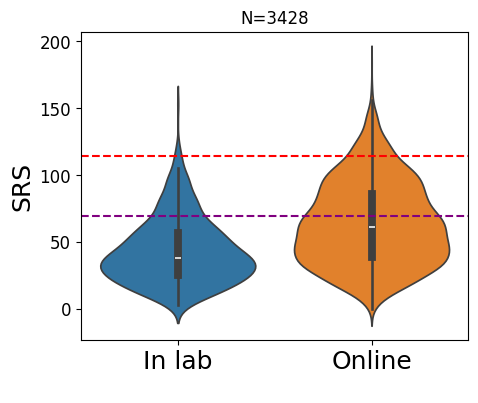

In [ ]:
#plot distributions for the two groups
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_merged_nodupl, x="format", y="SRS", hue="format",ax=ax)
plt.axhline(y=69, color='purple', linestyle='--')
plt.axhline(y=114, color='red', linestyle='--')
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('SRS',fontsize=18)
ax.set_xlabel(' ')
ax.set_title('N=' + str(len(data_merged_nodupl)))

In [ ]:
#run t-test for independent samples, assuming unequal variance
sample1 = data_merged_nodupl[data_merged_nodupl['format']=='In lab']['SRS']
sample2 = data_merged_nodupl[data_merged_nodupl['format']=='Online']['SRS']
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -17.738258771220284
df (Welch's t-test): 1028.1298097010815
P-value (unequal variances): 1.2614817803162306e-61
Effect size Cohen's d (unequal variances): -0.684695478844107
In lab N = 588
Online N = 2840
ConfidenceInterval(low=-22.94966010016359, high=-18.37785259505535)


After careless exclusions

Text(0.5, 1.0, 'After careless exclusions, N=2826')

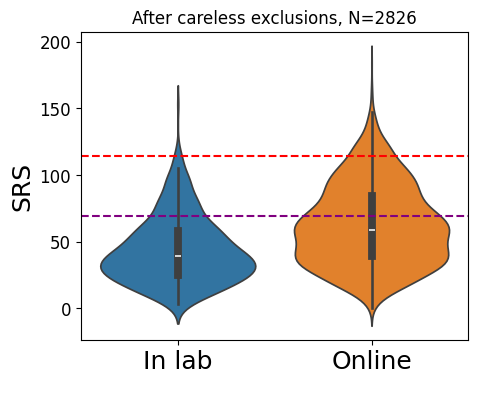

In [ ]:
#plot distributions for the two groups
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_merged_nodupl_excl, x="format", y="SRS", hue="format",ax=ax)
plt.axhline(y=69, color='purple', linestyle='--')
plt.axhline(y=114, color='red', linestyle='--')
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('SRS',fontsize=18)
ax.set_xlabel(' ')
ax.set_title('After careless exclusions, N=' + str(len(data_merged_nodupl_excl)))

In [ ]:
#run t-test for independent samples, assuming unequal variance
sample1 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='In lab']['SRS']
sample2 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='Online']['SRS']
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -14.72933246872359
df (Welch's t-test): 844.285222795297
P-value (unequal variances): 7.120505089888031e-44
Effect size Cohen's d (unequal variances): -0.6367246549283859
In lab N = 494
Online N = 2332
ConfidenceInterval(low=-21.289352387298532, high=-16.282643640506823)


Check for differences in careless exclusion, gender, age, STAI_trait, BDI, LSAS

In [ ]:
sample1 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='In lab']['age'].dropna()
sample2 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='Online']['age'].dropna()
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -4.307999464377649
df (Welch's t-test): 722.141118432351
P-value (unequal variances): 1.8754854612596863e-05
Effect size Cohen's d (unequal variances): -0.21189740987465225
In lab N = 492
Online N = 2313
ConfidenceInterval(low=-3.7098118248119514, high=-1.387053190530806)


In [ ]:
sample1 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='In lab']['STAI_trait'].dropna()
sample2 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='Online']['STAI_trait'].dropna()
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -5.509630256093684
df (Welch's t-test): 723.1110982812479
P-value (unequal variances): 5.0028997282489346e-08
Effect size Cohen's d (unequal variances): -0.26755652913186345
In lab N = 479
Online N = 2252
ConfidenceInterval(low=-4.5194029883799285, high=-2.144758211870732)


In [ ]:
sample1 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='In lab']['LSAS'].dropna()
sample2 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='Online']['LSAS'].dropna()
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -13.75608129455258
df (Welch's t-test): 753.505182763219
P-value (unequal variances): 1.4138317393067778e-38
Effect size Cohen's d (unequal variances): -0.6658609438775239
In lab N = 469
Online N = 2013
ConfidenceInterval(low=-22.29868656680473, high=-16.729072233403304)


In [ ]:
sample1 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='In lab']['BDI'].dropna()
sample2 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='Online']['BDI'].dropna()
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -8.295876211578902
df (Welch's t-test): 810.4183203565566
P-value (unequal variances): 4.476251020935409e-16
Effect size Cohen's d (unequal variances): -0.3674948972263856
In lab N = 479
Online N = 2252
ConfidenceInterval(low=-5.210672316835732, high=-3.2166703931469507)


In [ ]:
contingency_table = pd.crosstab(data_merged_nodupl_excl['format'], data_merged_nodupl_excl['Gender_recode'])
contingency_table

Gender_recode,M,NB,W
format,,,
In lab,146,15,266
Online,1037,38,1246


In [ ]:
df

,Format,Gender,Count
0,Online,M,1037
1,Online,W,1246
2,Online,NB,38
3,In lab,M,146
4,In lab,W,266
5,In lab,NB,15


In [ ]:
#chi-square test for gender by format
contingency_table = pd.crosstab(data_merged_nodupl_excl['format'], data_merged_nodupl_excl['Gender_recode'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(contingency_table)
print(f"Chi-Square statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

Gender_recode     M  NB     W
format                       
In lab          146  15   266
Online         1037  38  1246
Chi-Square statistic: 20.652593701986667
P-value: 3.2760178476509896e-05
Degrees of freedom: 2
Expected frequencies:
[[ 183.8213246     8.23544396  234.94323144]
 [ 999.1786754    44.76455604 1277.05676856]]


In [ ]:
data_merged_nodupl_excl['year_group']

,year_group
1,2022
2,2022
3,<2020
4,2022
5,2020
...,...
3420,2024
3422,2024
3423,2024
3424,2024


In [ ]:
#chi-square test for year by format
data_merged_nodupl_excl.loc[data_merged_nodupl_excl['year'] < 2020, ['year_group']] = '<2020'
data_merged_nodupl_excl.loc[(data_merged_nodupl_excl['year'] == 2020) | (data_merged_nodupl_excl['year_group'] == 2021), ['year_group']] = '2020-2021'
data_merged_nodupl_excl.loc[data_merged_nodupl_excl['year'] > 2021, ['year_group']] = '>2021'
contingency_table = pd.crosstab(data_merged_nodupl_excl['format'], data_merged_nodupl_excl['year_group'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(contingency_table)
print(f"Chi-Square statistic: {chi2}")
print(f"P-value: {p}")
print(f"Degrees of freedom: {dof}")
print("Expected frequencies:")
print(expected)

year_group  2020-2021  <2020  >2021
format                             
In lab            227     17    250
Online           1497      0    835
Chi-Square statistic: 125.74859345911729
P-value: 4.943560765477926e-28
Degrees of freedom: 2
Expected frequencies:
[[ 301.36447275    2.97169144  189.66383581]
 [1422.63552725   14.02830856  895.33616419]]


### 2) Does that effect hold when only including online participants with no ASD diagnosis/not identifying with being on the spectrum?

In [ ]:
data_Prolific_ASDq1 = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Prolific_ASDq_OLEL_and_SLBdiscovery.csv')
data_Prolific_ASDq1.head()

,Source,Prolific_ID,ASD_status
0,OLEL_Prolific_v5,55895042fdf99b5ccd435e79,No
1,OLEL_Prolific_v5,559fa17cfdf99b69c369d364,No
2,OLEL_Prolific_v5,5658000ca9872d0011e1ba26,No
3,OLEL_Prolific_v5,567dd32b4f0ef30006dbb718,No
4,OLEL_Prolific_v5,569b36e3af9ad70006640dd9,No


In [ ]:
data_Prolific_ASDq2 = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Prolific_ASDq_webgazer.csv')
data_Prolific_ASDq2.head()

,Source,Prolific_ID,ASD_status
0,WG_Task3,55c333b0fdf99b1dbd2131bd,Yes - as an adult
1,WG_Task3,56cb8858edf8da000b6df354,No
2,WG_Task3,57dd3b0e91b7fc0001493db9,No
3,WG_Task3,58c62eac444ade00010231a9,No
4,WG_Task3,59646f5198cf77000106feb1,No


In [ ]:
data_Prolific_ASDq = pd.concat([data_Prolific_ASDq1, data_Prolific_ASDq2])
data_Prolific_ASDq

,Source,Prolific_ID,ASD_status
0,OLEL_Prolific_v5,55895042fdf99b5ccd435e79,No
1,OLEL_Prolific_v5,559fa17cfdf99b69c369d364,No
2,OLEL_Prolific_v5,5658000ca9872d0011e1ba26,No
3,OLEL_Prolific_v5,567dd32b4f0ef30006dbb718,No
4,OLEL_Prolific_v5,569b36e3af9ad70006640dd9,No
...,...,...,...
532,WG_Task4,65a83f5909f0706ac5f33dc0,No
533,WG_Task4,65a99e97a6a64526a0d9873b,No
534,WG_Task4,65aa80f84d7d702f526464ce,Yes - as an adult
535,WG_Task4,65ad2b782c561233fe22d8c4,Yes - as a child


In [ ]:
incl_list = data_Prolific_ASDq.loc[data_Prolific_ASDq['ASD_status'] == 'No', 'Prolific_ID'].to_list()
incl_list[0:10]

['55895042fdf99b5ccd435e79',
 '559fa17cfdf99b69c369d364',
 '5658000ca9872d0011e1ba26',
 '567dd32b4f0ef30006dbb718',
 '569b36e3af9ad70006640dd9',
 '56db4c217dcddf000bd5853c',
 '56e32190e414dc000c8b40ae',
 '5720a9f6fd3a5200113c1891',
 '57901207c9abeb0001af353e',
 '57ac9e210493620001d3a277']

In [ ]:
data_no_asd = data_merged_nodupl[
    (data_merged_nodupl['ParticipantID'].isin(incl_list)) |
    (data_merged_nodupl['format'] == 'In lab')
]
data_no_asd

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_ordinal,Gender_recode,Education_recode,Education_num
0,Conte,CP0002,CC0046,QT001,NaN,NaN,NaN,NaN,37.0,41.0,...,0.0,3.0,1.0,0.0,0.0,1.0,738329,NaN,NaN,NaN
5,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,1.0,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN
13,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,1.0,0.0,1.0,1.0,1.0,1.0,738260,M,Some College,2.0
14,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,1.0,0.0,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0
21,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3846,WG_Task4,64e7533f36d388e8b31d3309,NaN,64e7533f36d388e8b31d3309,NaN,f,NaN,NaN,23.0,53.0,...,0.0,2.0,0.0,0.0,0.0,2.0,738913,W,NaN,NaN
3855,WG_Task4,60faab6f9d9a835ba3b8327f,NaN,60faab6f9d9a835ba3b8327f,NaN,NaN,NaN,NaN,NaN,79.0,...,0.0,0.0,0.0,0.0,3.0,1.0,738834,NaN,NaN,NaN
3862,WG_Task4,6557ecc93cc84dd3699e608c,NaN,6557ecc93cc84dd3699e608c,NaN,NaN,NaN,NaN,NaN,65.0,...,0.0,0.0,1.0,3.0,1.0,0.0,738913,NaN,NaN,NaN
3868,WG_Task4,65498af02717744d9946615d,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,2.0,1.0,2.0,2.0,1.0,738914,NaN,NaN,NaN


Text(0.5, 1.0, 'Confirmed No ASD only, N=1598')

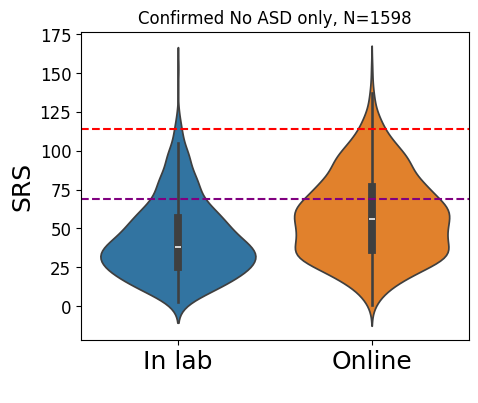

In [ ]:
#re-plot distributions for the two groups
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_no_asd, x="format", y="SRS", hue="format",ax=ax)
plt.axhline(y=69, color='purple', linestyle='--')
plt.axhline(y=114, color='red', linestyle='--')
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('SRS',fontsize=18)
ax.set_xlabel(' ')
ax.set_title('Confirmed No ASD only, N=' + str(len(data_no_asd)))

In [ ]:
#re-run t-test for independent samples, assuming unequal variance
sample1 = data_no_asd[data_no_asd['format']=='In lab']['SRS']
sample2 = data_no_asd[data_no_asd['format']=='Online']['SRS']
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -11.23728277970608
df (Welch's t-test): 1330.9848041912737
P-value (unequal variances): 4.686400472025352e-28
Effect size Cohen's d (unequal variances): -0.5673061346513597
In lab N = 588
Online N = 1010
ConfidenceInterval(low=-17.402680094940134, high=-12.229622727178825)


After careless exclusions:

In [ ]:
data_no_asd_excl = data_merged_nodupl_excl[
    (data_merged_nodupl_excl['ParticipantID'].isin(incl_list)) |
    (data_merged_nodupl_excl['format'] == 'In lab')
]
data_no_asd_excl

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_ordinal,Gender_recode,Education_recode,Education_num,Exclude
1,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN,0
2,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,0.0,1.0,1.0,1.0,1.0,738260,M,Some College,2.0,0
3,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,0.0,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0,0
4,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN,0
5,CPC,CP0009,CP0009,QT028,M,NaN,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,0.0,0.0,0.0,737440,NaN,Some College,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3411,WG_Task4,6166d663ad32ab706018e2e3,NaN,6166d663ad32ab706018e2e3,NaN,m,NaN,NaN,23.0,69.0,...,1.0,1.0,0.0,1.0,2.0,738914,M,NaN,NaN,0
3412,WG_Task4,64e7533f36d388e8b31d3309,NaN,64e7533f36d388e8b31d3309,NaN,f,NaN,NaN,23.0,53.0,...,2.0,0.0,0.0,0.0,2.0,738913,W,NaN,NaN,0
3416,WG_Task4,60faab6f9d9a835ba3b8327f,NaN,60faab6f9d9a835ba3b8327f,NaN,NaN,NaN,NaN,NaN,79.0,...,0.0,0.0,0.0,3.0,1.0,738834,NaN,NaN,NaN,0
3420,WG_Task4,6557ecc93cc84dd3699e608c,NaN,6557ecc93cc84dd3699e608c,NaN,NaN,NaN,NaN,NaN,65.0,...,0.0,1.0,3.0,1.0,0.0,738913,NaN,NaN,NaN,0


Text(0.5, 1.0, 'Confirmed No ASD only + careless exclusions, N=1372')

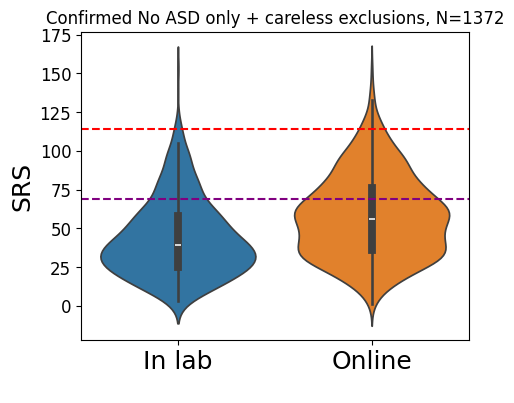

In [ ]:
#re-plot distributions for the two groups
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_no_asd_excl, x="format", y="SRS", hue="format",ax=ax)
plt.axhline(y=69, color='purple', linestyle='--')
plt.axhline(y=114, color='red', linestyle='--')
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('SRS',fontsize=18)
ax.set_xlabel(' ')
ax.set_title('Confirmed No ASD only + careless exclusions, N=' + str(len(data_no_asd_excl)))

In [ ]:
#re-run t-test for independent samples, assuming unequal variance
sample1 = data_no_asd_excl[data_no_asd_excl['format']=='In lab']['SRS']
sample2 = data_no_asd_excl[data_no_asd_excl['format']=='Online']['SRS']
ttest_result = ttest_ind(sample1, sample2, equal_var=False)
d, dfu = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {ttest_result.statistic}")
print(f"df (Welch's t-test): {ttest_result.df}")
print(f"P-value (unequal variances): {ttest_result.pvalue}")
print(f"Effect size Cohen's d (unequal variances): {d}")
print('In lab N =', sample1.count())
print('Online N =', sample2.count())
print(ttest_result.confidence_interval(confidence_level=0.95))

T-statistic (unequal variances): -9.8525626337336
df (Welch's t-test): 1093.4708182865
P-value (unequal variances): 5.333241192524161e-22
Effect size Cohen's d (unequal variances): -0.5415355412706737
In lab N = 494
Online N = 878
ConfidenceInterval(low=-16.895777655805233, high=-11.283817117003778)


### 3) Is the SRS difference between in-lab and online participants driven by specific SRS subscales, items, or factors?

In [ ]:
data_merged_nodupl_excl = data_merged_nodupl_excl.rename(columns = {'SRS_1_1': 'SRS_1', 'SRS_1_2': 'SRS_2', 'SRS_1_3': 'SRS_3', 'SRS_1_4': 'SRS_4', 'SRS_1_5': 'SRS_5', 'SRS_1_6': 'SRS_6', 'SRS_1_7': 'SRS_7',
                              'SRS_1_8': 'SRS_8', 'SRS_1_9': 'SRS_9', 'SRS_1_10': 'SRS_10', 'SRS_2_1': 'SRS_11', 'SRS_2_2': 'SRS_12', 'SRS_2_3': 'SRS_13', 'SRS_2_4': 'SRS_14',
                              'SRS_2_5': 'SRS_15', 'SRS_2_6': 'SRS_16', 'SRS_2_7': 'SRS_17', 'SRS_2_8': 'SRS_18', 'SRS_2_9': 'SRS_19',  'SRS_2_10': 'SRS_20', 'SRS_3_1': 'SRS_21',
                              'SRS_3_2': 'SRS_22', 'SRS_3_3': 'SRS_23', 'SRS_3_4': 'SRS_24', 'SRS_3_5': 'SRS_25', 'SRS_3_6': 'SRS_26', 'SRS_3_7': 'SRS_27', 'SRS_3_8': 'SRS_28',
                              'SRS_3_9': 'SRS_29', 'SRS_3_10': 'SRS_30', 'SRS_4_1': 'SRS_31', 'SRS_4_2': 'SRS_32', 'SRS_4_3': 'SRS_33', 'SRS_4_4': 'SRS_34', 'SRS_4_5': 'SRS_35',
                              'SRS_4_6': 'SRS_36', 'SRS_4_7': 'SRS_37', 'SRS_4_8': 'SRS_38', 'SRS_4_9': 'SRS_39', 'SRS_4_10': 'SRS_40', 'SRS_5_1': 'SRS_41', 'SRS_5_2': 'SRS_42',
                              'SRS_5_3': 'SRS_43', 'SRS_5_4': 'SRS_44', 'SRS_5_5': 'SRS_45', 'SRS_5_6': 'SRS_46', 'SRS_5_7': 'SRS_47', 'SRS_5_8': 'SRS_48', 'SRS_5_9': 'SRS_49',
                              'SRS_5_10': 'SRS_50', 'SRS_6_1': 'SRS_51', 'SRS_6_2': 'SRS_52', 'SRS_6_3': 'SRS_53', 'SRS_6_4': 'SRS_54', 'SRS_6_5': 'SRS_55', 'SRS_6_6': 'SRS_56',
                              'SRS_6_7': 'SRS_57', 'SRS_6_8': 'SRS_58', 'SRS_6_9': 'SRS_59', 'SRS_6_10': 'SRS_60', 'SRS_7_1': 'SRS_61', 'SRS_7_2': 'SRS_62', 'SRS_7_3': 'SRS_63',
                              'SRS_7_4': 'SRS_64', 'SRS_7_5': 'SRS_65'})
data_merged_nodupl_excl.head()

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_61,SRS_62,SRS_63,SRS_64,SRS_65,date_ordinal,Gender_recode,Education_recode,Education_num,Exclude
1,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN,0
2,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,0.0,1.0,1.0,1.0,1.0,738260,M,Some College,2.0,0
3,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,0.0,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0,0
4,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN,0
5,CPC,CP0009,CP0009,QT028,M,NaN,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,0.0,0.0,0.0,737440,NaN,Some College,2.0,0


Next, create a data frame that summarizes, for each SRS item, the mean for online participants, the mean for in-lab participants, and the statistics of the in-lab vs online differences (t-test, cohen's d)

In [ ]:
item_names = []
mean_item_online = []
mean_item_inlab = []
t_stat_all = []
df_all = []
p_value_all = []
d_all = []
d_rev_all = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  sample1 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='Online'][col_name].dropna()
  sample2 = data_merged_nodupl_excl[data_merged_nodupl_excl['format']=='In lab'][col_name].dropna()
  t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
  d, df = cohen_d(sample1, sample2)

  item_names.append(col_name)
  mean_item_inlab.append(np.mean(sample1))
  mean_item_online.append(np.mean(sample2))
  t_stat_all.append(t_stat)
  df_all.append(df)
  p_value_all.append(p_value)
  d_all.append(d)
  if col_name in reverse_coded_fields:
    d_rev_all.append(-d)
  else:
    d_rev_all.append(d)

df_item_diff = pd.DataFrame(data = {'SRS_item': item_names, 'In lab mean': mean_item_inlab, 'Online mean': mean_item_online, 'T': t_stat_all, 'df': df_all, 'p': p_value_all, 'Cohens_d': d_all, 'Cohens_d_rev': d_rev_all})
df_item_diff.head()

,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev
0,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111
1,SRS_2,1.004288,0.704453,7.459612,778.243282,2.321271e-13,0.343250,0.343250
2,SRS_3,1.360635,1.670040,-6.890764,723.817134,1.207827e-11,-0.338249,0.338249
3,SRS_4,0.871355,0.574899,7.123014,780.656322,2.401166e-12,0.326926,0.326926
4,SRS_5,0.716981,0.599190,3.049870,760.162620,2.368904e-03,0.143159,0.143159


Merge with SRS item description for more info

In [ ]:
SRS_item_description = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/SRS_item_description.csv')
SRS_item_description['Factor_OLpaper'] = SRS_item_description['Factor_OLpaper'].astype('Int64')
SRS_item_description['Factor_simplified'] = SRS_item_description['Factor_simplified'].astype('Int64')
SRS_item_description.head()

,index,SRS_item,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper
0,1,SRS_1,I am much more uncomfortable in social situati...,mot,no,2,2
1,2,SRS_2,My facial expressions send the wrong message t...,awr,no,1,1
2,3,SRS_3,I feel self-confident when interacting with ot...,mot,yes,4,4
3,4,SRS_4,"When under stress, I engage in rigid or inflex...",rrb,no,1,1
4,5,SRS_5,I do not recognize when others are trying to t...,cog,no,1,1


In [ ]:
df_item_diff = pd.merge(df_item_diff, SRS_item_description, on='SRS_item', how='left')
df_item_diff = df_item_diff.drop(columns=['index'])
df_item_diff.head()

,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper
0,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111,I am much more uncomfortable in social situati...,mot,no,2,2
1,SRS_2,1.004288,0.704453,7.459612,778.243282,2.321271e-13,0.343250,0.343250,My facial expressions send the wrong message t...,awr,no,1,1
2,SRS_3,1.360635,1.670040,-6.890764,723.817134,1.207827e-11,-0.338249,0.338249,I feel self-confident when interacting with ot...,mot,yes,4,4
3,SRS_4,0.871355,0.574899,7.123014,780.656322,2.401166e-12,0.326926,0.326926,"When under stress, I engage in rigid or inflex...",rrb,no,1,1
4,SRS_5,0.716981,0.599190,3.049870,760.162620,2.368904e-03,0.143159,0.143159,I do not recognize when others are trying to t...,cog,no,1,1


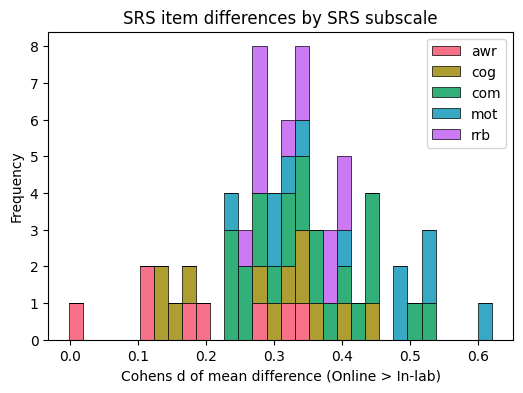

In [ ]:
#plot cohen's d of mean difference colored by subscale
fig, ax = plt.subplots(figsize=(6, 4))
subscales = np.sort(df_item_diff['subscale'].unique())
colors = sns.color_palette("husl", n_colors=len(subscales))
hist_data = [df_item_diff[df_item_diff['subscale'] == subscale]['Cohens_d_rev'] for subscale in subscales]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=subscales, color=colors,edgecolor='black', linewidth=0.5)
#plt.hist(df_item_diff['Cohens_d_rev'], bins=30, edgecolor='black')
#plt.axvline(x=0.52, color='r', linestyle='--', linewidth=1)
plt.xlabel('Cohens d of mean difference (Online > In-lab)')
plt.ylabel('Frequency')
plt.title('SRS item differences by SRS subscale')
plt.legend()
plt.show()

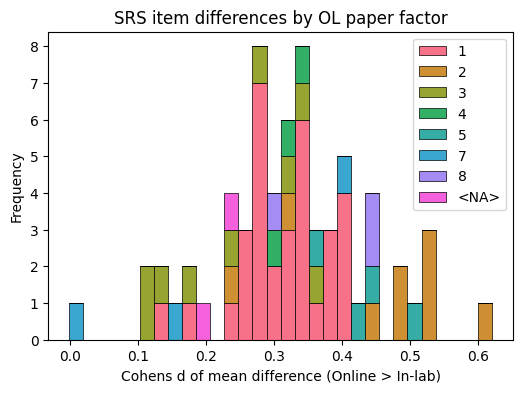

In [ ]:
#plot cohen's d of mean difference colored by OL-SRS study factor
fig, ax = plt.subplots(figsize=(6, 4))
df_item_diff['Factor_OLpaper'] = df_item_diff['Factor_OLpaper'].astype(str)
factors = np.sort(df_item_diff['Factor_OLpaper'].unique())
colors = sns.color_palette("husl", n_colors=len(factors))
hist_data = [df_item_diff[df_item_diff['Factor_OLpaper'] == f]['Cohens_d_rev'] for f in factors]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=factors, color=colors,edgecolor='black', linewidth=0.5)
#plt.hist(df_item_diff['Cohens_d_rev'], bins=30, edgecolor='black')
#plt.axvline(x=0.52, color='r', linestyle='--', linewidth=1)
plt.xlabel('Cohens d of mean difference (Online > In-lab)')
plt.ylabel('Frequency')
plt.title('SRS item differences by OL paper factor')
plt.legend()
plt.show()

Sort the data frame so that the items with the largest differences appear first

In [ ]:
#perform FDR correction
df_item_diff = df_item_diff.sort_values(by='p', ascending=True).reset_index(drop=True)
for n in range(1,66):
  df_item_diff.loc[n-1,'pFDR'] = 0.05 * n / 65
  df_item_diff.loc[n-1,'isSigFDR'] = df_item_diff.loc[n-1,'p'] <= df_item_diff.loc[n-1,'pFDR']
df_item_diff

,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR
0,SRS_64,1.610206,0.967611,13.360615,770.493008,9.018726e-37,0.619941,0.619941,I am much more tense in social settings than w...,mot,no,2,2,0.000769,True
1,SRS_33,0.924957,0.463563,12.544607,938.073132,1.752971e-33,0.506145,0.506145,"My behavior is socially awkward, even when I a...",com,no,<NA>,5,0.001538,True
2,SRS_57,1.382504,0.852227,11.705473,803.134500,2.473263e-29,0.525186,0.525186,I tend to isolate myself.,com,no,2,2,0.002308,True
3,SRS_6,1.581475,1.099190,11.481433,775.505910,2.727448e-28,0.529858,0.529858,I would rather be alone than with others.,mot,no,2,2,0.003077,True
4,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111,I am much more uncomfortable in social situati...,mot,no,2,2,0.003846,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,SRS_5,0.716981,0.599190,3.049870,760.162620,2.368904e-03,0.143159,0.143159,I do not recognize when others are trying to t...,cog,no,1,1,0.046923,True
61,SRS_48,2.315180,2.417004,-2.834502,745.357428,4.713899e-03,-0.135385,0.135385,I have a good sense of humor and can understan...,cog,yes,3,3,0.047692,True
62,SRS_7,1.861063,1.955466,-2.269452,682.143037,2.355223e-02,-0.118441,0.118441,I am usually aware of how others are feeling.,awr,yes,3,3,0.048462,True
63,SRS_45,1.632933,1.716599,-2.034778,684.104984,4.225834e-02,-0.105857,0.105857,When others around me are paying attention to ...,awr,yes,3,3,0.049231,True


In [ ]:
#save data
df_item_diff.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/item_online_inlab_diff_data.csv')

In [ ]:
#also show the largest differences for comparison
df_item_diff.sort_values(by='Cohens_d_rev', ascending=False, inplace=True)
df_item_diff.head(8)

,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR
0,SRS_64,1.610206,0.967611,13.360615,770.493008,9.018726e-37,0.619941,0.619941,I am much more tense in social settings than w...,mot,no,2,2,0.000769,True
3,SRS_6,1.581475,1.099190,11.481433,775.505910,2.727448e-28,0.529858,0.529858,I would rather be alone than with others.,mot,no,2,2,0.003077,True
2,SRS_57,1.382504,0.852227,11.705473,803.134500,2.473263e-29,0.525186,0.525186,I tend to isolate myself.,com,no,2,2,0.002308,True
4,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111,I am much more uncomfortable in social situati...,mot,no,2,2,0.003846,True
1,SRS_33,0.924957,0.463563,12.544607,938.073132,1.752971e-33,0.506145,0.506145,"My behavior is socially awkward, even when I a...",com,no,<NA>,5,0.001538,True
8,SRS_23,1.494854,0.995951,10.499413,760.004469,3.572427e-24,0.492923,0.492923,I do not join group activities or social event...,mot,no,2,2,0.006923,True
5,SRS_27,1.269726,0.809717,11.003174,842.518779,2.096201e-26,0.476360,0.476360,I avoid starting social interactions with othe...,mot,no,2,2,0.004615,True
12,SRS_59,1.118782,0.684211,9.613735,765.183720,9.818351e-21,0.448711,0.448711,I am more suspicious than most people.,cog,no,8,8,0.010000,True


In [ ]:
#also show the smallest differences for comparison
df_item_diff.sort_values(by='Cohens_d_rev', ascending=True, inplace=True)
df_item_diff.head(10)

,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR
64,SRS_25,1.460549,1.461538,-0.021170,688.225089,9.831165e-01,-0.001094,-0.001094,"I do not mind being out of step with or ""not o...",awr,no,7,7,0.050000,False
63,SRS_45,1.632933,1.716599,-2.034778,684.104984,4.225834e-02,-0.105857,0.105857,When others around me are paying attention to ...,awr,yes,3,3,0.049231,True
62,SRS_7,1.861063,1.955466,-2.269452,682.143037,2.355223e-02,-0.118441,0.118441,I am usually aware of how others are feeling.,awr,yes,3,3,0.048462,True
61,SRS_48,2.315180,2.417004,-2.834502,745.357428,4.713899e-03,-0.135385,0.135385,I have a good sense of humor and can understan...,cog,yes,3,3,0.047692,True
60,SRS_5,0.716981,0.599190,3.049870,760.162620,2.368904e-03,0.143159,0.143159,I do not recognize when others are trying to t...,cog,no,1,1,0.046923,True
59,SRS_40,1.919383,2.064777,-3.243752,730.255317,1.233349e-03,-0.157888,0.157888,I am imaginative.,cog,yes,7,7,0.046154,True
58,SRS_17,2.259434,2.384615,-3.810736,755.697609,1.498218e-04,-0.179794,0.179794,I recognize when something is unfair.,cog,yes,3,3,0.045385,True
57,SRS_52,0.835763,0.659919,4.042542,782.987757,5.809885e-05,0.185088,0.185088,I get overly loud without realizing it.,awr,no,1,1,0.044615,True
56,SRS_32,2.360635,2.516194,-4.454958,798.501802,9.588127e-06,-0.200787,0.200787,I have good personal hygiene.,awr,yes,<NA>,<NA>,0.043846,True
53,SRS_36,0.887221,0.661943,5.156464,797.051350,3.177202e-07,0.232737,0.232737,I have difficulty relating to family members.,com,no,<NA>,<NA>,0.041538,True


#### Repeat the analysis above separately for pre- vs post-2022

In [ ]:
data_merged_nodupl_excl['year'] = data_merged_nodupl_excl['date'].dt.year
data_merged_nodupl_excl.head()

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_62,SRS_63,SRS_64,SRS_65,date_ordinal,Gender_recode,Education_recode,Education_num,Exclude,year
1,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN,0,2022
2,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,1.0,1.0,1.0,1.0,738260,M,Some College,2.0,0,2022
3,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0,0,2019
4,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN,0,2022
5,CPC,CP0009,CP0009,QT028,M,NaN,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,0.0,0.0,737440,NaN,Some College,2.0,0,2020


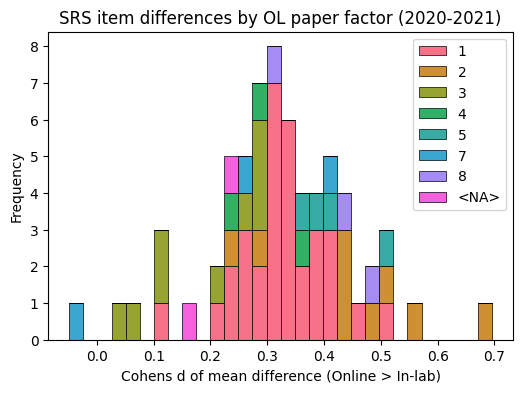

In [ ]:
#2020-2021
item_names = []
mean_item_online = []
mean_item_inlab = []
t_stat_all = []
df_all = []
p_value_all = []
d_all = []
d_rev_all = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  sample1 = data_merged_nodupl_excl[(data_merged_nodupl_excl['format']=='Online') & (data_merged_nodupl_excl['year'] >= 2020) & (data_merged_nodupl_excl['year'] <= 2021)][col_name].dropna()
  sample2 = data_merged_nodupl_excl[(data_merged_nodupl_excl['format']=='In lab') & (data_merged_nodupl_excl['year'] >= 2020) & (data_merged_nodupl_excl['year'] <= 2021)][col_name].dropna()
  t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
  d, df = cohen_d(sample1, sample2)

  item_names.append(col_name)
  mean_item_inlab.append(np.mean(sample1))
  mean_item_online.append(np.mean(sample2))
  t_stat_all.append(t_stat)
  df_all.append(df)
  p_value_all.append(p_value)
  d_all.append(d)
  if col_name in reverse_coded_fields:
    d_rev_all.append(-d)
  else:
    d_rev_all.append(d)

df_item_diff_20_21 = pd.DataFrame(data = {'SRS_item': item_names, 'In lab mean': mean_item_inlab, 'Online mean': mean_item_online, 'T': t_stat_all, 'df': df_all, 'p': p_value_all, 'Cohens_d': d_all, 'Cohens_d_rev': d_rev_all})

#merge with SRS item descriptions
df_item_diff_20_21 = pd.merge(df_item_diff_20_21, SRS_item_description, on='SRS_item', how='left')
df_item_diff_20_21 = df_item_diff_20_21.drop(columns=['index'])
df_item_diff_20_21.head()

#plot cohen's d of mean difference colored by OL-SRS study factor
fig, ax = plt.subplots(figsize=(6, 4))
df_item_diff_20_21['Factor_OLpaper'] = df_item_diff_20_21['Factor_OLpaper'].astype(str)
factors = np.sort(df_item_diff_20_21['Factor_OLpaper'].unique())
colors = sns.color_palette("husl", n_colors=len(factors))
hist_data = [df_item_diff_20_21[df_item_diff_20_21['Factor_OLpaper'] == f]['Cohens_d_rev'] for f in factors]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=factors, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('Cohens d of mean difference (Online > In-lab)')
plt.ylabel('Frequency')
plt.title('SRS item differences by OL paper factor (2020-2021)')
plt.legend()
plt.show()

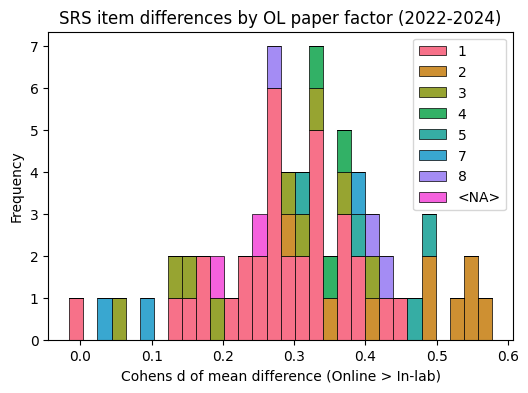

In [ ]:
#2022-2024
item_names = []
mean_item_online = []
mean_item_inlab = []
t_stat_all = []
df_all = []
p_value_all = []
d_all = []
d_rev_all = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  sample1 = data_merged_nodupl_excl[(data_merged_nodupl_excl['format']=='Online') & (data_merged_nodupl_excl['year'] >= 2022)][col_name].dropna()
  sample2 = data_merged_nodupl_excl[(data_merged_nodupl_excl['format']=='In lab') & (data_merged_nodupl_excl['year'] >= 2022)][col_name].dropna()
  t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
  d, df = cohen_d(sample1, sample2)

  item_names.append(col_name)
  mean_item_inlab.append(np.mean(sample1))
  mean_item_online.append(np.mean(sample2))
  t_stat_all.append(t_stat)
  df_all.append(df)
  p_value_all.append(p_value)
  d_all.append(d)
  if col_name in reverse_coded_fields:
    d_rev_all.append(-d)
  else:
    d_rev_all.append(d)

df_item_diff_22_24 = pd.DataFrame(data = {'SRS_item': item_names, 'In lab mean': mean_item_inlab, 'Online mean': mean_item_online, 'T': t_stat_all, 'df': df_all, 'p': p_value_all, 'Cohens_d': d_all, 'Cohens_d_rev': d_rev_all})

#merge with SRS item descriptions
df_item_diff_22_24 = pd.merge(df_item_diff_22_24, SRS_item_description, on='SRS_item', how='left')
df_item_diff_22_24 = df_item_diff_22_24.drop(columns=['index'])
df_item_diff_22_24.head()

#plot cohen's d of mean difference colored by OL-SRS study factor
fig, ax = plt.subplots(figsize=(6, 4))
df_item_diff_22_24['Factor_OLpaper'] = df_item_diff_22_24['Factor_OLpaper'].astype(str)
factors = np.sort(df_item_diff_22_24['Factor_OLpaper'].unique())
colors = sns.color_palette("husl", n_colors=len(factors))
hist_data = [df_item_diff_22_24[df_item_diff_22_24['Factor_OLpaper'] == f]['Cohens_d_rev'] for f in factors]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=factors, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('Cohens d of mean difference (Online > In-lab)')
plt.ylabel('Frequency')
plt.title('SRS item differences by OL paper factor (2022-2024)')
plt.legend()
plt.show()

#### Repeat the analysis above after including online confirmed NON-ASD participants in the online sample

In [ ]:
data_no_asd_excl = data_no_asd_excl.rename(columns = {'SRS_1_1': 'SRS_1', 'SRS_1_2': 'SRS_2', 'SRS_1_3': 'SRS_3', 'SRS_1_4': 'SRS_4', 'SRS_1_5': 'SRS_5', 'SRS_1_6': 'SRS_6', 'SRS_1_7': 'SRS_7',
                              'SRS_1_8': 'SRS_8', 'SRS_1_9': 'SRS_9', 'SRS_1_10': 'SRS_10', 'SRS_2_1': 'SRS_11', 'SRS_2_2': 'SRS_12', 'SRS_2_3': 'SRS_13', 'SRS_2_4': 'SRS_14',
                              'SRS_2_5': 'SRS_15', 'SRS_2_6': 'SRS_16', 'SRS_2_7': 'SRS_17', 'SRS_2_8': 'SRS_18', 'SRS_2_9': 'SRS_19',  'SRS_2_10': 'SRS_20', 'SRS_3_1': 'SRS_21',
                              'SRS_3_2': 'SRS_22', 'SRS_3_3': 'SRS_23', 'SRS_3_4': 'SRS_24', 'SRS_3_5': 'SRS_25', 'SRS_3_6': 'SRS_26', 'SRS_3_7': 'SRS_27', 'SRS_3_8': 'SRS_28',
                              'SRS_3_9': 'SRS_29', 'SRS_3_10': 'SRS_30', 'SRS_4_1': 'SRS_31', 'SRS_4_2': 'SRS_32', 'SRS_4_3': 'SRS_33', 'SRS_4_4': 'SRS_34', 'SRS_4_5': 'SRS_35',
                              'SRS_4_6': 'SRS_36', 'SRS_4_7': 'SRS_37', 'SRS_4_8': 'SRS_38', 'SRS_4_9': 'SRS_39', 'SRS_4_10': 'SRS_40', 'SRS_5_1': 'SRS_41', 'SRS_5_2': 'SRS_42',
                              'SRS_5_3': 'SRS_43', 'SRS_5_4': 'SRS_44', 'SRS_5_5': 'SRS_45', 'SRS_5_6': 'SRS_46', 'SRS_5_7': 'SRS_47', 'SRS_5_8': 'SRS_48', 'SRS_5_9': 'SRS_49',
                              'SRS_5_10': 'SRS_50', 'SRS_6_1': 'SRS_51', 'SRS_6_2': 'SRS_52', 'SRS_6_3': 'SRS_53', 'SRS_6_4': 'SRS_54', 'SRS_6_5': 'SRS_55', 'SRS_6_6': 'SRS_56',
                              'SRS_6_7': 'SRS_57', 'SRS_6_8': 'SRS_58', 'SRS_6_9': 'SRS_59', 'SRS_6_10': 'SRS_60', 'SRS_7_1': 'SRS_61', 'SRS_7_2': 'SRS_62', 'SRS_7_3': 'SRS_63',
                              'SRS_7_4': 'SRS_64', 'SRS_7_5': 'SRS_65'})
data_no_asd_excl.head()

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_61,SRS_62,SRS_63,SRS_64,SRS_65,date_ordinal,Gender_recode,Education_recode,Education_num,Exclude
1,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,1.0,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN,0
2,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,0.0,1.0,1.0,1.0,1.0,738260,M,Some College,2.0,0
3,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,0.0,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0,0
4,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN,0
5,CPC,CP0009,CP0009,QT028,M,NaN,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,0.0,0.0,0.0,737440,NaN,Some College,2.0,0


In [ ]:
item_names = []
mean_item_online = []
mean_item_inlab = []
t_stat_all = []
df_all = []
p_value_all = []
d_all = []
d_rev_all = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  sample1 = data_no_asd_excl[data_no_asd_excl['format']=='Online'][col_name].dropna()
  sample2 = data_no_asd_excl[data_no_asd_excl['format']=='In lab'][col_name].dropna()
  t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
  d, df = cohen_d(sample1, sample2)

  item_names.append(col_name)
  mean_item_inlab.append(np.mean(sample1))
  mean_item_online.append(np.mean(sample2))
  t_stat_all.append(t_stat)
  df_all.append(df)
  p_value_all.append(p_value)
  d_all.append(d)
  if col_name in reverse_coded_fields:
    d_rev_all.append(-d)
  else:
    d_rev_all.append(d)

df_item_diff_noasd = pd.DataFrame(data = {'SRS_item': item_names, 'In lab mean': mean_item_inlab, 'Online mean': mean_item_online, 'T': t_stat_all, 'df': df_all, 'p': p_value_all, 'Cohens_d': d_all, 'Cohens_d_rev': d_rev_all})
df_item_diff_noasd = pd.merge(df_item_diff_noasd, SRS_item_description, on='SRS_item', how='left')
df_item_diff_noasd = df_item_diff_noasd.drop(columns=['index'])
df_item_diff_noasd.head()

,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper
0,SRS_1,1.593394,1.040486,9.887738,1118.891353,3.694001e-22,0.539109,0.539109,I am much more uncomfortable in social situati...,mot,no,2,2
1,SRS_2,0.970387,0.704453,5.744772,1103.665490,1.189531e-08,0.314736,0.314736,My facial expressions send the wrong message t...,awr,no,1,1
2,SRS_3,1.266515,1.670040,-8.030009,992.932075,2.743386e-15,-0.455997,0.455997,I feel self-confident when interacting with ot...,mot,yes,4,4
3,SRS_4,0.749431,0.574899,3.704827,1067.022972,2.223830e-04,0.205354,0.205354,"When under stress, I engage in rigid or inflex...",rrb,no,1,1
4,SRS_5,0.586560,0.599190,-0.294538,1005.135192,7.684077e-01,-0.016658,-0.016658,I do not recognize when others are trying to t...,cog,no,1,1


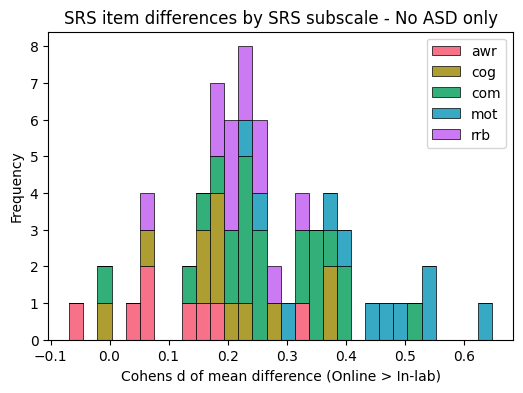

In [ ]:
#plot cohen's d of mean difference colored by subscale
fig, ax = plt.subplots(figsize=(6, 4))
subscales = np.sort(df_item_diff_noasd['subscale'].unique())
colors = sns.color_palette("husl", n_colors=len(subscales))
hist_data = [df_item_diff_noasd[df_item_diff_noasd['subscale'] == subscale]['Cohens_d_rev'] for subscale in subscales]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=subscales, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('Cohens d of mean difference (Online > In-lab)')
plt.ylabel('Frequency')
plt.title('SRS item differences by SRS subscale - No ASD only')
plt.legend()
plt.show()

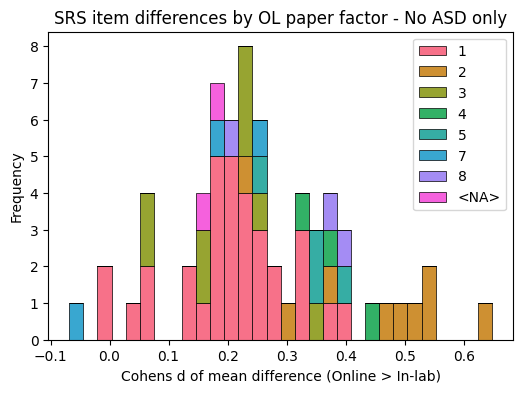

In [ ]:
#plot cohen's d of mean difference colored by OL-SRS study factor
fig, ax = plt.subplots(figsize=(6, 4))
df_item_diff_noasd['Factor_OLpaper'] = df_item_diff_noasd['Factor_OLpaper'].astype(str)
factors = np.sort(df_item_diff_noasd['Factor_OLpaper'].unique())
colors = sns.color_palette("husl", n_colors=len(factors))
hist_data = [df_item_diff_noasd[df_item_diff_noasd['Factor_OLpaper'] == f]['Cohens_d_rev'] for f in factors]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=factors, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('Cohens d of mean difference (Online > In-lab)')
plt.ylabel('Frequency')
plt.title('SRS item differences by OL paper factor - No ASD only')
plt.legend()
plt.show()

In [ ]:
#perform FDR correction
df_item_diff_noasd = df_item_diff_noasd.sort_values(by='p', ascending=True).reset_index(drop=True)
for n in range(1,66):
  df_item_diff_noasd.loc[n-1,'pFDR'] = 0.05 * n / 65
  df_item_diff_noasd.loc[n-1,'isSigFDR'] = df_item_diff_noasd.loc[n-1,'p'] <= df_item_diff_noasd.loc[n-1,'pFDR']
df_item_diff_noasd

,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR
0,SRS_64,1.623007,0.967611,11.815889,1100.785016,2.038271e-30,0.647943,0.647943,I am much more tense in social settings than w...,mot,no,2,2,0.000769,True
1,SRS_1,1.593394,1.040486,9.887738,1118.891353,3.694001e-22,0.539109,0.539109,I am much more uncomfortable in social situati...,mot,no,2,2,0.001538,True
2,SRS_6,1.574032,1.099190,9.772061,1111.156577,1.077246e-21,0.534108,0.534108,I would rather be alone than with others.,mot,no,2,2,0.002308,True
3,SRS_57,1.366743,0.852227,9.680200,1159.692057,2.293999e-21,0.520998,0.520998,I tend to isolate myself.,com,no,2,2,0.003077,True
4,SRS_27,1.269932,0.809717,9.375256,1186.030597,3.376471e-20,0.500326,0.500326,I avoid starting social interactions with othe...,mot,no,2,2,0.003846,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,SRS_20,0.503417,0.455466,1.041306,1014.679786,2.979817e-01,0.058706,0.058706,I have sensory interests that others find unus...,rrb,no,1,1,0.046923,False
61,SRS_7,1.908884,1.955466,-1.007048,938.763129,3.141712e-01,-0.058263,0.058263,I am usually aware of how others are feeling.,awr,yes,3,3,0.047692,False
62,SRS_52,0.699317,0.659919,0.805098,1054.837317,4.209443e-01,0.044800,0.044800,I get overly loud without realizing it.,awr,no,1,1,0.048462,False
63,SRS_5,0.586560,0.599190,-0.294538,1005.135192,7.684077e-01,-0.016658,-0.016658,I do not recognize when others are trying to t...,cog,no,1,1,0.049231,False


In [ ]:
np.sum(df_item_diff_noasd['isSigFDR']==True)

57

### 4) Characterizing individual differences in SRS scores beyond online/in-lab groups.

Also - does the effect of study format (in-lab vs online) on SRS scores hold when controlling for other variables?

Post-careless exclusion only.

#### Main glm

In [ ]:
#this is just to get a summary of data_merged. Can be commented out.
def dataframe_summary(df):
  summary = pd.DataFrame({
        'Column': df.columns,
        'Data Type': df.dtypes,
        'Non-Null Count': df.notna().sum(),
        'Null Count': df.isna().sum()
  })
  summary['Non-Null Count'] = summary['Non-Null Count'].astype(int)
  summary['Null Count'] = summary['Null Count'].astype(int)
  return summary

summary_df = dataframe_summary(data_merged_nodupl_excl)
summary_df.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/data_merged_nodupl_excl_summary.csv', index=False)
summary_df

,Column,Data Type,Non-Null Count,Null Count
Source,Source,object,2826,0
ParticipantID,ParticipantID,object,2826,0
Study_ID,Study_ID,object,494,2332
ID,ID,object,2826,0
Sex,Sex,object,1552,1274
...,...,...,...,...
Gender_recode,Gender_recode,object,2748,78
Education_recode,Education_recode,object,2425,401
Education_num,Education_num,float64,2425,401
Exclude,Exclude,int64,2826,0


Run a glm predicting SRS from as many variables as possible given what we have (exclude variables with too many missing data):
* format (none missing)
* BDI (95 missing)
* LSAS (344 missing)
* Trait anxiety (95 missing)
* Gender_recode (78 missing)
* age (21 missing)
* date_ordinal (none missing)

In [ ]:
df_glm = data_merged_nodupl_excl[['SRS', 'format', 'BDI', 'LSAS', 'STAI_trait', 'Gender_recode', 'age', 'date_ordinal']].dropna()
df_glm

,SRS,format,BDI,LSAS,STAI_trait,Gender_recode,age,date_ordinal
2,74.0,In lab,4.0,45.0,38.0,M,31.0,738260
7,80.0,In lab,15.0,18.0,54.0,W,31.0,737467
8,23.0,In lab,0.0,3.0,31.0,M,32.0,737478
9,33.0,In lab,17.0,20.0,65.0,W,29.0,737478
57,27.0,In lab,3.0,25.0,33.0,M,57.0,737824
...,...,...,...,...,...,...,...,...
3408,51.0,Online,4.0,66.0,46.0,W,38.0,738832
3409,55.0,Online,37.0,101.0,61.0,W,31.0,738832
3410,52.0,Online,5.0,23.0,27.0,W,30.0,738913
3411,69.0,Online,19.0,52.0,54.0,M,23.0,738914


In [ ]:
print('online: N =', np.sum(df_glm['format']=='Online'))
print('in lab: N =', np.sum(df_glm['format']=='In lab'))

online: N = 1992
in lab: N = 422


In [ ]:
#glm
model = smf.ols('SRS ~ format + scale(BDI) + scale(LSAS) + scale(STAI_trait) +  C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)',
                data=df_glm).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    SRS   R-squared:                       0.551
Model:                            OLS   Adj. R-squared:                  0.549
Method:                 Least Squares   F-statistic:                     368.6
Date:                Wed, 18 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:38:46   Log-Likelihood:                -10672.
No. Observations:                2414   AIC:                         2.136e+04
Df Residuals:                    2405   BIC:                         2.141e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

In [ ]:
#make summary df before plotting
coef = model.params[1:]
conf_int = model.conf_int()[1:]
results_df = pd.DataFrame({
    'coef': coef.to_list(),
    'err': ((conf_int.loc[:,1] - conf_int.loc[:, 0]) / 2).to_list(),
    'lower': conf_int.loc[:, 0].to_list(),
    'upper': conf_int.loc[:, 1].to_list()
}, index=['Online>In-lab', 'Gender(M>W)', 'Gender(NB>W)','BDIz','LSASz','STAI_traitz','agez','date_ordinalz'])
results_df

,coef,err,lower,upper
Online>In-lab,5.985854,2.289260,3.696594,8.275113
Gender(M>W),8.963722,1.657714,7.306008,10.621436
Gender(NB>W),15.253285,5.730874,9.522411,20.984158
BDIz,6.863548,1.320521,5.543027,8.184070
LSASz,10.509923,1.043756,9.466167,11.553679
STAI_traitz,6.918183,1.404440,5.513743,8.322623
agez,-1.302381,0.837981,-2.140362,-0.464399
date_ordinalz,-2.084864,0.853557,-2.938421,-1.231307


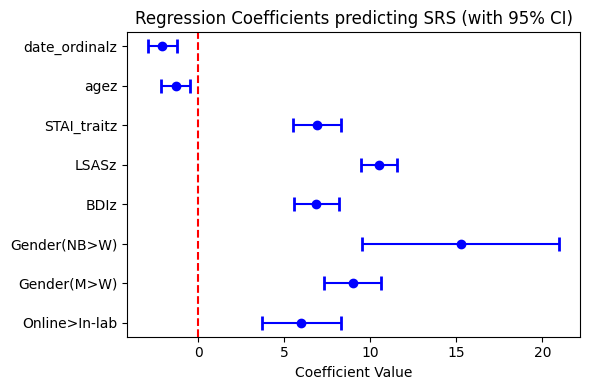

In [ ]:
#make a plot of the coefficients
fig, ax = plt.subplots(figsize=(6, 4))
#results_df = results_df.sort_values('coef')  # Sort by coefficient value
y_pos = range(len(results_df))
ax.errorbar(results_df['coef'], y_pos, xerr=results_df['err'], fmt='o', capsize=5, capthick=2, color='blue')
ax.axvline(x=0, color='red', linestyle='--')
ax.set_yticks(y_pos)
ax.set_yticklabels(results_df.index)
ax.set_xlabel('Coefficient Value')
ax.set_title('Regression Coefficients predicting SRS (with 95% CI)')
plt.tight_layout()
plt.show()

In [ ]:
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

                                                   sum_sq      df           F  \
format                                       10688.811666     1.0   26.290292   
C(Gender_recode, Treatment(reference="W"))   52271.346781     2.0   64.283523   
scale(BDI)                                   42235.147036     1.0  103.881925   
scale(LSAS)                                 158514.263979     1.0  389.883024   
scale(STAI_trait)                            37935.425780     1.0   93.306294   
scale(age)                                    3776.371894     1.0    9.288396   
scale(date_ordinal)                           9327.336850     1.0   22.941597   
Residual                                    977797.907838  2405.0         NaN   

                                                  PR(>F)  
format                                      3.171752e-07  
C(Gender_recode, Treatment(reference="W"))  6.348507e-28  
scale(BDI)                                  6.525940e-24  
scale(LSAS)                       

#### Reduced models to assess unique contributions to variance explained

In [ ]:
# Fit a reduced model, excluding each regressor
reduced_model_format = smf.ols('SRS ~ scale(BDI) + scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_BDI = smf.ols('SRS ~ format + scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_LSAS = smf.ols('SRS ~ format + scale(BDI) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_STAItrait = smf.ols('SRS ~ format + scale(BDI) + scale(LSAS) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_gender = smf.ols('SRS ~ format + scale(BDI) + scale(LSAS) + scale(STAI_trait) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_age = smf.ols('SRS ~ format + scale(BDI) + scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W"))  + scale(date_ordinal)', data=df_glm).fit()
reduced_model_date = smf.ols('SRS ~ format + scale(BDI) + scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age)', data=df_glm).fit()

# Extract R-squared for all models
r2_full = model.rsquared
r2_reduced_format = reduced_model_format.rsquared
r2_reduced_BDI = reduced_model_BDI.rsquared
r2_reduced_LSAS = reduced_model_LSAS.rsquared
r2_reduced_STAItrait = reduced_model_STAItrait.rsquared
r2_reduced_gender = reduced_model_gender.rsquared
r2_reduced_age = reduced_model_age.rsquared
r2_reduced_date = reduced_model_date.rsquared

# Calculate partial r-squared
partial_r2_format = (r2_full - r2_reduced_format) / (1 - r2_reduced_format)
partial_r2_BDI = (r2_full - r2_reduced_BDI) / (1 - r2_reduced_BDI)
partial_r2_LSAS = (r2_full - r2_reduced_LSAS) / (1 - r2_reduced_LSAS)
partial_r2_STAItrait = (r2_full - r2_reduced_STAItrait) / (1 - r2_reduced_STAItrait)
partial_r2_gender = (r2_full - r2_reduced_gender) / (1 - r2_reduced_gender)
partial_r2_age = (r2_full - r2_reduced_age) / (1 - r2_reduced_age)
partial_r2_date = (r2_full - r2_reduced_date) / (1 - r2_reduced_date)

print(f'Partial R-squared for format: {partial_r2_format:.3f}')
print(f'Partial R-squared for BDI: {partial_r2_BDI:.3f}')
print(f'Partial R-squared for LSAS: {partial_r2_LSAS:.3f}')
print(f'Partial R-squared for STAI trait: {partial_r2_STAItrait:.3f}')
print(f'Partial R-squared for gender: {partial_r2_gender:.3f}')
print(f'Partial R-squared for age: {partial_r2_age:.3f}')
print(f'Partial R-squared for date: {partial_r2_date:.3f}')

Partial R-squared for format: 0.011
Partial R-squared for BDI: 0.041
Partial R-squared for LSAS: 0.139
Partial R-squared for STAI trait: 0.037
Partial R-squared for gender: 0.051
Partial R-squared for age: 0.004
Partial R-squared for date: 0.009


Specifically look at how much of the variance explained by format in a simple SRS ~ format model is now explained by other factors in the new model:

In [ ]:
simple_model_format = smf.ols('SRS ~ format', data=df_glm).fit()
intercept_model = smf.ols('SRS ~ 1', data=df_glm).fit()
r2_simple_format = simple_model_format.rsquared
r2_intercept = intercept_model.rsquared
partial_r2_format_simple = (r2_simple_format - r2_intercept) / (1 - r2_simple_format)
print(f'Partial R-squared for format vs intercept: {partial_r2_format_simple:.3f}')

Partial R-squared for format vs intercept: 0.058


Assessing how much of the internalizing symptoms specifically contribute to this variance explained:

In [ ]:
# Assessing partial R-squared for format in models with and without internalizing symptoms
reduced_model_internalizing = smf.ols('SRS ~ format + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_format_internalizing = smf.ols('SRS ~ C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_dem = smf.ols('SRS ~ format + scale(BDI) + scale(LSAS) + scale(STAI_trait)', data=df_glm).fit()
reduced_model_format_dem = smf.ols('SRS ~ scale(BDI) + scale(LSAS) + scale(STAI_trait)', data=df_glm).fit()
reduced_model_format_BDI = smf.ols('SRS ~ scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_format_LSAS = smf.ols('SRS ~ scale(BDI) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_format_STAItrait = smf.ols('SRS ~ scale(BDI) + scale(LSAS) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_format_gender = smf.ols('SRS ~ scale(BDI) + scale(LSAS) + scale(STAI_trait) + scale(age) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_format_age = smf.ols('SRS ~ scale(BDI) + scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(date_ordinal)', data=df_glm).fit()
reduced_model_format_date = smf.ols('SRS ~ scale(BDI) + scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age)', data=df_glm).fit()

# Extract R-squared for all models
r2_reduced_internalizing = reduced_model_internalizing.rsquared
r2_reduced_format_internalizing = reduced_model_format_internalizing.rsquared
r2_reduced_dem = reduced_model_dem.rsquared
r2_reduced_format_dem = reduced_model_format_dem.rsquared
r2_reduced_format_BDI = reduced_model_format_BDI.rsquared
r2_reduced_format_LSAS = reduced_model_format_LSAS.rsquared
r2_reduced_format_STAItrait = reduced_model_format_STAItrait.rsquared
r2_reduced_format_gender = reduced_model_format_gender.rsquared
r2_reduced_format_age = reduced_model_format_age.rsquared
r2_reduced_format_date = reduced_model_format_date.rsquared

# Calculate partial R-squared for format (comparing models with and without format)
partial_r2_format_internalizing = (r2_reduced_internalizing - r2_reduced_format_internalizing) / (1 - r2_reduced_format_internalizing)
partial_r2_format_dem = (r2_reduced_dem - r2_reduced_format_dem) / (1 - r2_reduced_format_dem)
partial_r2_format_BDI = (r2_reduced_BDI - r2_reduced_format_BDI) / (1 - r2_reduced_format_BDI)
partial_r2_format_LSAS = (r2_reduced_LSAS - r2_reduced_format_LSAS) / (1 - r2_reduced_format_LSAS)
partial_r2_format_STAItrait = (r2_reduced_STAItrait - r2_reduced_format_STAItrait) / (1 - r2_reduced_format_STAItrait)
partial_r2_format_gender = (r2_reduced_gender - r2_reduced_format_gender) / (1 - r2_reduced_format_gender)
partial_r2_format_age = (r2_reduced_age - r2_reduced_format_age) / (1 - r2_reduced_format_age)
partial_r2_format_date = (r2_reduced_date - r2_reduced_format_date) / (1 - r2_reduced_format_date)

In [ ]:
print('Proportion of variance explained by study format in different models:')
print(f'In a simple model (intercept + format): {partial_r2_format_simple:.4f}')
print(f'In the full model (intercept + format + BDI + LSAS + STAI + gender + age + date): {partial_r2_format:.4f}')
print(f'In a model without internalizing symptoms (intercept + format + gender + age + date): {partial_r2_format_internalizing:.4f}')
print(f'In a model without BDI (intercept + format + LSAS + STAI + gender + age + date): {partial_r2_format_BDI:.4f}')
print(f'In a model without LSAS (intercept + format + BDI + + STAI + gender + age + date): {partial_r2_format_LSAS:.4f}')
print(f'In a model without STAItrait (intercept + format + BDI + LSAS + gender + age + date): {partial_r2_format_STAItrait:.4f}')
print(f'In a model without gender, age and date (intercept + format + BDI + LSAS + STAI): {partial_r2_format_dem:.4f}')
print(f'In a model without gender (intercept + format + BDI + LSAS + STAI + age + date): {partial_r2_format_gender:.4f}')
print(f'In a model without age (intercept + format + BDI + LSAS + STAI + gender + date): {partial_r2_format_age:.4f}')
print(f'In a model without date (intercept + format + BDI + LSAS + STAI + gender + age): {partial_r2_format_date:.4f}')

Proportion of variance explained by study format in different models:
In a simple model (intercept + format): 0.0585
In the full model (intercept + format + BDI + LSAS + STAI + gender + age + date): 0.0108
In a model without internalizing symptoms (intercept + format + gender + age + date): 0.0490
In a model without BDI (intercept + format + LSAS + STAI + gender + age + date): 0.0126
In a model without LSAS (intercept + format + BDI + + STAI + gender + age + date): 0.0296
In a model without STAItrait (intercept + format + BDI + LSAS + gender + age + date): 0.0086
In a model without gender, age and date (intercept + format + BDI + LSAS + STAI): 0.0207
In a model without gender (intercept + format + BDI + LSAS + STAI + age + date): 0.0144
In a model without age (intercept + format + BDI + LSAS + STAI + gender + date): 0.0103
In a model without date (intercept + format + BDI + LSAS + STAI + gender + age): 0.0177


#### Repeat main glm on no-ASD participants only

In [ ]:
df_glm_no_asd = data_no_asd_excl[['SRS', 'format', 'BDI', 'LSAS', 'STAI_trait', 'Gender_recode', 'age', 'date_ordinal']].dropna()

#glm
model_no_asd = smf.ols('SRS ~ format + scale(BDI) + scale(LSAS) + scale(STAI_trait) + C(Gender_recode, Treatment(reference="W")) + scale(age) + scale(date_ordinal)',
                       data=df_glm_no_asd).fit()
print(model_no_asd.summary())

                            OLS Regression Results                            
Dep. Variable:                    SRS   R-squared:                       0.574
Model:                            OLS   Adj. R-squared:                  0.572
Method:                 Least Squares   F-statistic:                     210.5
Date:                Wed, 18 Dec 2024   Prob (F-statistic):          2.81e-225
Time:                        21:40:43   Log-Likelihood:                -5384.6
No. Observations:                1257   AIC:                         1.079e+04
Df Residuals:                    1248   BIC:                         1.083e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                                       coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------

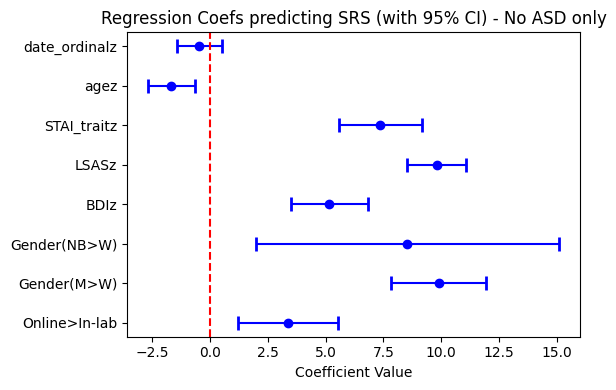

In [ ]:
#make summary df before plotting
coef = model_no_asd.params[1:]
conf_int = model_no_asd.conf_int()[1:]
results_df_no_asd = pd.DataFrame({
    'coef': coef.to_list(),
    'err': ((conf_int.loc[:,1] - conf_int.loc[:, 0]) / 2).to_list(),
    'lower': conf_int.loc[:, 0].to_list(),
    'upper': conf_int.loc[:, 1].to_list()
}, index=['Online>In-lab', 'Gender(M>W)', 'Gender(NB>W)','BDIz','LSASz','STAI_traitz','agez','date_ordinalz'])

#make a plot of the coefficients
fig, ax = plt.subplots(figsize=(6, 4))
y_pos = range(len(results_df_no_asd))
ax.errorbar(results_df_no_asd['coef'], y_pos, xerr=results_df_no_asd['err'], fmt='o', capsize=5, capthick=2, color='blue')
ax.axvline(x=0, color='red', linestyle='--')
ax.set_yticks(y_pos)
ax.set_yticklabels(results_df_no_asd.index)
ax.set_xlabel('Coefficient Value')
ax.set_title('Regression Coefs predicting SRS (with 95% CI) - No ASD only')
plt.tight_layout()
plt.show()

#### Testing for interactions with study format?

Because online vs in-lab is our main variable of interest we can test for two-way interaction with format only.

In [ ]:
model_int2 = smf.ols('SRS ~ format * (C(Gender_recode, Treatment(reference="W")) + scale(BDI) + scale(LSAS) + scale(STAI_trait) + scale(age) + scale(date_ordinal))', data=df_glm).fit()
print(model_int2.summary())

                            OLS Regression Results                            
Dep. Variable:                    SRS   R-squared:                       0.553
Model:                            OLS   Adj. R-squared:                  0.550
Method:                 Least Squares   F-statistic:                     197.5
Date:                Wed, 18 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:40:54   Log-Likelihood:                -10667.
No. Observations:                2414   AIC:                         2.137e+04
Df Residuals:                    2398   BIC:                         2.146e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

Let's plot only the interaction effects from this glm

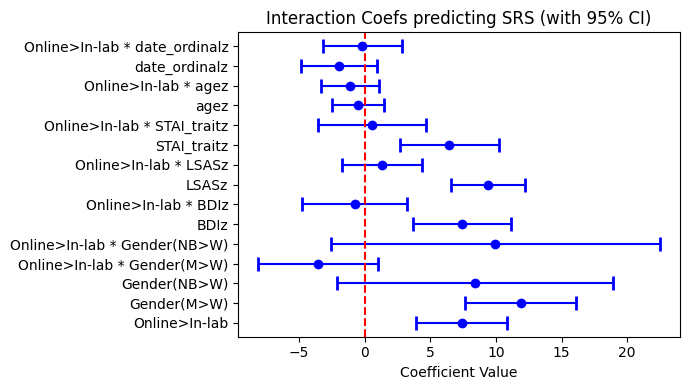

In [ ]:
#make summary df before plotting
coef = model_int2.params[1:]
conf_int = model_int2.conf_int()[1:]
results_df_int2 = pd.DataFrame({
    'coef': coef.to_list(),
    'err': ((conf_int.loc[:,1] - conf_int.loc[:, 0]) / 2).to_list(),
    'lower': conf_int.loc[:, 0].to_list(),
    'upper': conf_int.loc[:, 1].to_list()
}, index=['Online>In-lab', 'Gender(M>W)', 'Gender(NB>W)', 'Online>In-lab * Gender(M>W)', 'Online>In-lab * Gender(NB>W)','BDIz','Online>In-lab * BDIz','LSASz', 'Online>In-lab * LSASz', 'STAI_traitz', 'Online>In-lab * STAI_traitz', 'agez', 'Online>In-lab * agez', 'date_ordinalz','Online>In-lab * date_ordinalz'])

#make a plot of the coefficients
fig, ax = plt.subplots(figsize=(7, 4))
y_pos = range(len(results_df_int2))
ax.errorbar(results_df_int2['coef'], y_pos, xerr=results_df_int2['err'], fmt='o', capsize=5, capthick=2, color='blue')
ax.axvline(x=0, color='red', linestyle='--')
ax.set_yticks(y_pos)
ax.set_yticklabels(results_df_int2.index)
ax.set_xlabel('Coefficient Value')
ax.set_title('Interaction Coefs predicting SRS (with 95% CI)')
plt.tight_layout()
plt.show()

In [ ]:
model_int2_no_asd = smf.ols('SRS ~ format * (C(Gender_recode, Treatment(reference="W")) + scale(BDI) + scale(LSAS) + scale(STAI_trait) + scale(age) + scale(date_ordinal))', data=df_glm_no_asd).fit()
print(model_int2_no_asd.summary())

                            OLS Regression Results                            
Dep. Variable:                    SRS   R-squared:                       0.580
Model:                            OLS   Adj. R-squared:                  0.575
Method:                 Least Squares   F-statistic:                     114.1
Date:                Wed, 18 Dec 2024   Prob (F-statistic):          7.00e-221
Time:                        21:41:24   Log-Likelihood:                -5376.7
No. Observations:                1257   AIC:                         1.079e+04
Df Residuals:                    1241   BIC:                         1.087e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                                                                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

#### Testing for interactions? - OLD

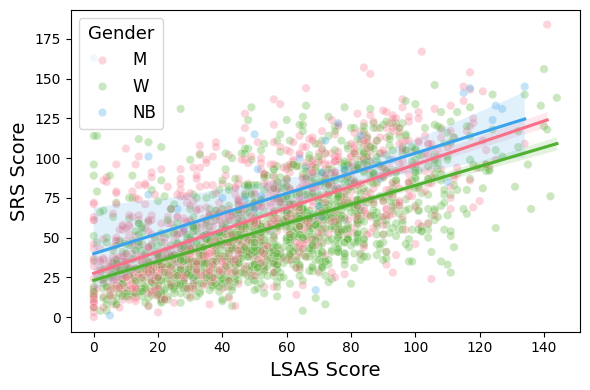

In [ ]:
plt.figure(figsize=(6, 4))
palette = sns.color_palette("husl", 3)
sns.scatterplot(data=df_glm, x='LSAS', y='SRS', hue='Gender_recode', palette=palette, alpha=0.3)
sns.regplot(data=df_glm[df_glm['Gender_recode']=='M'], x='LSAS', y='SRS', scatter=False, color=palette[0])
sns.regplot(data=df_glm[df_glm['Gender_recode']=='W'], x='LSAS', y='SRS', scatter=False, color=palette[1])
sns.regplot(data=df_glm[df_glm['Gender_recode']=='NB'], x='LSAS', y='SRS', scatter=False, color=palette[2])
plt.xlabel('LSAS Score', fontsize=14)
plt.ylabel('SRS Score', fontsize=14)
plt.legend(title='Gender', title_fontsize='13', fontsize='12')
plt.tight_layout()
plt.show()

Interestingly, despite strong correlation between LSAS and SRS the two measures vary in opposite direction between men and women (i.e. SRS is higher is men than women, while social anxiety is higher in women than men):

In [ ]:
print(np.mean(df_glm.loc[df_glm['Gender_recode']=='M','SRS']))
print(np.mean(df_glm.loc[df_glm['Gender_recode']=='W','SRS']))
print(np.mean(df_glm.loc[df_glm['Gender_recode']=='M','LSAS']))
print(np.mean(df_glm.loc[df_glm['Gender_recode']=='W','LSAS']))
print(np.mean(df_glm.loc[df_glm['Gender_recode']=='M','STAI_trait']))
print(np.mean(df_glm.loc[df_glm['Gender_recode']=='W','STAI_trait']))

62.01541425818883
57.13650075414781
50.394990366088635
56.88461538461539
43.26782273603083
45.450980392156865


This indicates the potential for a LSAS*Gender interaction

In [ ]:
model_int = smf.ols('SRS ~ format + scale(LSAS)*C(Gender_recode, Treatment(reference="W")) + scale(BDI) + scale(STAI_trait) + scale(age) + scale(date_ordinal)',
                data=df_glm).fit()
print(model_int.summary())

                            OLS Regression Results                            
Dep. Variable:                    SRS   R-squared:                       0.552
Model:                            OLS   Adj. R-squared:                  0.550
Method:                 Least Squares   F-statistic:                     296.4
Date:                Wed, 18 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:41:29   Log-Likelihood:                -10668.
No. Observations:                2414   AIC:                         2.136e+04
Df Residuals:                    2403   BIC:                         2.142e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------

In addition, because of our focus on online vs in-lab samples, we can check whether any effect is moderated by 'format':

In [ ]:
model_int2 = smf.ols('SRS ~ format * (scale(LSAS)*C(Gender_recode, Treatment(reference="W")) + scale(BDI) + scale(STAI_trait) + scale(age) + scale(date_ordinal))',
                data=df_glm).fit()
print(model_int2.summary())

                            OLS Regression Results                            
Dep. Variable:                    SRS   R-squared:                       0.555
Model:                            OLS   Adj. R-squared:                  0.552
Method:                 Least Squares   F-statistic:                     157.2
Date:                Wed, 18 Dec 2024   Prob (F-statistic):               0.00
Time:                        21:41:29   Log-Likelihood:                -10661.
No. Observations:                2414   AIC:                         2.136e+04
Df Residuals:                    2394   BIC:                         2.148e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                                                                                    coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------

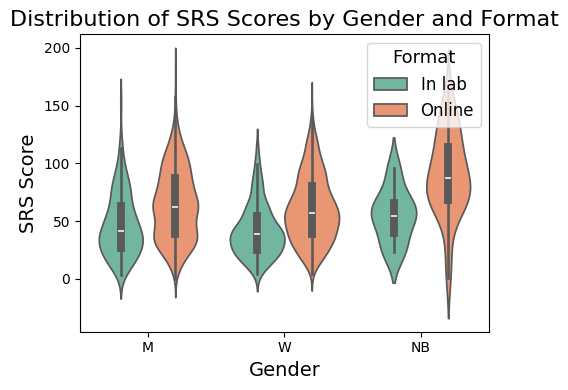

In [ ]:
plt.figure(figsize=(5, 4))
sns.violinplot(data=df_glm, x='Gender_recode', y='SRS', hue='format',
               split=False, palette="Set2")
plt.title('Distribution of SRS Scores by Gender and Format', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('SRS Score', fontsize=14)
plt.legend(title='Format', title_fontsize='13', fontsize='12')
plt.tight_layout()
plt.show()

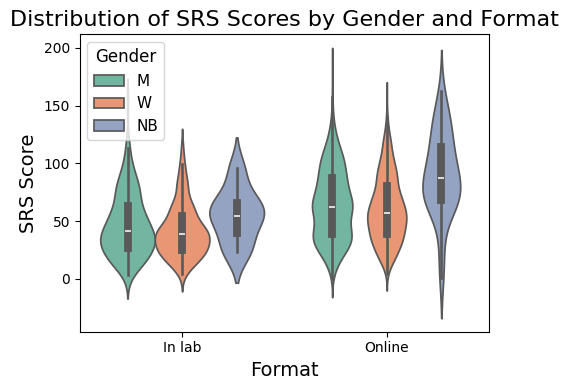

In [ ]:
plt.figure(figsize=(5, 4))
sns.violinplot(data=df_glm, x='format', y='SRS', hue='Gender_recode',
               split=False, palette="Set2")
plt.title('Distribution of SRS Scores by Gender and Format', fontsize=16)
plt.xlabel('Format', fontsize=14)
plt.ylabel('SRS Score', fontsize=14)
plt.legend(title='Gender', title_fontsize='12', fontsize='11')
plt.tight_layout()
plt.show()

In [ ]:
df_glm["gender_by_format"] = df_glm["format"] + " - " + df_glm["Gender_recode"]
df_glm["gender_by_format"].unique()

array(['In lab - M', 'In lab - W', 'In lab - NB', 'Online - M',
       'Online - W', 'Online - NB'], dtype=object)

In [ ]:
df_glm_MW = df_glm[df_glm['gender_by_format'].isin(['Online - M', 'Online - W', 'In lab - M', 'In lab - W'])]
df_glm_MW.head()

,SRS,format,BDI,LSAS,STAI_trait,Gender_recode,age,date_ordinal,gender_by_format
2,74.0,In lab,4.0,45.0,38.0,M,31.0,738260,In lab - M
7,80.0,In lab,15.0,18.0,54.0,W,31.0,737467,In lab - W
8,23.0,In lab,0.0,3.0,31.0,M,32.0,737478,In lab - M
9,33.0,In lab,17.0,20.0,65.0,W,29.0,737478,In lab - W
57,27.0,In lab,3.0,25.0,33.0,M,57.0,737824,In lab - M


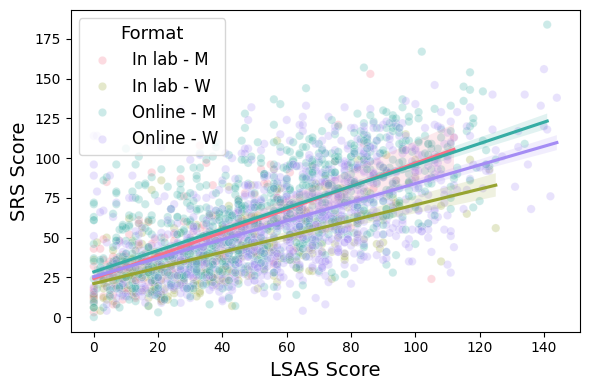

In [ ]:
plt.figure(figsize=(6, 4))
palette = sns.color_palette("husl", 4)
sns.scatterplot(data=df_glm_MW, x='LSAS', y='SRS', hue='gender_by_format', palette=palette, alpha=0.25)
sns.regplot(data=df_glm_MW[df_glm_MW['gender_by_format']=='In lab - M'], x='LSAS', y='SRS', scatter=False, color=palette[0])
sns.regplot(data=df_glm_MW[df_glm_MW['gender_by_format']=='In lab - W'], x='LSAS', y='SRS', scatter=False, color=palette[1])
sns.regplot(data=df_glm_MW[df_glm_MW['gender_by_format']=='Online - M'], x='LSAS', y='SRS', scatter=False, color=palette[2])
sns.regplot(data=df_glm_MW[df_glm_MW['gender_by_format']=='Online - W'], x='LSAS', y='SRS', scatter=False, color=palette[3])
plt.xlabel('LSAS Score', fontsize=14)
plt.ylabel('SRS Score', fontsize=14)
plt.legend(title='Format', title_fontsize='13', fontsize='12')
plt.tight_layout()
plt.show()

In [ ]:
df_glm[['SRS','BDI','LSAS','STAI_trait']].corr()

,SRS,BDI,LSAS,STAI_trait
SRS,1.000000,0.611116,0.626172,0.625053
BDI,0.611116,1.000000,0.543105,0.785265
LSAS,0.626172,0.543105,1.000000,0.598293
STAI_trait,0.625053,0.785265,0.598293,1.000000


# Stability of SRS scores

### Data formatting

#### Data cleaning and scoring

In [ ]:
data_reinvite.columns

Index(['StartDate', 'IPAddress', 'Duration (in seconds)', 'Finished', 'ID',
       'autism', 'family_autism', 'family_autism_2', 'family_autism_2_15_TEXT',
       'OCD',
       ...
       'AQ_Total', 'LSAS_Performance_Fear', 'LSAS_Performance_Avoidance',
       'LSAS_Social_Fear', 'LSAS_Social_Avoid', 'LSAS_Social',
       'LSAS_Performance', 'LSAS_Fear', 'LSAS_Avoid', 'LSAS_Total'],
      dtype='object', length=477)

Delete rows of unfinished data.

In [ ]:
print('number of unfinished datasets:')
np.sum(data_reinvite['Finished'] == False)

number of unfinished datasets:


1

In [ ]:
#delete unfinished datasets
data_reinvite = data_reinvite[data_reinvite['Finished'] == True].copy()

First, let's score the covid-related questions:
* Questions 1-3 are scales from 1 to 7, so we keep these as they are.
* Questions 4 & 5 are each made up of 9 YES/NO questions, so we score 1 for yes and 0 for no and sum across the 9 questions, so scores for each question range from 0 to 9.
* Question 6 has 5 levels of the number of people spoken to face-to-face, so scores range from 1 to 5.
* Question 7 has 7 levels of the number of people spoken to virtually, so scores range from 1 to 7.
* Question 8 has 10 YES/NO questions, so scores range from 0 to 10.
* Questions 9 & 10 have 5 YES/NO questions, so scores range from 0 to 5.

In [ ]:
#recode all the yes/no covid questions (Q4, Q5, Q8, Q9 and Q10) as 1/0
covid_columns = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid')]
data_reinvite[covid_columns] = data_reinvite[covid_columns].replace({'Yes': 1, 'No': 0})

<ipython-input-193-e07c399cfad2>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_reinvite[covid_columns] = data_reinvite[covid_columns].replace({'Yes': 1, 'No': 0})


In [ ]:
#recode covid Q6 and Q7 answers from 1 to 5 and 1 to 7 respectively
covid_q6_columns = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q6')]
data_reinvite[covid_q6_columns] = data_reinvite[covid_q6_columns].replace({'None': 1, '1-3 people': 2, '4-6 people': 3, '7-10 people': 4, 'More than 10 people': 5}).fillna(1)

covid_q7_columns = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q7')]
data_reinvite[covid_q7_columns] = data_reinvite[covid_q7_columns].replace({'None': 1, '1-3 people': 2, '4-6 people': 3, '7-10 people': 4, '11-20 people': 5, '21-50 people': 6, '>50 people': 7}).fillna(1)

<ipython-input-194-811daf5f276d>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_reinvite[covid_q6_columns] = data_reinvite[covid_q6_columns].replace({'None': 1, '1-3 people': 2, '4-6 people': 3, '7-10 people': 4, 'More than 10 people': 5}).fillna(1)
<ipython-input-194-811daf5f276d>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_reinvite[covid_q7_columns] = data_reinvite[covid_q7_columns].replace({'None': 1, '1-3 people': 2, '4-6 people': 3, '7-10 people': 4, '11-20 people': 5, '21-50 people': 6, '>50 people': 7}).fil

In the code above, note that the 'None' in the raw data were somehow read into NaN when reading the .csv file, and there are no actual NaNs in Q6 and Q7 of the dataset, hence the .fillna(1) to replace the NaN by 1 since those were all the 'None' answers.

In [ ]:
data_reinvite[data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q6') | data_reinvite.columns.str.startswith('Covid_Q7')]]

,Covid_Q6_NspeakFaceToFace_2020,Covid_Q6_NspeakFaceToFace_recall,Covid_Q6_NspeakFaceToFace_2024,Covid_Q7_NspeakVirtual_2020,Covid_Q7_NspeakVirtual_recall,Covid_Q7_NspeakVirtual_2024
0,3.0,5.0,5.0,5.0,5.0,6.0
1,2.0,5.0,5.0,5.0,6.0,6.0
2,5.0,5.0,5.0,5.0,5.0,5.0
3,1.0,5.0,5.0,6.0,6.0,7.0
4,2.0,3.0,3.0,1.0,3.0,2.0
...,...,...,...,...,...,...
227,2.0,3.0,5.0,5.0,5.0,5.0
228,3.0,4.0,4.0,4.0,4.0,4.0
229,2.0,2.0,5.0,2.0,2.0,1.0
230,1.0,1.0,2.0,6.0,6.0,3.0


In [ ]:
#checks if there are any NaNs remaining in the covid columns and how many
cols = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid')]
id_to_exclude = []
for col in cols:
    n_nan = data_reinvite[col].isna().sum()
    if n_nan > 0:
        print(f"{col}: {n_nan} NaNs, ID: {data_reinvite[data_reinvite[col].isna()]['ID'].values}")
        id_to_exclude.append(data_reinvite[data_reinvite[col].isna()]['ID'].values.tolist())

Covid_Q2_Afraid_2020: 1 NaNs, ID: ['5cb29cc0a9827c0001e7e477']
Covid_Q2_Afraid_recall: 1 NaNs, ID: ['5ba8e80089390100019064ed']
Covid_Q2_Afraid_2024: 1 NaNs, ID: ['60fa33610e4b25f11babd130']


In [ ]:
#exclude ids
for id in id_to_exclude:
    data_reinvite = data_reinvite[~data_reinvite['ID'].isin(id)]
len(data_reinvite)

228

In [ ]:
data_reinvite[data_reinvite.columns[data_reinvite.columns.str.startswith('Covid')]]

,Covid_Q1_Threat_2020,Covid_Q1_Threat_recall,Covid_Q1_Threat_2024,Covid_Q2_Afraid_2020,Covid_Q2_Afraid_recall,Covid_Q2_Afraid_2024,Covid_Q3_StressCatching_2020,Covid_Q3_StressCatching_recall,Covid_Q3_StressCatching_2024,Covid_Q4_1_avoidSupermarket_2020,...,Covid_Q10_1_mentalHealthProblems_recall,Covid_Q10_2_sleepProblems_recall,Covid_Q10_3_alcoholSubstanceUse_recall,Covid_Q10_4_noAccessToTherapy_recall,Covid_Q10_5_notSatifiedChangesTherapy_recall,Covid_Q10_1_mentalHealthProblems_2024,Covid_Q10_2_sleepProblems_2024,Covid_Q10_3_alcoholSubstanceUse_2024,Covid_Q10_4_noAccessToTherapy_2024,Covid_Q10_5_notSatifiedChangesTherapy_2024
0,6.0,3.0,1.0,5.0,3.0,1.0,4.0,3.0,1.0,0,...,1,1,1,0,0,0,0,0,0,0
1,5.0,3.0,2.0,6.0,4.0,2.0,6.0,4.0,2.0,1,...,0,1,0,0,0,0,0,0,0,0
2,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,0,...,1,1,0,0,0,0,0,0,0,0
3,7.0,6.0,4.0,7.0,7.0,4.0,7.0,7.0,5.0,1,...,1,1,0,1,1,1,1,0,0,1
4,4.0,4.0,1.0,5.0,5.0,1.0,5.0,4.0,1.0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,7.0,4.0,2.0,7.0,5.0,3.0,7.0,6.0,2.0,0,...,1,1,1,1,1,1,1,0,0,1
228,7.0,5.0,1.0,7.0,5.0,1.0,6.0,4.0,2.0,1,...,1,1,1,1,1,1,1,1,1,1
229,7.0,5.0,3.0,7.0,6.0,3.0,7.0,6.0,2.0,0,...,1,0,0,0,0,0,0,0,0,0
230,3.0,5.0,3.0,2.0,3.0,2.0,2.0,3.0,2.0,1,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#sum across columns for relevant covid questions
covid_q = ['Covid_Q4', 'Covid_Q5', 'Covid_Q8', 'Covid_Q9', 'Covid_Q10']
year = ['2020', 'recall', '2024']
q_names = ['BehaviorChange', 'ActivityDisruptions', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']

for index, q in enumerate(covid_q):
    n = q_names[index]
    for y in year:
        columns_to_sum = data_reinvite.columns[data_reinvite.columns.str.startswith(q) & data_reinvite.columns.str.endswith(y) & ~data_reinvite.columns.str.contains(n)]
        print(q + '_' + y + ': ' + str(len(columns_to_sum)) + ' columns')
        data_reinvite[q + '_' + n + '_' + y] = data_reinvite[columns_to_sum].sum(axis=1, numeric_only=True)

Covid_Q4_2020: 9 columns
Covid_Q4_recall: 9 columns
Covid_Q4_2024: 9 columns
Covid_Q5_2020: 9 columns
Covid_Q5_recall: 9 columns
Covid_Q5_2024: 9 columns
Covid_Q8_2020: 10 columns
Covid_Q8_recall: 10 columns
Covid_Q8_2024: 10 columns
Covid_Q9_2020: 5 columns
Covid_Q9_recall: 5 columns
Covid_Q9_2024: 5 columns
Covid_Q10_2020: 5 columns
Covid_Q10_recall: 5 columns
Covid_Q10_2024: 5 columns


<ipython-input-199-cc6ae8dcf15f>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite[q + '_' + n + '_' + y] = data_reinvite[columns_to_sum].sum(axis=1, numeric_only=True)
<ipython-input-199-cc6ae8dcf15f>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite[q + '_' + n + '_' + y] = data_reinvite[columns_to_sum].sum(axis=1, numeric_only=True)
<ipython-input-199-cc6ae8dcf15f>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poo

In [ ]:
data_reinvite[data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q4_BehaviorChange')]]
data_reinvite.head()

,StartDate,IPAddress,Duration (in seconds),Finished,ID,autism,family_autism,family_autism_2,family_autism_2_15_TEXT,OCD,...,Covid_Q5_ActivityDisruptions_2024,Covid_Q8_SocialDisruptions_2020,Covid_Q8_SocialDisruptions_recall,Covid_Q8_SocialDisruptions_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024
0,4/8/2024 20:59,88.19.100.199,1703,True,5e92178e8ee4fe54b65b7c39,No,No,NaN,NaN,No - but I self identify as having OCD,...,0,3,2,0,0,0,0,3,3,0
1,4/8/2024 21:13,69.220.156.184,4389,True,606a3cf263a18869ac8ee0ed,No,No,NaN,NaN,No,...,0,5,5,0,2,2,2,1,1,0
2,4/8/2024 21:48,47.208.63.218,2498,True,559fa17cfdf99b69c369d364,No,No,NaN,NaN,No,...,0,2,0,0,4,4,1,2,2,0
3,4/8/2024 22:36,70.175.93.13,1461,True,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,NaN,No,...,2,6,7,1,2,2,0,4,4,3
4,4/9/2024 0:22,104.186.234.163,2321,True,567dd32b4f0ef30006dbb718,No,I don't know,NaN,NaN,No,...,5,7,7,6,0,0,0,0,0,0


Create a new column indicating the recall date in a format more similar to actual dates.

In [ ]:
data_reinvite['recall_month'] = data_reinvite['RECALL'].replace({720: '2020-07', 820: '2020-08', 1020: '2020-10', 1120: '2020-11', 1220: '2020-12', 121: '2021-01', 221: '2021-02', 821: '2021-08', 921: '2021-09'})
data_reinvite['recall_month'] = data_reinvite['recall_month'].astype('category')
data_reinvite['recall_month'] = data_reinvite['recall_month'].cat.reorder_categories(['2020-07', '2020-08', '2020-10', '2020-11', '2020-12', '2021-01', '2021-02', '2021-08', '2021-09'])

data_reinvite['recall_period'] = data_reinvite['RECALL'].replace({720: 'Summer2020', 820: 'Summer2020', 1020: 'Fall2020', 1120: 'Fall2020', 1220: 'Fall2020', 121: 'Winter2021', 221: 'Winter2021', 821: 'Summer2021', 921: 'Summer2021'})
data_reinvite['recall_period'] = data_reinvite['recall_period'].astype('category')
data_reinvite['recall_period'] = data_reinvite['recall_period'].cat.reorder_categories(['Summer2020', 'Fall2020', 'Winter2021', 'Summer2021'])

<ipython-input-201-5a7d68382c05>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['recall_month'] = data_reinvite['RECALL'].replace({720: '2020-07', 820: '2020-08', 1020: '2020-10', 1120: '2020-11', 1220: '2020-12', 121: '2021-01', 221: '2021-02', 821: '2021-08', 921: '2021-09'})
<ipython-input-201-5a7d68382c05>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['recall_period'] = data_reinvite['RECALL'].replace({720: 'Summer2020', 820: 'Summer2020', 1020: 'Fall2020', 1120: 'Fall2020', 1220: 'Fall2020',

In [ ]:
print('Summary of recall data by month:')
print('July 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-07'])))
print('August 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-08'])))
print('October 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-10'])))
print('November 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-11'])))
print('December 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-12'])))
print('January 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-01'])))
print('February 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-02'])))
print('August 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-08'])))
print('September 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-09'])))

Summary of recall data by month:
July 2020: N=7
August 2020: N=5
October 2020: N=7
November 2020: N=24
December 2020: N=38
January 2021: N=20
February 2021: N=3
August 2021: N=97
September 2021: N=27


In [ ]:
print('Summary of recall data by period:')
print('Summer 2020: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Summer2020'])))
print('Fall 2020: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Fall2020'])))
print('Winter 2021: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Winter2021'])))
print('Summer 2021: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Summer2021'])))

Summary of recall data by period:
Summer 2020: N=12
Fall 2020: N=69
Winter 2021: N=23
Summer 2021: N=124


#### Visualization of covid questions scores & dimensionality reduction

Plot correlation matrix between the 10 covid question for each period

<Axes: >

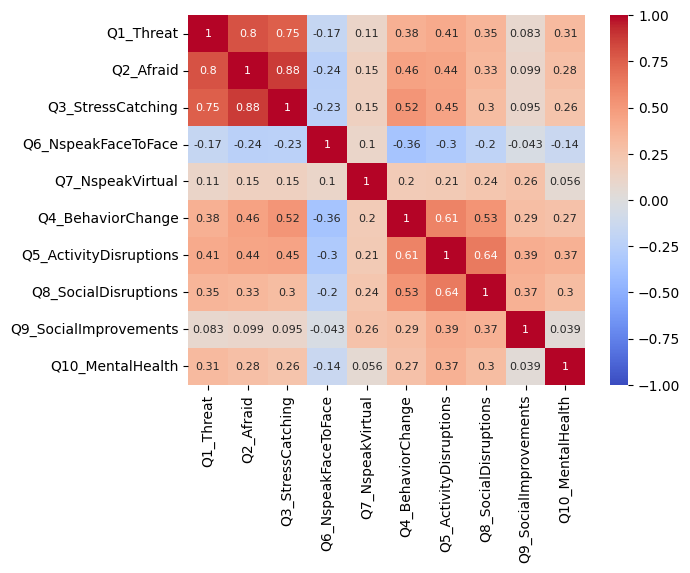

In [ ]:
# 2020
n_list = ['Threat', 'Afraid', 'StressCatching', 'BehaviorChange', 'ActivityDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']
df_2020 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2020')]]
df_2020.columns = df_2020.columns.str.rstrip('_2020')
df_2020.columns = df_2020.columns.str.lstrip('Covid_')

corr_2020 = df_2020.corr()
sns.heatmap(corr_2020, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2020.columns.values, yticklabels=corr_2020.columns.values)

<Axes: >

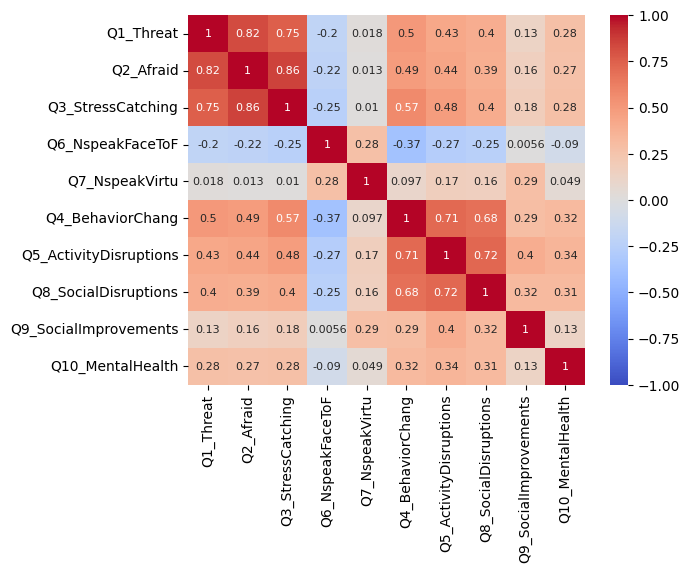

In [ ]:
# recall
n_list = ['Threat', 'Afraid', 'StressCatching', 'BehaviorChange', 'ActivityDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']
df_recall = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('recall')]]
df_recall.columns = df_recall.columns.str.rstrip('_recall')
df_recall.columns = df_recall.columns.str.lstrip('Covid_')

corr_recall = df_recall.corr()
sns.heatmap(corr_recall, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_recall.columns.values, yticklabels=corr_recall.columns.values)

<Axes: >

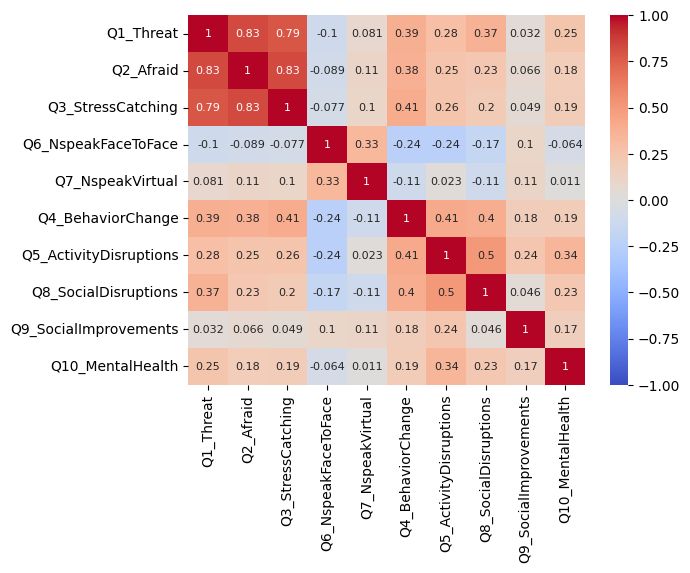

In [ ]:
# 2024
n_list = ['Threat', 'Afraid', 'StressCatching', 'BehaviorChange', 'ActivityDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']
df_2024 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2024')]]
df_2024.columns = df_2024.columns.str.rstrip('_2024')
df_2024.columns = df_2024.columns.str.lstrip('Covid_')

corr_2024 = df_2024.corr()
sns.heatmap(corr_2024, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2024.columns.values, yticklabels=corr_2024.columns.values)

Given the correlation, let's group the following item together by taking their mean:
* Threat, Afraid and Stress of catching covid ~ Anxiety
* BehaviorChange, ActivityDisruptions, and SocialDisruptions ~ LifeDisruptions


In [ ]:
data_reinvite['Covid_Q123_Anxiety_2020'] = data_reinvite[['Covid_Q1_Threat_2020', 'Covid_Q2_Afraid_2020', 'Covid_Q3_StressCatching_2020']].mean(axis=1)
data_reinvite['Covid_Q123_Anxiety_recall'] = data_reinvite[['Covid_Q1_Threat_recall', 'Covid_Q2_Afraid_recall', 'Covid_Q3_StressCatching_recall']].mean(axis=1)
data_reinvite['Covid_Q123_Anxiety_2024'] = data_reinvite[['Covid_Q1_Threat_2024', 'Covid_Q2_Afraid_2024', 'Covid_Q3_StressCatching_2024']].mean(axis=1)

data_reinvite['Covid_Q458_LifeDisruptions_2020'] = data_reinvite[['Covid_Q4_BehaviorChange_2020', 'Covid_Q5_ActivityDisruptions_2020', 'Covid_Q8_SocialDisruptions_2020']].mean(axis=1)
data_reinvite['Covid_Q458_LifeDisruptions_recall'] = data_reinvite[['Covid_Q4_BehaviorChange_recall', 'Covid_Q5_ActivityDisruptions_recall', 'Covid_Q8_SocialDisruptions_recall']].mean(axis=1)
data_reinvite['Covid_Q458_LifeDisruptions_2024'] = data_reinvite[['Covid_Q4_BehaviorChange_2024', 'Covid_Q5_ActivityDisruptions_2024', 'Covid_Q8_SocialDisruptions_2024']].mean(axis=1)

<ipython-input-207-72107b599b56>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['Covid_Q123_Anxiety_2020'] = data_reinvite[['Covid_Q1_Threat_2020', 'Covid_Q2_Afraid_2020', 'Covid_Q3_StressCatching_2020']].mean(axis=1)
<ipython-input-207-72107b599b56>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['Covid_Q123_Anxiety_recall'] = data_reinvite[['Covid_Q1_Threat_recall', 'Covid_Q2_Afraid_recall', 'Covid_Q3_StressCatching_recall']].mean(axis=1)
<ipython-input-207-72107b599b56>:3: PerformanceWarning: Da

Replot correlation matrix with fewer question scores

<Axes: >

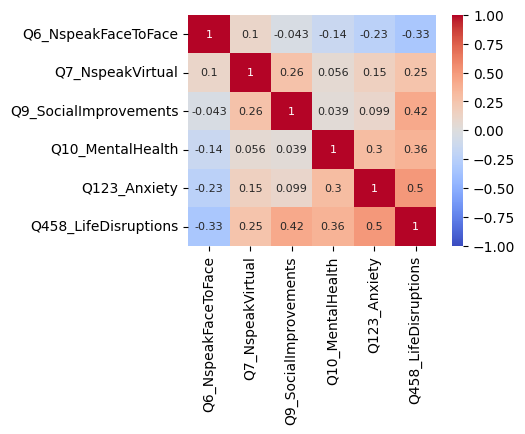

In [ ]:
# 2020
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']
df_2020 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2020')]]
df_2020.columns = df_2020.columns.str.rstrip('_2020')
df_2020.columns = df_2020.columns.str.lstrip('Covid_')

corr_2020 = df_2020.corr()
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(corr_2020, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2020.columns.values, yticklabels=corr_2020.columns.values)

<Axes: >

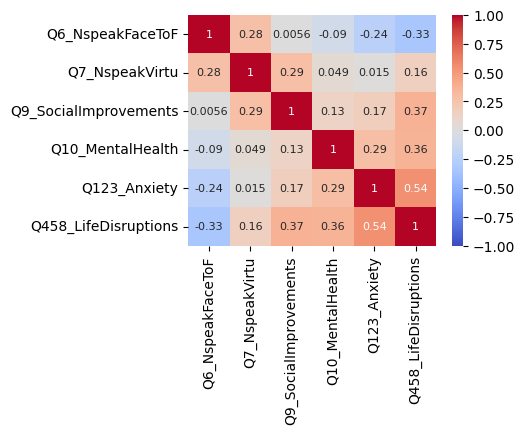

In [ ]:
# recall
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']
df_recall = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('recall')]]
df_recall.columns = df_recall.columns.str.rstrip('_recall')
df_recall.columns = df_recall.columns.str.lstrip('Covid_')

corr_recall = df_recall.corr()
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(corr_recall, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_recall.columns.values, yticklabels=corr_recall.columns.values)

<Axes: >

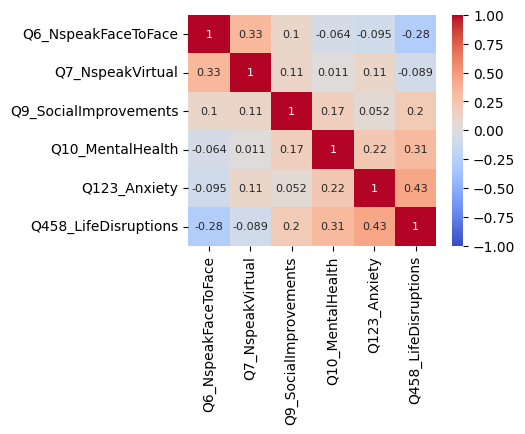

In [ ]:
# 2024
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']
df_2024 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2024')]]
df_2024.columns = df_2024.columns.str.rstrip('_2024')
df_2024.columns = df_2024.columns.str.lstrip('Covid_')

corr_2024 = df_2024.corr()
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(corr_2024, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2024.columns.values, yticklabels=corr_2024.columns.values)

Now we can plot the distribution of those 6 covid-related question for each period.

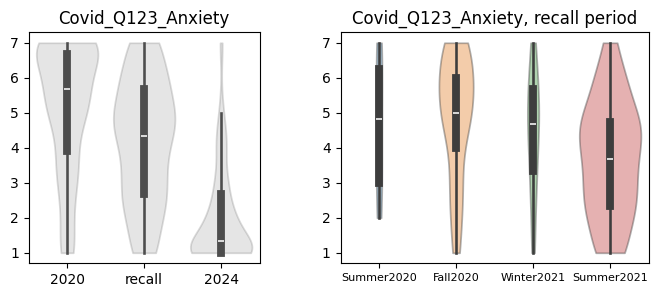

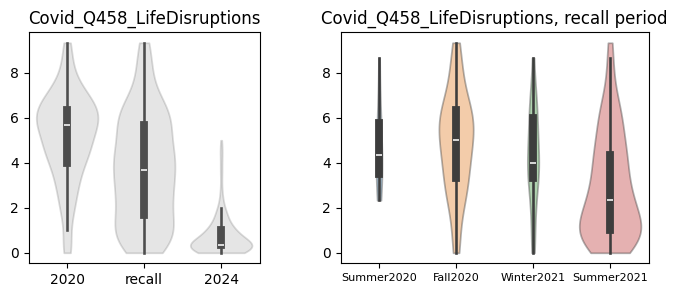

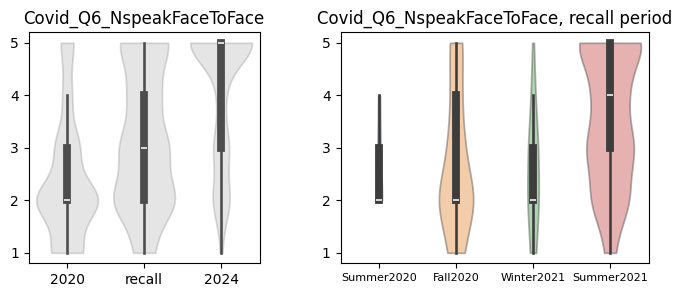

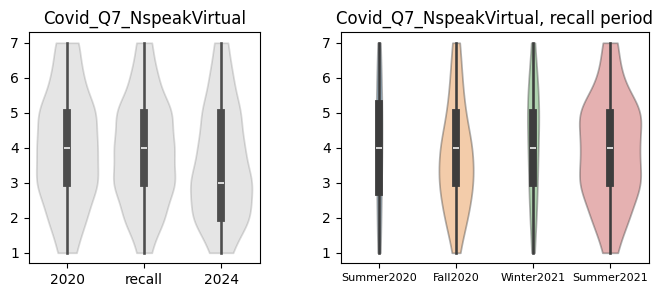

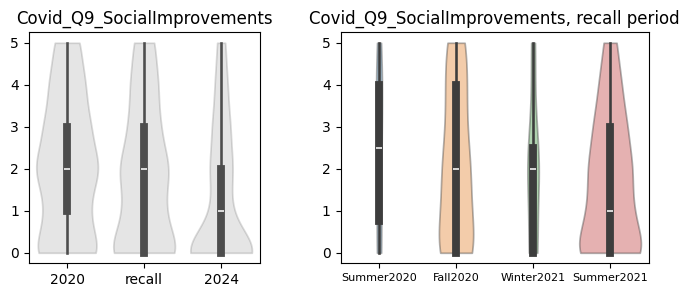

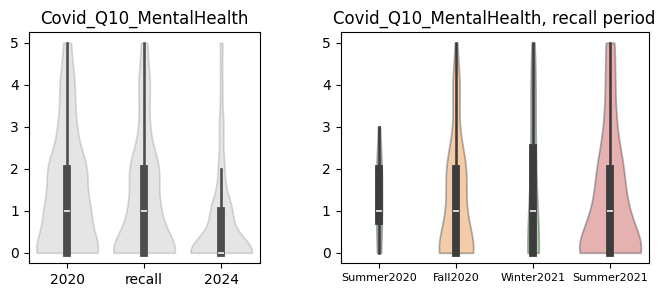

In [ ]:
q_list = ['Covid_Q123_', 'Covid_Q458_', 'Covid_Q6_', 'Covid_Q7_', 'Covid_Q9_', 'Covid_Q10_']
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']

for index, q in enumerate(q_list):
  n = n_list[index]

  df_long = pd.melt(data_reinvite, value_vars=data_reinvite.columns[data_reinvite.columns.str.startswith(q + n)].tolist(),
                    var_name='Period', value_name= q + n, id_vars=['ID','recall_month','recall_period'])
  df_long['Period'] = df_long['Period'].str.extract(r'(\d{4}|recall)$')

  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8,3), width_ratios=[3,4])
  #subplot 1
  sns.violinplot(x='Period', y= q + n, ax=ax1, data=df_long, color='gray', alpha=0.2, common_norm=True, density_norm='count', cut=0)
  ax1.set_title(q + n)
  ax1.set_xlabel('')
  ax1.set_ylabel('')
  #subplot 2
  sns.violinplot(x='recall_period', y= q + n, ax=ax2, data=df_long[df_long['Period']=='recall'], hue='recall_period', alpha=0.4, common_norm=True, density_norm='count', cut=0)
  ax2.set_title(q + n + ', recall period')
  ax2.xaxis.set_tick_params(labelsize=8)
  ax2.set_xlabel('')
  ax2.set_ylabel('')
  plt.subplots_adjust(wspace=0.3, hspace=0.4)

#### Add SRS and other questionnaire data from recall-period study to data_reinvite

In [ ]:
cols_to_keep_reinvite = ['StartDate','Duration (in seconds)', 'ID', 'autism', 'family_autism', 'family_autism_2', 'OCD', 'schizophrenia', 'bipoloar', 'diagnose_all',
                         'SRS-A-SR_1_1', 'SRS-A-SR_1_2', 'SRS-A-SR_1_3', 'SRS-A-SR_1_4', 'SRS-A-SR_1_5', 'SRS-A-SR_1_6', 'SRS-A-SR_1_7', 'SRS-A-SR_1_8', 'SRS-A-SR_1_9', 'SRS-A-SR_1_10',
                         'SRS-A-SR_2_1', 'SRS-A-SR_2_2', 'SRS-A-SR_2_3', 'SRS-A-SR_2_4', 'SRS-A-SR_2_5', 'SRS-A-SR_2_6', 'SRS-A-SR_2_7', 'SRS-A-SR_2_8', 'SRS-A-SR_2_9', 'SRS-A-SR_2_10',
                         'SRS-A-SR_3_1', 'SRS-A-SR_3_2', 'SRS-A-SR_3_3', 'SRS-A-SR_3_4', 'SRS-A-SR_3_5', 'SRS-A-SR_3_6', 'SRS-A-SR_3_7', 'SRS-A-SR_3_8', 'SRS-A-SR_3_9', 'SRS-A-SR_3_10',
                         'SRS-A-SR_4_1', 'SRS-A-SR_4_2', 'SRS-A-SR_4_3', 'SRS-A-SR_4_4', 'SRS-A-SR_4_5', 'SRS-A-SR_4_6', 'SRS-A-SR_4_7', 'SRS-A-SR_4_8', 'SRS-A-SR_4_9', 'SRS-A-SR_4_10',
                         'SRS-A-SR_5_1', 'SRS-A-SR_5_2', 'SRS-A-SR_5_3', 'SRS-A-SR_5_4', 'SRS-A-SR_5_5', 'SRS-A-SR_5_6', 'SRS-A-SR_5_7', 'SRS-A-SR_5_8', 'SRS-A-SR_5_9', 'SRS-A-SR_5_10',
                         'SRS-A-SR_6_1', 'SRS-A-SR_6_2', 'SRS-A-SR_6_3', 'SRS-A-SR_6_4', 'SRS-A-SR_6_5', 'SRS-A-SR_6_6', 'SRS-A-SR_6_7', 'SRS-A-SR_6_8', 'SRS-A-SR_6_9', 'SRS-A-SR_6_10',
                         'SRS-A-SR_7_1', 'SRS-A-SR_7_2', 'SRS-A-SR_7_3', 'SRS-A-SR_7_4', 'SRS-A-SR_7_5', 'RECALL', 'BDI Total', 'SRS_Total', 'SRS_SCI', 'SRS_Awr', 'SRS_Cog',
                         'SRS_Com', 'SRS_Mot', 'SRS_RRB', 'STAI_Trait', 'STAI_State', 'NEO_Neuroticism', 'NEO_Extraversion', 'NEO_Openness', 'NEO_Agreeableness', 'NEO_Conscientiousness',
                         'AQ_Total', 'LSAS_Total', 'Covid_Q123_Anxiety_2020', 'Covid_Q123_Anxiety_recall', 'Covid_Q123_Anxiety_2024', 'Covid_Q458_LifeDisruptions_2020', 'Covid_Q458_LifeDisruptions_recall',
                         'Covid_Q458_LifeDisruptions_2024', 'Covid_Q6_NspeakFaceToFace_2020', 'Covid_Q6_NspeakFaceToFace_recall', 'Covid_Q6_NspeakFaceToFace_2024', 'Covid_Q7_NspeakVirtual_2020',
                         'Covid_Q7_NspeakVirtual_recall', 'Covid_Q7_NspeakVirtual_2024', 'Covid_Q9_SocialImprovements_2020', 'Covid_Q9_SocialImprovements_recall', 'Covid_Q9_SocialImprovements_2024',
                         'Covid_Q10_MentalHealth_2020', 'Covid_Q10_MentalHealth_recall', 'Covid_Q10_MentalHealth_2024', 'recall_month', 'recall_period']
data_reinvite_short = data_reinvite[cols_to_keep_reinvite].copy()
data_reinvite_short.columns = ['date_T2','duration_T2', 'ID', 'autism_T2', 'family_autism_T2', 'family_autism_who_T2', 'OCD_T2', 'schizophrenia_T2', 'bipolar_T2', 'diagnose_all_T2',
                         'SRS_1_T2', 'SRS_2_T2', 'SRS_3_T2', 'SRS_4_T2', 'SRS_5_T2', 'SRS_6_T2', 'SRS_7_T2', 'SRS_8_T2', 'SRS_9_T2', 'SRS_10_T2',
                         'SRS_11_T2', 'SRS_12_T2', 'SRS_13_T2', 'SRS_14_T2', 'SRS_15_T2', 'SRS_16_T2', 'SRS_17_T2', 'SRS_18_T2', 'SRS_19_T2', 'SRS_20_T2',
                         'SRS_21_T2', 'SRS_22_T2', 'SRS_23_T2', 'SRS_24_T2', 'SRS_25_T2', 'SRS_26_T2', 'SRS_27_T2', 'SRS_28_T2', 'SRS_29_T2', 'SRS_30_T2',
                         'SRS_31_T2', 'SRS_32_T2', 'SRS_33_T2', 'SRS_34_T2', 'SRS_35_T2', 'SRS_36_T2', 'SRS_37_T2', 'SRS_38_T2', 'SRS_39_T2', 'SRS_40_T2',
                         'SRS_41_T2', 'SRS_42_T2', 'SRS_43_T2', 'SRS_44_T2', 'SRS_45_T2', 'SRS_46_T2', 'SRS_47_T2', 'SRS_48_T2', 'SRS_49_T2', 'SRS_50_T2',
                         'SRS_51_T2', 'SRS_52_T2', 'SRS_53_T2', 'SRS_54_T2', 'SRS_55_T2', 'SRS_56_T2', 'SRS_57_T2', 'SRS_58_T2', 'SRS_59_T2', 'SRS_60_T2',
                         'SRS_61_T2', 'SRS_62_T2', 'SRS_63_T2', 'SRS_64_T2', 'SRS_65_T2', 'RECALL', 'BDI_T2', 'SRS_T2', 'SRS_SCI_T2', 'SRS_AWR_T2', 'SRS_COG_T2',
                         'SRS_COM_T2', 'SRS_MOT_T2', 'SRS_RRB_T2', 'STAI_trait_T2', 'STAI_state_T2', 'NEO_Neuroticism_T2', 'NEO_Extraversion_T2', 'NEO_Openness_T2', 'NEO_Agreeableness_T2', 'NEO_Conscientiousness_T2',
                         'AQ_T2', 'LSAS_T2', 'Covid_Q123_Anxiety_2020', 'Covid_Q123_Anxiety_recall', 'Covid_Q123_Anxiety_2024', 'Covid_Q458_LifeDisruptions_2020', 'Covid_Q458_LifeDisruptions_recall',
                         'Covid_Q458_LifeDisruptions_2024', 'Covid_Q6_NspeakFaceToFace_2020', 'Covid_Q6_NspeakFaceToFace_recall', 'Covid_Q6_NspeakFaceToFace_2024', 'Covid_Q7_NspeakVirtual_2020',
                         'Covid_Q7_NspeakVirtual_recall', 'Covid_Q7_NspeakVirtual_2024', 'Covid_Q9_SocialImprovements_2020', 'Covid_Q9_SocialImprovements_recall', 'Covid_Q9_SocialImprovements_2024',
                         'Covid_Q10_MentalHealth_2020', 'Covid_Q10_MentalHealth_recall', 'Covid_Q10_MentalHealth_2024', 'recall_month', 'recall_period']
data_reinvite_short.head()

,date_T2,duration_T2,ID,autism_T2,family_autism_T2,family_autism_who_T2,OCD_T2,schizophrenia_T2,bipolar_T2,diagnose_all_T2,...,Covid_Q7_NspeakVirtual_recall,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period
0,4/8/2024 20:59,1703,5e92178e8ee4fe54b65b7c39,No,No,NaN,No - but I self identify as having OCD,No,No,None of these,...,5.0,6.0,0,0,0,3,3,0,2021-08,Summer2021
1,4/8/2024 21:13,4389,606a3cf263a18869ac8ee0ed,No,No,NaN,No,No,Yes,"Generalized Anxiety Disorder,Post Traumatic St...",...,6.0,6.0,2,2,2,1,1,0,2021-08,Summer2021
2,4/8/2024 21:48,2498,559fa17cfdf99b69c369d364,No,No,NaN,No,No,No,None of these,...,5.0,5.0,4,4,1,2,2,0,2021-08,Summer2021
3,4/8/2024 22:36,1461,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,6.0,7.0,2,2,0,4,4,3,2021-08,Summer2021
4,4/9/2024 0:22,2321,567dd32b4f0ef30006dbb718,No,I don't know,NaN,No,No,No,None of these,...,3.0,2.0,0,0,0,0,0,0,2021-08,Summer2021


Recode SRS items and check scoring

In [ ]:
SRS_items_cols = data_reinvite_short.columns[data_reinvite_short.columns.str.startswith('SRS')]
data_reinvite_short[SRS_items_cols[0:65]]
data_reinvite_short[SRS_items_cols[0:65]] = data_reinvite_short[SRS_items_cols[0:65]].replace({'Not True': 0, 'Sometimes True': 1, 'Often True': 2, 'Almost Always True': 3})
data_reinvite_short

<ipython-input-213-618bc0222d7e>:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_reinvite_short[SRS_items_cols[0:65]] = data_reinvite_short[SRS_items_cols[0:65]].replace({'Not True': 0, 'Sometimes True': 1, 'Often True': 2, 'Almost Always True': 3})


,date_T2,duration_T2,ID,autism_T2,family_autism_T2,family_autism_who_T2,OCD_T2,schizophrenia_T2,bipolar_T2,diagnose_all_T2,...,Covid_Q7_NspeakVirtual_recall,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period
0,4/8/2024 20:59,1703,5e92178e8ee4fe54b65b7c39,No,No,NaN,No - but I self identify as having OCD,No,No,None of these,...,5.0,6.0,0,0,0,3,3,0,2021-08,Summer2021
1,4/8/2024 21:13,4389,606a3cf263a18869ac8ee0ed,No,No,NaN,No,No,Yes,"Generalized Anxiety Disorder,Post Traumatic St...",...,6.0,6.0,2,2,2,1,1,0,2021-08,Summer2021
2,4/8/2024 21:48,2498,559fa17cfdf99b69c369d364,No,No,NaN,No,No,No,None of these,...,5.0,5.0,4,4,1,2,2,0,2021-08,Summer2021
3,4/8/2024 22:36,1461,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,6.0,7.0,2,2,0,4,4,3,2021-08,Summer2021
4,4/9/2024 0:22,2321,567dd32b4f0ef30006dbb718,No,I don't know,NaN,No,No,No,None of these,...,3.0,2.0,0,0,0,0,0,0,2021-08,Summer2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,6/4/2024 13:16,1441,6111790b8ab52f3d075ca8a0,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,5.0,5.0,2,2,1,5,5,3,2021-08,Summer2021
228,6/4/2024 14:23,1221,610ad34844dd2b51bf5d87f5,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,4.0,4.0,1,1,2,4,5,5,2021-08,Summer2021
229,6/6/2024 8:09,1930,5b954f10754b700001f06bf0,No,Yes,niece,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,2.0,1.0,2,2,0,1,1,0,2020-10,Fall2020
230,6/6/2024 11:07,2492,5edcadb5e81cb9000c4b07e0,No,I don't know,NaN,No,No,No,None of these,...,6.0,3.0,0,0,0,0,0,0,2021-01,Winter2021


Check that total SRS scores match

In [ ]:
#reverse code relevant items in SRS_item_merged
data_reinvite_short_rev = data_reinvite_short.copy()

#reverse coded items in SRS are
#[3 7 11 12 15 17 21 22 26 32 38 40 43 45 48]
reverse_coded_fields = ['SRS_3_T2', 'SRS_7_T2', 'SRS_11_T2', 'SRS_12_T2', 'SRS_15_T2', 'SRS_17_T2', 'SRS_21_T2', 'SRS_22_T2', 'SRS_26_T2', 'SRS_32_T2', 'SRS_38_T2', 'SRS_40_T2', 'SRS_43_T2', 'SRS_45_T2', 'SRS_48_T2']
data_reinvite_short_rev[reverse_coded_fields] = 3 - data_reinvite_short_rev[reverse_coded_fields]
data_reinvite_short_rev['SRS_sum'] = data_reinvite_short_rev[SRS_items_cols[0:65]].sum(axis=1)
data_reinvite_short_rev['check_SRS'] = data_reinvite_short_rev['SRS_sum'] == data_reinvite_short_rev['SRS_T2']
data_reinvite_short_rev['check_SRS'].sum() == len(data_reinvite_short_rev['check_SRS'])

True

In [ ]:
# convert date to ordinal
data_reinvite_short['date_T2'] = pd.to_datetime(data_reinvite_short['date_T2'])
data_reinvite_short['date_ordinal_T2'] = data_reinvite_short['date_T2'].apply(lambda x: x.toordinal())
data_reinvite_short.head()

,date_T2,duration_T2,ID,autism_T2,family_autism_T2,family_autism_who_T2,OCD_T2,schizophrenia_T2,bipolar_T2,diagnose_all_T2,...,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period,date_ordinal_T2
0,2024-04-08 20:59:00,1703,5e92178e8ee4fe54b65b7c39,No,No,NaN,No - but I self identify as having OCD,No,No,None of these,...,6.0,0,0,0,3,3,0,2021-08,Summer2021,738984
1,2024-04-08 21:13:00,4389,606a3cf263a18869ac8ee0ed,No,No,NaN,No,No,Yes,"Generalized Anxiety Disorder,Post Traumatic St...",...,6.0,2,2,2,1,1,0,2021-08,Summer2021,738984
2,2024-04-08 21:48:00,2498,559fa17cfdf99b69c369d364,No,No,NaN,No,No,No,None of these,...,5.0,4,4,1,2,2,0,2021-08,Summer2021,738984
3,2024-04-08 22:36:00,1461,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,7.0,2,2,0,4,4,3,2021-08,Summer2021,738984
4,2024-04-09 00:22:00,2321,567dd32b4f0ef30006dbb718,No,I don't know,NaN,No,No,No,None of these,...,2.0,0,0,0,0,0,0,2021-08,Summer2021,738985


Rename columns of initial dataset before merging

In [ ]:
data_merged_nodupl_excl.head()

,Source,ParticipantID,Study_ID,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_62,SRS_63,SRS_64,SRS_65,date_ordinal,Gender_recode,Education_recode,Education_num,Exclude,year
1,Conte,CP0003,CC0111,QT006,NaN,NaN,NaN,NaN,35.0,30.0,...,0.0,0.0,0.0,1.0,738321,NaN,NaN,NaN,0,2022
2,OD_R01,CP0004,R01_0094 / R01_0011,QT014,M,Man,Caucasian / White,Some College,31.0,74.0,...,1.0,1.0,1.0,1.0,738260,M,Some College,2.0,0,2022
3,CPC,CP0005,CP0005,QT015,F,NaN,Caucasian / White,Bachelors,35.0,27.0,...,0.0,0.0,1.0,0.0,737341,NaN,Bachelors Degree,3.0,0,2019
4,Conte,CP0008,CC0041,QT022,NaN,NaN,NaN,NaN,36.0,11.0,...,0.0,0.0,0.0,0.0,738397,NaN,NaN,NaN,0,2022
5,CPC,CP0009,CP0009,QT028,M,NaN,Caucasian / White,Some_College,41.0,4.0,...,0.0,0.0,0.0,0.0,737440,NaN,Some College,2.0,0,2020


In [ ]:
cols_to_keep_main = ['ParticipantID', 'Gender', 'Gender_recode', 'Race', 'Education', 'age', 'SRS', 'SRS_AWR', 'SRS_COG', 'SRS_COM',  'SRS_MOT', 'SRS_RRB',
                     'BDI', 'LSAS', 'OCI-R', 'STAI_state', 'STAI_trait', 'date', 'date_ordinal',
                     'SRS_1', 'SRS_2', 'SRS_3', 'SRS_4', 'SRS_5', 'SRS_6', 'SRS_7', 'SRS_8', 'SRS_9', 'SRS_10',
                     'SRS_11', 'SRS_12', 'SRS_13', 'SRS_14', 'SRS_15', 'SRS_16', 'SRS_17', 'SRS_18', 'SRS_19', 'SRS_20',
                     'SRS_21', 'SRS_22', 'SRS_23', 'SRS_24', 'SRS_25', 'SRS_26', 'SRS_27', 'SRS_28', 'SRS_29', 'SRS_30',
                     'SRS_31', 'SRS_32', 'SRS_33', 'SRS_34', 'SRS_35', 'SRS_36', 'SRS_37', 'SRS_38', 'SRS_39', 'SRS_40',
                     'SRS_41', 'SRS_42', 'SRS_43', 'SRS_44', 'SRS_45', 'SRS_46', 'SRS_47', 'SRS_48', 'SRS_49', 'SRS_50',
                     'SRS_51', 'SRS_52', 'SRS_53', 'SRS_54', 'SRS_55', 'SRS_56', 'SRS_57', 'SRS_58', 'SRS_59', 'SRS_60',
                     'SRS_61', 'SRS_62', 'SRS_63', 'SRS_64', 'SRS_65']
data_merged_short = data_merged_nodupl_excl[cols_to_keep_main].copy()
data_merged_short.columns = ['ID', 'Gender', 'Gender_recode', 'Race', 'Education', 'age_T1', 'SRS_T1', 'SRS_AWR_T1', 'SRS_COG_T1', 'SRS_COM_T1',  'SRS_MOT_T1', 'SRS_RRB_T1',
                             'BDI_T1', 'LSAS_T1', 'OCI-R_T1', 'STAI_state_T1', 'STAI_trait_T1', 'date_T1', 'date_ordinal_T1',
                             'SRS_1_T1', 'SRS_2_T1', 'SRS_3_T1', 'SRS_4_T1', 'SRS_5_T1', 'SRS_6_T1', 'SRS_7_T1', 'SRS_8_T1', 'SRS_9_T1', 'SRS_10_T1',
                             'SRS_11_T1', 'SRS_12_T1', 'SRS_13_T1', 'SRS_14_T1', 'SRS_15_T1', 'SRS_16_T1', 'SRS_17_T1', 'SRS_18_T1', 'SRS_19_T1', 'SRS_20_T1',
                             'SRS_21_T1', 'SRS_22_T1', 'SRS_23_T1', 'SRS_24_T1', 'SRS_25_T1', 'SRS_26_T1', 'SRS_27_T1', 'SRS_28_T1', 'SRS_29_T1', 'SRS_30_T1',
                             'SRS_31_T1', 'SRS_32_T1', 'SRS_33_T1', 'SRS_34_T1', 'SRS_35_T1', 'SRS_36_T1', 'SRS_37_T1', 'SRS_38_T1', 'SRS_39_T1', 'SRS_40_T1',
                             'SRS_41_T1', 'SRS_42_T1', 'SRS_43_T1', 'SRS_44_T1', 'SRS_45_T1', 'SRS_46_T1', 'SRS_47_T1', 'SRS_48_T1', 'SRS_49_T1', 'SRS_50_T1',
                             'SRS_51_T1', 'SRS_52_T1', 'SRS_53_T1', 'SRS_54_T1', 'SRS_55_T1', 'SRS_56_T1', 'SRS_57_T1', 'SRS_58_T1', 'SRS_59_T1', 'SRS_60_T1',
                             'SRS_61_T1', 'SRS_62_T1', 'SRS_63_T1', 'SRS_64_T1', 'SRS_65_T1']
data_merged_short.head()

,ID,Gender,Gender_recode,Race,Education,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,SRS_COM_T1,...,SRS_56_T1,SRS_57_T1,SRS_58_T1,SRS_59_T1,SRS_60_T1,SRS_61_T1,SRS_62_T1,SRS_63_T1,SRS_64_T1,SRS_65_T1
1,CP0003,NaN,NaN,NaN,NaN,35.0,30.0,4.0,5.0,11.0,...,0.0,1.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,1.0
2,CP0004,Man,M,Caucasian / White,Some College,31.0,74.0,13.0,13.0,27.0,...,1.0,2.0,2.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0
3,CP0005,NaN,NaN,Caucasian / White,Bachelors,35.0,27.0,6.0,2.0,5.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
4,CP0008,NaN,NaN,NaN,NaN,36.0,11.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,CP0009,NaN,NaN,Caucasian / White,Some_College,41.0,4.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
data_both = pd.merge(data_merged_short, data_reinvite_short, how='inner', on='ID')
data_both

,ID,Gender,Gender_recode,Race,Education,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,SRS_COM_T1,...,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period,date_ordinal_T2
0,55b249bdfdf99b28e3c14b05,Female,W,Black / African-American,Some College,35.0,33.0,2.0,1.0,5.0,...,4.0,4,4,4,0,0,0,2020-11,Fall2020,738987
1,55cf5cc434e9060005e56c39,Female,W,Caucasian / White,Masters Degree,60.0,39.0,4.0,6.0,8.0,...,2.0,0,0,0,0,0,0,2020-11,Fall2020,738997
2,55ea70c37480920010aa9982,Male,M,Black / African-American,Some College,34.0,37.0,4.0,5.0,7.0,...,4.0,0,0,0,0,0,0,2020-11,Fall2020,738987
3,56a37d86dbe850000bfcef9d,Female,W,Caucasian / White,Bachelors Degree,57.0,57.0,7.0,11.0,14.0,...,1.0,3,3,3,2,1,0,2020-11,Fall2020,738987
4,56d0f57421cd29000a9737e4,Male,M,Caucasian / White,Bachelors Degree,38.0,67.0,6.0,6.0,21.0,...,1.0,2,2,1,0,0,0,2020-11,Fall2020,738986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,61202a222a23700ed108b394,m,M,White,High school diploma/GED,24.0,75.0,10.0,9.0,25.0,...,3.0,0,0,0,4,4,5,2021-09,Summer2021,739003
199,61242a20817c1d12dfe8ab12,m,M,White,High school diploma/GED,32.0,37.0,6.0,6.0,13.0,...,3.0,4,4,5,1,1,1,2021-09,Summer2021,738989
200,612547f89bad5437aaecfa66,m,M,White,Bachelor's degree (4 yr),28.0,63.0,8.0,9.0,19.0,...,2.0,3,1,2,1,4,1,2021-08,Summer2021,738992
201,6129781ecb8007ce6248a915,m,M,White,Bachelor's degree (4 yr),52.0,35.0,4.0,6.0,6.0,...,4.0,3,0,0,0,0,0,2021-09,Summer2021,738990


In [ ]:
data_both = pd.merge(data_merged_short, data_reinvite_short, how='inner', on='ID')
data_both['Gender'] = data_both['Gender'].replace({'Female': 'f', 'Male': 'm'})
data_both = data_both.rename(columns={'Gender': 'Sex'}, errors="raise")

#calculate approximate age at T2
data_both ['age_approx_T2'] = data_both['age_T1']
date_diff = data_both['date_ordinal_T2'] - data_both['date_ordinal_T1']
data_both.loc[(date_diff > 365*2.5) & (date_diff <= 365*3.5), 'age_approx_T2'] += 3
data_both.loc[(date_diff > 365*3.5) & (date_diff <= 365*4.5), 'age_approx_T2'] += 4
data_both

,ID,Sex,Gender_recode,Race,Education,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,SRS_COM_T1,...,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period,date_ordinal_T2,age_approx_T2
0,55b249bdfdf99b28e3c14b05,f,W,Black / African-American,Some College,35.0,33.0,2.0,1.0,5.0,...,4,4,4,0,0,0,2020-11,Fall2020,738987,38.0
1,55cf5cc434e9060005e56c39,f,W,Caucasian / White,Masters Degree,60.0,39.0,4.0,6.0,8.0,...,0,0,0,0,0,0,2020-11,Fall2020,738997,63.0
2,55ea70c37480920010aa9982,m,M,Black / African-American,Some College,34.0,37.0,4.0,5.0,7.0,...,0,0,0,0,0,0,2020-11,Fall2020,738987,37.0
3,56a37d86dbe850000bfcef9d,f,W,Caucasian / White,Bachelors Degree,57.0,57.0,7.0,11.0,14.0,...,3,3,3,2,1,0,2020-11,Fall2020,738987,60.0
4,56d0f57421cd29000a9737e4,m,M,Caucasian / White,Bachelors Degree,38.0,67.0,6.0,6.0,21.0,...,2,2,1,0,0,0,2020-11,Fall2020,738986,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198,61202a222a23700ed108b394,m,M,White,High school diploma/GED,24.0,75.0,10.0,9.0,25.0,...,0,0,0,4,4,5,2021-09,Summer2021,739003,27.0
199,61242a20817c1d12dfe8ab12,m,M,White,High school diploma/GED,32.0,37.0,6.0,6.0,13.0,...,4,4,5,1,1,1,2021-09,Summer2021,738989,35.0
200,612547f89bad5437aaecfa66,m,M,White,Bachelor's degree (4 yr),28.0,63.0,8.0,9.0,19.0,...,3,1,2,1,4,1,2021-08,Summer2021,738992,31.0
201,6129781ecb8007ce6248a915,m,M,White,Bachelor's degree (4 yr),52.0,35.0,4.0,6.0,6.0,...,3,0,0,0,0,0,2021-09,Summer2021,738990,55.0


In [ ]:
data_both.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_both_T1_T2.csv')

#### Make combined dataframe with in-lab repeat data

First, exclude careless responders from test-retest in lab data:

In [ ]:
t_rt_inlab_excl = pd.merge(t_rt_inlab, data_careless.loc[:,["ParticipantID","Exclude"]], on='ParticipantID', how='left')
t_rt_inlab_excl = t_rt_inlab_excl.drop(t_rt_inlab_excl[t_rt_inlab_excl['Exclude']==1].index)
t_rt_inlab_excl

,Source_T1,ParticipantID,Study_ID_T1,ID_T1,Sex,Gender,Race,Education,age_T1,SRS_T1,...,SRS_58_T2,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,date_ordinal_T2,Exclude
0,Conte,CC0008,CC0008,QT632,NaN,NaN,NaN,NaN,25.0,55.0,...,1.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,738343,0.0
2,CPC,CP0003,CP0003,QT010,F,NaN,Caucasian / White,Bachelors,32.0,13.0,...,2.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,738448,0.0
3,CPC,CP0004,CP0004,QT013,M,Man,Caucasian / White,Associates,28.0,71.0,...,0.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,738383,0.0
4,Conte,CP0006,CC0029_20150129,QT017,M,Man,African American / Black,Some College,29.0,10.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,736754,NaN
5,Conte,CP0007,CC0007_20140731,QT020,F,NaN,Caucasian / White,Professional_degree,27.0,28.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,737382,NaN
6,CPC,CP0008,CP0008,QT025,M,NaN,American Indian / Alaska Native,Bachelors,33.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738508,0.0
7,CPC,CP0009,CP0009,QT028,M,Man,Caucasian / White,Some College,41.0,4.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,738397,0.0
9,CPC,CP0011,CP0011,QT032,F,Woman,Caucasian / White,Some College,31.0,80.0,...,2.0,1.0,1.0,1.0,0.0,0.0,2.0,2.0,738070,0.0
10,CPC,CP0012,CP0012,QT036,M,Man,Caucasian / White,Some College,32.0,23.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,738440,0.0
11,CPC,CP0013,CP0013,QT041,F,Woman,Asian,Bachelors,29.0,33.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,738348,0.0


In [ ]:
cols_to_keep_online = ['ID', 'Sex', 'Race', 'Education', 'date_T1', 'date_ordinal_T1', 'age_T1',
                       'SRS_T1', 'SRS_AWR_T1', 'SRS_COG_T1', 'SRS_COM_T1', 'SRS_MOT_T1', 'SRS_RRB_T1', 'BDI_T1', 'LSAS_T1', 'OCI-R_T1', 'STAI_trait_T1',
                       'SRS_1_T1', 'SRS_2_T1', 'SRS_3_T1', 'SRS_4_T1', 'SRS_5_T1', 'SRS_6_T1', 'SRS_7_T1', 'SRS_8_T1', 'SRS_9_T1', 'SRS_10_T1',
                       'SRS_11_T1', 'SRS_12_T1', 'SRS_13_T1', 'SRS_14_T1', 'SRS_15_T1', 'SRS_16_T1', 'SRS_17_T1', 'SRS_18_T1', 'SRS_19_T1', 'SRS_20_T1',
                       'SRS_21_T1', 'SRS_22_T1', 'SRS_23_T1', 'SRS_24_T1', 'SRS_25_T1', 'SRS_26_T1', 'SRS_27_T1', 'SRS_28_T1', 'SRS_29_T1', 'SRS_30_T1',
                       'SRS_31_T1', 'SRS_32_T1', 'SRS_33_T1', 'SRS_34_T1', 'SRS_35_T1', 'SRS_36_T1', 'SRS_37_T1', 'SRS_38_T1', 'SRS_39_T1', 'SRS_40_T1',
                       'SRS_41_T1', 'SRS_42_T1', 'SRS_43_T1', 'SRS_44_T1', 'SRS_45_T1', 'SRS_46_T1', 'SRS_47_T1', 'SRS_48_T1', 'SRS_49_T1', 'SRS_50_T1',
                       'SRS_51_T1', 'SRS_52_T1', 'SRS_53_T1', 'SRS_54_T1', 'SRS_55_T1', 'SRS_56_T1', 'SRS_57_T1', 'SRS_58_T1', 'SRS_59_T1', 'SRS_60_T1',
                       'SRS_61_T1', 'SRS_62_T1', 'SRS_63_T1', 'SRS_64_T1', 'SRS_65_T1',
                       'age_approx_T2','date_T2', 'date_ordinal_T2',
                       'SRS_T2', 'SRS_AWR_T2', 'SRS_COG_T2', 'SRS_COM_T2', 'SRS_MOT_T2', 'SRS_RRB_T2', 'AQ_T2', 'BDI_T2', 'LSAS_T2', 'STAI_trait_T2',
                       'SRS_1_T2', 'SRS_2_T2', 'SRS_3_T2', 'SRS_4_T2', 'SRS_5_T2', 'SRS_6_T2', 'SRS_7_T2', 'SRS_8_T2', 'SRS_9_T2', 'SRS_10_T2',
                       'SRS_11_T2', 'SRS_12_T2', 'SRS_13_T2', 'SRS_14_T2', 'SRS_15_T2', 'SRS_16_T2', 'SRS_17_T2', 'SRS_18_T2', 'SRS_19_T2', 'SRS_20_T2',
                       'SRS_21_T2', 'SRS_22_T2', 'SRS_23_T2', 'SRS_24_T2', 'SRS_25_T2', 'SRS_26_T2', 'SRS_27_T2', 'SRS_28_T2', 'SRS_29_T2', 'SRS_30_T2',
                       'SRS_31_T2', 'SRS_32_T2', 'SRS_33_T2', 'SRS_34_T2', 'SRS_35_T2', 'SRS_36_T2', 'SRS_37_T2', 'SRS_38_T2', 'SRS_39_T2', 'SRS_40_T2',
                       'SRS_41_T2', 'SRS_42_T2', 'SRS_43_T2', 'SRS_44_T2', 'SRS_45_T2', 'SRS_46_T2', 'SRS_47_T2', 'SRS_48_T2', 'SRS_49_T2', 'SRS_50_T2',
                       'SRS_51_T2', 'SRS_52_T2', 'SRS_53_T2', 'SRS_54_T2', 'SRS_55_T2', 'SRS_56_T2', 'SRS_57_T2', 'SRS_58_T2', 'SRS_59_T2', 'SRS_60_T2',
                       'SRS_61_T2', 'SRS_62_T2', 'SRS_63_T2', 'SRS_64_T2', 'SRS_65_T2']
t_rt_online_short = data_both[cols_to_keep_online].copy()
t_rt_online_short = t_rt_online_short.rename(columns={'age_approx_T2': 'age_T2'}, errors="raise")
t_rt_online_short = t_rt_online_short.rename(columns={'ID': 'ParticipantID'}, errors="raise")
t_rt_online_short['format'] = 'Online'

cols_to_keep_inlab = ['ParticipantID', 'Sex', 'Race', 'Education', 'date_T1', 'date_ordinal_T1', 'age_T1',
                      'SRS_T1', 'SRS_AWR_T1', 'SRS_COG_T1', 'SRS_COM_T1', 'SRS_MOT_T1', 'SRS_RRB_T1', 'BDI_T1', 'LSAS_T1', 'OCI-R_T1', 'STAI_trait_T1',
                      'SRS_1_T1', 'SRS_2_T1', 'SRS_3_T1', 'SRS_4_T1', 'SRS_5_T1', 'SRS_6_T1','SRS_7_T1', 'SRS_8_T1', 'SRS_9_T1', 'SRS_10_T1',
                      'SRS_11_T1', 'SRS_12_T1', 'SRS_13_T1', 'SRS_14_T1', 'SRS_15_T1', 'SRS_16_T1', 'SRS_17_T1', 'SRS_18_T1', 'SRS_19_T1', 'SRS_20_T1',
                      'SRS_21_T1', 'SRS_22_T1', 'SRS_23_T1', 'SRS_24_T1', 'SRS_25_T1', 'SRS_26_T1', 'SRS_27_T1', 'SRS_28_T1', 'SRS_29_T1', 'SRS_30_T1',
                      'SRS_31_T1', 'SRS_32_T1', 'SRS_33_T1', 'SRS_34_T1', 'SRS_35_T1', 'SRS_36_T1', 'SRS_37_T1', 'SRS_38_T1', 'SRS_39_T1', 'SRS_40_T1',
                      'SRS_41_T1', 'SRS_42_T1', 'SRS_43_T1', 'SRS_44_T1', 'SRS_45_T1', 'SRS_46_T1', 'SRS_47_T1', 'SRS_48_T1', 'SRS_49_T1', 'SRS_50_T1',
                      'SRS_51_T1', 'SRS_52_T1', 'SRS_53_T1', 'SRS_54_T1', 'SRS_55_T1', 'SRS_56_T1', 'SRS_57_T1', 'SRS_58_T1', 'SRS_59_T1', 'SRS_60_T1',
                      'SRS_61_T1', 'SRS_62_T1', 'SRS_63_T1', 'SRS_64_T1', 'SRS_65_T1',
                      'age_T2', 'date_T2', 'date_ordinal_T2',
                      'SRS_T2', 'SRS_AWR_T2', 'SRS_COG_T2', 'SRS_COM_T2', 'SRS_MOT_T2', 'SRS_RRB_T2', 'AQ_T2', 'BDI_T2', 'LSAS_T2', 'STAI_trait_T2',
                      'SRS_1_T2', 'SRS_2_T2', 'SRS_3_T2', 'SRS_4_T2', 'SRS_5_T2', 'SRS_6_T2', 'SRS_7_T2', 'SRS_8_T2', 'SRS_9_T2', 'SRS_10_T2',
                      'SRS_11_T2', 'SRS_12_T2', 'SRS_13_T2', 'SRS_14_T2', 'SRS_15_T2', 'SRS_16_T2', 'SRS_17_T2', 'SRS_18_T2', 'SRS_19_T2', 'SRS_20_T2',
                      'SRS_21_T2', 'SRS_22_T2', 'SRS_23_T2', 'SRS_24_T2', 'SRS_25_T2', 'SRS_26_T2', 'SRS_27_T2', 'SRS_28_T2', 'SRS_29_T2', 'SRS_30_T2',
                      'SRS_31_T2', 'SRS_32_T2', 'SRS_33_T2', 'SRS_34_T2', 'SRS_35_T2', 'SRS_36_T2', 'SRS_37_T2', 'SRS_38_T2', 'SRS_39_T2', 'SRS_40_T2',
                      'SRS_41_T2', 'SRS_42_T2', 'SRS_43_T2', 'SRS_44_T2', 'SRS_45_T2', 'SRS_46_T2', 'SRS_47_T2', 'SRS_48_T2', 'SRS_49_T2', 'SRS_50_T2',
                      'SRS_51_T2', 'SRS_52_T2', 'SRS_53_T2', 'SRS_54_T2', 'SRS_55_T2', 'SRS_56_T2', 'SRS_57_T2', 'SRS_58_T2', 'SRS_59_T2', 'SRS_60_T2',
                      'SRS_61_T2', 'SRS_62_T2', 'SRS_63_T2', 'SRS_64_T2', 'SRS_65_T2']
t_rt_inlab_short = t_rt_inlab_excl[cols_to_keep_inlab].copy()
t_rt_inlab_short['format'] = 'In lab'

In [ ]:
t_rt_all = pd.concat([t_rt_online_short, t_rt_inlab_short])
t_rt_all

,ParticipantID,Sex,Race,Education,date_T1,date_ordinal_T1,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,...,SRS_57_T2,SRS_58_T2,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,format
0,55b249bdfdf99b28e3c14b05,f,Black / African-American,Some College,2020-11-17,737746,35.0,33.0,2.0,1.0,...,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,Online
1,55cf5cc434e9060005e56c39,f,Caucasian / White,Masters Degree,2020-11-13,737742,60.0,39.0,4.0,6.0,...,2.0,0.0,0.0,1.0,2.0,0.0,0.0,3.0,2.0,Online
2,55ea70c37480920010aa9982,m,Black / African-American,Some College,2020-11-14,737743,34.0,37.0,4.0,5.0,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,Online
3,56a37d86dbe850000bfcef9d,f,Caucasian / White,Bachelors Degree,2020-11-14,737743,57.0,57.0,7.0,11.0,...,2.0,1.0,3.0,1.0,2.0,0.0,0.0,3.0,0.0,Online
4,56d0f57421cd29000a9737e4,m,Caucasian / White,Bachelors Degree,2020-11-17,737746,38.0,67.0,6.0,6.0,...,2.0,1.0,0.0,1.0,1.0,1.0,0.0,3.0,1.0,Online
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50,CP0299,M,Asian,Masters,2022-02-25,738211,25.0,60.0,11.0,7.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.0,In lab
51,CP0316,M,American Indian / Alaska Native,Bachelors,2022-04-07,738252,32.0,29.0,6.0,3.0,...,2.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,2.0,In lab
52,CP0353,M,Caucasian / White,Bachelors,2022-06-08,738314,31.0,30.0,4.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,In lab
53,CP0396,F,Asian,Some College,2022-09-14,738412,20.0,17.0,4.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,In lab


In [ ]:
#recode Race data
t_rt_all['Race'] = t_rt_all['Race'].replace({'American Indian/Alaska ': 'American Indian / Alaska Native',
                                             'Black / African-American': 'African American / Black',
                                             'Black or African-American': 'African American / Black',
                                             'Black or African-American,White': 'Multiracial',
                                             'Asian,White,More than one race': 'Multiracial',
                                             'White': 'Caucasian / White',
                                             'Black or African-American,White,More than one race': 'Multiracial',
                                             'White,More than one race': 'Multiracial',
                                             'Asian,White': 'Multiracial',
                                             'More than one race': 'Multiracial',
                                             'American Indian or Alaska Native,White': 'Multiracial',
                                             'Asian, Other': 'Multiracial',
                                             'Native Hawaiian or Other Pacific Islander': 'Native Hawaiian / Pacific Islander'})
t_rt_all['Race'] = t_rt_all['Race'].fillna('Unknown or not reported')

#recode education data
t_rt_all['Education'] = t_rt_all['Education'].replace({'High School (Graduate or Equivalent)': 'High School', 'Some High School': 'High School', 'High school diploma/GED': 'High School', 'Did not complete high school': 'High School',
                                                       'Currently in college/university': 'Some College', 'Some_College': 'Some College',
                                                       'Associates': 'Associates/Professional Degree', "Associate's degree (2 yr)": 'Associates/Professional Degree', 'Associates Degree': 'Associates/Professional Degree',
                                                       'Professional_degree': 'Associates/Professional Degree',
                                                       "Bachelor's Degree": 'Bachelors Degree', 'Bachelors': 'Bachelors Degree', 'Some_graduate_ed': 'Bachelors Degree', "Bachelor's degree (4 yr)":'Bachelors Degree',
                                                       "Master's Degree": 'Graduate Degree', "Master's degree": 'Graduate Degree', 'Masters': 'Graduate Degree', 'Graduate': 'Graduate Degree',
                                                       'Masters Degree': 'Graduate Degree', 'Doctoral degree': 'Graduate Degree'})
t_rt_all['Education'] = t_rt_all['Education'].fillna('Unknown or not reported')
#add numerical education variable
t_rt_all['Education_num'] = t_rt_all['Education'].replace({'High School': 1, 'Some College': 2, 'Associates/Professional Degree': 2, 'Bachelors Degree': 3,
                                                           'Graduate Degree': 4, 'Unknown or not reported': np.nan})


#recode sex data
t_rt_all['Sex'] = t_rt_all['Sex'].replace({'F': 'f', 'M': 'm'})

<ipython-input-224-62f68d91a78c>:27: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  t_rt_all['Education_num'] = t_rt_all['Education'].replace({'High School': 1, 'Some College': 2, 'Associates/Professional Degree': 2, 'Bachelors Degree': 3,


In [ ]:
t_rt_all

,ParticipantID,Sex,Race,Education,date_T1,date_ordinal_T1,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,...,SRS_58_T2,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,format,Education_num
0,55b249bdfdf99b28e3c14b05,f,African American / Black,Some College,2020-11-17,737746,35.0,33.0,2.0,1.0,...,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,Online,2.0
1,55cf5cc434e9060005e56c39,f,Caucasian / White,Graduate Degree,2020-11-13,737742,60.0,39.0,4.0,6.0,...,0.0,0.0,1.0,2.0,0.0,0.0,3.0,2.0,Online,4.0
2,55ea70c37480920010aa9982,m,African American / Black,Some College,2020-11-14,737743,34.0,37.0,4.0,5.0,...,0.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,Online,2.0
3,56a37d86dbe850000bfcef9d,f,Caucasian / White,Bachelors Degree,2020-11-14,737743,57.0,57.0,7.0,11.0,...,1.0,3.0,1.0,2.0,0.0,0.0,3.0,0.0,Online,3.0
4,56d0f57421cd29000a9737e4,m,Caucasian / White,Bachelors Degree,2020-11-17,737746,38.0,67.0,6.0,6.0,...,1.0,0.0,1.0,1.0,1.0,0.0,3.0,1.0,Online,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50,CP0299,m,Asian,Graduate Degree,2022-02-25,738211,25.0,60.0,11.0,7.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.0,In lab,4.0
51,CP0316,m,American Indian / Alaska Native,Bachelors Degree,2022-04-07,738252,32.0,29.0,6.0,3.0,...,0.0,2.0,1.0,1.0,0.0,0.0,0.0,2.0,In lab,3.0
52,CP0353,m,Caucasian / White,Bachelors Degree,2022-06-08,738314,31.0,30.0,4.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,In lab,3.0
53,CP0396,f,Asian,Some College,2022-09-14,738412,20.0,17.0,4.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,In lab,2.0


#### Data checks: time elapsed between T1 and T2 and absolute time distributions

In [ ]:
t_rt_all['T2_T1_diff'] = t_rt_all['date_ordinal_T2'] - t_rt_all['date_ordinal_T1']

In [ ]:
print(np.mean(t_rt_all.loc[t_rt_all['format']=='Online','T2_T1_diff']))
print(np.mean(t_rt_all.loc[t_rt_all['format']=='In lab','T2_T1_diff']))

1094.527093596059
841.7608695652174


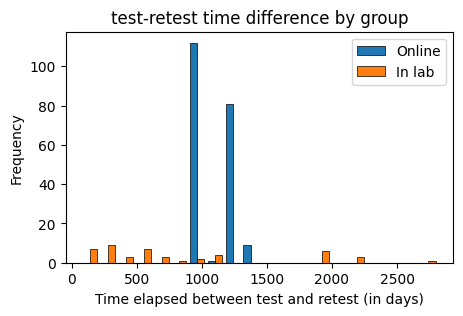

In [ ]:
fig, ax = plt.subplots(figsize=(5, 3))
format = t_rt_all['format'].unique()
colors = sns.color_palette(n_colors=len(format))
hist_data = [t_rt_all[t_rt_all['format'] == f]['T2_T1_diff'] for f in format]
n, bins, patches = ax.hist(hist_data, bins=20, stacked=False, label=format, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('Time elapsed between test and retest (in days)')
plt.ylabel('Frequency')
plt.title('test-retest time difference by group')
plt.legend()
plt.show()

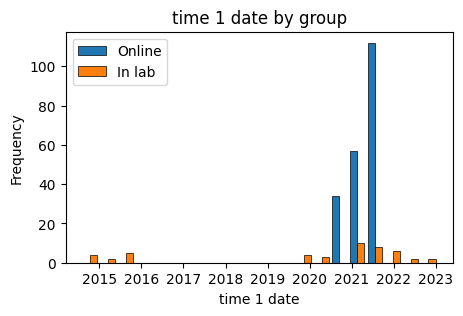

In [ ]:
fig, ax = plt.subplots(figsize=(5, 3))
format = t_rt_all['format'].unique()
colors = sns.color_palette(n_colors=len(format))
hist_data = [t_rt_all[t_rt_all['format'] == f]['date_T1'] for f in format]
n, bins, patches = ax.hist(hist_data, bins=20, stacked=False, label=format, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('time 1 date')
plt.ylabel('Frequency')
plt.title('time 1 date by group')
plt.legend()
plt.show()

Create a new t_rt_cutoff dataframe excluding test-retest time elapsed < 6 months (183 days) - *when cleaning the code for the paper, we probably want to apply this exclusion criteria from the get-go*

In [ ]:
t_rt_cutoff = t_rt_all.copy()
t_rt_cutoff = t_rt_cutoff[t_rt_cutoff['T2_T1_diff'] > 183]
t_rt_cutoff

,ParticipantID,Sex,Race,Education,date_T1,date_ordinal_T1,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,...,SRS_59_T2,SRS_60_T2,SRS_61_T2,SRS_62_T2,SRS_63_T2,SRS_64_T2,SRS_65_T2,format,Education_num,T2_T1_diff
0,55b249bdfdf99b28e3c14b05,f,African American / Black,Some College,2020-11-17,737746,35.0,33.0,2.0,1.0,...,2.0,2.0,0.0,0.0,0.0,0.0,0.0,Online,2.0,1241
1,55cf5cc434e9060005e56c39,f,Caucasian / White,Graduate Degree,2020-11-13,737742,60.0,39.0,4.0,6.0,...,0.0,1.0,2.0,0.0,0.0,3.0,2.0,Online,4.0,1255
2,55ea70c37480920010aa9982,m,African American / Black,Some College,2020-11-14,737743,34.0,37.0,4.0,5.0,...,1.0,1.0,0.0,0.0,0.0,2.0,0.0,Online,2.0,1244
3,56a37d86dbe850000bfcef9d,f,Caucasian / White,Bachelors Degree,2020-11-14,737743,57.0,57.0,7.0,11.0,...,3.0,1.0,2.0,0.0,0.0,3.0,0.0,Online,3.0,1244
4,56d0f57421cd29000a9737e4,m,Caucasian / White,Bachelors Degree,2020-11-17,737746,38.0,67.0,6.0,6.0,...,0.0,1.0,1.0,1.0,0.0,3.0,1.0,Online,3.0,1240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48,CP0288,m,Asian,Bachelors Degree,2022-02-01,738187,23.0,63.0,6.0,7.0,...,1.0,3.0,0.0,2.0,0.0,0.0,1.0,In lab,3.0,204
49,CP0297,m,African American / Black,Bachelors Degree,2022-02-17,738203,29.0,34.0,8.0,4.0,...,2.0,1.0,0.0,0.0,0.0,0.0,1.0,In lab,3.0,211
50,CP0299,m,Asian,Graduate Degree,2022-02-25,738211,25.0,60.0,11.0,7.0,...,0.0,1.0,0.0,0.0,0.0,1.0,2.0,In lab,4.0,196
52,CP0353,m,Caucasian / White,Bachelors Degree,2022-06-08,738314,31.0,30.0,4.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,In lab,3.0,310


In [ ]:
print('N in lab =', len(t_rt_cutoff[t_rt_cutoff['format'] == 'In lab']))
print('N online =', len(t_rt_cutoff[t_rt_cutoff['format'] == 'Online']))

N in lab = 44
N online = 203


In [ ]:
t_rt_cutoff.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_test_retest_all_excl.csv')

### Summary of variables after exclusions

In [ ]:
for g in t_rt_cutoff['Sex'].unique().tolist():
  ng = t_rt_cutoff.loc[t_rt_cutoff['format']=='Online','Sex'].tolist().count(g)
  print("Online: Number of", g, "=", ng)

for g in t_rt_cutoff['Sex'].unique().tolist():
  ng = t_rt_cutoff.loc[t_rt_cutoff['format']=='In lab','Sex'].tolist().count(g)
  print("In-lab: Number of", g, "=", ng)

Online: Number of f = 108
Online: Number of m = 95
Online: Number of nan = 0
In-lab: Number of f = 20
In-lab: Number of m = 23
In-lab: Number of nan = 1


In [ ]:
def summary_var_trt(var):
  mean_online = np.mean(t_rt_cutoff.loc[t_rt_cutoff['format']=='Online',var])
  mean_inlab = np.mean(t_rt_cutoff.loc[t_rt_cutoff['format']=='In lab',var])
  sd_online = np.std(t_rt_cutoff.loc[t_rt_cutoff['format']=='Online',var])
  sd_inlab = np.std(t_rt_cutoff.loc[t_rt_cutoff['format']=='In lab',var])
  na_online = np.sum(t_rt_cutoff.loc[t_rt_cutoff['format']=='Online',var].isna())
  na_inlab = np.sum(t_rt_cutoff.loc[t_rt_cutoff['format']=='In lab',var].isna())
  print("Online, mean", var, "=", mean_online, ", SD =", sd_online, ", missing =", na_online)
  print("In-lab, mean", var, "=", mean_inlab, ", SD =", sd_inlab, ", missing =", na_inlab)

In [ ]:
summary_var_trt('age_T1')

Online, mean age_T1 = 34.19211822660098 , SD = 11.81289005176909 , missing = 0
In-lab, mean age_T1 = 32.02272727272727 , SD = 8.175597382575994 , missing = 0


In [ ]:
summary_var_trt('SRS_T1')
summary_var_trt('SRS_T2')
summary_var_trt('STAI_trait_T1')
summary_var_trt('STAI_trait_T2')
summary_var_trt('LSAS_T1')
summary_var_trt('LSAS_T2')
summary_var_trt('BDI_T1')
summary_var_trt('BDI_T2')

Online, mean SRS_T1 = 56.76354679802956 , SD = 29.104081125490623 , missing = 0
In-lab, mean SRS_T1 = 37.18181818181818 , SD = 23.48042969181775 , missing = 0
Online, mean SRS_T2 = 55.46305418719212 , SD = 29.848754453009906 , missing = 0
In-lab, mean SRS_T2 = 35.29545454545455 , SD = 23.437130162371286 , missing = 0
Online, mean STAI_trait_T1 = 44.6551724137931 , SD = 13.427026283674667 , missing = 0
In-lab, mean STAI_trait_T1 = 38.121212121212125 , SD = 9.609835793878458 , missing = 11
Online, mean STAI_trait_T2 = 44.18226600985221 , SD = 14.033432311854654 , missing = 0
In-lab, mean STAI_trait_T2 = 37.58064516129032 , SD = 10.609716160346693 , missing = 13
Online, mean LSAS_T1 = 56.75369458128079 , SD = 31.17799564530157 , missing = 0
In-lab, mean LSAS_T1 = 26.757575757575758 , SD = 17.77303081711386 , missing = 11
Online, mean LSAS_T2 = 56.30049261083744 , SD = 31.51250201124255 , missing = 0
In-lab, mean LSAS_T2 = 32.473684210526315 , SD = 25.18430676987605 , missing = 25
Online, 

In [ ]:
t_rt_cutoff[t_rt_cutoff['format']=='Online']['date_T1'].dt.year.value_counts()

,count
date_T1,
2021,134
2020,69


In [ ]:
t_rt_cutoff[t_rt_cutoff['format']=='In lab']['date_T1'].dt.year.value_counts()

,count
date_T1,
2021,14
2020,11
2015,7
2014,4
2022,4
2019,3
2023,1


### 1) How correlated are SRS scores between time 1 and time 2, and does this correlation vary between in-lab and online participants?

Text(0.5, 1.0, 'R = 0.76')

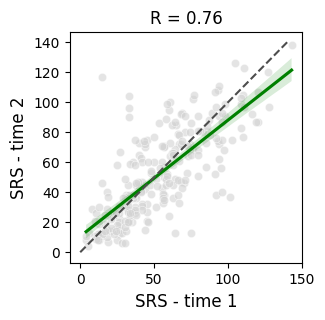

In [ ]:
#plot correlation, all subjects
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=t_rt_all, x='SRS_T1',  y='SRS_T2', color = 'lightgrey', alpha=0.6)
sns.regplot(data=t_rt_all, x='SRS_T1', y='SRS_T2', scatter=False, color='green')
ax.plot([0, 140], [0, 140], ls='--', c='0.3')
ax.set_xlabel('SRS - time 1', fontsize = 12)
ax.set_ylabel('SRS - time 2', fontsize = 12)
r_value, p_value = pearsonr(t_rt_all['SRS_T1'], t_rt_all['SRS_T2'])
ax.set_title(f'R = {r_value:.2f}')

In [ ]:
#paired t-test between time 1 and time 2
print("N =", len(t_rt_all))
print(np.mean(t_rt_all['SRS_T1']))
print(np.mean(t_rt_all['SRS_T2']))
correlation_coefficient, p_value = pearsonr(t_rt_all['SRS_T1'], t_rt_all['SRS_T2'])
print(f"Correlation coefficient: {correlation_coefficient:.2f}, p-value: {p_value:.3f}")

N = 249
53.032128514056225
51.69879518072289
Correlation coefficient: 0.76, p-value: 0.000


Text(0.5, 1.0, 'R = 0.76')

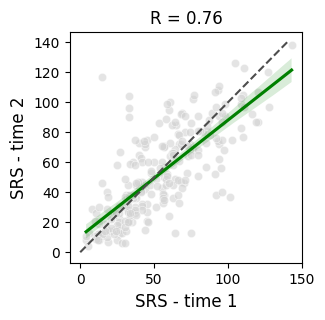

In [ ]:
#plot correlation, subjects with time elapsed  > 6 months
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=t_rt_cutoff, x='SRS_T1',  y='SRS_T2', color = 'lightgrey', alpha=0.6)
sns.regplot(data=t_rt_cutoff, x='SRS_T1', y='SRS_T2', scatter=False, color='green')
ax.plot([0, 140], [0, 140], ls='--', c='0.3')
ax.set_xlabel('SRS - time 1', fontsize = 12)
ax.set_ylabel('SRS - time 2', fontsize = 12)
r_value, p_value = pearsonr(t_rt_cutoff['SRS_T1'], t_rt_cutoff['SRS_T2'])
ax.set_title(f'R = {r_value:.2f}')

In [ ]:
#paired t-test between time 1 and time 2
print("N =", len(t_rt_cutoff))
print(np.mean(t_rt_cutoff['SRS_T1']))
print(np.mean(t_rt_cutoff['SRS_T2']))
ttest_rel(t_rt_cutoff['SRS_T1'], t_rt_cutoff['SRS_T2'])

N = 247
53.2753036437247
51.87044534412956


TtestResult(statistic=1.0732457325763616, pvalue=0.28421253404348074, df=246)

Text(0.5, 1.0, 'R-online = 0.73, R-in-lab = 0.80')

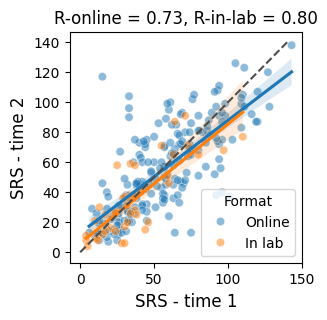

In [ ]:
#plot correlation, broken down by format
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=t_rt_all, x='SRS_T1',  y='SRS_T2', hue = 'format', alpha=0.5)
sns.regplot(data=t_rt_all[t_rt_all['format'] == 'Online'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[0])
sns.regplot(data=t_rt_all[t_rt_all['format'] == 'In lab'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[1])
ax.plot([0, 140], [0, 140], ls='--', c='0.3')
ax.set_xlabel('SRS - time 1', fontsize = 12)
ax.set_ylabel('SRS - time 2', fontsize = 12)
r1, p1 = pearsonr(t_rt_all[t_rt_all['format'] == 'Online']['SRS_T1'], t_rt_all[t_rt_all['format'] == 'Online']['SRS_T2'])
r2, p2 = pearsonr(t_rt_all[t_rt_all['format'] == 'In lab']['SRS_T1'], t_rt_all[t_rt_all['format'] == 'In lab']['SRS_T2'])
ax.legend(title='Format', loc='lower right')
ax.set_title(f'R-online = {r1:.2f}, R-in-lab = {r2:.2f}')

In [ ]:
n1 = np.sum(t_rt_all['format'] == 'Online')
n2 = np.sum(t_rt_all['format'] == 'In lab')
print(f'Online, N = {n1}, R = {r1:.2f}')
print(f'In lab, N = {n2}, R = {r2:.2f}')

Online, N = 203, R = 0.73
In lab, N = 46, R = 0.80


Text(0.5, 1.0, 'R-online = 0.73, R-in-lab = 0.80')

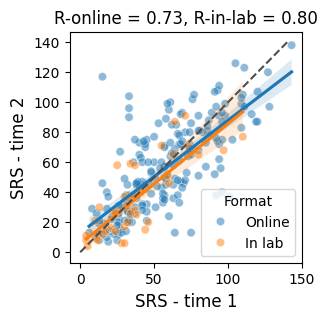

In [ ]:
#plot correlation, broken down by format, subjects with time elapsed  > 6 months
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=t_rt_cutoff, x='SRS_T1',  y='SRS_T2', hue = 'format', alpha=0.5)
sns.regplot(data=t_rt_cutoff[t_rt_cutoff['format'] == 'Online'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[0])
sns.regplot(data=t_rt_cutoff[t_rt_cutoff['format'] == 'In lab'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[1])
ax.plot([0, 140], [0, 140], ls='--', c='0.3')
ax.set_xlabel('SRS - time 1', fontsize = 12)
ax.set_ylabel('SRS - time 2', fontsize = 12)
r1, p1 = pearsonr(t_rt_cutoff[t_rt_cutoff['format'] == 'Online']['SRS_T1'], t_rt_cutoff[t_rt_cutoff['format'] == 'Online']['SRS_T2'])
r2, p2 = pearsonr(t_rt_cutoff[t_rt_cutoff['format'] == 'In lab']['SRS_T1'], t_rt_cutoff[t_rt_cutoff['format'] == 'In lab']['SRS_T2'])
ax.legend(title='Format', loc='lower right')
ax.set_title(f'R-online = {r1:.2f}, R-in-lab = {r2:.2f}')

In [ ]:
n1 = np.sum(t_rt_cutoff['format'] == 'Online')
n2 = np.sum(t_rt_cutoff['format'] == 'In lab')
print(f'Online, N = {n1}, R = {r1:.2f}, P = {p1:.3f}')
print(f'In lab, N = {n2}, R = {r2:.2f}, P = {p2:.3f}')

Online, N = 203, R = 0.73, P = 0.000
In lab, N = 44, R = 0.80, P = 0.000


In [ ]:
#check whether the two correlations are different
z1 = 0.5 * np.log((1 + r1) / (1 - r1))
z2 = 0.5 * np.log((1 + r2) / (1 - r2))
se = np.sqrt(1 / (n1 - 3) + 1 / (n2 - 3))
z_stat = (z1 - z2) / se
p_value = 2 * (1 - norm.cdf(abs(z_stat)))
print("Z-statistic:", z_stat)
print("P-value:", p_value)

Z-statistic: -1.0045425411249176
P-value: 0.3151171768998884


### 2) Is the SRS difference between time 1 and time 2 influence by study format or time elapsed?

Maybe SRS will change more between time 1 and time 2 in online samples? or if more time has elapsed?

In [ ]:
t_rt_all['SRS_diff'] = t_rt_all['SRS_T2'] - t_rt_all['SRS_T1']
t_rt_all['SRS_diff_abs'] = np.abs(t_rt_all['SRS_T2'] - t_rt_all['SRS_T1'])
t_rt_all['date_ordinal_T1_z'] = zscore(t_rt_all['date_ordinal_T1'].astype(float))
t_rt_all['date_ordinal_T2_z'] = zscore(t_rt_all['date_ordinal_T2'].astype(float))
t_rt_all['T2_T1_diff_z'] = zscore(t_rt_all['T2_T1_diff'].astype(float))

In [ ]:
#continuous interaction with time difference between t1 and t2 in days
model = smf.ols('SRS_diff ~ format*T2_T1_diff_z', data=t_rt_all).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               SRS_diff   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                 -0.005
Method:                 Least Squares   F-statistic:                    0.6066
Date:                Wed, 18 Dec 2024   Prob (F-statistic):              0.611
Time:                        21:42:07   Log-Likelihood:                -1104.0
No. Observations:                 249   AIC:                             2216.
Df Residuals:                     245   BIC:                             2230.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [ ]:
#continuous interaction with time difference between t1 and t2 in days
model = smf.ols('SRS_diff_abs ~ format*T2_T1_diff_z', data=t_rt_all).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           SRS_diff_abs   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     1.933
Date:                Wed, 18 Dec 2024   Prob (F-statistic):              0.125
Time:                        21:42:07   Log-Likelihood:                -1011.1
No. Observations:                 249   AIC:                             2030.
Df Residuals:                     245   BIC:                             2044.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

Repeat the above with time elapsed > 6-month

In [ ]:
t_rt_cutoff['SRS_diff'] = t_rt_cutoff['SRS_T2'] - t_rt_cutoff['SRS_T1']
t_rt_cutoff['SRS_diff_abs'] = np.abs(t_rt_cutoff['SRS_T2'] - t_rt_cutoff['SRS_T1'])
t_rt_cutoff['date_ordinal_T1_z'] = zscore(t_rt_cutoff['date_ordinal_T1'].astype(float))
t_rt_cutoff['date_ordinal_T2_z'] = zscore(t_rt_cutoff['date_ordinal_T2'].astype(float))
t_rt_cutoff['T2_T1_diff_z'] = zscore(t_rt_cutoff['T2_T1_diff'].astype(float))

In [ ]:
#continuous interaction with time difference between t1 and t2 in days
model = smf.ols('SRS_diff ~ format*T2_T1_diff_z', data=t_rt_cutoff).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               SRS_diff   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.6886
Date:                Wed, 18 Dec 2024   Prob (F-statistic):              0.560
Time:                        21:42:07   Log-Likelihood:                -1095.8
No. Observations:                 247   AIC:                             2200.
Df Residuals:                     243   BIC:                             2214.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [ ]:
#continuous interaction with time difference between t1 and t2 in days
model = smf.ols('SRS_diff_abs ~ format*T2_T1_diff_z', data=t_rt_cutoff).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           SRS_diff_abs   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.746
Date:                Wed, 18 Dec 2024   Prob (F-statistic):              0.158
Time:                        21:42:07   Log-Likelihood:                -1003.9
No. Observations:                 247   AIC:                             2016.
Df Residuals:                     243   BIC:                             2030.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

### 3) Are differences in SRS between time 1 and time 2 driven by specific SRS items, subscales or factors?

In other words what items/subscales/factors are more stable over time? and do those vary between online and in-lab samples?

#### Looking for items that significantly differ between T1 and T2

In [ ]:
def cohens_d_paired(x, y):
    """
    Calculate Cohen's d for paired samples.
    Parameters:
    x: First set of observations
    y: Second set of observations
    Returns:
    Cohen's d
    """
    diff = np.array(y) - np.array(x)
    mean_diff = np.mean(diff)
    std_diff = np.std(diff, ddof=1)  # Use ddof=1 for unbiased standard deviation
    return mean_diff / std_diff

In [ ]:
item_names = []
mean_item_T1 = []
mean_item_T2 = []
mean_item_diff = []
t_stat_all = []
p_value_all = []
d_all = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  col_name_T1 = col_name + '_T1'
  col_name_T2 = col_name + '_T2'
  if col_name in reverse_coded_fields:
    sample1 = 3-t_rt_all[col_name_T1]
    sample2 = 3-t_rt_all[col_name_T2]
  else:
    sample1 = t_rt_all[col_name_T1]
    sample2 = t_rt_all[col_name_T2]

  diff = sample2 - sample1
  t_stat, p_value = ttest_rel(sample1, sample2)
  d = cohens_d_paired(sample1, sample2)

  item_names.append(col_name)
  mean_item_T1.append(np.mean(sample1))
  mean_item_T2.append(np.mean(sample2))
  mean_item_diff.append(np.mean(diff))
  t_stat_all.append(t_stat)
  p_value_all.append(p_value)
  d_all.append(d)

df_item_trt = pd.DataFrame(data = {'SRS_item': item_names, 'T1 mean': mean_item_T1, 'T2 mean': mean_item_T2, 'diff_mean': mean_item_diff,
                                    'T': t_stat_all, 'p': p_value_all, 'd': d_all})
df_item_trt.head()

,SRS_item,T1 mean,T2 mean,diff_mean,T,p,d
0,SRS_1,1.301205,1.510040,0.208835,-2.540904,0.011667,0.161023
1,SRS_2,0.863454,0.815261,-0.048193,0.839670,0.401902,-0.053212
2,SRS_3,1.590361,1.646586,0.056225,-0.975331,0.330347,0.061809
3,SRS_4,0.662651,0.646586,-0.016064,0.238593,0.811619,-0.015120
4,SRS_5,0.502008,0.433735,-0.068273,1.309568,0.191554,-0.082991


In [ ]:
df_item_trt = pd.merge(df_item_trt, SRS_item_description, on='SRS_item', how='left')
df_item_trt = df_item_trt.drop(columns=['index'])
df_item_trt.head()

,SRS_item,T1 mean,T2 mean,diff_mean,T,p,d,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper
0,SRS_1,1.301205,1.510040,0.208835,-2.540904,0.011667,0.161023,I am much more uncomfortable in social situati...,mot,no,2,2
1,SRS_2,0.863454,0.815261,-0.048193,0.839670,0.401902,-0.053212,My facial expressions send the wrong message t...,awr,no,1,1
2,SRS_3,1.590361,1.646586,0.056225,-0.975331,0.330347,0.061809,I feel self-confident when interacting with ot...,mot,yes,4,4
3,SRS_4,0.662651,0.646586,-0.016064,0.238593,0.811619,-0.015120,"When under stress, I engage in rigid or inflex...",rrb,no,1,1
4,SRS_5,0.502008,0.433735,-0.068273,1.309568,0.191554,-0.082991,I do not recognize when others are trying to t...,cog,no,1,1


In [ ]:
df_item_trt

,SRS_item,T1 mean,T2 mean,diff_mean,T,p,d,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper
0,SRS_1,1.301205,1.510040,0.208835,-2.540904,0.011667,0.161023,I am much more uncomfortable in social situati...,mot,no,2,2
1,SRS_2,0.863454,0.815261,-0.048193,0.839670,0.401902,-0.053212,My facial expressions send the wrong message t...,awr,no,1,1
2,SRS_3,1.590361,1.646586,0.056225,-0.975331,0.330347,0.061809,I feel self-confident when interacting with ot...,mot,yes,4,4
3,SRS_4,0.662651,0.646586,-0.016064,0.238593,0.811619,-0.015120,"When under stress, I engage in rigid or inflex...",rrb,no,1,1
4,SRS_5,0.502008,0.433735,-0.068273,1.309568,0.191554,-0.082991,I do not recognize when others are trying to t...,cog,no,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
60,SRS_61,0.566265,0.538153,-0.028112,0.572688,0.567375,-0.036293,I tend to be inflexible.,com,no,1,1
61,SRS_62,0.417671,0.429719,0.012048,-0.265710,0.790684,0.016839,When I tell someone my reason for doing someth...,cog,no,1,1
62,SRS_63,0.176707,0.172691,-0.004016,0.109546,0.912858,-0.006942,My way of greeting another person is unusual.,rrb,no,<NA>,1
63,SRS_64,1.469880,1.417671,-0.052209,0.780481,0.435852,-0.049461,I am much more tense in social settings than w...,mot,no,2,2


In [ ]:
df_item_trt_pord = df_item_trt.sort_values(by='p', ascending=True).reset_index(drop=True)
for n in range(1,66):
  df_item_trt_pord.loc[n-1,'pFDR'] = 0.05 * n / 65
  df_item_trt_pord.loc[n-1,'isSigFDR'] = df_item_trt_pord.loc[n-1,'p'] <= df_item_trt_pord.loc[n-1,'pFDR']
df_item_trt_pord

,SRS_item,T1 mean,T2 mean,diff_mean,T,p,d,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR
0,SRS_21,1.341365,1.048193,-0.293173,4.574839,0.000008,-0.289919,I am able to imitate others\ actions and expre...,com,yes,3,3,0.000769,True
1,SRS_1,1.301205,1.510040,0.208835,-2.540904,0.011667,0.161023,I am much more uncomfortable in social situati...,mot,no,2,2,0.001538,False
2,SRS_26,1.064257,0.947791,-0.116466,2.503712,0.012933,-0.158666,I offer comfort to others when they are sad.,com,yes,3,3,0.002308,False
3,SRS_55,0.305221,0.188755,-0.116466,2.449325,0.015005,-0.155220,I get too close to others or invade their pers...,com,no,<NA>,1,0.003077,False
4,SRS_12,1.257028,1.148594,-0.108434,2.214385,0.027712,-0.140331,I am able to communicate my feelings to others.,com,yes,<NA>,4,0.003846,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,SRS_57,1.232932,1.236948,0.004016,-0.069703,0.944486,0.004417,I tend to isolate myself.,com,no,2,2,0.046923,False
61,SRS_23,1.309237,1.305221,-0.004016,0.063246,0.949622,-0.004008,I do not join group activities or social event...,mot,no,2,2,0.047692,False
62,SRS_39,0.453815,0.453815,0.000000,0.000000,1.000000,0.000000,People think I am interested in too few topics...,rrb,no,1,1,0.048462,False
63,SRS_43,1.811245,1.811245,0.000000,0.000000,1.000000,0.000000,I enjoy small talk (casual conversation with o...,mot,yes,<NA>,2,0.049231,False


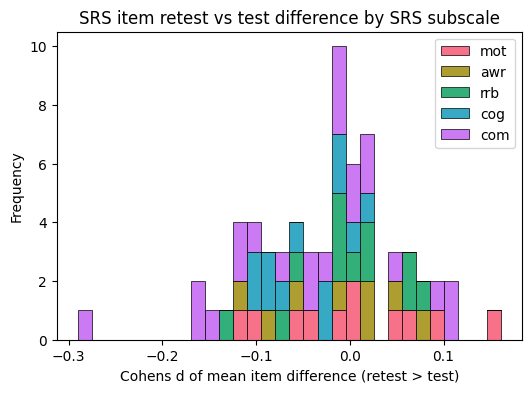

In [ ]:
#plot cohen's d of mean difference colored by subscale
fig, ax = plt.subplots(figsize=(6, 4))
subscales = df_item_trt['subscale'].unique()
colors = sns.color_palette("husl", n_colors=len(subscales))
hist_data = [df_item_trt[df_item_trt['subscale'] == subscale]['d'] for subscale in subscales]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=subscales, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('Cohens d of mean item difference (retest > test)')
plt.ylabel('Frequency')
plt.title('SRS item retest vs test difference by SRS subscale')
plt.legend()
plt.show()

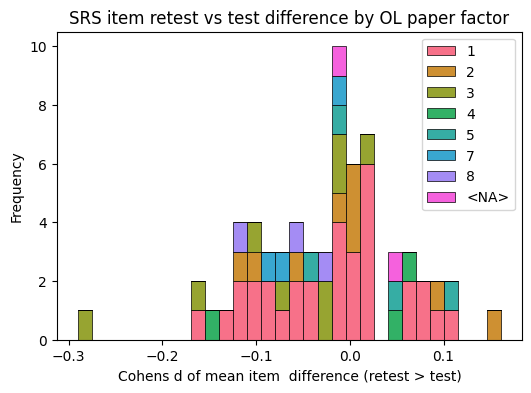

In [ ]:
#plot cohen's d of mean difference colored by OL paper factor
fig, ax = plt.subplots(figsize=(6, 4))
df_item_trt['Factor_OLpaper'] = df_item_trt['Factor_OLpaper'].astype(str)
factors = np.sort(df_item_trt['Factor_OLpaper'].unique())
colors = sns.color_palette("husl", n_colors=len(factors))
hist_data = [df_item_trt[df_item_trt['Factor_OLpaper'] == f]['d'] for f in factors]
n, bins, patches = ax.hist(hist_data, bins=30, stacked=True, label=factors, color=colors,edgecolor='black', linewidth=0.5)
plt.xlabel('Cohens d of mean item  difference (retest > test)')
plt.ylabel('Frequency')
plt.title('SRS item retest vs test difference by OL paper factor')
plt.legend()
plt.show()

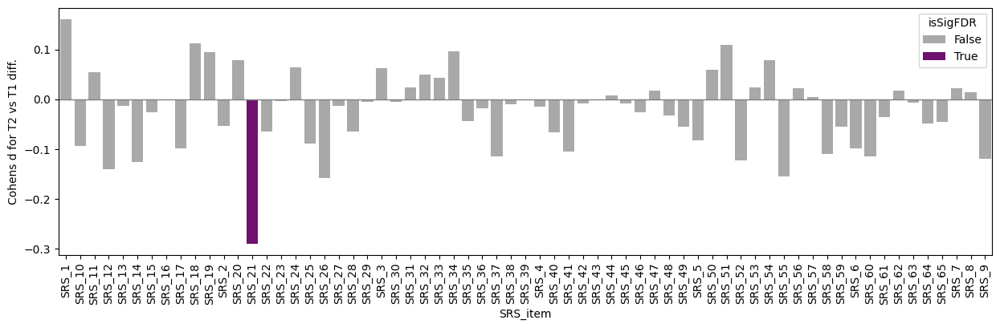

In [ ]:
df_item_trt_pord.sort_values(by='SRS_item', ascending=True, inplace=True)
plt.figure(figsize=(15, 4))
#clrs = ['purple' if x else 'darkgray' for x in df_item_trt_pord['isSigFDR']]
my_colors = sns.color_palette(["darkgrey", "purple"])
sns.barplot(x='SRS_item', y='d', hue='isSigFDR', palette = my_colors, data = df_item_trt_pord)
plt.axhline(y=0, color='grey', linewidth=1)
plt.ylabel('Cohens d for T2 vs T1 diff.')
plt.xticks(rotation=90)
plt.show()

#### Repeat for > 6-month cutoff

In [ ]:
item_names = []
mean_item_T1 = []
mean_item_T2 = []
mean_item_diff = []
t_stat_all = []
p_value_all = []
d_all = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  col_name_T1 = col_name + '_T1'
  col_name_T2 = col_name + '_T2'
  if col_name in reverse_coded_fields:
    sample1 = 3-t_rt_cutoff[col_name_T1]
    sample2 = 3-t_rt_cutoff[col_name_T2]
  else:
    sample1 = t_rt_cutoff[col_name_T1]
    sample2 = t_rt_cutoff[col_name_T2]

  diff = sample2 - sample1
  t_stat, p_value = ttest_rel(sample1, sample2)
  d = cohens_d_paired(sample1, sample2)

  item_names.append(col_name)
  mean_item_T1.append(np.mean(sample1))
  mean_item_T2.append(np.mean(sample2))
  mean_item_diff.append(np.mean(diff))
  t_stat_all.append(t_stat)
  p_value_all.append(p_value)
  d_all.append(d)

df_item_trt_cutoff = pd.DataFrame(data = {'SRS_item': item_names, 'T1 mean': mean_item_T1, 'T2 mean': mean_item_T2, 'diff_mean': mean_item_diff,
                                    'T': t_stat_all, 'p': p_value_all, 'd': d_all})
df_item_trt_cutoff.head()

,SRS_item,T1 mean,T2 mean,diff_mean,T,p,d
0,SRS_1,1.303644,1.510121,0.206478,-2.494007,0.013289,0.158690
1,SRS_2,0.866397,0.821862,-0.044534,0.771416,0.441201,-0.049084
2,SRS_3,1.599190,1.655870,0.056680,-0.975330,0.330355,0.062059
3,SRS_4,0.668016,0.647773,-0.020243,0.298790,0.765353,-0.019012
4,SRS_5,0.502024,0.437247,-0.064777,1.235743,0.217733,-0.078628


In [ ]:
df_item_trt_cutoff = pd.merge(df_item_trt_cutoff, SRS_item_description, on='SRS_item', how='left')
df_item_trt_cutoff = df_item_trt_cutoff.drop(columns=['index'])
df_item_trt_cutoff_pord = df_item_trt_cutoff.sort_values(by='p', ascending=True).reset_index(drop=True)
for n in range(1,66):
  df_item_trt_cutoff_pord.loc[n-1,'pFDR'] = 0.05 * n / 65
  df_item_trt_cutoff_pord.loc[n-1,'isSigFDR'] = df_item_trt_cutoff_pord.loc[n-1,'p'] <= df_item_trt_cutoff_pord.loc[n-1,'pFDR']
df_item_trt_cutoff_pord

,SRS_item,T1 mean,T2 mean,diff_mean,T,p,d,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR
0,SRS_21,1.352227,1.056680,-0.295547,4.576328,0.000008,-0.291185,I am able to imitate others\ actions and expre...,com,yes,3,3,0.000769,True
1,SRS_26,1.064777,0.947368,-0.117409,2.503927,0.012931,-0.159321,I offer comfort to others when they are sad.,com,yes,3,3,0.001538,False
2,SRS_1,1.303644,1.510121,0.206478,-2.494007,0.013289,0.158690,I am much more uncomfortable in social situati...,mot,no,2,2,0.002308,False
3,SRS_55,0.307692,0.190283,-0.117409,2.449525,0.015003,-0.155860,I get too close to others or invade their pers...,com,no,<NA>,1,0.003077,False
4,SRS_12,1.259109,1.153846,-0.105263,2.138185,0.033487,-0.136049,I am able to communicate my feelings to others.,com,yes,<NA>,4,0.003846,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,SRS_39,0.457490,0.453441,-0.004049,0.075441,0.939925,-0.004800,People think I am interested in too few topics...,rrb,no,1,1,0.046923,False
61,SRS_43,1.813765,1.817814,0.004049,-0.072980,0.941881,0.004644,I enjoy small talk (casual conversation with o...,mot,yes,<NA>,2,0.047692,False
62,SRS_57,1.238866,1.234818,-0.004049,0.070045,0.944215,-0.004457,I tend to isolate myself.,com,no,2,2,0.048462,False
63,SRS_29,0.724696,0.724696,0.000000,0.000000,1.000000,0.000000,I am regarded by others as odd or weird.,rrb,no,<NA>,7,0.049231,False


In [ ]:
#save data
df_item_trt_cutoff_pord.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/item_T1_T2_diff_data.csv')

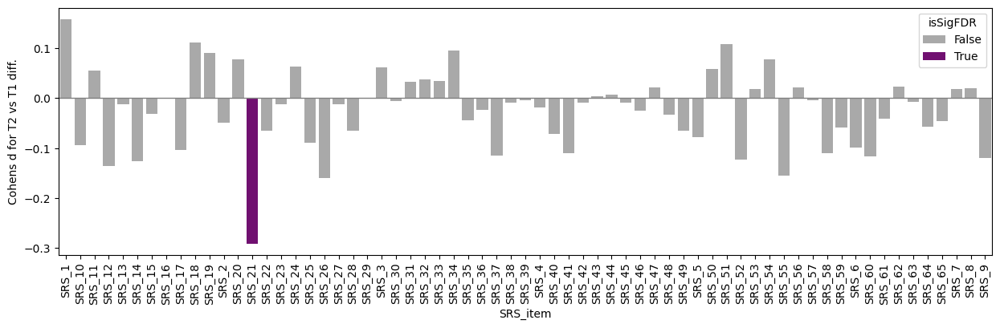

In [ ]:
df_item_trt_cutoff_pord.sort_values(by='SRS_item', ascending=True, inplace=True)
plt.figure(figsize=(15, 4))
my_colors = sns.color_palette(["darkgrey", "purple"])
sns.barplot(x='SRS_item', y='d', hue='isSigFDR', palette = my_colors, data = df_item_trt_cutoff_pord)
plt.axhline(y=0, color='grey', linewidth=1)
plt.ylabel('Cohens d for T2 vs T1 diff.')
plt.xticks(rotation=90)
plt.show()

#### Further break down by format (online vs in-lab)

Not needed for now - if we need this later, need to rerun with 6-month cutoff data.

In [ ]:
#create item-by-item summary df broken down by format
item_names = []
mean_item_T1_online = []
mean_item_T2_online = []
mean_item_diff_online = []
t_stat_all_online = []
p_value_all_online = []
d_all_online = []
mean_item_T1_inlab = []
mean_item_T2_inlab = []
mean_item_diff_inlab = []
t_stat_all_inlab = []
p_value_all_inlab = []
d_all_inlab = []
t_stat_all_interaction = []
p_value_all_interaction = []
d_all_interaction = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  col_name_T1 = col_name + '_T1'
  col_name_T2 = col_name + '_T2'
  if col_name in reverse_coded_fields:
    sample1_online = 3-t_rt_all.loc[t_rt_all['format']=='Online', col_name_T1]
    sample2_online = 3-t_rt_all.loc[t_rt_all['format']=='Online',col_name_T2]
    sample1_inlab = 3-t_rt_all.loc[t_rt_all['format']=='In lab', col_name_T1]
    sample2_inlab = 3-t_rt_all.loc[t_rt_all['format']=='In lab',col_name_T2]
  else:
    sample1_online = t_rt_all.loc[t_rt_all['format']=='Online', col_name_T1]
    sample2_online = t_rt_all.loc[t_rt_all['format']=='Online',col_name_T2]
    sample1_inlab = t_rt_all.loc[t_rt_all['format']=='In lab', col_name_T1]
    sample2_inlab = t_rt_all.loc[t_rt_all['format']=='In lab',col_name_T2]

  t_stat_online, p_value_online = ttest_rel(sample1_online, sample2_online)
  d_online = cohens_d_paired(sample1_online, sample2_online)
  t_stat_inlab, p_value_inlab = ttest_rel(sample1_inlab, sample2_inlab)
  d_inlab = cohens_d_paired(sample1_inlab, sample2_inlab)
  t_stat_interaction, p_value_interaction = ttest_ind(sample2_online - sample1_online, sample2_inlab - sample1_inlab)
  d_interaction, df = cohen_d(sample2_online - sample1_online, sample2_inlab - sample1_inlab)

  item_names.append(col_name)
  mean_item_T1_online.append(np.mean(sample1_online))
  mean_item_T2_online.append(np.mean(sample2_online))
  mean_item_diff_online.append(np.mean(sample2_online - sample1_online))
  t_stat_all_online.append(t_stat_online)
  p_value_all_online.append(p_value_online)
  d_all_online.append(d_online)

  mean_item_T1_inlab.append(np.mean(sample1_inlab))
  mean_item_T2_inlab.append(np.mean(sample2_inlab))
  mean_item_diff_inlab.append(np.mean(sample2_inlab - sample1_inlab))
  t_stat_all_inlab.append(t_stat_inlab)
  p_value_all_inlab.append(p_value_inlab)
  d_all_inlab.append(d_inlab)

  t_stat_all_interaction.append(t_stat_interaction)
  p_value_all_interaction.append(p_value_interaction)
  d_all_interaction.append(d_interaction)

df_item_trt_format = pd.DataFrame(data = {'SRS_item': item_names, 'T1 mean online': mean_item_T1_online, 'T2 mean online': mean_item_T2_online, 'diff_mean online': mean_item_diff_online,
                                          'T1 mean in lab': mean_item_T1_inlab, 'T2 mean in lab': mean_item_T2_inlab, 'diff_mean in lab': mean_item_diff_inlab,
                                          'T online': t_stat_all_online, 'T in lab': t_stat_all_inlab, 'p online': p_value_all_online, 'p in lab': p_value_all_inlab,
                                          'd online': d_all_online, 'd in lab': d_all_inlab,
                                          'T interaction': t_stat_all_interaction, 'p interaction': p_value_all_interaction, 'd interaction': d_all_interaction})
df_item_trt_format.head()

,SRS_item,T1 mean online,T2 mean online,diff_mean online,T1 mean in lab,T2 mean in lab,diff_mean in lab,T online,T in lab,p online,p in lab,d online,d in lab,T interaction,p interaction,d interaction
0,SRS_1,1.413793,1.635468,0.221675,0.804348,0.956522,0.152174,-2.330445,-1.021538,0.020770,0.312460,0.163565,0.150618,0.327582,0.743505,0.053492
1,SRS_2,0.911330,0.886700,-0.024631,0.652174,0.500000,-0.152174,0.372924,1.415177,0.709596,0.163900,-0.026174,-0.208656,0.861960,0.389545,0.140754
2,SRS_3,1.724138,1.778325,0.054187,1.000000,1.065217,0.065217,-0.866389,-0.443291,0.387305,0.659680,0.060809,0.065360,-0.074107,0.940985,-0.012101
3,SRS_4,0.724138,0.724138,0.000000,0.391304,0.304348,-0.086957,0.000000,0.892446,1.000000,0.376902,0.000000,-0.131584,0.500459,0.617197,0.081722
4,SRS_5,0.522167,0.438424,-0.083744,0.413043,0.413043,0.000000,1.445788,0.000000,0.149786,1.000000,-0.101474,0.000000,-0.622619,0.534109,-0.101671


In [ ]:
df_item_trt_format = pd.merge(df_item_trt_format, SRS_item_description, on='SRS_item', how='left')
df_item_trt_format = df_item_trt_format.drop(columns=['index'])
df_item_trt_format.head()

,SRS_item,T1 mean online,T2 mean online,diff_mean online,T1 mean in lab,T2 mean in lab,diff_mean in lab,T online,T in lab,p online,...,d online,d in lab,T interaction,p interaction,d interaction,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper
0,SRS_1,1.413793,1.635468,0.221675,0.804348,0.956522,0.152174,-2.330445,-1.021538,0.020770,...,0.163565,0.150618,0.327582,0.743505,0.053492,I am much more uncomfortable in social situati...,mot,no,2,2
1,SRS_2,0.911330,0.886700,-0.024631,0.652174,0.500000,-0.152174,0.372924,1.415177,0.709596,...,-0.026174,-0.208656,0.861960,0.389545,0.140754,My facial expressions send the wrong message t...,awr,no,1,1
2,SRS_3,1.724138,1.778325,0.054187,1.000000,1.065217,0.065217,-0.866389,-0.443291,0.387305,...,0.060809,0.065360,-0.074107,0.940985,-0.012101,I feel self-confident when interacting with ot...,mot,yes,4,4
3,SRS_4,0.724138,0.724138,0.000000,0.391304,0.304348,-0.086957,0.000000,0.892446,1.000000,...,0.000000,-0.131584,0.500459,0.617197,0.081722,"When under stress, I engage in rigid or inflex...",rrb,no,1,1
4,SRS_5,0.522167,0.438424,-0.083744,0.413043,0.413043,0.000000,1.445788,0.000000,0.149786,...,-0.101474,0.000000,-0.622619,0.534109,-0.101671,I do not recognize when others are trying to t...,cog,no,1,1


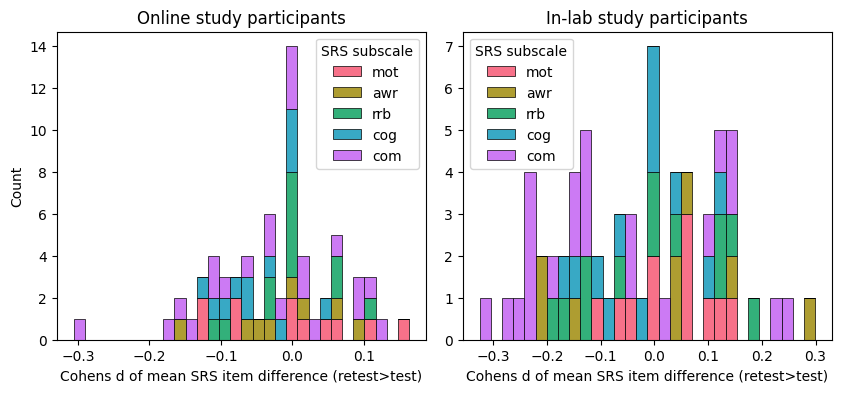

In [ ]:
subscales = df_item_trt_format['subscale'].unique()
colors = sns.color_palette("husl", n_colors=len(subscales))

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,4))
#subplot 1
hist_data = [df_item_trt_format[df_item_trt_format['subscale'] == subscale]['d online'] for subscale in subscales]
n, bins, patches = ax1.hist(hist_data, bins=30, stacked=True, label=subscales, color=colors,edgecolor='black', linewidth=0.5)
ax1.set_xlabel('Cohens d of mean SRS item difference (retest>test)')
ax1.set_ylabel('Count')
ax1.set_title('Online study participants')
ax1.legend(title='SRS subscale')
#subplot 2
hist_data = [df_item_trt_format[df_item_trt_format['subscale'] == subscale]['d in lab'] for subscale in subscales]
n, bins, patches = ax2.hist(hist_data, bins=30, stacked=True, label=subscales, color=colors,edgecolor='black', linewidth=0.5)
ax2.set_xlabel('Cohens d of mean SRS item difference (retest>test)')
ax2.set_ylabel('')
ax2.legend(title='SRS subscale')
ax2.set_title('In-lab study participants')
plt.subplots_adjust(wspace=0.1, hspace=0.2)

In [ ]:
df_item_trt_format_subset = df_item_trt_format[['SRS_item','question_text','subscale',	'is_rev',	'Factor_simplified', 'Factor_OLpaper', 'd online','d in lab']]
df_item_trt_format_long = df_item_trt_format_subset.melt(id_vars=['SRS_item','question_text','subscale',	'is_rev',	'Factor_simplified', 'Factor_OLpaper'], var_name='format', value_name='d')
df_item_trt_format_long['format'] = df_item_trt_format_long['format'].replace({'d online': 'Online', 'd in lab': 'In lab'})
df_item_trt_format_long.head()

,SRS_item,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,format,d
0,SRS_1,I am much more uncomfortable in social situati...,mot,no,2,2,Online,0.163565
1,SRS_2,My facial expressions send the wrong message t...,awr,no,1,1,Online,-0.026174
2,SRS_3,I feel self-confident when interacting with ot...,mot,yes,4,4,Online,0.060809
3,SRS_4,"When under stress, I engage in rigid or inflex...",rrb,no,1,1,Online,0.000000
4,SRS_5,I do not recognize when others are trying to t...,cog,no,1,1,Online,-0.101474


In [ ]:
df_item_trt_pord_online = df_item_trt_format[['SRS_item','diff_mean online', 'T online', 'p online', 'd online', 'question_text', 'subscale']].sort_values(by='p online', ascending=True).reset_index(drop=True)
for n in range(1,66):
  df_item_trt_pord_online.loc[n-1,'pFDR'] = 0.05 * n / 65
  df_item_trt_pord_online.loc[n-1,'isSigFDR'] = df_item_trt_pord_online.loc[n-1,'p online'] <= df_item_trt_pord_online.loc[n-1,'pFDR']
df_item_trt_pord_online

,SRS_item,diff_mean online,T online,p online,d online,question_text,subscale,pFDR,isSigFDR
0,SRS_21,-0.300493,4.361220,0.000021,-0.306098,I am able to imitate others\ actions and expre...,com,0.000769,True
1,SRS_26,-0.123153,2.357282,0.019366,-0.165449,I offer comfort to others when they are sad.,com,0.001538,False
2,SRS_1,0.221675,-2.330445,0.020770,0.163565,I am much more uncomfortable in social situati...,mot,0.002308,False
3,SRS_41,-0.157635,2.263078,0.024694,-0.158837,I sometimes seem to wander aimlessly from one ...,com,0.003077,False
4,SRS_52,-0.147783,2.220910,0.027468,-0.155877,I get overly loud without realizing it.,awr,0.003846,False
...,...,...,...,...,...,...,...,...,...
60,SRS_46,-0.004926,0.072948,0.941920,-0.005120,Others feel that I have overly serious facial ...,com,0.046923,False
61,SRS_27,0.004926,-0.072561,0.942227,0.005093,I avoid starting social interactions with othe...,mot,0.047692,False
62,SRS_61,0.000000,0.000000,1.000000,0.000000,I tend to be inflexible.,com,0.048462,False
63,SRS_4,0.000000,0.000000,1.000000,0.000000,"When under stress, I engage in rigid or inflex...",rrb,0.049231,False


In [ ]:
df_item_trt_pord_inlab = df_item_trt_format[['SRS_item','diff_mean in lab', 'T in lab', 'p in lab', 'd in lab', 'question_text', 'subscale']].sort_values(by='p in lab', ascending=True).reset_index(drop=True)
for n in range(1,66):
  df_item_trt_pord_inlab.loc[n-1,'pFDR'] = 0.05 * n / 65
  df_item_trt_pord_inlab.loc[n-1,'isSigFDR'] = df_item_trt_pord_inlab.loc[n-1,'p in lab'] <= df_item_trt_pord_inlab.loc[n-1,'pFDR']
df_item_trt_pord_inlab

,SRS_item,diff_mean in lab,T in lab,p in lab,d in lab,question_text,subscale,pFDR,isSigFDR
0,SRS_12,-0.239130,2.203922,0.032688,-0.324951,I am able to communicate my feelings to others.,com,0.000769,False
1,SRS_32,0.195652,-2.029444,0.048352,0.299225,I have good personal hygiene.,awr,0.001538,False
2,SRS_35,-0.152174,1.854707,0.070197,-0.273462,I have trouble keeping up with the flow of a n...,com,0.002308,False
3,SRS_55,-0.108696,1.700597,0.095921,-0.250739,I get too close to others or invade their pers...,com,0.003077,False
4,SRS_13,-0.152174,1.634848,0.109058,-0.241045,I am awkward in turn-taking interactions with ...,com,0.003846,False
...,...,...,...,...,...,...,...,...,...
60,SRS_59,0.000000,0.000000,1.000000,0.000000,I am more suspicious than most people.,cog,0.046923,False
61,SRS_6,0.000000,0.000000,1.000000,0.000000,I would rather be alone than with others.,mot,0.047692,False
62,SRS_63,0.000000,0.000000,1.000000,0.000000,My way of greeting another person is unusual.,rrb,0.048462,False
63,SRS_5,0.000000,0.000000,1.000000,0.000000,I do not recognize when others are trying to t...,cog,0.049231,False


In [ ]:
df_item_trt_pord_interaction = df_item_trt_format[['SRS_item', 'T interaction', 'p interaction', 'd interaction', 'question_text', 'subscale']].sort_values(by='p interaction', ascending=True).reset_index(drop=True)
for n in range(1,66):
  df_item_trt_pord_interaction.loc[n-1,'pFDR'] = 0.05 * n / 65
  df_item_trt_pord_interaction.loc[n-1,'isSigFDR'] = df_item_trt_pord_interaction.loc[n-1,'p interaction'] <= df_item_trt_pord_interaction.loc[n-1,'pFDR']
df_item_trt_pord_interaction

,SRS_item,T interaction,p interaction,d interaction,question_text,subscale,pFDR,isSigFDR
0,SRS_32,-1.872956,0.062256,-0.305844,I have good personal hygiene.,awr,0.000769,False
1,SRS_41,-1.789007,0.074839,-0.292136,I sometimes seem to wander aimlessly from one ...,com,0.001538,False
2,SRS_33,1.701722,0.090066,0.277883,"My behavior is socially awkward, even when I a...",com,0.002308,False
3,SRS_24,1.517465,0.130428,0.247794,I have more difficulty than others with change...,rrb,0.003077,False
4,SRS_38,1.474306,0.141673,0.240747,I respond appropriately to mood changes in oth...,com,0.003846,False
...,...,...,...,...,...,...,...,...
60,SRS_3,-0.074107,0.940985,-0.012101,I feel self-confident when interacting with ot...,mot,0.046923,False
61,SRS_63,-0.052042,0.958537,-0.008498,My way of greeting another person is unusual.,rrb,0.047692,False
62,SRS_60,-0.050698,0.959607,-0.008279,Other people think I am emotionally distant an...,com,0.048462,False
63,SRS_47,-0.044970,0.964168,-0.007343,I laugh at inappropriate times.,com,0.049231,False


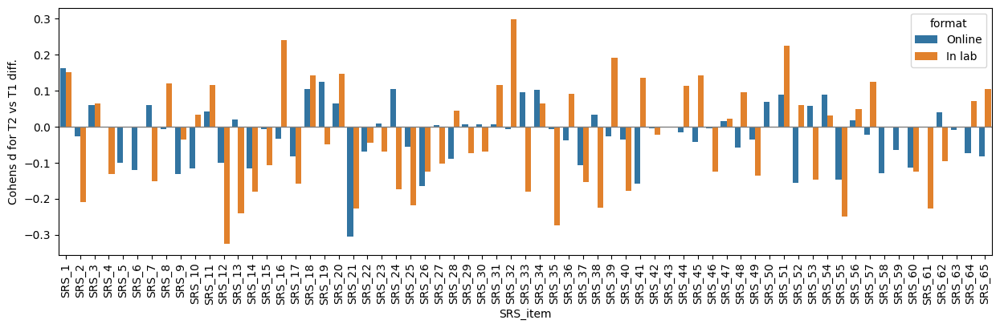

In [ ]:
#bar plot by item might be clearer
plt.figure(figsize=(15, 4))
sns.barplot(x='SRS_item', y='d', hue = 'format', data = df_item_trt_format_long)
plt.axhline(y=0, color='grey', linewidth=1)
plt.ylabel('Cohens d for T2 vs T1 diff.')
plt.xticks(rotation=90)
plt.show()

#### Check if item-by-item ICC difference correlates with item score differences between online and in-lab

In [ ]:
#data from variability analyses summarizing item-by-item differences between in-lab and online
df_item_diff = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/item_online_inlab_diff_data.csv')
df_item_diff['diff_online_inlab'] = df_item_diff['Online mean'] - df_item_diff['In lab mean']
df_item_diff['abs_diff'] = np.abs(df_item_diff['diff_online_inlab'])
df_item_diff.sort_values(by='SRS_item', ascending=True, inplace=True)
df_item_diff

,Unnamed: 0,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,subscale,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR,diff_online_inlab,abs_diff
4,4,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111,I am much more uncomfortable in social situati...,mot,no,2.0,2.0,0.003846,True,-0.537559,0.537559
38,38,SRS_10,0.798885,0.536437,6.640253,776.894147,5.881113e-11,0.305987,0.305987,"I take things too literally, and because of th...",cog,no,1.0,1.0,0.030000,True,-0.262448,0.262448
45,45,SRS_11,1.422384,1.714575,-6.276789,751.735697,5.837699e-10,-0.297522,0.297522,I have good self-confidence.,mot,yes,4.0,4.0,0.035385,True,0.292191,0.292191
40,40,SRS_12,1.659091,1.931174,-6.505063,732.554053,1.438364e-10,-0.315696,0.315696,I am able to communicate my feelings to others.,com,yes,NaN,4.0,0.031538,True,0.272083,0.272083
24,24,SRS_13,0.907804,0.578947,7.881908,789.243833,1.069970e-14,0.358553,0.358553,I am awkward in turn-taking interactions with ...,com,no,5.0,5.0,0.019231,True,-0.328857,0.328857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,SRS_64,1.610206,0.967611,13.360615,770.493008,9.018726e-37,0.619941,0.619941,I am much more tense in social settings than w...,mot,no,2.0,2.0,0.000769,True,-0.642594,0.642594
20,20,SRS_65,1.125643,0.755061,8.553727,738.662253,6.839904e-17,0.411929,0.411929,I find myself staring or gazing off into space.,mot,no,1.0,1.0,0.016154,True,-0.370582,0.370582
62,62,SRS_7,1.861063,1.955466,-2.269452,682.143037,2.355223e-02,-0.118441,0.118441,I am usually aware of how others are feeling.,awr,yes,3.0,3.0,0.048462,True,0.094402,0.094402
28,28,SRS_8,0.772298,0.481781,7.655472,809.067322,5.489568e-14,0.341527,0.341527,I behave in ways that seem strange or bizarre ...,rrb,no,NaN,1.0,0.022308,True,-0.290517,0.290517


In [ ]:
#load item-wise ICC data
ICC_all = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/ICC_both.csv')
ICC_all = ICC_all[~ICC_all['variable'].isin(['SRS','SRS_AWR','SRS_COG','SRS_COM','SRS_MOT','SRS_RRB'])]
ICC_all.rename(columns={'variable': 'SRS_item', 'ICC':'ICC_all'}, inplace=True)
ICC_all = ICC_all[['SRS_item', 'ICC_all']]
ICC_all

,SRS_item,ICC_all
6,SRS_1,0.257496
7,SRS_2,0.468774
8,SRS_3,0.541062
9,SRS_4,0.284983
10,SRS_5,0.338350
...,...,...
66,SRS_61,0.419048
67,SRS_62,0.414894
68,SRS_63,0.258598
69,SRS_64,0.559885


In [ ]:
#Load ICC online
ICC_online = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Figures/source_data/ICC_online.csv')
ICC_online = ICC_online[~ICC_online['variable'].isin(['SRS','SRS_AWR','SRS_COG','SRS_COM','SRS_MOT','SRS_RRB'])]
ICC_online.rename(columns={'variable': 'SRS_item', 'ICC':'ICC_online'}, inplace=True)
ICC_online = ICC_online[['SRS_item', 'ICC_online']]
ICC_online.head()

,SRS_item,ICC_online
6,SRS_1,0.187047
7,SRS_2,0.460933
8,SRS_3,0.530842
9,SRS_4,0.253256
10,SRS_5,0.357777


In [ ]:
#Load ICC in-lab
ICC_inlab = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Figures/source_data/ICC_lab.csv')
ICC_inlab = ICC_inlab[~ICC_inlab['variable'].isin(['SRS','SRS_AWR','SRS_COG','SRS_COM','SRS_MOT','SRS_RRB'])]
ICC_inlab.rename(columns={'variable': 'SRS_item', 'ICC':'ICC_inlab'}, inplace=True)
ICC_inlab = ICC_inlab[['SRS_item', 'ICC_inlab']]
ICC_inlab.head()

,SRS_item,ICC_inlab
6,SRS_1,0.391198
7,SRS_2,0.456255
8,SRS_3,0.373584
9,SRS_4,0.418505
10,SRS_5,0.236373


In [ ]:
df_item_diff = df_item_diff.merge(ICC_all, on='SRS_item', how='left')
df_item_diff = df_item_diff.merge(ICC_online, on='SRS_item', how='left')
df_item_diff = df_item_diff.merge(ICC_inlab, on='SRS_item', how='left')
df_item_diff.head()

,Unnamed: 0,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,...,is_rev,Factor_simplified,Factor_OLpaper,pFDR,isSigFDR,diff_online_inlab,abs_diff,ICC_all,ICC_online,ICC_inlab
0,4,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111,I am much more uncomfortable in social situati...,...,no,2.0,2.0,0.003846,True,-0.537559,0.537559,0.257496,0.187047,0.391198
1,38,SRS_10,0.798885,0.536437,6.640253,776.894147,5.881113e-11,0.305987,0.305987,"I take things too literally, and because of th...",...,no,1.0,1.0,0.030000,True,-0.262448,0.262448,0.363962,0.334075,0.509605
2,45,SRS_11,1.422384,1.714575,-6.276789,751.735697,5.837699e-10,-0.297522,0.297522,I have good self-confidence.,...,yes,4.0,4.0,0.035385,True,0.292191,0.292191,0.670664,0.649271,0.687441
3,40,SRS_12,1.659091,1.931174,-6.505063,732.554053,1.438364e-10,-0.315696,0.315696,I am able to communicate my feelings to others.,...,yes,NaN,4.0,0.031538,True,0.272083,0.272083,0.628099,0.621518,0.596099
4,24,SRS_13,0.907804,0.578947,7.881908,789.243833,1.069970e-14,0.358553,0.358553,I am awkward in turn-taking interactions with ...,...,no,5.0,5.0,0.019231,True,-0.328857,0.328857,0.475204,0.439745,0.589241


In [ ]:
df_item_diff['ICC_diff'] = df_item_diff['ICC_online'] - df_item_diff['ICC_inlab']
df_item_diff['ICC_abs_diff'] = np.abs(df_item_diff['ICC_diff'])
df_item_diff.head()

,Unnamed: 0,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,...,Factor_OLpaper,pFDR,isSigFDR,diff_online_inlab,abs_diff,ICC_all,ICC_online,ICC_inlab,ICC_diff,ICC_abs_diff
0,4,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111,I am much more uncomfortable in social situati...,...,2.0,0.003846,True,-0.537559,0.537559,0.257496,0.187047,0.391198,-0.204151,0.204151
1,38,SRS_10,0.798885,0.536437,6.640253,776.894147,5.881113e-11,0.305987,0.305987,"I take things too literally, and because of th...",...,1.0,0.030000,True,-0.262448,0.262448,0.363962,0.334075,0.509605,-0.175530,0.175530
2,45,SRS_11,1.422384,1.714575,-6.276789,751.735697,5.837699e-10,-0.297522,0.297522,I have good self-confidence.,...,4.0,0.035385,True,0.292191,0.292191,0.670664,0.649271,0.687441,-0.038170,0.038170
3,40,SRS_12,1.659091,1.931174,-6.505063,732.554053,1.438364e-10,-0.315696,0.315696,I am able to communicate my feelings to others.,...,4.0,0.031538,True,0.272083,0.272083,0.628099,0.621518,0.596099,0.025419,0.025419
4,24,SRS_13,0.907804,0.578947,7.881908,789.243833,1.069970e-14,0.358553,0.358553,I am awkward in turn-taking interactions with ...,...,5.0,0.019231,True,-0.328857,0.328857,0.475204,0.439745,0.589241,-0.149496,0.149496


Check correlations and make plots

Text(0.5, 1.0, 'R = 0.36, P = 0.00')

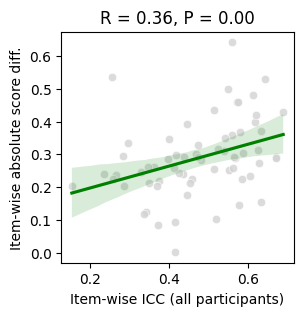

In [ ]:
#correlation between ICC_all and abs_diff_online_inlab
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=df_item_diff, x='ICC_all',  y='abs_diff', color = 'lightgrey', alpha=0.8)
sns.regplot(data=df_item_diff, x='ICC_all', y='abs_diff', scatter=False, color='green')
ax.set_xlabel('Item-wise ICC (all participants)', fontsize = 10)
ax.set_ylabel('Item-wise absolute score diff.', fontsize = 10)
r_value, p_value = pearsonr(df_item_diff['ICC_all'], df_item_diff['abs_diff'])
ax.set_title(f'R = {r_value:.2f}, P = {p_value:.2f}')

Text(0.5, 1.0, 'R = 0.01, P = 0.96')

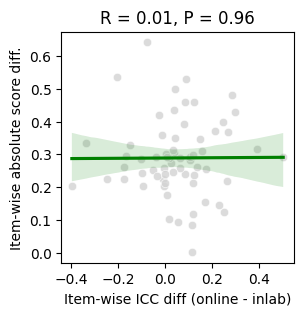

In [ ]:
#correlation between ICC_diff and abs_diff_online_inlab
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=df_item_diff, x='ICC_diff',  y='abs_diff', color = 'lightgrey', alpha=0.8)
sns.regplot(data=df_item_diff, x='ICC_diff', y='abs_diff', scatter=False, color='green')
ax.set_xlabel('Item-wise ICC diff (online - inlab)', fontsize = 10)
ax.set_ylabel('Item-wise absolute score diff.', fontsize = 10)
r_value, p_value = pearsonr(df_item_diff['ICC_diff'], df_item_diff['abs_diff'])
ax.set_title(f'R = {r_value:.2f}, P = {p_value:.2f}')

Text(0.5, 1.0, 'R = 0.06, P = 0.63')

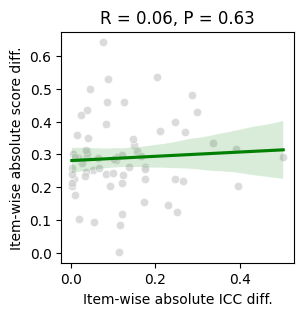

In [ ]:
#correlation between ICC_abs_diff and abs_diff_online_inlab
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=df_item_diff, x='ICC_abs_diff',  y='abs_diff', color = 'lightgrey', alpha=0.8)
sns.regplot(data=df_item_diff, x='ICC_abs_diff', y='abs_diff', scatter=False, color='green')
ax.set_xlabel('Item-wise absolute ICC diff.', fontsize = 10)
ax.set_ylabel('Item-wise absolute score diff.', fontsize = 10)
r_value, p_value = pearsonr(df_item_diff['ICC_abs_diff'], df_item_diff['abs_diff'])
ax.set_title(f'R = {r_value:.2f}, P = {p_value:.2f}')

Text(0.5, 1.0, 'R = 0.36, P = 0.003')

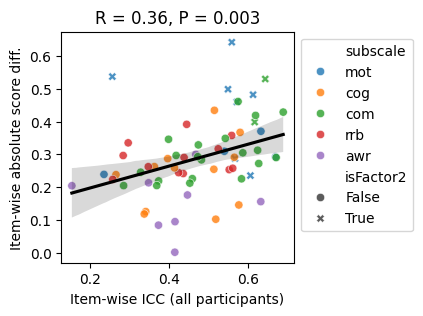

In [ ]:
#correlation between ICC_all and abs_diff_online_inlab
df_item_diff['isFactor2'] = df_item_diff['Factor_OLpaper'].apply(lambda x: True if x == 2 else False)
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=df_item_diff, x='ICC_all',  y='abs_diff', hue = 'subscale', style='isFactor2', alpha=0.8)
sns.regplot(data=df_item_diff, x='ICC_all', y='abs_diff', scatter=False, color='black')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.set_xlabel('Item-wise ICC (all participants)', fontsize = 10)
ax.set_ylabel('Item-wise absolute score diff.', fontsize = 10)
r_value, p_value = pearsonr(df_item_diff['ICC_all'], df_item_diff['abs_diff'])
ax.set_title(f'R = {r_value:.2f}, P = {p_value:.3f}')

Text(0.5, 1.0, 'R = 0.28, P = 0.025')

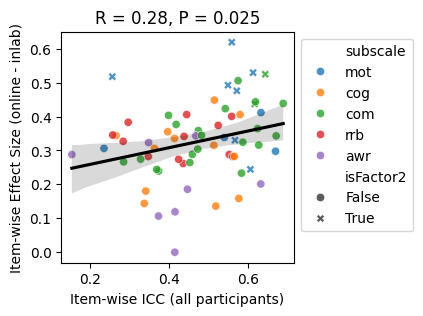

In [ ]:
#repeat with Cohen's d instead of absolute score difference
df_item_diff['isFactor2'] = df_item_diff['Factor_OLpaper'].apply(lambda x: True if x == 2 else False)
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=df_item_diff, x='ICC_all',  y='Cohens_d_rev', hue = 'subscale', style='isFactor2', alpha=0.8)
sns.regplot(data=df_item_diff, x='ICC_all', y='Cohens_d_rev', scatter=False, color='black')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
ax.set_xlabel('Item-wise ICC (all participants)', fontsize = 10)
ax.set_ylabel('Item-wise Effect Size (online - inlab)', fontsize = 10)
r_value, p_value = pearsonr(df_item_diff['ICC_all'], df_item_diff['Cohens_d_rev'])
ax.set_title(f'R = {r_value:.2f}, P = {p_value:.3f}')

In [ ]:
df_item_diff['ICC_all_z'] = zscore(df_item_diff['ICC_all'].astype(float))
df_item_diff['Cohens_d_rev_z'] = zscore(df_item_diff['Cohens_d_rev'].astype(float))
df_item_diff['Cohens_d_rev_normICC'] = df_item_diff['Cohens_d_rev_z'] - df_item_diff['ICC_all_z']
df_item_diff.head()

,Unnamed: 0,SRS_item,In lab mean,Online mean,T,df,p,Cohens_d,Cohens_d_rev,question_text,...,abs_diff,ICC_all,ICC_online,ICC_inlab,ICC_diff,ICC_abs_diff,isFactor2,ICC_all_z,Cohens_d_rev_z,Cohens_d_rev_normICC
0,4,SRS_1,1.578045,1.040486,11.176919,771.385026,5.505404e-27,0.518111,0.518111,I am much more uncomfortable in social situati...,...,0.537559,0.257496,0.187047,0.391198,-0.204151,0.204151,True,-1.736901,1.717596,3.454497
1,38,SRS_10,0.798885,0.536437,6.640253,776.894147,5.881113e-11,0.305987,0.305987,"I take things too literally, and because of th...",...,0.262448,0.363962,0.334075,0.509605,-0.175530,0.175530,False,-0.889502,-0.183461,0.706040
2,45,SRS_11,1.422384,1.714575,-6.276789,751.735697,5.837699e-10,-0.297522,0.297522,I have good self-confidence.,...,0.292191,0.670664,0.649271,0.687441,-0.038170,0.038170,False,1.551632,-0.259326,-1.810957
3,40,SRS_12,1.659091,1.931174,-6.505063,732.554053,1.438364e-10,-0.315696,0.315696,I am able to communicate my feelings to others.,...,0.272083,0.628099,0.621518,0.596099,0.025419,0.025419,False,1.212846,-0.096448,-1.309294
4,24,SRS_13,0.907804,0.578947,7.881908,789.243833,1.069970e-14,0.358553,0.358553,I am awkward in turn-taking interactions with ...,...,0.328857,0.475204,0.439745,0.589241,-0.149496,0.149496,False,-0.004095,0.287635,0.291731


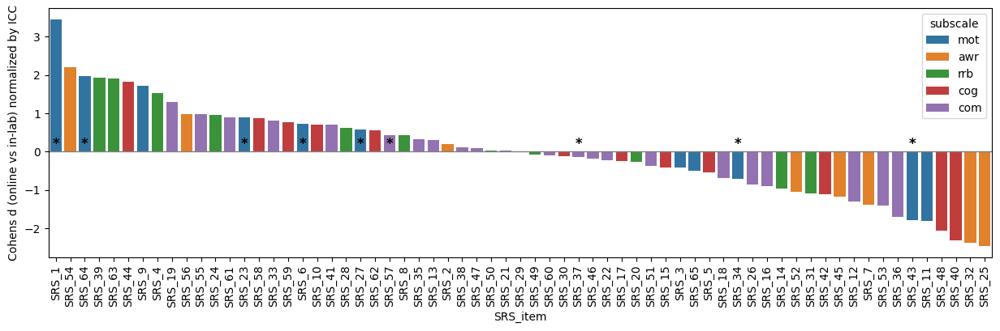

In [ ]:
df_item_diff.sort_values(by='Cohens_d_rev_normICC', ascending=False, inplace=True)
plt.figure(figsize=(15, 4))
ax = sns.barplot(x='SRS_item', y='Cohens_d_rev_normICC', hue='subscale', data = df_item_diff)
# Add stars for items where isFactor2 is True
for i, val in enumerate(df_item_diff['isFactor2']):
  if val:
    plt.text(i, 0.01, '*', ha='center', va='bottom', fontsize=12, fontweight='bold')
plt.axhline(y=0, color='grey', linewidth=1)
plt.ylabel('Cohens d (online vs in-lab) normalized by ICC')
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Extract residuals from regression predicting Cohen's d from ICC_all
model = smf.ols('Cohens_d_rev ~ ICC_all', data = df_item_diff).fit()
df_item_diff['residuals'] = model.resid

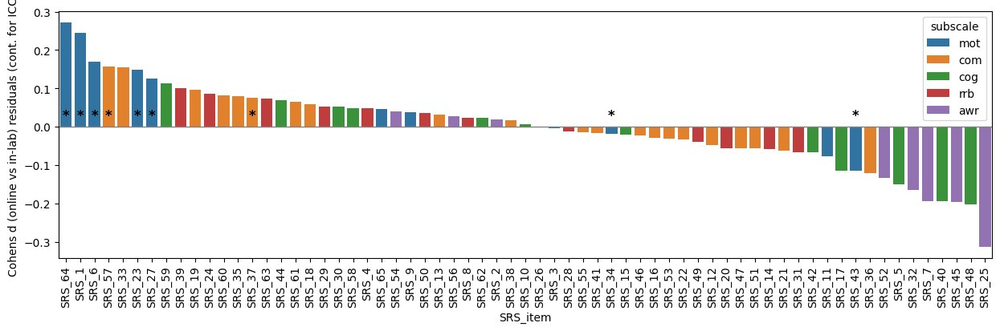

In [ ]:
df_item_diff.sort_values(by='residuals', ascending=False, inplace=True)
plt.figure(figsize=(15, 4))
ax = sns.barplot(x='SRS_item', y='residuals', hue='subscale', data = df_item_diff)
# Add stars for items where isFactor2 is True
for i, val in enumerate(df_item_diff['isFactor2']):
  if val:
    plt.text(i, 0.01, '*', ha='center', va='bottom', fontsize=12, fontweight='bold')
plt.axhline(y=0, color='grey', linewidth=1)
plt.ylabel('Cohens d (online vs in-lab) residuals (cont. for ICC)')
plt.xticks(rotation=90)
plt.show()

Text(0.5, 1.0, 'R = 0.96, P = 0.00')

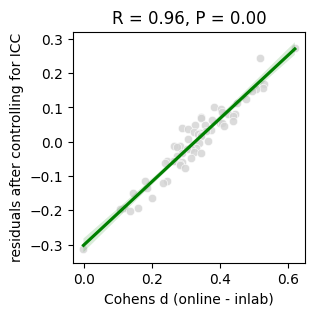

In [ ]:
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=df_item_diff, x='Cohens_d_rev',  y='residuals', color = 'lightgrey', alpha=0.8)
sns.regplot(data=df_item_diff, x='Cohens_d_rev', y='residuals', scatter=False, color='green')
ax.set_xlabel('Cohens d (online - inlab)', fontsize = 10)
ax.set_ylabel('residuals after controlling for ICC', fontsize = 10)
r_value, p_value = pearsonr(df_item_diff['Cohens_d_rev'], df_item_diff['residuals'])
ax.set_title(f'R = {r_value:.2f}, P = {p_value:.2f}')

Text(0.5, 1.0, 'R = -0.00, P = 1.00')

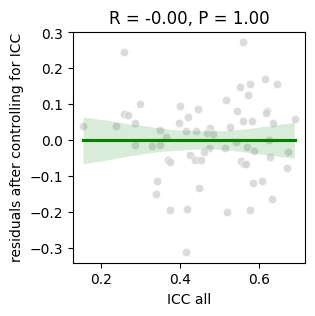

In [ ]:
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=df_item_diff, x='ICC_all',  y='residuals', color = 'lightgrey', alpha=0.8)
sns.regplot(data=df_item_diff, x='ICC_all', y='residuals', scatter=False, color='green')
ax.set_xlabel('ICC all', fontsize = 10)
ax.set_ylabel('residuals after controlling for ICC', fontsize = 10)
r_value, p_value = pearsonr(df_item_diff['ICC_all'], df_item_diff['residuals'])
ax.set_title(f'R = {r_value:.2f}, P = {p_value:.2f}')

### 4) Any between-subject differences contributing to the SRS stability?

In [ ]:
# load the data from here (for Qianying's use)
t_rt_all = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_test_retest_all_excl.csv',index_col = 0)
t_rt_all['SRS_diff'] = t_rt_all['SRS_T2'] - t_rt_all['SRS_T1']
t_rt_all['SRS_diff_abs'] = np.abs(t_rt_all['SRS_T2'] - t_rt_all['SRS_T1'])
t_rt_all['date_ordinal_T1_z'] = zscore(t_rt_all['date_ordinal_T1'].astype(float))
t_rt_all['date_ordinal_T2_z'] = zscore(t_rt_all['date_ordinal_T2'].astype(float))
t_rt_all['T2_T1_diff'] = t_rt_all['date_ordinal_T2'] - t_rt_all['date_ordinal_T1']
t_rt_all['T2_T1_diff_z'] = zscore(t_rt_all['T2_T1_diff'].astype(float))
t_rt_all['BDI_diff_abs'] = np.abs(t_rt_all['BDI_T2'] - t_rt_all['BDI_T1'])
t_rt_all['LSAS_diff_abs'] = np.abs(t_rt_all['LSAS_T2'] - t_rt_all['LSAS_T1'])
t_rt_all['STAI_trait_diff_abs'] = np.abs(t_rt_all['STAI_trait_T2'] - t_rt_all['STAI_trait_T1'])
t_rt_all['BDI_diff'] = t_rt_all['BDI_T2'] - t_rt_all['BDI_T1']
t_rt_all['LSAS_diff'] = t_rt_all['LSAS_T2'] - t_rt_all['LSAS_T1']
t_rt_all['STAI_trait_diff'] = t_rt_all['STAI_trait_T2'] - t_rt_all['STAI_trait_T1']
t_rt_all.head()

,ParticipantID,Sex,Race,Education,date_T1,date_ordinal_T1,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,...,SRS_diff_abs,date_ordinal_T1_z,date_ordinal_T2_z,T2_T1_diff_z,BDI_diff_abs,LSAS_diff_abs,STAI_trait_diff_abs,BDI_diff,LSAS_diff,STAI_trait_diff
0,55b249bdfdf99b28e3c14b05,f,African American / Black,Some College,2020-11-17,737746,35.0,33.0,2.0,1.0,...,11.0,-0.114520,0.380968,0.553311,0.0,19.0,0.0,0.0,-19.0,0.0
1,55cf5cc434e9060005e56c39,f,Caucasian / White,Graduate Degree,2020-11-13,737742,60.0,39.0,4.0,6.0,...,6.0,-0.122850,0.410175,0.595085,1.0,5.0,0.0,1.0,5.0,0.0
2,55ea70c37480920010aa9982,m,African American / Black,Some College,2020-11-14,737743,34.0,37.0,4.0,5.0,...,11.0,-0.120767,0.380968,0.562262,0.0,5.0,0.0,0.0,-5.0,0.0
3,56a37d86dbe850000bfcef9d,f,Caucasian / White,Bachelors Degree,2020-11-14,737743,57.0,57.0,7.0,11.0,...,14.0,-0.120767,0.380968,0.562262,3.0,3.0,4.0,3.0,3.0,4.0
4,56d0f57421cd29000a9737e4,m,Caucasian / White,Bachelors Degree,2020-11-17,737746,38.0,67.0,6.0,6.0,...,5.0,-0.114520,0.378048,0.550327,0.0,21.0,2.0,0.0,21.0,2.0


In [ ]:
t_rt_all.loc[t_rt_all['format'] == 'In lab', ['SRS_diff_abs', 'SRS_diff', 'format', 'Sex', 'age_T1', 'BDI_diff_abs', 'LSAS_diff_abs', 'STAI_trait_diff_abs',
                       'BDI_diff', 'LSAS_diff', 'STAI_trait_diff', 'SRS_T1', 'date_ordinal_T1_z','T2_T1_diff_z']]

,SRS_diff_abs,SRS_diff,format,Sex,age_T1,BDI_diff_abs,LSAS_diff_abs,STAI_trait_diff_abs,BDI_diff,LSAS_diff,STAI_trait_diff,SRS_T1,date_ordinal_T1_z,T2_T1_diff_z
0,16.0,16.0,In lab,NaN,25.0,NaN,NaN,NaN,NaN,NaN,NaN,55.0,-4.720980,5.232036
2,17.0,17.0,In lab,f,32.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,-0.972504,0.174358
3,20.0,20.0,In lab,m,28.0,4.0,NaN,10.0,-4.0,NaN,10.0,71.0,-0.960009,-0.037498
4,11.0,11.0,In lab,m,29.0,NaN,NaN,NaN,NaN,NaN,NaN,10.0,-4.527309,0.213148
5,22.0,-22.0,In lab,f,27.0,NaN,NaN,NaN,NaN,NaN,NaN,28.0,-4.906322,2.630092
6,3.0,-3.0,In lab,m,33.0,NaN,NaN,NaN,NaN,NaN,NaN,15.0,-0.866298,0.201213
7,4.0,4.0,In lab,m,41.0,0.0,NaN,1.0,0.0,NaN,1.0,4.0,-0.751761,-0.294112
9,15.0,-15.0,In lab,f,31.0,5.0,32.0,2.0,5.0,32.0,2.0,80.0,-0.695534,-1.350405
10,3.0,3.0,In lab,m,32.0,NaN,NaN,NaN,NaN,NaN,NaN,23.0,-0.672626,-0.279192
11,5.0,5.0,In lab,f,29.0,15.0,NaN,18.0,-15.0,NaN,-18.0,33.0,-0.672626,-0.553709


In [ ]:
df_glm_trt = t_rt_all[['SRS_diff_abs', 'SRS_diff', 'format', 'Sex', 'age_T1', 'BDI_diff_abs', 'LSAS_diff_abs', 'STAI_trait_diff_abs',
                       'BDI_diff', 'LSAS_diff', 'STAI_trait_diff', 'SRS_T1', 'date_ordinal_T1_z','T2_T1_diff_z']].dropna()
df_glm_trt

,SRS_diff_abs,SRS_diff,format,Sex,age_T1,BDI_diff_abs,LSAS_diff_abs,STAI_trait_diff_abs,BDI_diff,LSAS_diff,STAI_trait_diff,SRS_T1,date_ordinal_T1_z,T2_T1_diff_z
0,11.0,-11.0,Online,f,35.0,0.0,19.0,0.0,0.0,-19.0,0.0,33.0,-0.114520,0.553311
1,6.0,6.0,Online,f,60.0,1.0,5.0,0.0,1.0,5.0,0.0,39.0,-0.122850,0.595085
2,11.0,-11.0,Online,m,34.0,0.0,5.0,0.0,0.0,-5.0,0.0,37.0,-0.120767,0.562262
3,14.0,14.0,Online,f,57.0,3.0,3.0,4.0,3.0,3.0,4.0,57.0,-0.120767,0.562262
4,5.0,5.0,Online,m,38.0,0.0,21.0,2.0,0.0,21.0,2.0,67.0,-0.114520,0.550327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40,2.0,-2.0,In lab,m,28.0,3.0,53.0,6.0,-3.0,-53.0,-6.0,73.0,0.372782,-2.072505
44,1.0,-1.0,In lab,f,20.0,3.0,46.0,7.0,-3.0,46.0,7.0,41.0,0.556041,-2.233634
45,29.0,-29.0,In lab,f,47.0,6.0,29.0,9.0,-6.0,-29.0,-9.0,44.0,0.560206,-2.543958
47,2.0,2.0,In lab,f,18.0,9.0,0.0,7.0,9.0,0.0,7.0,36.0,0.568536,-2.543958


In [ ]:
print('online: N=', len(df_glm_trt[df_glm_trt['format']=='Online']))
print('in-lab: N=', len(df_glm_trt[df_glm_trt['format']=='In lab']))

online: N= 203
in-lab: N= 10


Predicting absolute T2 - T1 difference

In [ ]:
#glm
model_trt = smf.ols('SRS_diff_abs ~ format + Sex + scale(age_T1) + scale(BDI_diff_abs) + scale(LSAS_diff_abs) + scale(STAI_trait_diff_abs) + \
                    scale(SRS_T1) + date_ordinal_T1_z + T2_T1_diff_z', data=df_glm_trt).fit()
print(model_trt.summary())

                            OLS Regression Results                            
Dep. Variable:           SRS_diff_abs   R-squared:                       0.263
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     8.068
Date:                Wed, 18 Dec 2024   Prob (F-statistic):           3.36e-10
Time:                        21:45:58   Log-Likelihood:                -843.11
No. Observations:                 213   AIC:                             1706.
Df Residuals:                     203   BIC:                             1740.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

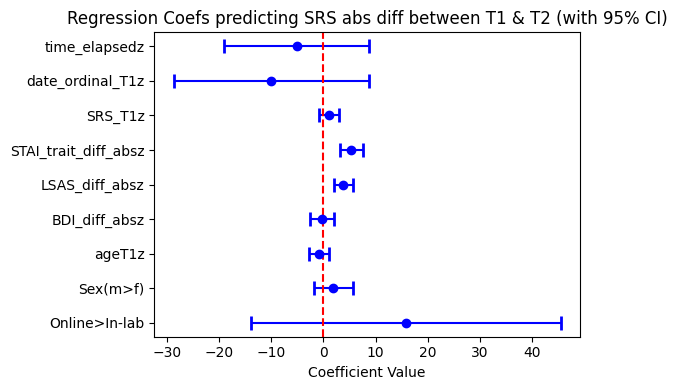

In [ ]:
#make summary df before plotting
coef = model_trt.params[1:]
conf_int = model_trt.conf_int()[1:]
results_df_trt = pd.DataFrame({
    'coef': coef.to_list(),
    'err': ((conf_int.loc[:,1] - conf_int.loc[:, 0]) / 2).to_list(),
    'lower': conf_int.loc[:, 0].to_list(),
    'upper': conf_int.loc[:, 1].to_list()
}, index=['Online>In-lab', 'Sex(m>f)', 'ageT1z','BDI_diff_absz','LSAS_diff_absz','STAI_trait_diff_absz','SRS_T1z','date_ordinal_T1z','time_elapsedz'])

#make a plot of the coefficients
fig, ax = plt.subplots(figsize=(6, 4))
y_pos = range(len(results_df_trt))
ax.errorbar(results_df_trt['coef'], y_pos, xerr=results_df_trt['err'], fmt='o', capsize=5, capthick=2, color='blue')
ax.axvline(x=0, color='red', linestyle='--')
ax.set_yticks(y_pos)
ax.set_yticklabels(results_df_trt.index)
ax.set_xlabel('Coefficient Value')
ax.set_title('Regression Coefs predicting SRS abs diff between T1 & T2 (with 95% CI)')
plt.tight_layout()
plt.show()

Re-running with time elapsed cutoff > 6 month

In [ ]:
t_rt_cutoff['SRS_diff_abs'] = np.abs(t_rt_cutoff['SRS_T2'] - t_rt_cutoff['SRS_T1'])
t_rt_cutoff['date_ordinal_T1_z'] = zscore(t_rt_cutoff['date_ordinal_T1'].astype(float))
t_rt_cutoff['date_ordinal_T2_z'] = zscore(t_rt_cutoff['date_ordinal_T2'].astype(float))
t_rt_cutoff['T2_T1_diff'] = t_rt_cutoff['date_ordinal_T2'] - t_rt_cutoff['date_ordinal_T1']
t_rt_cutoff['T2_T1_diff_z'] = zscore(t_rt_cutoff['T2_T1_diff'].astype(float))
t_rt_cutoff['BDI_diff_abs'] = np.abs(t_rt_cutoff['BDI_T2'] - t_rt_cutoff['BDI_T1'])
t_rt_cutoff['LSAS_diff_abs'] = np.abs(t_rt_cutoff['LSAS_T2'] - t_rt_cutoff['LSAS_T1'])
t_rt_cutoff['STAI_trait_diff_abs'] = np.abs(t_rt_cutoff['STAI_trait_T2'] - t_rt_cutoff['STAI_trait_T1'])

df_glm_trt_cutoff = t_rt_cutoff[['SRS_diff_abs', 'format', 'Sex', 'age_T1', 'BDI_diff_abs', 'LSAS_diff_abs', 'STAI_trait_diff_abs',
                       'SRS_T1', 'date_ordinal_T1_z','T2_T1_diff_z']].dropna()
df_glm_trt_cutoff.head()

,SRS_diff_abs,format,Sex,age_T1,BDI_diff_abs,LSAS_diff_abs,STAI_trait_diff_abs,SRS_T1,date_ordinal_T1_z,T2_T1_diff_z
0,11.0,Online,f,35.0,0.0,19.0,0.0,33.0,-0.114520,0.553311
1,6.0,Online,f,60.0,1.0,5.0,0.0,39.0,-0.122850,0.595085
2,11.0,Online,m,34.0,0.0,5.0,0.0,37.0,-0.120767,0.562262
3,14.0,Online,f,57.0,3.0,3.0,4.0,57.0,-0.120767,0.562262
4,5.0,Online,m,38.0,0.0,21.0,2.0,67.0,-0.114520,0.550327


In [ ]:
#glm
model_trt_cutoff = smf.ols('SRS_diff_abs ~ format + Sex + scale(age_T1) + scale(BDI_diff_abs) + scale(LSAS_diff_abs) + scale(STAI_trait_diff_abs) + \
                    scale(SRS_T1) + date_ordinal_T1_z + T2_T1_diff_z', data=df_glm_trt_cutoff).fit()
print(model_trt_cutoff.summary())

                            OLS Regression Results                            
Dep. Variable:           SRS_diff_abs   R-squared:                       0.263
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     8.068
Date:                Fri, 22 Nov 2024   Prob (F-statistic):           3.36e-10
Time:                        17:52:37   Log-Likelihood:                -843.11
No. Observations:                 213   AIC:                             1706.
Df Residuals:                     203   BIC:                             1740.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept           

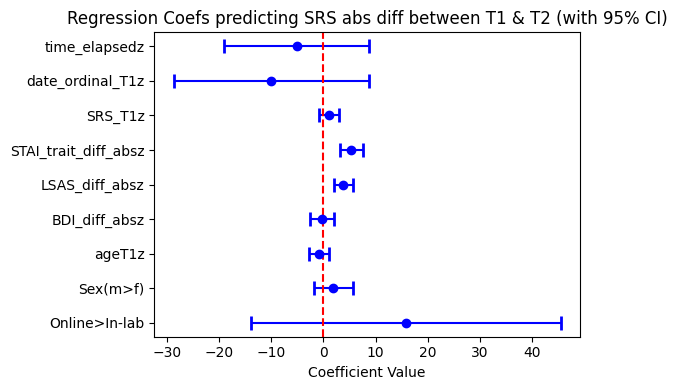

In [ ]:
#make summary df before plotting
coef = model_trt_cutoff.params[1:]
conf_int = model_trt_cutoff.conf_int()[1:]
results_df_trt = pd.DataFrame({
    'coef': coef.to_list(),
    'err': ((conf_int.loc[:,1] - conf_int.loc[:, 0]) / 2).to_list(),
    'lower': conf_int.loc[:, 0].to_list(),
    'upper': conf_int.loc[:, 1].to_list()
}, index=['Online>In-lab', 'Sex(m>f)', 'ageT1z','BDI_diff_absz','LSAS_diff_absz','STAI_trait_diff_absz','SRS_T1z','date_ordinal_T1z','time_elapsedz'])

#make a plot of the coefficients
fig, ax = plt.subplots(figsize=(6, 4))
y_pos = range(len(results_df_trt))
ax.errorbar(results_df_trt['coef'], y_pos, xerr=results_df_trt['err'], fmt='o', capsize=5, capthick=2, color='blue')
ax.axvline(x=0, color='red', linestyle='--')
ax.set_yticks(y_pos)
ax.set_yticklabels(results_df_trt.index)
ax.set_xlabel('Coefficient Value')
ax.set_title('Regression Coefs predicting SRS abs diff between T1 & T2 (with 95% CI)')
plt.tight_layout()
plt.show()

Predicting signed T2 - T1 difference

In [ ]:
#glm
model_trt2 = smf.ols('SRS_diff ~ format + Sex + scale(age_T1) + scale(BDI_diff) + scale(LSAS_diff) + scale(STAI_trait_diff) + \
                    scale(SRS_T1) + date_ordinal_T1_z + T2_T1_diff_z', data=df_glm_trt).fit()
print(model_trt2.summary())

                            OLS Regression Results                            
Dep. Variable:               SRS_diff   R-squared:                       0.462
Model:                            OLS   Adj. R-squared:                  0.438
Method:                 Least Squares   F-statistic:                     19.37
Date:                Fri, 22 Nov 2024   Prob (F-statistic):           3.24e-23
Time:                        17:52:38   Log-Likelihood:                -887.56
No. Observations:                 213   AIC:                             1795.
Df Residuals:                     203   BIC:                             1829.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -1

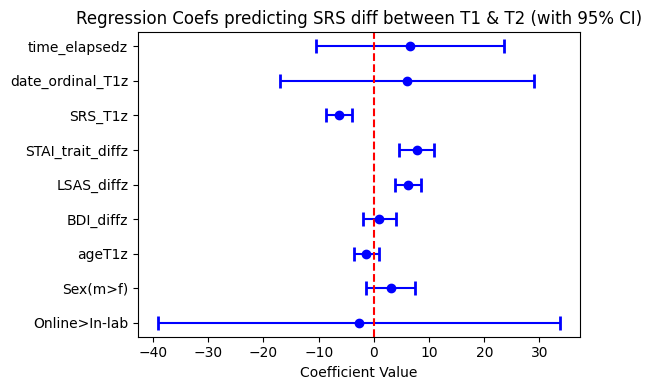

In [ ]:
#make summary df before plotting
coef = model_trt2.params[1:]
conf_int = model_trt2.conf_int()[1:]
results_df_trt = pd.DataFrame({
    'coef': coef.to_list(),
    'err': ((conf_int.loc[:,1] - conf_int.loc[:, 0]) / 2).to_list(),
    'lower': conf_int.loc[:, 0].to_list(),
    'upper': conf_int.loc[:, 1].to_list()
}, index=['Online>In-lab', 'Sex(m>f)', 'ageT1z','BDI_diffz','LSAS_diffz','STAI_trait_diffz','SRS_T1z','date_ordinal_T1z','time_elapsedz'])

#make a plot of the coefficients
fig, ax = plt.subplots(figsize=(6, 4))
y_pos = range(len(results_df_trt))
ax.errorbar(results_df_trt['coef'], y_pos, xerr=results_df_trt['err'], fmt='o', capsize=5, capthick=2, color='blue')
ax.axvline(x=0, color='red', linestyle='--')
ax.set_yticks(y_pos)
ax.set_yticklabels(results_df_trt.index)
ax.set_xlabel('Coefficient Value')
ax.set_title('Regression Coefs predicting SRS diff between T1 & T2 (with 95% CI)')
plt.tight_layout()
plt.show()

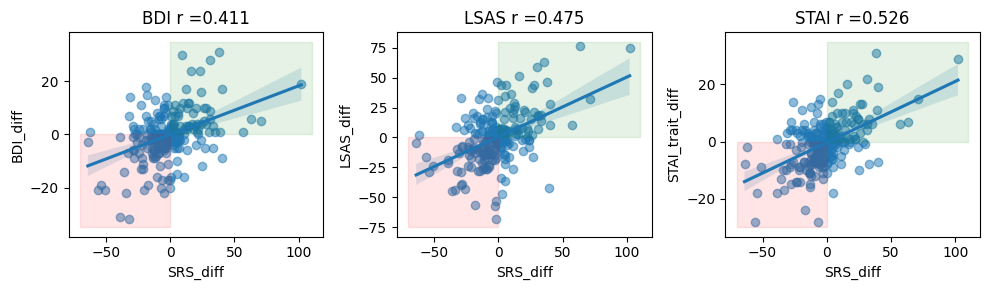

In [ ]:
# try other way of visualizations (Qianying)
t_rt_all['LSAS_diff'] = t_rt_all['LSAS_T2'] - t_rt_all['LSAS_T1']
t_rt_all['STAI_trait_diff'] = t_rt_all['STAI_trait_T2'] - t_rt_all['STAI_trait_T1']
t_rt_all['BDI_diff'] = t_rt_all['BDI_T2'] - t_rt_all['BDI_T1']

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(10, 3))

# BDI
corr_bdi = t_rt_all['BDI_diff'].corr(t_rt_all['SRS_diff'])
sns.regplot(data=t_rt_all, x='SRS_diff', y='BDI_diff', ax=axes[0],scatter_kws={'alpha': 0.5})
axes[0].set_title('BDI r =' + str(np.round(corr_bdi,3)))
axes[0].fill_betweenx((0,35), 0, 110, color='green', alpha=0.1)
axes[0].fill_betweenx((-35,0), -70, 0, color='red', alpha=0.1)


# LSAS
corr_lsas = t_rt_all['LSAS_diff'].corr(t_rt_all['SRS_diff'])
sns.regplot(data=t_rt_all, x='SRS_diff', y='LSAS_diff', ax=axes[1],scatter_kws={'alpha': 0.5})
axes[1].set_title('LSAS r =' + str(np.round(corr_lsas,3)))
axes[1].fill_betweenx((0,80), 0, 110, color='green', alpha=0.1)
axes[1].fill_betweenx((-75,0), -70, 0, color='red', alpha=0.1)

# STAI
corr_stai = t_rt_all['STAI_trait_diff'].corr(t_rt_all['SRS_diff'])
sns.regplot(data=t_rt_all, x='SRS_diff', y='STAI_trait_diff', ax=axes[2],scatter_kws={'alpha': 0.5})
axes[2].set_title('STAI r =' + str(np.round(corr_stai,3)))
axes[2].fill_betweenx((0,35), 0, 110, color='green', alpha=0.1)
axes[2].fill_betweenx((-30,0), -70, 0, color='red', alpha=0.1)

plt.tight_layout()
plt.show()

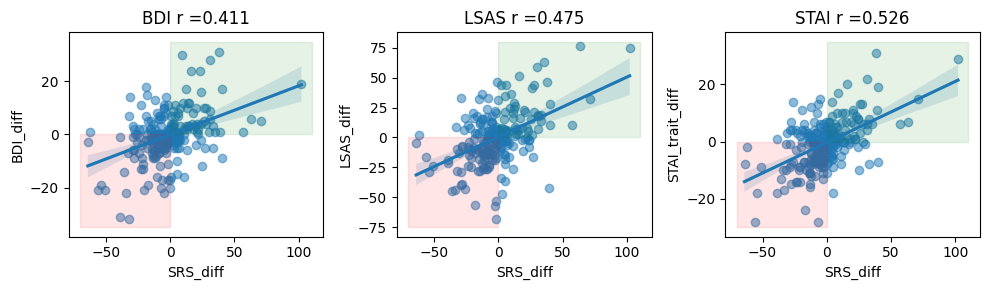

In [ ]:
# with > 6-month cutoff
t_rt_cutoff['LSAS_diff'] = t_rt_cutoff['LSAS_T2'] - t_rt_cutoff['LSAS_T1']
t_rt_cutoff['STAI_trait_diff'] = t_rt_cutoff['STAI_trait_T2'] - t_rt_cutoff['STAI_trait_T1']
t_rt_cutoff['BDI_diff'] = t_rt_cutoff['BDI_T2'] - t_rt_cutoff['BDI_T1']

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(10, 3))

# BDI
corr_bdi = t_rt_cutoff['BDI_diff'].corr(t_rt_cutoff['SRS_diff'])
sns.regplot(data=t_rt_cutoff, x='SRS_diff', y='BDI_diff', ax=axes[0],scatter_kws={'alpha': 0.5})
axes[0].set_title('BDI r =' + str(np.round(corr_bdi,3)))
axes[0].fill_betweenx((0,35), 0, 110, color='green', alpha=0.1)
axes[0].fill_betweenx((-35,0), -70, 0, color='red', alpha=0.1)


# LSAS
corr_lsas = t_rt_cutoff['LSAS_diff'].corr(t_rt_cutoff['SRS_diff'])
sns.regplot(data=t_rt_cutoff, x='SRS_diff', y='LSAS_diff', ax=axes[1],scatter_kws={'alpha': 0.5})
axes[1].set_title('LSAS r =' + str(np.round(corr_lsas,3)))
axes[1].fill_betweenx((0,80), 0, 110, color='green', alpha=0.1)
axes[1].fill_betweenx((-75,0), -70, 0, color='red', alpha=0.1)

# STAI
corr_stai = t_rt_cutoff['STAI_trait_diff'].corr(t_rt_cutoff['SRS_diff'])
sns.regplot(data=t_rt_cutoff, x='SRS_diff', y='STAI_trait_diff', ax=axes[2],scatter_kws={'alpha': 0.5})
axes[2].set_title('STAI r =' + str(np.round(corr_stai,3)))
axes[2].fill_betweenx((0,35), 0, 110, color='green', alpha=0.1)
axes[2].fill_betweenx((-30,0), -70, 0, color='red', alpha=0.1)

plt.tight_layout()
plt.show()

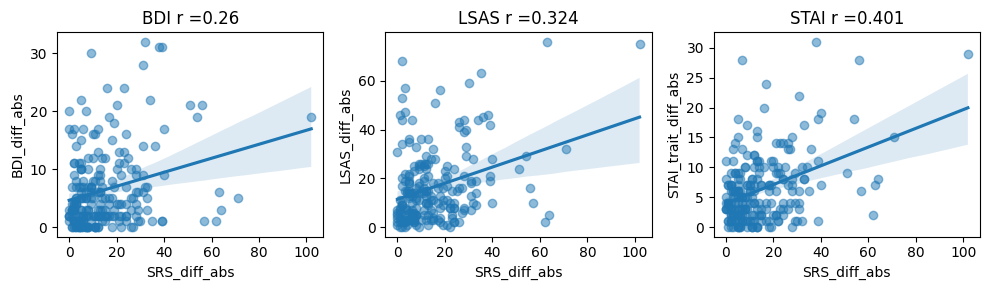

In [ ]:
# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(10, 3))

# BDI
corr_bdi_abs = t_rt_all['BDI_diff_abs'].corr(t_rt_all['SRS_diff_abs'])
sns.regplot(data=t_rt_all, x='SRS_diff_abs', y='BDI_diff_abs', ax=axes[0],scatter_kws={'alpha': 0.5})
axes[0].set_title('BDI r =' + str(np.round(corr_bdi_abs,3)))

# LSAS
corr_lsas_abs = t_rt_all['LSAS_diff_abs'].corr(t_rt_all['SRS_diff_abs'])
sns.regplot(data=t_rt_all, x='SRS_diff_abs', y='LSAS_diff_abs', ax=axes[1],scatter_kws={'alpha': 0.5})
axes[1].set_title('LSAS r =' + str(np.round(corr_lsas_abs,3)))

# STAI
corr_stai_abs = t_rt_all['STAI_trait_diff_abs'].corr(t_rt_all['SRS_diff_abs'])
sns.regplot(data=t_rt_all, x='SRS_diff_abs', y='STAI_trait_diff_abs', ax=axes[2],scatter_kws={'alpha': 0.5})
axes[2].set_title('STAI r =' + str(np.round(corr_stai_abs,3)))

plt.tight_layout()
plt.show()

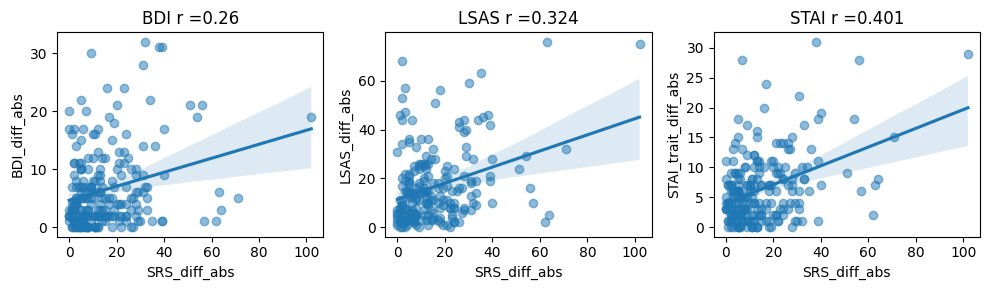

In [ ]:
# with > 6-month cutoff
fig, axes = plt.subplots(1, 3, figsize=(10, 3))

# BDI
corr_bdi_abs = t_rt_cutoff['BDI_diff_abs'].corr(t_rt_cutoff['SRS_diff_abs'])
sns.regplot(data=t_rt_cutoff, x='SRS_diff_abs', y='BDI_diff_abs', ax=axes[0],scatter_kws={'alpha': 0.5})
axes[0].set_title('BDI r =' + str(np.round(corr_bdi_abs,3)))

# LSAS
corr_lsas_abs = t_rt_cutoff['LSAS_diff_abs'].corr(t_rt_cutoff['SRS_diff_abs'])
sns.regplot(data=t_rt_cutoff, x='SRS_diff_abs', y='LSAS_diff_abs', ax=axes[1],scatter_kws={'alpha': 0.5})
axes[1].set_title('LSAS r =' + str(np.round(corr_lsas_abs,3)))

# STAI
corr_stai_abs = t_rt_cutoff['STAI_trait_diff_abs'].corr(t_rt_cutoff['SRS_diff_abs'])
sns.regplot(data=t_rt_cutoff, x='SRS_diff_abs', y='STAI_trait_diff_abs', ax=axes[2],scatter_kws={'alpha': 0.5})
axes[2].set_title('STAI r =' + str(np.round(corr_stai_abs,3)))

plt.tight_layout()
plt.show()

Visualize effect of baseline SRS on SRS stability

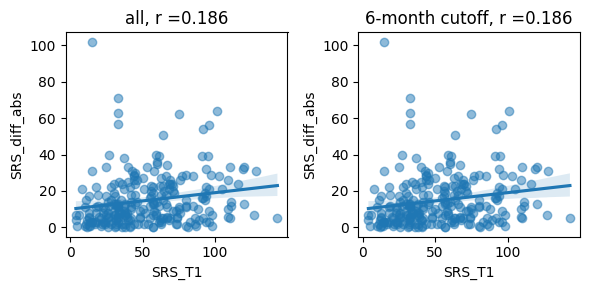

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(6, 3))

# without 6-month cutoff
corr_srs = t_rt_all['SRS_T1'].corr(t_rt_all['SRS_diff_abs'])
sns.regplot(data=t_rt_all, x='SRS_T1', y='SRS_diff_abs', ax=axes[0],scatter_kws={'alpha': 0.5})
axes[0].set_title('all, r =' + str(np.round(corr_srs,3)))

# with 6-month cutoff
corr_srs = t_rt_cutoff['SRS_T1'].corr(t_rt_cutoff['SRS_diff_abs'])
sns.regplot(data=t_rt_cutoff, x='SRS_T1', y='SRS_diff_abs', ax=axes[1],scatter_kws={'alpha': 0.5})
axes[1].set_title('6-month cutoff, r =' + str(np.round(corr_srs,3)))

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'R-online = 0.13, R-in-lab = 0.45')

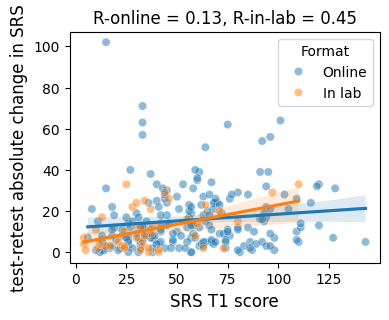

In [ ]:
#plot correlation, broken down by format
fig, ax = plt.subplots(figsize=(4,3))
sns.scatterplot(data=t_rt_all, x='SRS_T1',  y='SRS_diff_abs', hue = 'format', alpha=0.5)
sns.regplot(data=t_rt_all[t_rt_all['format'] == 'Online'], x='SRS_T1', y='SRS_diff_abs', scatter=False, color=sns.color_palette()[0])
sns.regplot(data=t_rt_all[t_rt_all['format'] == 'In lab'], x='SRS_T1', y='SRS_diff_abs', scatter=False, color=sns.color_palette()[1])
ax.set_xlabel('SRS T1 score', fontsize = 12)
ax.set_ylabel('test-retest absolute change in SRS', fontsize = 12)
r1, p1 = pearsonr(t_rt_all[t_rt_all['format'] == 'Online']['SRS_T1'], t_rt_all[t_rt_all['format'] == 'Online']['SRS_diff_abs'])
r2, p2 = pearsonr(t_rt_all[t_rt_all['format'] == 'In lab']['SRS_T1'], t_rt_all[t_rt_all['format'] == 'In lab']['SRS_diff_abs'])
ax.legend(title='Format', loc='upper right')
ax.set_title(f'R-online = {r1:.2f}, R-in-lab = {r2:.2f}')

# OLD STUFF

#### Does that difference change over time during the 2020-2024 period?

Text(0.5, 1.0, 'SRS scores over time, in-lab vs online participants')

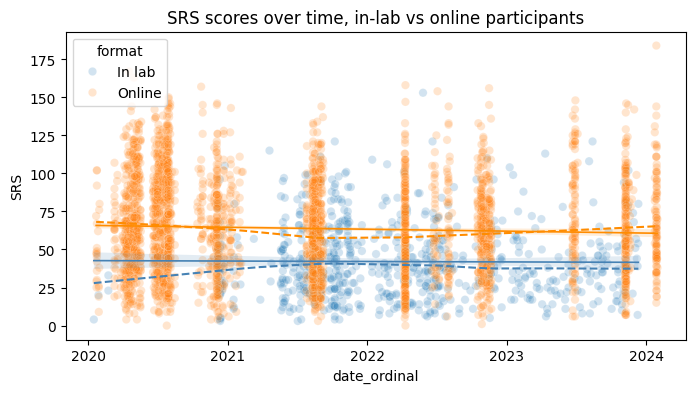

In [ ]:
# plot SRS as a function of time only after 2020, and plot separate trendline for online vs in-person
lowess_lab = sm.nonparametric.lowess(data_post2020.loc[data_post2020['format']=='In lab','SRS'], data_post2020.loc[data_post2020['format']=='In lab','date_ordinal'], frac=.7)
lowess_lab_x = list(zip(*lowess_lab))[0]
lowess_lab_y = list(zip(*lowess_lab))[1]
lowess_online = sm.nonparametric.lowess(data_post2020.loc[data_post2020['format']=='Online','SRS'], data_post2020.loc[data_post2020['format']=='Online','date_ordinal'], frac=.7)
lowess_online_x = list(zip(*lowess_online))[0]
lowess_online_y = list(zip(*lowess_online))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='SRS', hue='format', ax=ax, alpha=0.2)
ax.plot(lowess_lab_x,lowess_lab_y, color = 'steelblue', linestyle='--')
ax.plot(lowess_online_x,lowess_online_y, color = 'darkorange', linestyle='--')
sns.regplot(data=data_post2020[data_post2020['format'] == 'In lab'], x='date_ordinal', y='SRS', ax=ax, scatter=False, color='steelblue', line_kws={'linewidth': 1.2})
sns.regplot(data=data_post2020[data_post2020['format'] == 'Online'], x='date_ordinal', y='SRS', ax=ax, scatter=False, color='darkorange', line_kws={'linewidth': 1.2})
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings
ax.set_title('SRS scores over time, in-lab vs online participants')

In [ ]:
#calculate correlation coefficient
pearson_corr, pearson_p_value = pearsonr(data_post2020[data_post2020['format'] == 'In lab']['date_ordinal'], data_post2020[data_post2020['format'] == 'In lab']['SRS'])
print(f"Pearson correlation coefficient - In lab: {pearson_corr}")
print(f"Pearson p-value - In lab: {pearson_p_value}")
pearson_corr, pearson_p_value = pearsonr(data_post2020[data_post2020['format'] == 'Online']['date_ordinal'], data_post2020[data_post2020['format'] == 'Online']['SRS'])
print(f"Pearson correlation coefficient - Online: {pearson_corr}")
print(f"Pearson p-value - Online: {pearson_p_value}")

Pearson correlation coefficient - In lab: -0.009386255922912664
Pearson p-value - In lab: 0.8089497264234442
Pearson correlation coefficient - Online: -0.04896915526189247
Pearson p-value - Online: 0.007810014613923294


Look at breakdown year by year

In [ ]:
data_2020 = data_merged[(data_merged['date'] > pd.to_datetime('2020-01-01')) & (data_merged['date'] < pd.to_datetime('2021-01-01'))]
print(data_2020[["SRS","format"]].groupby(["format"]).agg(['count','mean','std']))

#run t-tests for independent samples, assuming unequal variance
sample1 = data_2020[data_2020['format']=='In lab']['SRS']
sample2 = data_2020[data_2020['format']=='Online']['SRS']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

         SRS                      
       count       mean        std
format                            
In lab    40  37.475000  23.750830
Online  1339  67.345034  32.500461
T-statistic (unequal variances): -7.740479551294771
df (Welch's t-test): 43.48116744697422
P-value (unequal variances): 1.0308899674816964e-09
Effect size Cohen's d (unequal variances): -0.9251900430070569


In [ ]:
data_2021 = data_merged[(data_merged['date'] > pd.to_datetime('2021-01-01')) & (data_merged['date'] < pd.to_datetime('2022-01-01'))]
print(data_2021[["SRS","format"]].groupby(["format"]).agg(['count','mean','std']))

#run t-tests for independent samples, assuming unequal variance
sample1 = data_2021[data_2021['format']=='In lab']['SRS']
sample2 = data_2021[data_2021['format']=='Online']['SRS']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

         SRS                      
       count       mean        std
format                            
In lab   275  43.709091  24.969524
Online   552  59.769928  28.475346
T-statistic (unequal variances): -8.309180817556047
df (Welch's t-test): 615.5724403193234
P-value (unequal variances): 6.160322809723526e-16
Effect size Cohen's d (unequal variances): -0.5870005438667559


In [ ]:
data_2022 = data_merged[(data_merged['date'] > pd.to_datetime('2022-01-01')) & (data_merged['date'] < pd.to_datetime('2023-01-01'))]
print(data_2022[["SRS","format"]].groupby(["format"]).agg(['count','mean','std']))

#run t-tests for independent samples, assuming unequal variance
sample1 = data_2022[data_2022['format']=='In lab']['SRS']
sample2 = data_2022[data_2022['format']=='Online']['SRS']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

         SRS                      
       count       mean        std
format                            
In lab   214  42.037383  24.572371
Online   661  58.095310  29.644740
T-statistic (unequal variances): -7.881559021467738
df (Welch's t-test): 430.20178897138027
P-value (unequal variances): 2.6787082658516667e-14
Effect size Cohen's d (unequal variances): -0.5636226765849796


In [ ]:
data_2023 = data_merged[(data_merged['date'] > pd.to_datetime('2023-01-01')) & (data_merged['date'] < pd.to_datetime('2024-01-01'))]
print(data_2023[["SRS","format"]].groupby(["format"]).agg(['count','mean','std']))

#run t-tests for independent samples, assuming unequal variance
sample1 = data_2023[data_2023['format']=='In lab']['SRS']
sample2 = data_2023[data_2023['format']=='Online']['SRS']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

         SRS                      
       count       mean        std
format                            
In lab   137  40.138686  23.976760
Online   292  66.787671  32.683257
T-statistic (unequal variances): -9.50873935167944
df (Welch's t-test): 351.5999329473907
P-value (unequal variances): 3.132721133427518e-19
Effect size Cohen's d (unequal variances): -0.8828837250443713


In [ ]:
data_2024 = data_merged[(data_merged['date'] > pd.to_datetime('2024-01-01')) & (data_merged['date'] < pd.to_datetime('2025-01-01'))]
data_2024[["SRS","format"]].groupby(["format"]).agg(['count','mean','std'])

SRS                      
       count       mean        std
format                            
Online   106  67.754717  31.030802

In [ ]:
data_merged['year'] = data_merged['date'].dt.year
data_post2020['year'] = data_post2020['date'].dt.year
data_post2020

<ipython-input-56-d03febd99164>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_post2020['year'] = data_post2020['date'].dt.year


,Unnamed: 0_x,Source,Alternative ID_x,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_y,date_ordinal,year
0,0,OD_R01,UCLA104,QT000,f,Woman,"Asian, Pacific Islander / Hawaiian, Multiracial",Bachelor's Degree,30.0,99.0,...,2.0,3.0,1.0,1.0,0.0,3.0,1.0,1/18/2023,738538,2023
1,1,OD_R01,R01_0163,QT001,m,Man,Asian,Bachelor's Degree,23.0,17.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1/21/2023,738541,2023
2,2,OD_R01,R01_0166,QT002,f,Woman,Caucasian / White,Bachelor's Degree,32.0,75.0,...,3.0,1.0,2.0,0.0,0.0,3.0,0.0,1/31/2023,738551,2023
3,3,OD_R01,UCLA110,QT003,m,Man,Asian,Master's Degree,30.0,35.0,...,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1/17/2023,738537,2023
4,4,OD_R01,R01_0164,QT004,f,Woman,Caucasian / White,Bachelor's Degree,24.0,23.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1/25/2023,738545,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3797,3797,WG_Task4,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,3.0,2.0,2.0,2.0,0.0,3.0,1.0,1/28/2024,738913,2024
3798,3798,WG_Task4,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,3.0,3.0,1.0,1.0,0.0,3.0,3.0,1/29/2024,738914,2024
3799,3799,WG_Task4,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,0.0,0.0,3.0,0.0,0.0,1.0,3.0,1/29/2024,738914,2024
3800,3800,WG_Task4,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,1.0,2.0,1.0,2.0,2.0,1.0,1/29/2024,738914,2024


Text(0.5, 0, ' ')

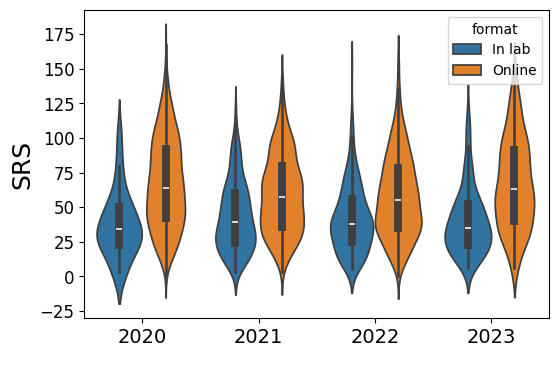

In [ ]:
fig,ax = plt.subplots(figsize=(6,4))
sns.violinplot(data=data_post2020[data_post2020["year"] < 2024], x="year", y="SRS", hue="format",ax=ax)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('SRS',fontsize=18)
ax.set_xlabel(' ')

#### Is that difference specific to SRS scores or is it also observed for other psychiatric symptoms? Are effect sizes comparable?

Social anxiety

Text(0.5, 0, ' ')

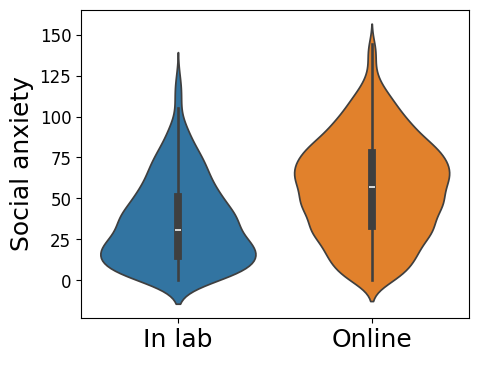

In [ ]:
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_merged, x="format", y="LSAS", hue="format",ax=ax)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Social anxiety',fontsize=18)
ax.set_xlabel(' ')

In [ ]:
#run t-tests for independent samples, assuming unequal variance
sample1 = data_merged[data_merged['format']=='In lab']['LSAS'].dropna()
sample2 = data_merged[data_merged['format']=='Online']['LSAS'].dropna()
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): -17.89656492865024
df (Welch's t-test): 1088.5737140812757
P-value (unequal variances): 5.470640840368756e-63
Effect size Cohen's d (unequal variances): -0.7236052585160249


Text(0.5, 1.0, 'LSAS scores over time, in-lab vs online participants')

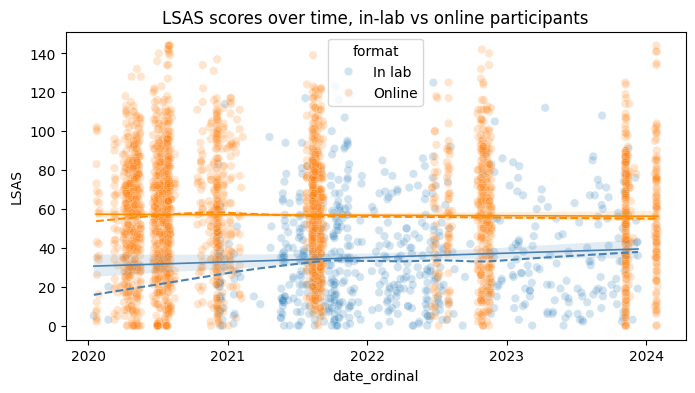

In [ ]:
# plot LSAS as a function of time only after 2020, and plot separate trendline for online vs in-person
lowess_lab = sm.nonparametric.lowess(data_post2020.loc[data_post2020['format']=='In lab','LSAS'], data_post2020.loc[data_post2020['format']=='In lab','date_ordinal'], frac=.7)
lowess_lab_x = list(zip(*lowess_lab))[0]
lowess_lab_y = list(zip(*lowess_lab))[1]
lowess_online = sm.nonparametric.lowess(data_post2020.loc[data_post2020['format']=='Online','LSAS'], data_post2020.loc[data_post2020['format']=='Online','date_ordinal'], frac=.7)
lowess_online_x = list(zip(*lowess_online))[0]
lowess_online_y = list(zip(*lowess_online))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='LSAS', hue='format', ax=ax, alpha=0.2)
ax.plot(lowess_lab_x,lowess_lab_y, color = 'steelblue', linestyle='--')
ax.plot(lowess_online_x,lowess_online_y, color = 'darkorange', linestyle='--')
sns.regplot(data=data_post2020[data_post2020['format'] == 'In lab'], x='date_ordinal', y='LSAS', ax=ax, scatter=False, color='steelblue', line_kws={'linewidth': 1.2})
sns.regplot(data=data_post2020[data_post2020['format'] == 'Online'], x='date_ordinal', y='LSAS', ax=ax, scatter=False, color='darkorange', line_kws={'linewidth': 1.2})
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings
ax.set_title('LSAS scores over time, in-lab vs online participants')

In [ ]:
#calculate correlation coefficient
pearson_corr, pearson_p_value = pearsonr(clean_LSAS_data[clean_LSAS_data['format'] == 'In lab']['date_ordinal'], clean_LSAS_data[clean_LSAS_data['format'] == 'In lab']['LSAS'])
print(f"Pearson correlation coefficient - In lab: {pearson_corr}")
print(f"Pearson p-value - In lab: {pearson_p_value}")
pearson_corr, pearson_p_value = pearsonr(clean_LSAS_data[clean_LSAS_data['format'] == 'Online']['date_ordinal'], clean_LSAS_data[clean_LSAS_data['format'] == 'Online']['LSAS'])
print(f"Pearson correlation coefficient - Online: {pearson_corr}")
print(f"Pearson p-value - Online: {pearson_p_value}")

Pearson correlation coefficient - In lab: 0.07019910198133002
Pearson p-value - In lab: 0.08120433714054814
Pearson correlation coefficient - Online: -0.010147042661837429
Pearson p-value - Online: 0.6074139712882417


OCD

Text(0.5, 0, ' ')

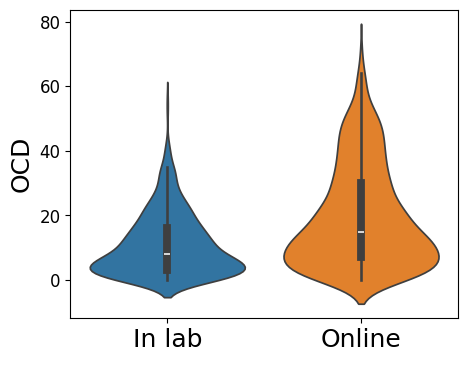

In [ ]:
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_merged, x="format", y="OCI-R", hue="format",ax=ax)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('OCD',fontsize=18)
ax.set_xlabel(' ')

In [ ]:
#run t-tests for independent samples, assuming unequal variance
sample1 = data_merged[data_merged['format']=='In lab']['OCI-R'].dropna()
sample2 = data_merged[data_merged['format']=='Online']['OCI-R'].dropna()
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): -15.646352121988105
df (Welch's t-test): 1844.9932917360584
P-value (unequal variances): 6.5497536924027086e-52
Effect size Cohen's d (unequal variances): -0.6064631924013593


Trait anxiety

Text(0.5, 0, ' ')

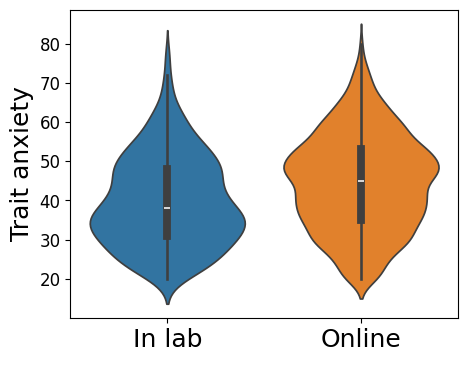

In [ ]:
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_merged, x="format", y="STAI_trait", hue="format",ax=ax)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Trait anxiety',fontsize=18)
ax.set_xlabel(' ')

In [ ]:
#run t-tests for independent samples, assuming unequal variance
sample1 = data_merged[data_merged['format']=='In lab']['STAI_trait'].dropna()
sample2 = data_merged[data_merged['format']=='Online']['STAI_trait'].dropna()
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): -9.579288653388437
df (Welch's t-test): 1028.5186391433413
P-value (unequal variances): 7.042734558183916e-21
Effect size Cohen's d (unequal variances): -0.3991394254549308


Depression

Text(0.5, 0, ' ')

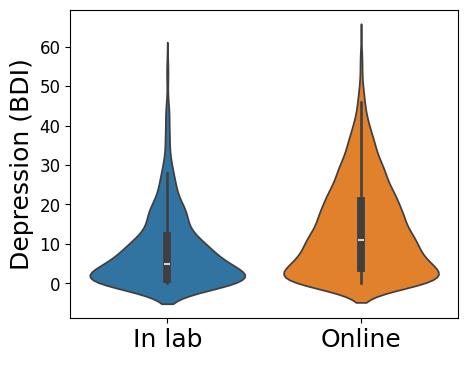

In [ ]:
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_merged, x="format", y="BDI", hue="format",ax=ax)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Depression (BDI)',fontsize=18)
ax.set_xlabel(' ')

In [ ]:
#run t-tests for independent samples, assuming unequal variance
sample1 = data_merged[data_merged['format']=='In lab']['BDI'].dropna()
sample2 = data_merged[data_merged['format']=='Online']['BDI'].dropna()
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): -12.422348233686774
df (Welch's t-test): 1178.3318845663723
P-value (unequal variances): 2.199027052808938e-33
Effect size Cohen's d (unequal variances): -0.4677743744981618


AQ (autism quotient)

Text(0.5, 0, ' ')

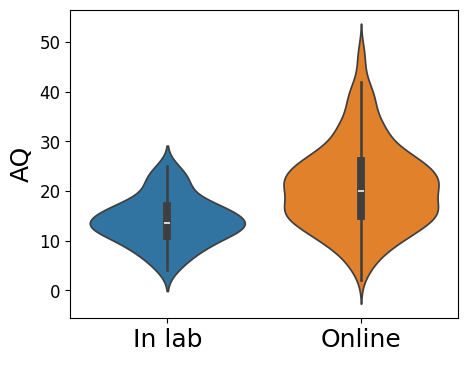

In [ ]:
fig,ax = plt.subplots(figsize=(5,4))
sns.violinplot(data=data_merged, x="format", y="AQ", hue="format",ax=ax)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('AQ',fontsize=18)
ax.set_xlabel(' ')

In [ ]:
#run t-tests for independent samples, assuming unequal variance
sample1 = data_merged[data_merged['format']=='In lab']['AQ'].dropna()
sample2 = data_merged[data_merged['format']=='Online']['AQ'].dropna()
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): -10.19669850308842
df (Welch's t-test): 107.4195165246123
P-value (unequal variances): 1.755846923932112e-17
Effect size Cohen's d (unequal variances): -0.828933880252211


#### How correlated are SRS scores with other psychiatric symptoms?

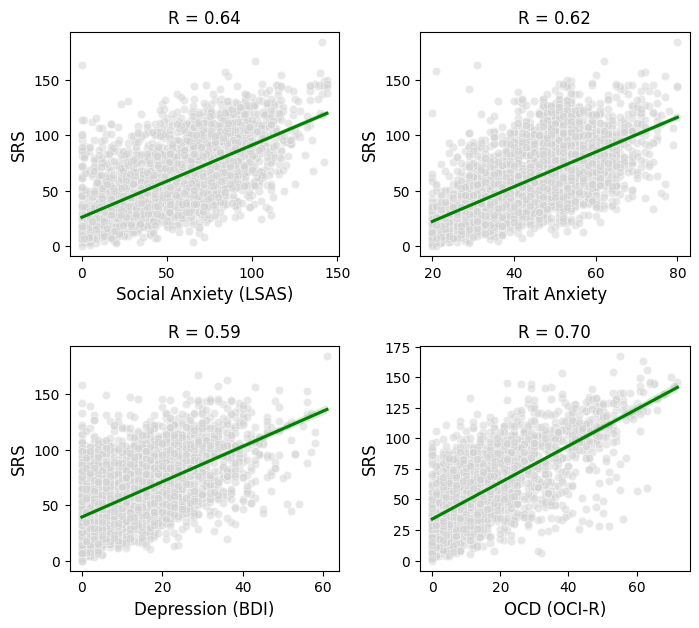

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(8,7))
#subplot 1, LSAS vs SRS
sns.scatterplot(data=clean_LSAS_data, x='LSAS',  y='SRS', color = 'lightgrey', ax=ax1, alpha=0.5)
sns.regplot(data=clean_LSAS_data, x='LSAS', y='SRS', ax=ax1, scatter=False, color='green')
ax1.set_xlabel('Social Anxiety (LSAS)', fontsize = 12)
ax1.set_ylabel('SRS', fontsize = 12)
r_value, p_value = pearsonr(clean_LSAS_data['LSAS'], clean_LSAS_data['SRS'])
ax1.set_title(f'R = {r_value:.2f}')
#subplot 2, Trait Anxiety vs SRS
sns.scatterplot(data=clean_STAI_data, x='STAI_trait',  y='SRS', color = 'lightgrey', ax=ax2, alpha=0.5)
sns.regplot(data=clean_STAI_data, x='STAI_trait', y='SRS', ax=ax2, scatter=False, color='green')
ax2.set_xlabel('Trait Anxiety', fontsize = 12)
ax2.set_ylabel('SRS', fontsize = 12)
r_value, p_value = pearsonr(clean_STAI_data['STAI_trait'], clean_STAI_data['SRS'])
ax2.set_title(f'R = {r_value:.2f}')
#subplot 3, BDI vs SRS
sns.scatterplot(data=clean_BDI_data, x='BDI',  y='SRS', color = 'lightgrey', ax=ax3, alpha=0.5)
sns.regplot(data=clean_BDI_data, x='BDI', y='SRS', ax=ax3, scatter=False, color='green')
ax3.set_xlabel('Depression (BDI)', fontsize = 12)
ax3.set_ylabel('SRS', fontsize = 12)
r_value, p_value = pearsonr(clean_BDI_data['BDI'], clean_BDI_data['SRS'])
ax3.set_title(f'R = {r_value:.2f}')
#subplot 4, OCD vs SRS
sns.scatterplot(data=clean_OCD_data, x='OCI-R',  y='SRS', color = 'lightgrey', ax=ax4, alpha=0.5)
sns.regplot(data=clean_OCD_data, x='OCI-R', y='SRS', ax=ax4, scatter=False, color='green')
ax4.set_xlabel('OCD (OCI-R)', fontsize = 12)
ax4.set_ylabel('SRS', fontsize = 12)
r_value, p_value = pearsonr(clean_OCD_data['OCI-R'], clean_OCD_data['SRS'])
ax4.set_title(f'R = {r_value:.2f}')
plt.subplots_adjust(wspace=0.3, hspace=0.4)

#### Do these correlations vary between in-lab and online participants?

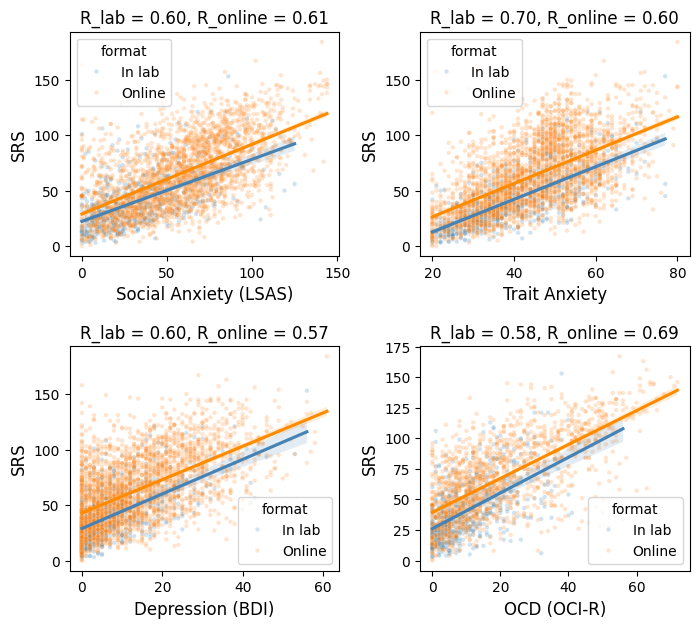

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(8,7))
#subplot 1, LSAS vs SRS
sns.scatterplot(data=clean_LSAS_data, x='LSAS', y='SRS', hue='format', ax=ax1, alpha=0.2, s=10)
sns.regplot(data=clean_LSAS_data[clean_LSAS_data['format'] == 'In lab'], x='LSAS', y='SRS', ax=ax1, scatter=False, color='steelblue')
sns.regplot(data=clean_LSAS_data[clean_LSAS_data['format'] == 'Online'], x='LSAS', y='SRS', ax=ax1, scatter=False, color='darkorange')
ax1.set_xlabel('Social Anxiety (LSAS)', fontsize = 12)
ax1.set_ylabel('SRS', fontsize = 12)
r_lab, p = pearsonr(clean_LSAS_data[clean_LSAS_data['format'] == 'In lab']['LSAS'], clean_LSAS_data[clean_LSAS_data['format'] == 'In lab']['SRS'])
r_online, p = pearsonr(clean_LSAS_data[clean_LSAS_data['format'] == 'Online']['LSAS'], clean_LSAS_data[clean_LSAS_data['format'] == 'Online']['SRS'])
ax1.set_title(f'R_lab = {r_lab:.2f}, R_online = {r_online:.2f}')
#subplot 2, Trait Anxiety vs SRS
sns.scatterplot(data=clean_STAI_data, x='STAI_trait', y='SRS', hue='format', ax=ax2, alpha=0.2, s=10)
sns.regplot(data=clean_STAI_data[clean_STAI_data['format'] == 'In lab'], x='STAI_trait', y='SRS', ax=ax2, scatter=False, color='steelblue')
sns.regplot(data=clean_STAI_data[clean_STAI_data['format'] == 'Online'], x='STAI_trait', y='SRS', ax=ax2, scatter=False, color='darkorange')
ax2.set_xlabel('Trait Anxiety', fontsize = 12)
ax2.set_ylabel('SRS', fontsize = 12)
r_lab, p = pearsonr(clean_STAI_data[clean_STAI_data['format'] == 'In lab']['STAI_trait'], clean_STAI_data[clean_STAI_data['format'] == 'In lab']['SRS'])
r_online, p = pearsonr(clean_STAI_data[clean_STAI_data['format'] == 'Online']['STAI_trait'], clean_STAI_data[clean_STAI_data['format'] == 'Online']['SRS'])
ax2.set_title(f'R_lab = {r_lab:.2f}, R_online = {r_online:.2f}')
#subplot 3, BDI vs SRS
sns.scatterplot(data=clean_BDI_data, x='BDI', y='SRS', hue='format', ax=ax3, alpha=0.2, s=10)
sns.regplot(data=clean_BDI_data[clean_BDI_data['format'] == 'In lab'], x='BDI', y='SRS', ax=ax3, scatter=False, color='steelblue')
sns.regplot(data=clean_BDI_data[clean_BDI_data['format'] == 'Online'], x='BDI', y='SRS', ax=ax3, scatter=False, color='darkorange')
ax3.set_xlabel('Depression (BDI)', fontsize = 12)
ax3.set_ylabel('SRS', fontsize = 12)
r_lab, p = pearsonr(clean_BDI_data[clean_BDI_data['format'] == 'In lab']['BDI'], clean_BDI_data[clean_BDI_data['format'] == 'In lab']['SRS'])
r_online, p = pearsonr(clean_BDI_data[clean_BDI_data['format'] == 'Online']['BDI'], clean_BDI_data[clean_BDI_data['format'] == 'Online']['SRS'])
ax3.set_title(f'R_lab = {r_lab:.2f}, R_online = {r_online:.2f}')
#subplot 4, OCD vs SRS
sns.scatterplot(data=clean_OCD_data, x='OCI-R',  y='SRS', hue='format', ax=ax4, alpha=0.2, s=10)
sns.regplot(data=clean_OCD_data[clean_OCD_data['format'] == 'In lab'], x='OCI-R', y='SRS', ax=ax4, scatter=False, color='steelblue')
sns.regplot(data=clean_OCD_data[clean_OCD_data['format'] == 'Online'], x='OCI-R', y='SRS', ax=ax4, scatter=False, color='darkorange')
ax4.set_xlabel('OCD (OCI-R)', fontsize = 12)
ax4.set_ylabel('SRS', fontsize = 12)
r_lab, p = pearsonr(clean_OCD_data[clean_OCD_data['format'] == 'In lab']['OCI-R'], clean_OCD_data[clean_OCD_data['format'] == 'In lab']['SRS'])
r_online, p = pearsonr(clean_OCD_data[clean_OCD_data['format'] == 'Online']['OCI-R'], clean_OCD_data[clean_OCD_data['format'] == 'Online']['SRS'])
ax4.set_title(f'R_lab = {r_lab:.2f}, R_online = {r_online:.2f}')
plt.subplots_adjust(wspace=0.3, hspace=0.4)

#### Do these correlations vary across time? e.g. between years during the 2020-2024 period

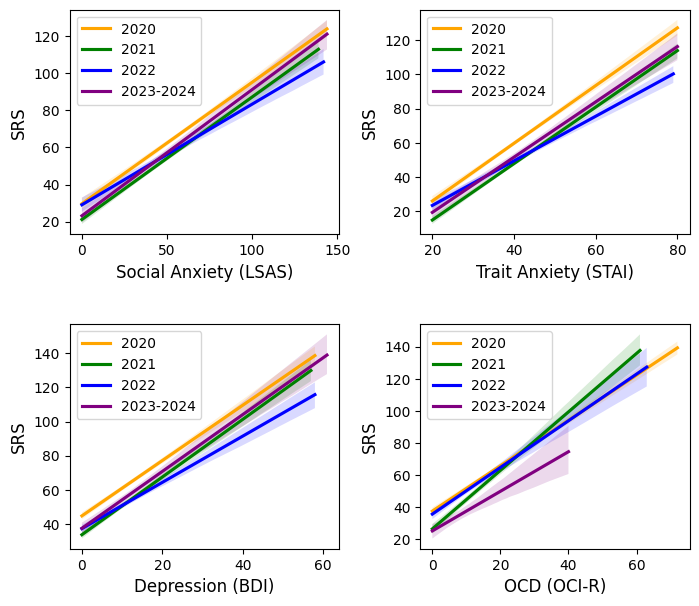

In [ ]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(8,7))
#subplot 1, LSAS vs SRS
sns.regplot(data=data_2020, x='LSAS', y='SRS', ax=ax1, scatter=False, color='orange', scatter_kws={'alpha': 0.2, 's': 10}, label='2020')
sns.regplot(data=data_2021, x='LSAS', y='SRS', ax=ax1, scatter=False, color='green', scatter_kws={'alpha': 0.2, 's': 10}, label='2021')
sns.regplot(data=data_2022, x='LSAS', y='SRS', ax=ax1, scatter=False, color='blue', scatter_kws={'alpha': 0.2, 's': 10}, label='2022')
sns.regplot(data=data_post2020[data_post2020['year']>=2023], x='LSAS', y='SRS', ax=ax1, scatter=False, color='purple', scatter_kws={'alpha': 0.2, 's': 10}, label='2023-2024')
ax1.set_xlabel('Social Anxiety (LSAS)', fontsize = 12)
ax1.set_ylabel('SRS', fontsize = 12)
ax1.legend()
#subplot 2, Trait Anxiety vs SRS
sns.regplot(data=data_2020, x='STAI_trait', y='SRS', ax=ax2, scatter=False, color='orange', scatter_kws={'alpha': 0.2, 's': 10}, label='2020')
sns.regplot(data=data_2021, x='STAI_trait', y='SRS', ax=ax2, scatter=False, color='green', scatter_kws={'alpha': 0.2, 's': 10}, label='2021')
sns.regplot(data=data_2022, x='STAI_trait', y='SRS', ax=ax2, scatter=False, color='blue', scatter_kws={'alpha': 0.2, 's': 10}, label='2022')
sns.regplot(data=data_post2020[data_post2020['year']>=2023], x='STAI_trait', y='SRS', ax=ax2, scatter=False, color='purple', scatter_kws={'alpha': 0.2, 's': 10}, label='2023-2024')
ax2.set_xlabel('Trait Anxiety (STAI)', fontsize = 12)
ax2.set_ylabel('SRS', fontsize = 12)
ax2.legend()
#subplot 3, BDI vs SRS
sns.regplot(data=data_2020, x='BDI', y='SRS', ax=ax3, scatter=False, color='orange', scatter_kws={'alpha': 0.2, 's': 10}, label='2020')
sns.regplot(data=data_2021, x='BDI', y='SRS', ax=ax3, scatter=False, color='green', scatter_kws={'alpha': 0.2, 's': 10}, label='2021')
sns.regplot(data=data_2022, x='BDI', y='SRS', ax=ax3, scatter=False, color='blue', scatter_kws={'alpha': 0.2, 's': 10}, label='2022')
sns.regplot(data=data_post2020[data_post2020['year']>=2023], x='BDI', y='SRS', ax=ax3, scatter=False, color='purple', scatter_kws={'alpha': 0.2, 's': 10}, label='2023-2024')
ax3.set_xlabel('Depression (BDI)', fontsize = 12)
ax3.set_ylabel('SRS', fontsize = 12)
ax3.legend()
#subplot 4, OCD vs SRS
sns.regplot(data=data_2020, x='OCI-R', y='SRS', ax=ax4, scatter=False, color='orange', scatter_kws={'alpha': 0.2, 's': 10}, label='2020')
sns.regplot(data=data_2021, x='OCI-R', y='SRS', ax=ax4, scatter=False, color='green', scatter_kws={'alpha': 0.2, 's': 10}, label='2021')
sns.regplot(data=data_2022, x='OCI-R', y='SRS', ax=ax4, scatter=False, color='blue', scatter_kws={'alpha': 0.2, 's': 10}, label='2022')
sns.regplot(data=data_post2020[data_post2020['year']>=2023], x='OCI-R', y='SRS', ax=ax4, scatter=False, color='purple', scatter_kws={'alpha': 0.2, 's': 10}, label='2023-2024')
ax4.set_xlabel('OCD (OCI-R)', fontsize = 12)
ax4.set_ylabel('SRS', fontsize = 12)
ax4.legend()
plt.subplots_adjust(wspace=0.3, hspace=0.4)

## 1. Temporal stability of autistic traits

#### Plot SRS as a function of time

In [ ]:
# extract the trendline
# lowess will return our "smoothed" data with a y value for at every x-value
lowess = sm.nonparametric.lowess(data_merged['SRS'], data_merged['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

[Text(735234, 0, '2014'),
 Text(735599, 0, '2015'),
 Text(735964, 0, '2016'),
 Text(736330, 0, '2017'),
 Text(736695, 0, '2018'),
 Text(737060, 0, '2019'),
 Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

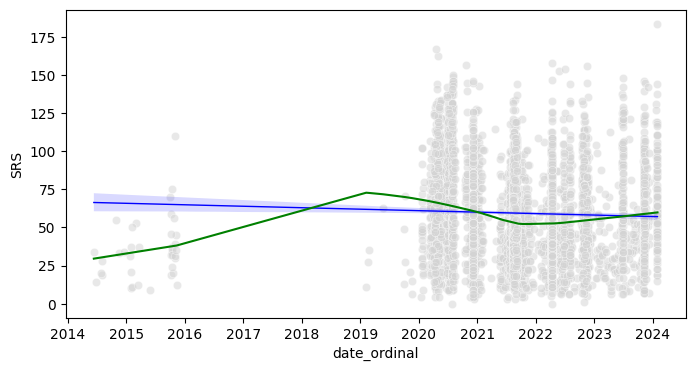

In [ ]:
fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_merged, x='date_ordinal',  y='SRS', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=data_merged, x='date_ordinal', y='SRS', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2014-01-01', '2015-01-01', '2016-01-01','2017-01-01',
                             '2018-01-01','2019-01-01','2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2014','2015','2016','2017','2018','2019','2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
pearson_corr, pearson_p_value = pearsonr(data_merged['date_ordinal'], data_merged['SRS'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: -0.04094074043157938
Pearson p-value: 0.013185654727622143


Because data from 2014 to 2019 is so sparse, let's only look at 2020-2024

In [ ]:
data_post2020 = data_merged[data_merged['date'] > pd.to_datetime('2020-01-01')]
data_post2020

,Unnamed: 0_x,Source,Alternative ID_x,ID,Sex,Gender,Race,Education,age,SRS,...,SRS_6_8,SRS_6_9,SRS_6_10,SRS_7_1,SRS_7_2,SRS_7_3,SRS_7_4,SRS_7_5,date_y,date_ordinal
0,0,OD_R01,UCLA104,QT000,f,Woman,"Asian, Pacific Islander / Hawaiian, Multiracial",Bachelor's Degree,30.0,99.0,...,2.0,2.0,3.0,1.0,1.0,0.0,3.0,1.0,1/18/2023,738538
1,1,OD_R01,R01_0163,QT001,m,Man,Asian,Bachelor's Degree,23.0,17.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1/21/2023,738541
2,2,OD_R01,R01_0166,QT002,f,Woman,Caucasian / White,Bachelor's Degree,32.0,75.0,...,1.0,3.0,1.0,2.0,0.0,0.0,3.0,0.0,1/31/2023,738551
3,3,OD_R01,UCLA110,QT003,m,Man,Asian,Master's Degree,30.0,35.0,...,1.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,1/17/2023,738537
4,4,OD_R01,R01_0164,QT004,f,Woman,Caucasian / White,Bachelor's Degree,24.0,23.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1/25/2023,738545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3797,3797,WG_Task4,NaN,64f9f86e6bf2358fd13945f1,NaN,NaN,NaN,NaN,NaN,111.0,...,2.0,3.0,2.0,2.0,2.0,0.0,3.0,1.0,1/28/2024,738913
3798,3798,WG_Task4,NaN,65660b793fa436bfc6e71790,NaN,NaN,NaN,NaN,NaN,104.0,...,2.0,3.0,3.0,1.0,1.0,0.0,3.0,3.0,1/29/2024,738914
3799,3799,WG_Task4,NaN,60086bc08462644784ceb1af,NaN,NaN,NaN,NaN,NaN,91.0,...,3.0,0.0,0.0,3.0,0.0,0.0,1.0,3.0,1/29/2024,738914
3800,3800,WG_Task4,NaN,65498af02717744d9946615d,NaN,NaN,NaN,NaN,NaN,64.0,...,1.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,1/29/2024,738914


[Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

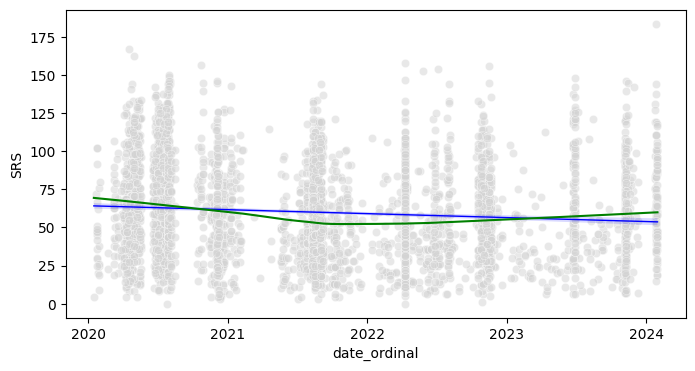

In [ ]:
lowess = sm.nonparametric.lowess(data_post2020['SRS'], data_post2020['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='SRS', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=data_post2020, x='date_ordinal', y='SRS', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
pearson_corr, pearson_p_value = pearsonr(data_post2020['date_ordinal'], data_post2020['SRS'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: -0.09676465791100919
Pearson p-value: 5.528098189005132e-09


#### Repeat above analyses with AQ instead of SRS

In [ ]:
print(f"SRS counts = {data_merged['SRS'].count()}")
print(f"SRS counts 2020-2024 = {data_post2020['SRS'].count()}")
print(f"AQ counts = {data_merged['AQ'].count()}")
print(f"AQ counts 2020-2024 = {data_post2020['AQ'].count()}")

SRS counts = 3665
SRS counts 2020-2024 = 3616
AQ counts = 741
AQ counts 2020-2024 = 693


In [ ]:
clean_AQ_data = data_merged.dropna(subset=['date_ordinal', 'AQ'])

[Text(735234, 0, '2014'),
 Text(735599, 0, '2015'),
 Text(735964, 0, '2016'),
 Text(736330, 0, '2017'),
 Text(736695, 0, '2018'),
 Text(737060, 0, '2019'),
 Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

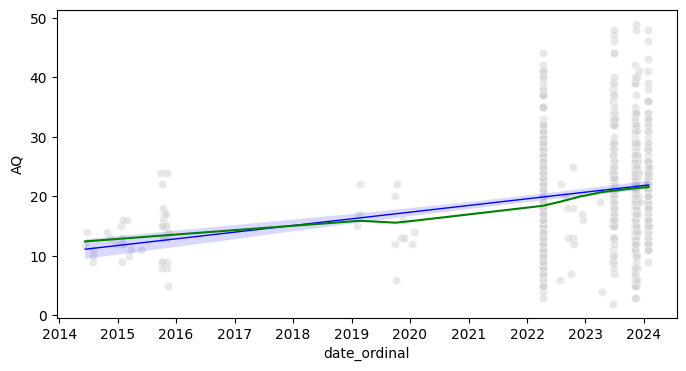

In [ ]:
lowess = sm.nonparametric.lowess(clean_AQ_data['AQ'], clean_AQ_data['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=clean_AQ_data, x='date_ordinal',  y='AQ', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=clean_AQ_data, x='date_ordinal', y='AQ', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2014-01-01', '2015-01-01', '2016-01-01','2017-01-01',
                             '2018-01-01','2019-01-01','2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2014','2015','2016','2017','2018','2019','2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
pearson_corr, pearson_p_value = pearsonr(clean_AQ_data['date_ordinal'], clean_AQ_data['AQ'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: 0.24924859653059495
Pearson p-value: 5.888246590408932e-12


AQ for 2020-2024 period

In [ ]:
clean_AQ_data_post2020 = data_post2020.dropna(subset=['date_ordinal', 'AQ'])

[Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

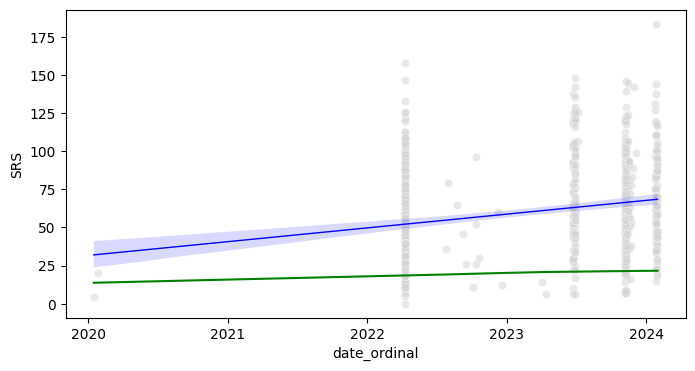

In [ ]:
lowess = sm.nonparametric.lowess(clean_AQ_data_post2020['AQ'], clean_AQ_data_post2020['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=clean_AQ_data_post2020, x='date_ordinal',  y='SRS', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=clean_AQ_data_post2020, x='date_ordinal', y='SRS', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
pearson_corr, pearson_p_value = pearsonr(clean_AQ_data_post2020['date_ordinal'], clean_AQ_data_post2020['AQ'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: 0.16302785389925198
Pearson p-value: 1.6117893757429294e-05


#### Other symptom dimensions as a function of time
For 2020-2024 period only since no data prior to 2019

[Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

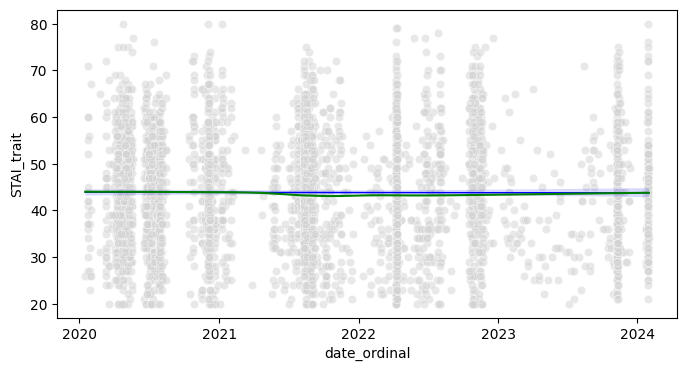

In [ ]:
#trait anxiety
lowess = sm.nonparametric.lowess(data_post2020['STAI_trait'], data_post2020['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='STAI_trait', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=data_post2020, x='date_ordinal', y='STAI_trait', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
clean_STAI_data = data_post2020.dropna(subset=['date_ordinal', 'STAI_trait'])
pearson_corr, pearson_p_value = pearsonr(clean_STAI_data['date_ordinal'], clean_STAI_data['STAI_trait'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: -0.0029036291972962037
Pearson p-value: 0.8636383456549956


[Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

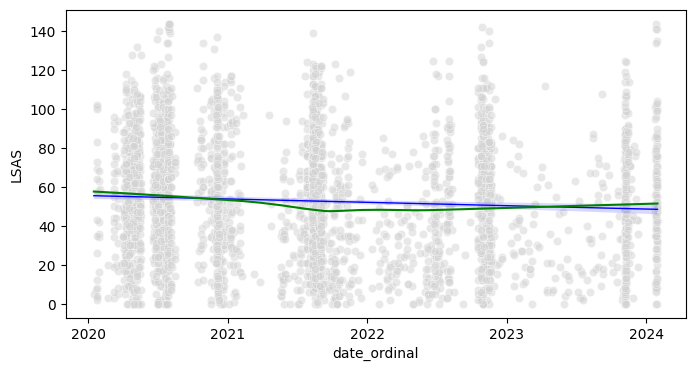

In [ ]:
#social anxiety
lowess = sm.nonparametric.lowess(data_post2020['LSAS'], data_post2020['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='LSAS', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=data_post2020, x='date_ordinal', y='LSAS', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
clean_LSAS_data = data_post2020.dropna(subset=['date_ordinal', 'LSAS'])
pearson_corr, pearson_p_value = pearsonr(clean_LSAS_data['date_ordinal'], clean_LSAS_data['LSAS'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: -0.06640220752141532
Pearson p-value: 0.00017715853054706831


[Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

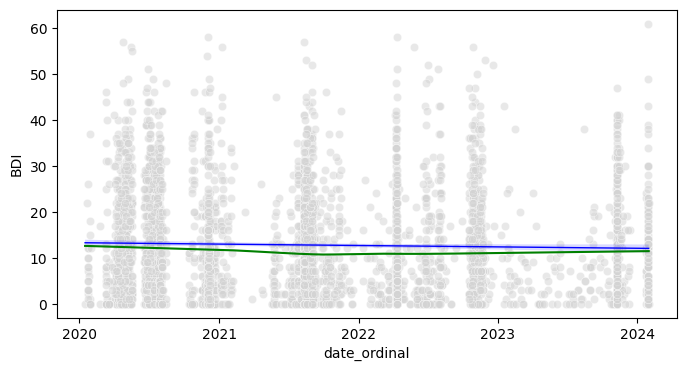

In [ ]:
#BDI
lowess = sm.nonparametric.lowess(data_post2020['BDI'], data_post2020['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='BDI', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=data_post2020, x='date_ordinal', y='BDI', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
clean_BDI_data = data_post2020.dropna(subset=['date_ordinal', 'BDI'])
pearson_corr, pearson_p_value = pearsonr(clean_BDI_data['date_ordinal'], clean_BDI_data['BDI'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: -0.030108714220176625
Pearson p-value: 0.07499192213817547


[Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

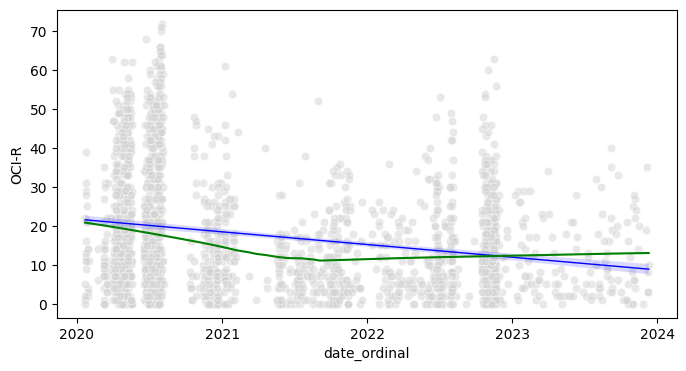

In [ ]:
#OCD
lowess = sm.nonparametric.lowess(data_post2020['OCI-R'], data_post2020['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='OCI-R', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=data_post2020, x='date_ordinal', y='OCI-R', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
clean_OCD_data = data_post2020.dropna(subset=['date_ordinal', 'OCI-R'])
pearson_corr, pearson_p_value = pearsonr(clean_OCD_data['date_ordinal'], clean_OCD_data['OCI-R'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: -0.23646252296956685
Pearson p-value: 6.04841701115483e-29


[Text(737425, 0, '2020'),
 Text(737791, 0, '2021'),
 Text(738156, 0, '2022'),
 Text(738521, 0, '2023'),
 Text(738886, 0, '2024')]

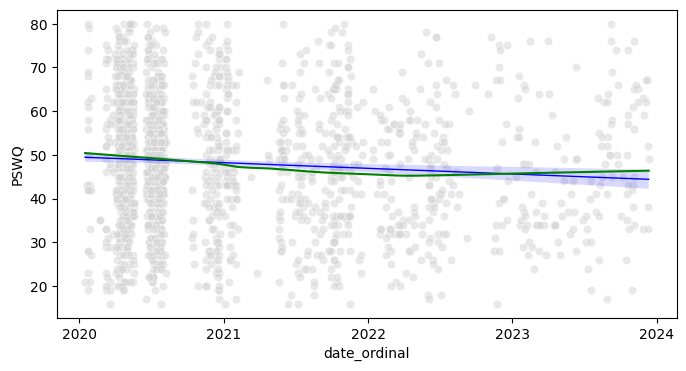

In [ ]:
#Worry
lowess = sm.nonparametric.lowess(data_post2020['PSWQ'], data_post2020['date_ordinal'], frac=.7)
lowess_x = list(zip(*lowess))[0]
lowess_y = list(zip(*lowess))[1]

fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_post2020, x='date_ordinal',  y='PSWQ', color = 'lightgrey', ax=ax, alpha=0.5)
sns.regplot(data=data_post2020, x='date_ordinal', y='PSWQ', ax=ax, scatter=False, color='blue', line_kws={'linewidth': 1})
ax.plot(lowess_x,lowess_y, color = 'green')
tick_dates = pd.to_datetime(['2020-01-01','2021-01-01','2022-01-01','2023-01-01','2024-01-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['2020','2021','2022','2023','2024'])  # Set tick labels to formatted date strings

In [ ]:
#calculate correlation coefficient
clean_PSWQ_data = data_post2020.dropna(subset=['date_ordinal', 'PSWQ'])
pearson_corr, pearson_p_value = pearsonr(clean_PSWQ_data['date_ordinal'], clean_PSWQ_data['PSWQ'])
print(f"Pearson correlation coefficient: {pearson_corr}")
print(f"Pearson p-value: {pearson_p_value}")

Pearson correlation coefficient: -0.08628374422648599
Pearson p-value: 0.0002443978608391702


## 3. Covid effects on SRS scores

#### How did SRS scores vary within 2020 (in online participants only) vs within a different year?

In [ ]:
data_2020 = data_2020.assign(year = 2020)
data_2022 = data_2022.assign(year = 2022)

data_20_22 = pd.concat([data_2020, data_2022], axis=0, ignore_index=True)
data_20_22.loc[data_20_22['year'] == 2022, 'date_ordinal'] = data_20_22.loc[data_20_22['year'] == 2022, 'date_ordinal'] - 365*2

In [ ]:
lowess_2020 = sm.nonparametric.lowess(data_2020[data_2020['format'] == 'Online']['SRS'], data_2020[data_2020['format'] == 'Online']['date_ordinal'], frac=.7)
lowess_2020_x = list(zip(*lowess_2020))[0]
lowess_2020_y = list(zip(*lowess_2020))[1]

lowess_2022 = sm.nonparametric.lowess(data_2022[data_2022['format'] == 'Online']['SRS'], data_2022[data_2022['format'] == 'Online']['date_ordinal'] - 365*2, frac=.7)
lowess_2022_x = list(zip(*lowess_2022))[0]
lowess_2022_y = list(zip(*lowess_2022))[1]

Text(0.5, 1.0, 'SRS, Online participants, 2020 vs 2022')

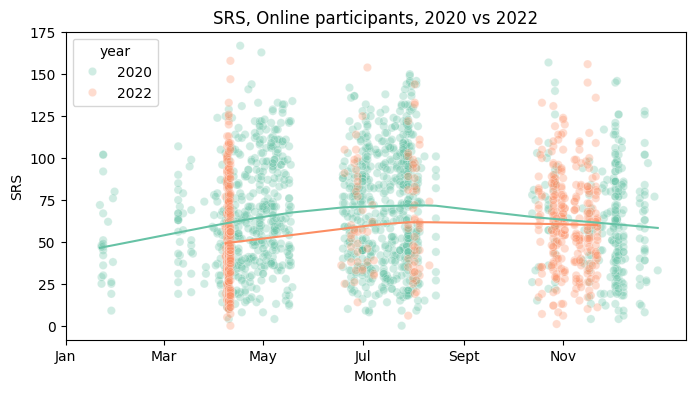

In [ ]:
fig,ax = plt.subplots(figsize=(8,4))
sns.scatterplot(data=data_20_22[data_20_22['format'] == 'Online'], x='date_ordinal', y='SRS', hue='year', ax=ax, alpha=0.3, palette='Set2')
ax.plot(lowess_2020_x,lowess_2020_y, color = sns.color_palette("Set2")[0])
ax.plot(lowess_2022_x,lowess_2022_y, color = sns.color_palette("Set2")[1])
tick_dates = pd.to_datetime(['2020-01-01','2020-03-01','2020-05-01','2020-07-01','2020-09-01','2020-11-01'])
tick_ordinals = tick_dates.map(pd.Timestamp.toordinal)
ax.set_xticks(tick_ordinals)  # Set ticks at the ordinal values
ax.set_xticklabels(['Jan','Mar','May','Jul','Sept','Nov'])  # Set tick labels to formatted date strings
ax.set_xlabel('Month')
ax.set_title('SRS, Online participants, 2020 vs 2022')

Given the sparse data, focus on 3 periods: March-May, June-Aug, Oct-Dec

In [ ]:
data_20_22['month'] = data_20_22['date'].dt.month
data_20_22['period'] = data_20_22['month'].apply(lambda x: {
    3: 'March-May',
    4: 'March-May',
    5: 'March-May',
    6: 'June-Aug',
    7: 'June-Aug',
    8: 'June-Aug',
    10: 'Oct-Dec',
    11: 'Oct-Dec',
    12: 'Oct-Dec'
}.get(x, pd.NA))

Text(0.5, 0, ' ')

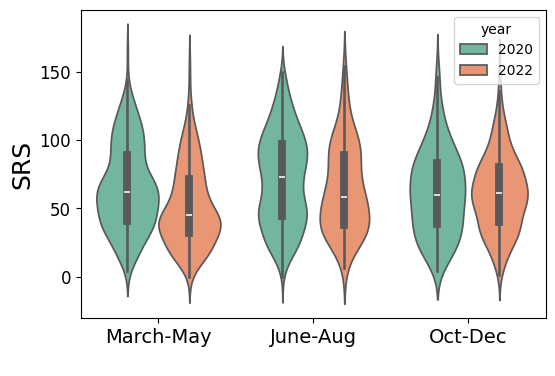

In [ ]:
fig,ax = plt.subplots(figsize=(6,4))
sns.violinplot(data=data_20_22[(data_20_22['period'].notna()) & (data_20_22['format'] == 'Online')],
               order=['March-May', 'June-Aug', 'Oct-Dec'], x='period', y='SRS', hue='year', ax=ax, palette='Set2')
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('SRS',fontsize=18)
ax.set_xlabel(' ')

In [ ]:
#glm to test interaction
model = smf.ols('SRS ~ period * year', data=data_20_22[(data_20_22['period'].notna()) & (data_20_22['format'] == 'Online')]).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    SRS   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                     15.63
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           4.14e-15
Time:                        19:27:20   Log-Likelihood:                -9607.8
No. Observations:                1976   AIC:                         1.923e+04
Df Residuals:                    1970   BIC:                         1.926e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

In [ ]:
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

                   sum_sq      df          F    PR(>F)
period       2.300894e+04     2.0  11.714914  0.000009
year         2.352409e+04     1.0  23.954403  0.000001
period:year  1.358869e+04     2.0   6.918630  0.001013
Residual     1.934612e+06  1970.0        NaN       NaN


stats for March-May:

In [ ]:
sample1 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'March-May') & (data_20_22['year'] == 2020)]['SRS']
sample2 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'March-May') & (data_20_22['year'] == 2022)]['SRS']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): 6.0374570625774
df (Welch's t-test): 612.3028211122602
P-value (unequal variances): 2.7148450448354156e-09
Effect size Cohen's d (unequal variances): 0.4464724943863447


stats for June-Aug:

In [ ]:
sample1 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'June-Aug') & (data_20_22['year'] == 2020)]['SRS']
sample2 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'June-Aug') & (data_20_22['year'] == 2022)]['SRS']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): 1.9618445981240415
df (Welch's t-test): 130.12366327031995
P-value (unequal variances): 0.05191517379695242
Effect size Cohen's d (unequal variances): 0.21020495891309807


stats for Oct-Dec:

In [ ]:
sample1 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'Oct-Dec') & (data_20_22['year'] == 2020)]['SRS']
sample2 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'Oct-Dec') & (data_20_22['year'] == 2022)]['SRS']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): 0.15058918575503435
df (Welch's t-test): 513.7389919931329
P-value (unequal variances): 0.8803588994926312
Effect size Cohen's d (unequal variances): 0.013042734065547611


Repeat for trait anxiety

Text(0.5, 0, ' ')

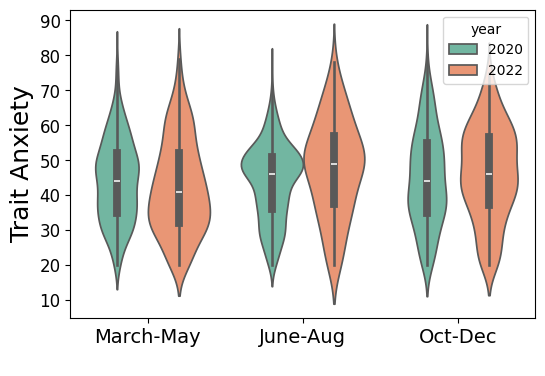

In [ ]:
fig,ax = plt.subplots(figsize=(6,4))
sns.violinplot(data=data_20_22[(data_20_22['period'].notna()) & (data_20_22['format'] == 'Online')],
               order=['March-May', 'June-Aug', 'Oct-Dec'], x='period', y='STAI_trait', hue='year', ax=ax, palette='Set2')
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=12)
ax.set_ylabel('Trait Anxiety',fontsize=18)
ax.set_xlabel(' ')

In [ ]:
#glm to test interaction
model = smf.ols('STAI_trait ~ period * year', data=data_20_22[(data_20_22['period'].notna()) & (data_20_22['format'] == 'Online')]).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             STAI_trait   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     4.426
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           0.000519
Time:                        19:27:21   Log-Likelihood:                -7747.2
No. Observations:                1971   AIC:                         1.551e+04
Df Residuals:                    1965   BIC:                         1.554e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

In [ ]:
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

                    sum_sq      df         F    PR(>F)
period         1239.524669     2.0  4.067225  0.017269
year            111.542306     1.0  0.732003  0.392339
period:year    1933.324030     2.0  6.343773  0.001794
Residual     299426.039653  1965.0       NaN       NaN


In [ ]:
#March-May
sample1 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'March-May') & (data_20_22['year'] == 2020)]['STAI_trait']
sample2 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'March-May') & (data_20_22['year'] == 2022)]['STAI_trait']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): 1.7787575006966958
df (Welch's t-test): 522.1064542421934
P-value (unequal variances): 0.07586129156330818
Effect size Cohen's d (unequal variances): 0.13852289400209308


In [ ]:
#June-Aug
sample1 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'June-Aug') & (data_20_22['year'] == 2020)]['STAI_trait']
sample2 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'June-Aug') & (data_20_22['year'] == 2022)]['STAI_trait']
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): -2.6122228094562607
df (Welch's t-test): 113.76750900525937
P-value (unequal variances): 0.010209456120655826
Effect size Cohen's d (unequal variances): -0.34367545178437675


In [ ]:
#Oct-Dec
sample1 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'Oct-Dec') & (data_20_22['year'] == 2020)]['STAI_trait'].dropna()
sample2 = data_20_22[(data_20_22['format'] == 'Online') & (data_20_22['period'] == 'Oct-Dec') & (data_20_22['year'] == 2022)]['STAI_trait'].dropna()
t_stat, p_value = ttest_ind(sample1, sample2, equal_var=False)
d, df = cohen_d(sample1, sample2)
print(f"T-statistic (unequal variances): {t_stat}")
print(f"df (Welch's t-test): {df}")
print(f"P-value (unequal variances): {p_value}")
print(f"Effect size Cohen's d (unequal variances): {d}")

T-statistic (unequal variances): -1.2837203819170575
df (Welch's t-test): 528.2736638731893
P-value (unequal variances): 0.1998025873302537
Effect size Cohen's d (unequal variances): -0.11100055664598593


### Within-subject changes in SRS scores: analyses from re-invite study

#### Data cleaning and scoring

In [ ]:
data_reinvite.columns

Index(['StartDate', 'IPAddress', 'Duration (in seconds)', 'Finished', 'ID',
       'autism', 'family_autism', 'family_autism_2', 'family_autism_2_15_TEXT',
       'OCD',
       ...
       'AQ_Total', 'LSAS_Performance_Fear', 'LSAS_Performance_Avoidance',
       'LSAS_Social_Fear', 'LSAS_Social_Avoid', 'LSAS_Social',
       'LSAS_Performance', 'LSAS_Fear', 'LSAS_Avoid', 'LSAS_Total'],
      dtype='object', length=477)

Delete rows of unfinished data.

In [ ]:
print('number of unfinished datasets:')
np.sum(data_reinvite['Finished'] == False)

number of unfinished datasets:


1

In [ ]:
#delete unfinished datasets
data_reinvite = data_reinvite[data_reinvite['Finished'] == True].copy()

First, let's score the covid-related questions:
* Questions 1-3 are scales from 1 to 7, so we keep these as they are.
* Questions 4 & 5 are each made up of 9 YES/NO questions, so we score 1 for yes and 0 for no and sum across the 9 questions, so scores for each question range from 0 to 9.
* Question 6 has 5 levels of the number of people spoken to face-to-face, so scores range from 1 to 5.
* Question 7 has 7 levels of the number of people spoken to virtually, so scores range from 1 to 7.
* Question 8 has 10 YES/NO questions, so scores range from 0 to 10.
* Questions 9 & 10 have 5 YES/NO questions, so scores range from 0 to 5.

In [ ]:
#recode all the yes/no covid questions (Q4, Q5, Q8, Q9 and Q10) as 1/0
covid_columns = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid')]
data_reinvite[covid_columns] = data_reinvite[covid_columns].replace({'Yes': 1, 'No': 0})

In [ ]:
#recode covid Q6 and Q7 answers from 1 to 5 and 1 to 7 respectively
covid_q6_columns = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q6')]
data_reinvite[covid_q6_columns] = data_reinvite[covid_q6_columns].replace({'None': 1, '1-3 people': 2, '4-6 people': 3, '7-10 people': 4, 'More than 10 people': 5}).fillna(1)

covid_q7_columns = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q7')]
data_reinvite[covid_q7_columns] = data_reinvite[covid_q7_columns].replace({'None': 1, '1-3 people': 2, '4-6 people': 3, '7-10 people': 4, '11-20 people': 5, '21-50 people': 6, '>50 people': 7}).fillna(1)

In the code above, note that the 'None' in the raw data were somehow read into NaN when reading the .csv file, and there are no actual NaNs in Q6 and Q7 of the dataset, hence the .fillna(1) to replace the NaN by 1 since those were all the 'None' answers.

In [ ]:
data_reinvite[data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q6') | data_reinvite.columns.str.startswith('Covid_Q7')]]

,Covid_Q6_NspeakFaceToFace_2020,Covid_Q6_NspeakFaceToFace_recall,Covid_Q6_NspeakFaceToFace_2024,Covid_Q7_NspeakVirtual_2020,Covid_Q7_NspeakVirtual_recall,Covid_Q7_NspeakVirtual_2024
0,3.0,5.0,5.0,5.0,5.0,6.0
1,2.0,5.0,5.0,5.0,6.0,6.0
2,5.0,5.0,5.0,5.0,5.0,5.0
3,1.0,5.0,5.0,6.0,6.0,7.0
4,2.0,3.0,3.0,1.0,3.0,2.0
...,...,...,...,...,...,...
227,2.0,3.0,5.0,5.0,5.0,5.0
228,3.0,4.0,4.0,4.0,4.0,4.0
229,2.0,2.0,5.0,2.0,2.0,1.0
230,1.0,1.0,2.0,6.0,6.0,3.0


In [ ]:
#checks if there are any NaNs remaining in the covid columns and how many
cols = data_reinvite.columns[data_reinvite.columns.str.startswith('Covid')]
id_to_exclude = []
for col in cols:
    n_nan = data_reinvite[col].isna().sum()
    if n_nan > 0:
        print(f"{col}: {n_nan} NaNs, ID: {data_reinvite[data_reinvite[col].isna()]['ID'].values}")
        id_to_exclude.append(data_reinvite[data_reinvite[col].isna()]['ID'].values.tolist())

Covid_Q2_Afraid_2020: 1 NaNs, ID: ['5cb29cc0a9827c0001e7e477']
Covid_Q2_Afraid_recall: 1 NaNs, ID: ['5ba8e80089390100019064ed']
Covid_Q2_Afraid_2024: 1 NaNs, ID: ['60fa33610e4b25f11babd130']


In [ ]:
#exclude ids
for id in id_to_exclude:
    data_reinvite = data_reinvite[~data_reinvite['ID'].isin(id)]
len(data_reinvite)

228

In [ ]:
data_reinvite[data_reinvite.columns[data_reinvite.columns.str.startswith('Covid')]]

,Covid_Q1_Threat_2020,Covid_Q1_Threat_recall,Covid_Q1_Threat_2024,Covid_Q2_Afraid_2020,Covid_Q2_Afraid_recall,Covid_Q2_Afraid_2024,Covid_Q3_StressCatching_2020,Covid_Q3_StressCatching_recall,Covid_Q3_StressCatching_2024,Covid_Q4_1_avoidSupermarket_2020,...,Covid_Q10_1_mentalHealthProblems_recall,Covid_Q10_2_sleepProblems_recall,Covid_Q10_3_alcoholSubstanceUse_recall,Covid_Q10_4_noAccessToTherapy_recall,Covid_Q10_5_notSatifiedChangesTherapy_recall,Covid_Q10_1_mentalHealthProblems_2024,Covid_Q10_2_sleepProblems_2024,Covid_Q10_3_alcoholSubstanceUse_2024,Covid_Q10_4_noAccessToTherapy_2024,Covid_Q10_5_notSatifiedChangesTherapy_2024
0,6.0,3.0,1.0,5.0,3.0,1.0,4.0,3.0,1.0,0,...,1,1,1,0,0,0,0,0,0,0
1,5.0,3.0,2.0,6.0,4.0,2.0,6.0,4.0,2.0,1,...,0,1,0,0,0,0,0,0,0,0
2,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,0,...,1,1,0,0,0,0,0,0,0,0
3,7.0,6.0,4.0,7.0,7.0,4.0,7.0,7.0,5.0,1,...,1,1,0,1,1,1,1,0,0,1
4,4.0,4.0,1.0,5.0,5.0,1.0,5.0,4.0,1.0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,7.0,4.0,2.0,7.0,5.0,3.0,7.0,6.0,2.0,0,...,1,1,1,1,1,1,1,0,0,1
228,7.0,5.0,1.0,7.0,5.0,1.0,6.0,4.0,2.0,1,...,1,1,1,1,1,1,1,1,1,1
229,7.0,5.0,3.0,7.0,6.0,3.0,7.0,6.0,2.0,0,...,1,0,0,0,0,0,0,0,0,0
230,3.0,5.0,3.0,2.0,3.0,2.0,2.0,3.0,2.0,1,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#sum across columns for relevant covid questions
covid_q = ['Covid_Q4', 'Covid_Q5', 'Covid_Q8', 'Covid_Q9', 'Covid_Q10']
year = ['2020', 'recall', '2024']
q_names = ['BehaviorChange', 'ActivityDisruptions', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']

for index, q in enumerate(covid_q):
    n = q_names[index]
    for y in year:
        columns_to_sum = data_reinvite.columns[data_reinvite.columns.str.startswith(q) & data_reinvite.columns.str.endswith(y) & ~data_reinvite.columns.str.contains(n)]
        print(q + '_' + y + ': ' + str(len(columns_to_sum)) + ' columns')
        data_reinvite[q + '_' + n + '_' + y] = data_reinvite[columns_to_sum].sum(axis=1, numeric_only=True)

Covid_Q4_2020: 9 columns
Covid_Q4_recall: 9 columns
Covid_Q4_2024: 9 columns
Covid_Q5_2020: 9 columns
Covid_Q5_recall: 9 columns
Covid_Q5_2024: 9 columns
Covid_Q8_2020: 10 columns
Covid_Q8_recall: 10 columns
Covid_Q8_2024: 10 columns
Covid_Q9_2020: 5 columns
Covid_Q9_recall: 5 columns
Covid_Q9_2024: 5 columns
Covid_Q10_2020: 5 columns
Covid_Q10_recall: 5 columns
Covid_Q10_2024: 5 columns


<ipython-input-100-cc6ae8dcf15f>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite[q + '_' + n + '_' + y] = data_reinvite[columns_to_sum].sum(axis=1, numeric_only=True)
<ipython-input-100-cc6ae8dcf15f>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_reinvite[q + '_' + n + '_' + y] = data_reinvite[columns_to_sum].sum(axis=1, numeric_only=True)
<ipython-input-100-cc6ae8dcf15f>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, wh

In [ ]:
data_reinvite[data_reinvite.columns[data_reinvite.columns.str.startswith('Covid_Q4_BehaviorChange')]]
data_reinvite.head()

,StartDate,IPAddress,Duration (in seconds),Finished,ID,autism,family_autism,family_autism_2,family_autism_2_15_TEXT,OCD,...,Covid_Q5_ActivityDisruptions_2024,Covid_Q8_SocialDisruptions_2020,Covid_Q8_SocialDisruptions_recall,Covid_Q8_SocialDisruptions_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024
0,4/8/2024 20:59,88.19.100.199,1703,True,5e92178e8ee4fe54b65b7c39,No,No,NaN,NaN,No - but I self identify as having OCD,...,0,3,2,0,0,0,0,3,3,0
1,4/8/2024 21:13,69.220.156.184,4389,True,606a3cf263a18869ac8ee0ed,No,No,NaN,NaN,No,...,0,5,5,0,2,2,2,1,1,0
2,4/8/2024 21:48,47.208.63.218,2498,True,559fa17cfdf99b69c369d364,No,No,NaN,NaN,No,...,0,2,0,0,4,4,1,2,2,0
3,4/8/2024 22:36,70.175.93.13,1461,True,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,NaN,No,...,2,6,7,1,2,2,0,4,4,3
4,4/9/2024 0:22,104.186.234.163,2321,True,567dd32b4f0ef30006dbb718,No,I don't know,NaN,NaN,No,...,5,7,7,6,0,0,0,0,0,0


Create a new column indicating the recall date in a format more similar to actual dates.

In [ ]:
data_reinvite['recall_month'] = data_reinvite['RECALL'].replace({720: '2020-07', 820: '2020-08', 1020: '2020-10', 1120: '2020-11', 1220: '2020-12', 121: '2021-01', 221: '2021-02', 821: '2021-08', 921: '2021-09'})
data_reinvite['recall_month'] = data_reinvite['recall_month'].astype('category')
data_reinvite['recall_month'] = data_reinvite['recall_month'].cat.reorder_categories(['2020-07', '2020-08', '2020-10', '2020-11', '2020-12', '2021-01', '2021-02', '2021-08', '2021-09'])

data_reinvite['recall_period'] = data_reinvite['RECALL'].replace({720: 'Summer2020', 820: 'Summer2020', 1020: 'Fall2020', 1120: 'Fall2020', 1220: 'Fall2020', 121: 'Winter2021', 221: 'Winter2021', 821: 'Summer2021', 921: 'Summer2021'})
data_reinvite['recall_period'] = data_reinvite['recall_period'].astype('category')
data_reinvite['recall_period'] = data_reinvite['recall_period'].cat.reorder_categories(['Summer2020', 'Fall2020', 'Winter2021', 'Summer2021'])

<ipython-input-102-5a7d68382c05>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['recall_month'] = data_reinvite['RECALL'].replace({720: '2020-07', 820: '2020-08', 1020: '2020-10', 1120: '2020-11', 1220: '2020-12', 121: '2021-01', 221: '2021-02', 821: '2021-08', 921: '2021-09'})
<ipython-input-102-5a7d68382c05>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['recall_period'] = data_reinvite['RECALL'].replace({720: 'Summer2020', 820: 'Summer2020', 1020: 'Fall2020', 1120: 'Fall2020', 1220: 'Fall2020',

In [ ]:
print('Summary of recall data by month:')
print('July 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-07'])))
print('August 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-08'])))
print('October 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-10'])))
print('November 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-11'])))
print('December 2020: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2020-12'])))
print('January 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-01'])))
print('February 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-02'])))
print('August 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-08'])))
print('September 2021: N=' + str(len(data_reinvite[data_reinvite['recall_month'] == '2021-09'])))

Summary of recall data by month:
July 2020: N=7
August 2020: N=5
October 2020: N=7
November 2020: N=24
December 2020: N=38
January 2021: N=20
February 2021: N=3
August 2021: N=97
September 2021: N=27


In [ ]:
print('Summary of recall data by period:')
print('Summer 2020: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Summer2020'])))
print('Fall 2020: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Fall2020'])))
print('Winter 2021: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Winter2021'])))
print('Summer 2021: N=' + str(len(data_reinvite[data_reinvite['recall_period'] == 'Summer2021'])))

Summary of recall data by period:
Summer 2020: N=12
Fall 2020: N=69
Winter 2021: N=23
Summer 2021: N=124


#### Visualization of covid questions scores & dimensionality reduction

Plot correlation matrix between the 10 covid question for each period

<Axes: >

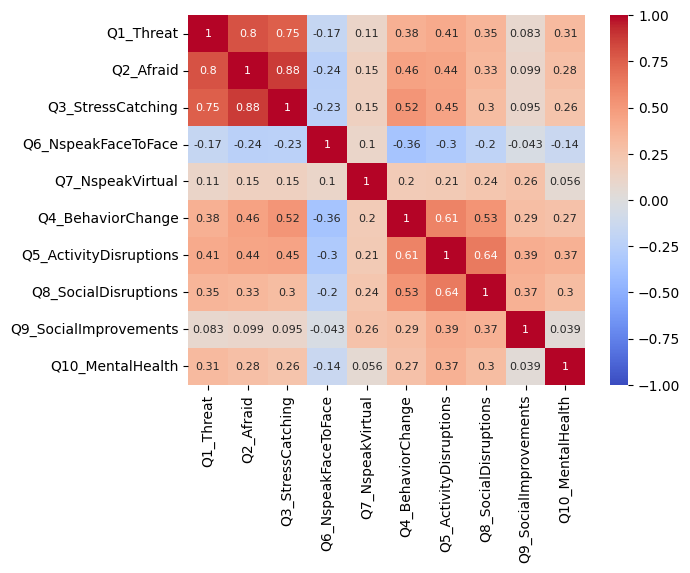

In [ ]:
# 2020
n_list = ['Threat', 'Afraid', 'StressCatching', 'BehaviorChange', 'ActivityDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']
df_2020 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2020')]]
df_2020.columns = df_2020.columns.str.rstrip('_2020')
df_2020.columns = df_2020.columns.str.lstrip('Covid_')

corr_2020 = df_2020.corr()
sns.heatmap(corr_2020, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2020.columns.values, yticklabels=corr_2020.columns.values)

<Axes: >

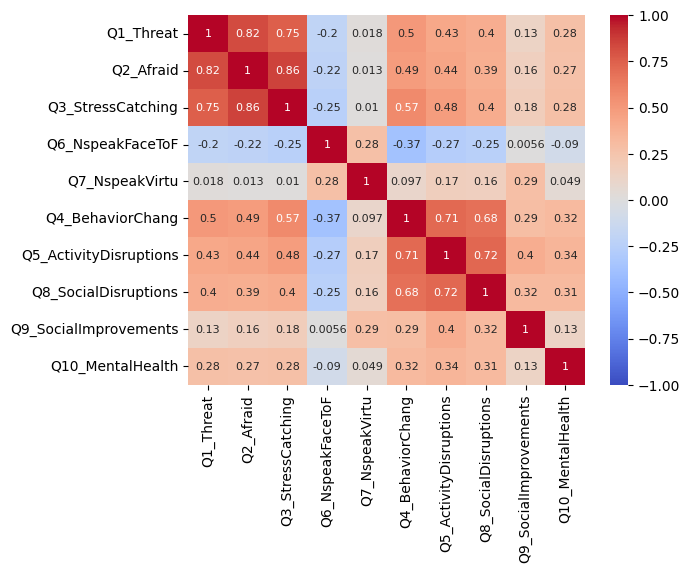

In [ ]:
# recall
n_list = ['Threat', 'Afraid', 'StressCatching', 'BehaviorChange', 'ActivityDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']
df_recall = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('recall')]]
df_recall.columns = df_recall.columns.str.rstrip('_recall')
df_recall.columns = df_recall.columns.str.lstrip('Covid_')

corr_recall = df_recall.corr()
sns.heatmap(corr_recall, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_recall.columns.values, yticklabels=corr_recall.columns.values)

<Axes: >

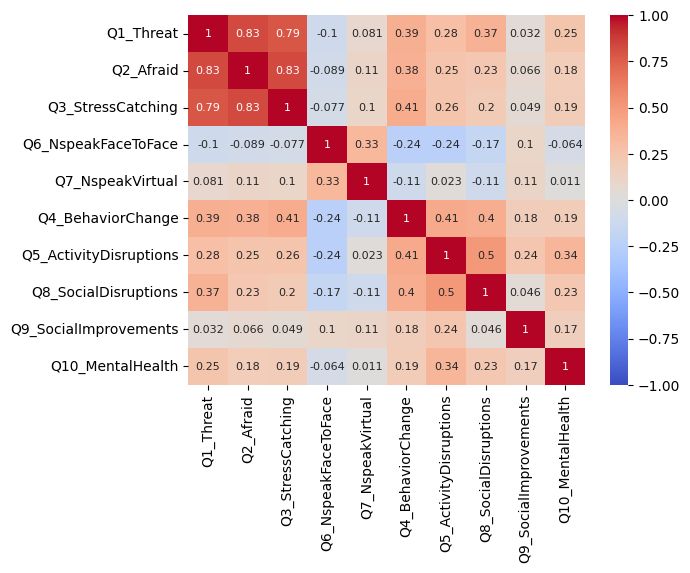

In [ ]:
# 2024
n_list = ['Threat', 'Afraid', 'StressCatching', 'BehaviorChange', 'ActivityDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialDisruptions', 'SocialImprovements', 'MentalHealth']
df_2024 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2024')]]
df_2024.columns = df_2024.columns.str.rstrip('_2024')
df_2024.columns = df_2024.columns.str.lstrip('Covid_')

corr_2024 = df_2024.corr()
sns.heatmap(corr_2024, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2024.columns.values, yticklabels=corr_2024.columns.values)

Given the correlation, let's group the following item together by taking their mean:
* Threat, Afraid and Stress of catching covid ~ Anxiety
* BehaviorChange, ActivityDisruptions, and SocialDisruptions ~ LifeDisruptions


In [ ]:
data_reinvite['Covid_Q123_Anxiety_2020'] = data_reinvite[['Covid_Q1_Threat_2020', 'Covid_Q2_Afraid_2020', 'Covid_Q3_StressCatching_2020']].mean(axis=1)
data_reinvite['Covid_Q123_Anxiety_recall'] = data_reinvite[['Covid_Q1_Threat_recall', 'Covid_Q2_Afraid_recall', 'Covid_Q3_StressCatching_recall']].mean(axis=1)
data_reinvite['Covid_Q123_Anxiety_2024'] = data_reinvite[['Covid_Q1_Threat_2024', 'Covid_Q2_Afraid_2024', 'Covid_Q3_StressCatching_2024']].mean(axis=1)

data_reinvite['Covid_Q458_LifeDisruptions_2020'] = data_reinvite[['Covid_Q4_BehaviorChange_2020', 'Covid_Q5_ActivityDisruptions_2020', 'Covid_Q8_SocialDisruptions_2020']].mean(axis=1)
data_reinvite['Covid_Q458_LifeDisruptions_recall'] = data_reinvite[['Covid_Q4_BehaviorChange_recall', 'Covid_Q5_ActivityDisruptions_recall', 'Covid_Q8_SocialDisruptions_recall']].mean(axis=1)
data_reinvite['Covid_Q458_LifeDisruptions_2024'] = data_reinvite[['Covid_Q4_BehaviorChange_2024', 'Covid_Q5_ActivityDisruptions_2024', 'Covid_Q8_SocialDisruptions_2024']].mean(axis=1)

<ipython-input-108-72107b599b56>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['Covid_Q123_Anxiety_2020'] = data_reinvite[['Covid_Q1_Threat_2020', 'Covid_Q2_Afraid_2020', 'Covid_Q3_StressCatching_2020']].mean(axis=1)
<ipython-input-108-72107b599b56>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_reinvite['Covid_Q123_Anxiety_recall'] = data_reinvite[['Covid_Q1_Threat_recall', 'Covid_Q2_Afraid_recall', 'Covid_Q3_StressCatching_recall']].mean(axis=1)
<ipython-input-108-72107b599b56>:3: PerformanceWarning: Da

Replot correlation matrix with fewer question scores

<Axes: >

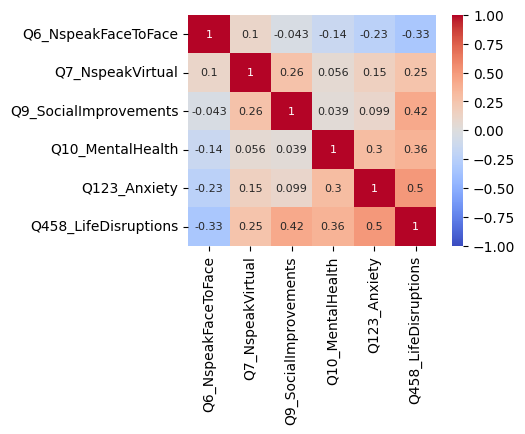

In [ ]:
# 2020
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']
df_2020 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2020')]]
df_2020.columns = df_2020.columns.str.rstrip('_2020')
df_2020.columns = df_2020.columns.str.lstrip('Covid_')

corr_2020 = df_2020.corr()
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(corr_2020, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2020.columns.values, yticklabels=corr_2020.columns.values)

<Axes: >

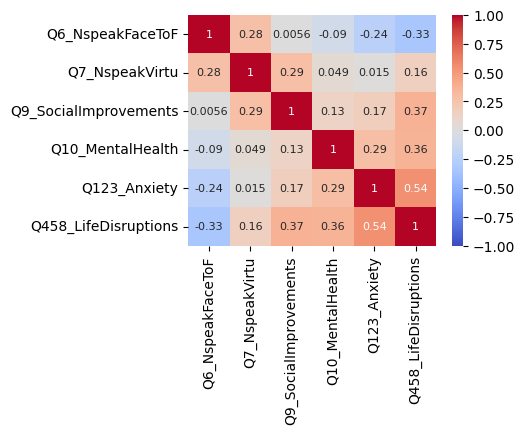

In [ ]:
# recall
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']
df_recall = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('recall')]]
df_recall.columns = df_recall.columns.str.rstrip('_recall')
df_recall.columns = df_recall.columns.str.lstrip('Covid_')

corr_recall = df_recall.corr()
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(corr_recall, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_recall.columns.values, yticklabels=corr_recall.columns.values)

<Axes: >

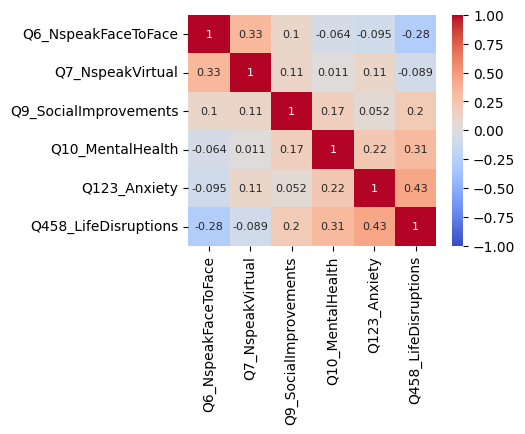

In [ ]:
# 2024
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']
df_2024 = data_reinvite[data_reinvite.columns[data_reinvite.columns.str.contains('|'.join(n_list)) & data_reinvite.columns.str.endswith('2024')]]
df_2024.columns = df_2024.columns.str.rstrip('_2024')
df_2024.columns = df_2024.columns.str.lstrip('Covid_')

corr_2024 = df_2024.corr()
fig, ax = plt.subplots(figsize=(4,3))
sns.heatmap(corr_2024, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_2024.columns.values, yticklabels=corr_2024.columns.values)

Now we can plot the distribution of those 6 covid-related question for each period.

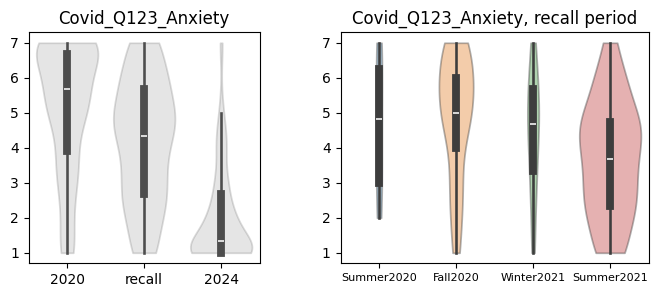

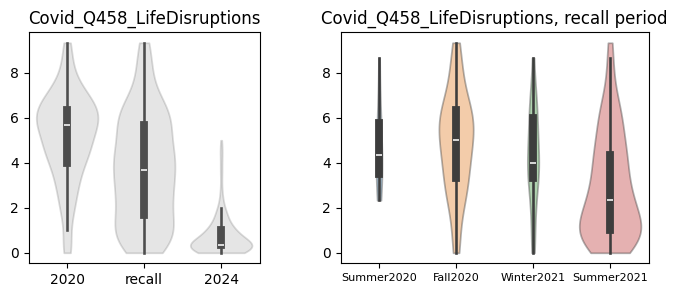

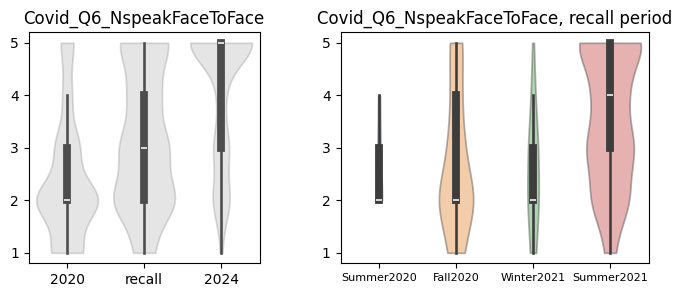

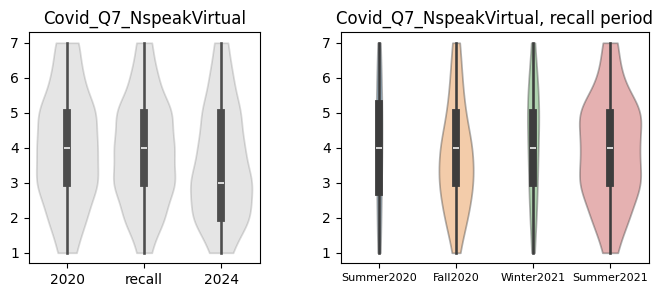

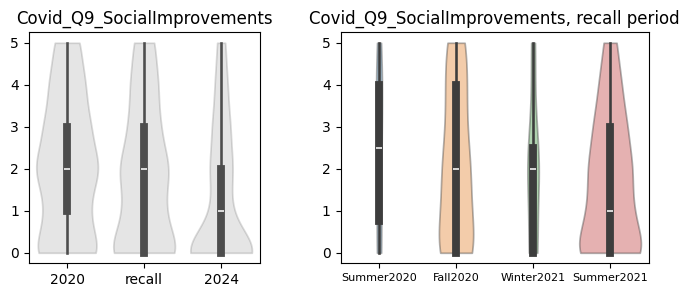

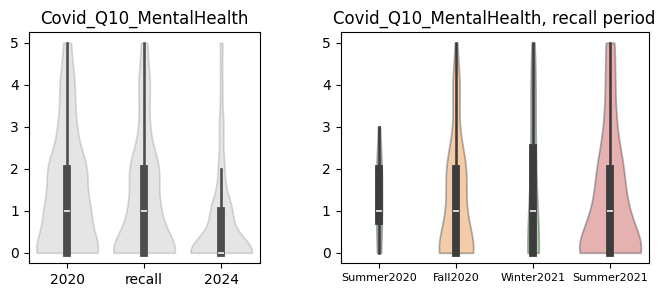

In [ ]:
q_list = ['Covid_Q123_', 'Covid_Q458_', 'Covid_Q6_', 'Covid_Q7_', 'Covid_Q9_', 'Covid_Q10_']
n_list = ['Anxiety', 'LifeDisruptions', 'NspeakFaceToFace', 'NspeakVirtual', 'SocialImprovements', 'MentalHealth']

for index, q in enumerate(q_list):
  n = n_list[index]

  df_long = pd.melt(data_reinvite, value_vars=data_reinvite.columns[data_reinvite.columns.str.startswith(q + n)].tolist(),
                    var_name='Period', value_name= q + n, id_vars=['ID','recall_month','recall_period'])
  df_long['Period'] = df_long['Period'].str.extract(r'(\d{4}|recall)$')

  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(8,3), width_ratios=[3,4])
  #subplot 1
  sns.violinplot(x='Period', y= q + n, ax=ax1, data=df_long, color='gray', alpha=0.2, common_norm=True, density_norm='count', cut=0)
  ax1.set_title(q + n)
  ax1.set_xlabel('')
  ax1.set_ylabel('')
  #subplot 2
  sns.violinplot(x='recall_period', y= q + n, ax=ax2, data=df_long[df_long['Period']=='recall'], hue='recall_period', alpha=0.4, common_norm=True, density_norm='count', cut=0)
  ax2.set_title(q + n + ', recall period')
  ax2.xaxis.set_tick_params(labelsize=8)
  ax2.set_xlabel('')
  ax2.set_ylabel('')
  plt.subplots_adjust(wspace=0.3, hspace=0.4)

#### Add SRS and other questionnaire data from recall-period study to data_reinvite

In [ ]:
cols_to_keep_reinvite = ['StartDate','Duration (in seconds)', 'ID', 'autism', 'family_autism', 'family_autism_2', 'OCD', 'schizophrenia', 'bipoloar', 'diagnose_all',
                         'SRS-A-SR_1_1', 'SRS-A-SR_1_2', 'SRS-A-SR_1_3', 'SRS-A-SR_1_4', 'SRS-A-SR_1_5', 'SRS-A-SR_1_6', 'SRS-A-SR_1_7', 'SRS-A-SR_1_8', 'SRS-A-SR_1_9', 'SRS-A-SR_1_10',
                         'SRS-A-SR_2_1', 'SRS-A-SR_2_2', 'SRS-A-SR_2_3', 'SRS-A-SR_2_4', 'SRS-A-SR_2_5', 'SRS-A-SR_2_6', 'SRS-A-SR_2_7', 'SRS-A-SR_2_8', 'SRS-A-SR_2_9', 'SRS-A-SR_2_10',
                         'SRS-A-SR_3_1', 'SRS-A-SR_3_2', 'SRS-A-SR_3_3', 'SRS-A-SR_3_4', 'SRS-A-SR_3_5', 'SRS-A-SR_3_6', 'SRS-A-SR_3_7', 'SRS-A-SR_3_8', 'SRS-A-SR_3_9', 'SRS-A-SR_3_10',
                         'SRS-A-SR_4_1', 'SRS-A-SR_4_2', 'SRS-A-SR_4_3', 'SRS-A-SR_4_4', 'SRS-A-SR_4_5', 'SRS-A-SR_4_6', 'SRS-A-SR_4_7', 'SRS-A-SR_4_8', 'SRS-A-SR_4_9', 'SRS-A-SR_4_10',
                         'SRS-A-SR_5_1', 'SRS-A-SR_5_2', 'SRS-A-SR_5_3', 'SRS-A-SR_5_4', 'SRS-A-SR_5_5', 'SRS-A-SR_5_6', 'SRS-A-SR_5_7', 'SRS-A-SR_5_8', 'SRS-A-SR_5_9', 'SRS-A-SR_5_10',
                         'SRS-A-SR_6_1', 'SRS-A-SR_6_2', 'SRS-A-SR_6_3', 'SRS-A-SR_6_4', 'SRS-A-SR_6_5', 'SRS-A-SR_6_6', 'SRS-A-SR_6_7', 'SRS-A-SR_6_8', 'SRS-A-SR_6_9', 'SRS-A-SR_6_10',
                         'SRS-A-SR_7_1', 'SRS-A-SR_7_2', 'SRS-A-SR_7_3', 'SRS-A-SR_7_4', 'SRS-A-SR_7_5', 'RECALL', 'BDI Total', 'SRS_Total', 'SRS_SCI', 'SRS_Awr', 'SRS_Cog',
                         'SRS_Com', 'SRS_Mot', 'SRS_RRB', 'STAI_Trait', 'STAI_State', 'NEO_Neuroticism', 'NEO_Extraversion', 'NEO_Openness', 'NEO_Agreeableness', 'NEO_Conscientiousness',
                         'AQ_Total', 'LSAS_Total', 'Covid_Q123_Anxiety_2020', 'Covid_Q123_Anxiety_recall', 'Covid_Q123_Anxiety_2024', 'Covid_Q458_LifeDisruptions_2020', 'Covid_Q458_LifeDisruptions_recall',
                         'Covid_Q458_LifeDisruptions_2024', 'Covid_Q6_NspeakFaceToFace_2020', 'Covid_Q6_NspeakFaceToFace_recall', 'Covid_Q6_NspeakFaceToFace_2024', 'Covid_Q7_NspeakVirtual_2020',
                         'Covid_Q7_NspeakVirtual_recall', 'Covid_Q7_NspeakVirtual_2024', 'Covid_Q9_SocialImprovements_2020', 'Covid_Q9_SocialImprovements_recall', 'Covid_Q9_SocialImprovements_2024',
                         'Covid_Q10_MentalHealth_2020', 'Covid_Q10_MentalHealth_recall', 'Covid_Q10_MentalHealth_2024', 'recall_month', 'recall_period']
data_reinvite_short = data_reinvite[cols_to_keep_reinvite].copy()
data_reinvite_short.columns = ['date_T2','duration_T2', 'ID', 'autism_T2', 'family_autism_T2', 'family_autism_who_T2', 'OCD_T2', 'schizophrenia_T2', 'bipolar_T2', 'diagnose_all_T2',
                         'SRS_1_T2', 'SRS_2_T2', 'SRS_3_T2', 'SRS_4_T2', 'SRS_5_T2', 'SRS_6_T2', 'SRS_7_T2', 'SRS_8_T2', 'SRS_9_T2', 'SRS_10_T2',
                         'SRS_11_T2', 'SRS_12_T2', 'SRS_13_T2', 'SRS_14_T2', 'SRS_15_T2', 'SRS_16_T2', 'SRS_17_T2', 'SRS_18_T2', 'SRS_19_T2', 'SRS_20_T2',
                         'SRS_21_T2', 'SRS_22_T2', 'SRS_23_T2', 'SRS_24_T2', 'SRS_25_T2', 'SRS_26_T2', 'SRS_27_T2', 'SRS_28_T2', 'SRS_29_T2', 'SRS_30_T2',
                         'SRS_31_T2', 'SRS_32_T2', 'SRS_33_T2', 'SRS_34_T2', 'SRS_35_T2', 'SRS_36_T2', 'SRS_37_T2', 'SRS_38_T2', 'SRS_39_T2', 'SRS_40_T2',
                         'SRS_41_T2', 'SRS_42_T2', 'SRS_43_T2', 'SRS_44_T2', 'SRS_45_T2', 'SRS_46_T2', 'SRS_47_T2', 'SRS_48_T2', 'SRS_49_T2', 'SRS_50_T2',
                         'SRS_51_T2', 'SRS_52_T2', 'SRS_53_T2', 'SRS_54_T2', 'SRS_55_T2', 'SRS_56_T2', 'SRS_57_T2', 'SRS_58_T2', 'SRS_59_T2', 'SRS_60_T2',
                         'SRS_61_T2', 'SRS_62_T2', 'SRS_63_T2', 'SRS_64_T2', 'SRS_65_T2', 'RECALL', 'BDI_T2', 'SRS_T2', 'SRS_SCI_T2', 'SRS_AWR_T2', 'SRS_COG_T2',
                         'SRS_COM_T2', 'SRS_MOT_T2', 'SRS_RRB_T2', 'STAI_trait_T2', 'STAI_state_T2', 'NEO_Neuroticism_T2', 'NEO_Extraversion_T2', 'NEO_Openness_T2', 'NEO_Agreeableness_T2', 'NEO_Conscientiousness_T2',
                         'AQ_T2', 'LSAS_T2', 'Covid_Q123_Anxiety_2020', 'Covid_Q123_Anxiety_recall', 'Covid_Q123_Anxiety_2024', 'Covid_Q458_LifeDisruptions_2020', 'Covid_Q458_LifeDisruptions_recall',
                         'Covid_Q458_LifeDisruptions_2024', 'Covid_Q6_NspeakFaceToFace_2020', 'Covid_Q6_NspeakFaceToFace_recall', 'Covid_Q6_NspeakFaceToFace_2024', 'Covid_Q7_NspeakVirtual_2020',
                         'Covid_Q7_NspeakVirtual_recall', 'Covid_Q7_NspeakVirtual_2024', 'Covid_Q9_SocialImprovements_2020', 'Covid_Q9_SocialImprovements_recall', 'Covid_Q9_SocialImprovements_2024',
                         'Covid_Q10_MentalHealth_2020', 'Covid_Q10_MentalHealth_recall', 'Covid_Q10_MentalHealth_2024', 'recall_month', 'recall_period']
data_reinvite_short.head()

,date_T2,duration_T2,ID,autism_T2,family_autism_T2,family_autism_who_T2,OCD_T2,schizophrenia_T2,bipolar_T2,diagnose_all_T2,...,Covid_Q7_NspeakVirtual_recall,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period
0,4/8/2024 20:59,1703,5e92178e8ee4fe54b65b7c39,No,No,NaN,No - but I self identify as having OCD,No,No,None of these,...,5.0,6.0,0,0,0,3,3,0,2021-08,Summer2021
1,4/8/2024 21:13,4389,606a3cf263a18869ac8ee0ed,No,No,NaN,No,No,Yes,"Generalized Anxiety Disorder,Post Traumatic St...",...,6.0,6.0,2,2,2,1,1,0,2021-08,Summer2021
2,4/8/2024 21:48,2498,559fa17cfdf99b69c369d364,No,No,NaN,No,No,No,None of these,...,5.0,5.0,4,4,1,2,2,0,2021-08,Summer2021
3,4/8/2024 22:36,1461,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,6.0,7.0,2,2,0,4,4,3,2021-08,Summer2021
4,4/9/2024 0:22,2321,567dd32b4f0ef30006dbb718,No,I don't know,NaN,No,No,No,None of these,...,3.0,2.0,0,0,0,0,0,0,2021-08,Summer2021


Recode SRS items and check scoring

In [ ]:
SRS_items_cols = data_reinvite_short.columns[data_reinvite_short.columns.str.startswith('SRS')]
data_reinvite_short[SRS_items_cols[0:65]]
data_reinvite_short[SRS_items_cols[0:65]] = data_reinvite_short[SRS_items_cols[0:65]].replace({'Not True': 0, 'Sometimes True': 1, 'Often True': 2, 'Almost Always True': 3})
data_reinvite_short

,date_T2,duration_T2,ID,autism_T2,family_autism_T2,family_autism_who_T2,OCD_T2,schizophrenia_T2,bipolar_T2,diagnose_all_T2,...,Covid_Q7_NspeakVirtual_recall,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period
0,4/8/2024 20:59,1703,5e92178e8ee4fe54b65b7c39,No,No,NaN,No - but I self identify as having OCD,No,No,None of these,...,5.0,6.0,0,0,0,3,3,0,2021-08,Summer2021
1,4/8/2024 21:13,4389,606a3cf263a18869ac8ee0ed,No,No,NaN,No,No,Yes,"Generalized Anxiety Disorder,Post Traumatic St...",...,6.0,6.0,2,2,2,1,1,0,2021-08,Summer2021
2,4/8/2024 21:48,2498,559fa17cfdf99b69c369d364,No,No,NaN,No,No,No,None of these,...,5.0,5.0,4,4,1,2,2,0,2021-08,Summer2021
3,4/8/2024 22:36,1461,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,6.0,7.0,2,2,0,4,4,3,2021-08,Summer2021
4,4/9/2024 0:22,2321,567dd32b4f0ef30006dbb718,No,I don't know,NaN,No,No,No,None of these,...,3.0,2.0,0,0,0,0,0,0,2021-08,Summer2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227,6/4/2024 13:16,1441,6111790b8ab52f3d075ca8a0,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,5.0,5.0,2,2,1,5,5,3,2021-08,Summer2021
228,6/4/2024 14:23,1221,610ad34844dd2b51bf5d87f5,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,4.0,4.0,1,1,2,4,5,5,2021-08,Summer2021
229,6/6/2024 8:09,1930,5b954f10754b700001f06bf0,No,Yes,niece,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,2.0,1.0,2,2,0,1,1,0,2020-10,Fall2020
230,6/6/2024 11:07,2492,5edcadb5e81cb9000c4b07e0,No,I don't know,NaN,No,No,No,None of these,...,6.0,3.0,0,0,0,0,0,0,2021-01,Winter2021


Check that total SRS scores match

In [ ]:
#reverse code relevant items in SRS_item_merged
data_reinvite_short_rev = data_reinvite_short.copy()

#reverse coded items in SRS are
#[3 7 11 12 15 17 21 22 26 32 38 40 43 45 48]
reverse_coded_fields = ['SRS_3_T2', 'SRS_7_T2', 'SRS_11_T2', 'SRS_12_T2', 'SRS_15_T2', 'SRS_17_T2', 'SRS_21_T2', 'SRS_22_T2', 'SRS_26_T2', 'SRS_32_T2', 'SRS_38_T2', 'SRS_40_T2', 'SRS_43_T2', 'SRS_45_T2', 'SRS_48_T2']
data_reinvite_short_rev[reverse_coded_fields] = 3 - data_reinvite_short_rev[reverse_coded_fields]
data_reinvite_short_rev['SRS_sum'] = data_reinvite_short_rev[SRS_items_cols[0:65]].sum(axis=1)
data_reinvite_short_rev['check_SRS'] = data_reinvite_short_rev['SRS_sum'] == data_reinvite_short_rev['SRS_T2']
data_reinvite_short_rev['check_SRS'].sum() == len(data_reinvite_short_rev['check_SRS'])

True

In [ ]:
# convert date to ordinal
data_reinvite_short['date_T2'] = pd.to_datetime(data_reinvite_short['date_T2'])
data_reinvite_short['date_ordinal_T2'] = data_reinvite_short['date_T2'].apply(lambda x: x.toordinal())
data_reinvite_short.head()

,date_T2,duration_T2,ID,autism_T2,family_autism_T2,family_autism_who_T2,OCD_T2,schizophrenia_T2,bipolar_T2,diagnose_all_T2,...,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period,date_ordinal_T2
0,2024-04-08 20:59:00,1703,5e92178e8ee4fe54b65b7c39,No,No,NaN,No - but I self identify as having OCD,No,No,None of these,...,6.0,0,0,0,3,3,0,2021-08,Summer2021,738984
1,2024-04-08 21:13:00,4389,606a3cf263a18869ac8ee0ed,No,No,NaN,No,No,Yes,"Generalized Anxiety Disorder,Post Traumatic St...",...,6.0,2,2,2,1,1,0,2021-08,Summer2021,738984
2,2024-04-08 21:48:00,2498,559fa17cfdf99b69c369d364,No,No,NaN,No,No,No,None of these,...,5.0,4,4,1,2,2,0,2021-08,Summer2021,738984
3,2024-04-08 22:36:00,1461,5a6f1ccade1f390001dbd8b7,No,I don't know,NaN,No,No,No,"Depression, Dysthymia, or Major Depressive Dis...",...,7.0,2,2,0,4,4,3,2021-08,Summer2021,738984
4,2024-04-09 00:22:00,2321,567dd32b4f0ef30006dbb718,No,I don't know,NaN,No,No,No,None of these,...,2.0,0,0,0,0,0,0,2021-08,Summer2021,738985


Rename columns of initial dataset before merging

In [ ]:
cols_to_keep_main = ['ID', 'Gender', 'Race', 'Education', 'age', 'SRS', 'SRS_AWR', 'SRS_COG', 'SRS_COM',  'SRS_MOT', 'SRS_RRB',
                     'BDI', 'LSAS', 'OCI-R', 'STAI_state', 'STAI_trait', 'date',
                     'SRS_1_1', 'SRS_1_2', 'SRS_1_3', 'SRS_1_4', 'SRS_1_5', 'SRS_1_6', 'SRS_1_7', 'SRS_1_8', 'SRS_1_9', 'SRS_1_10',
                     'SRS_2_1', 'SRS_2_2', 'SRS_2_3', 'SRS_2_4', 'SRS_2_5', 'SRS_2_6', 'SRS_2_7', 'SRS_2_8', 'SRS_2_9', 'SRS_2_10',
                     'SRS_3_1', 'SRS_3_2', 'SRS_3_3', 'SRS_3_4', 'SRS_3_5', 'SRS_3_6', 'SRS_3_7', 'SRS_3_8', 'SRS_3_9', 'SRS_3_10',
                     'SRS_4_1', 'SRS_4_2', 'SRS_4_3', 'SRS_4_4', 'SRS_4_5', 'SRS_4_6', 'SRS_4_7', 'SRS_4_8', 'SRS_4_9', 'SRS_4_10',
                     'SRS_5_1', 'SRS_5_2', 'SRS_5_3', 'SRS_5_4', 'SRS_5_5', 'SRS_5_6', 'SRS_5_7', 'SRS_5_8', 'SRS_5_9', 'SRS_5_10',
                     'SRS_6_1', 'SRS_6_2', 'SRS_6_3', 'SRS_6_4', 'SRS_6_5', 'SRS_6_6', 'SRS_6_7', 'SRS_6_8', 'SRS_6_9', 'SRS_6_10',
                     'SRS_7_1', 'SRS_7_2', 'SRS_7_3', 'SRS_7_4', 'SRS_7_5', 'date_ordinal', 'year']
data_merged_short = data_merged[cols_to_keep_main].copy()
data_merged_short.columns = ['ID', 'Gender', 'Race', 'Education', 'age_T1', 'SRS_T1', 'SRS_AWR_T1', 'SRS_COG_T1', 'SRS_COM_T1',  'SRS_MOT_T1', 'SRS_RRB_T1',
                             'BDI_T1', 'LSAS_T1', 'OCI-R_T1', 'STAI_state_T1', 'STAI_trait_T1', 'date_T1',
                             'SRS_1_T1', 'SRS_2_T1', 'SRS_3_T1', 'SRS_4_T1', 'SRS_5_T1', 'SRS_6_T1', 'SRS_7_T1', 'SRS_8_T1', 'SRS_9_T1', 'SRS_10_T1',
                             'SRS_11_T1', 'SRS_12_T1', 'SRS_13_T1', 'SRS_14_T1', 'SRS_15_T1', 'SRS_16_T1', 'SRS_17_T1', 'SRS_18_T1', 'SRS_19_T1', 'SRS_20_T1',
                             'SRS_21_T1', 'SRS_22_T1', 'SRS_23_T1', 'SRS_24_T1', 'SRS_25_T1', 'SRS_26_T1', 'SRS_27_T1', 'SRS_28_T1', 'SRS_29_T1', 'SRS_30_T1',
                             'SRS_31_T1', 'SRS_32_T1', 'SRS_33_T1', 'SRS_34_T1', 'SRS_35_T1', 'SRS_36_T1', 'SRS_37_T1', 'SRS_38_T1', 'SRS_39_T1', 'SRS_40_T1',
                             'SRS_41_T1', 'SRS_42_T1', 'SRS_43_T1', 'SRS_44_T1', 'SRS_45_T1', 'SRS_46_T1', 'SRS_47_T1', 'SRS_48_T1', 'SRS_49_T1', 'SRS_50_T1',
                             'SRS_51_T1', 'SRS_52_T1', 'SRS_53_T1', 'SRS_54_T1', 'SRS_55_T1', 'SRS_56_T1', 'SRS_57_T1', 'SRS_58_T1', 'SRS_59_T1', 'SRS_60_T1',
                             'SRS_61_T1', 'SRS_62_T1', 'SRS_63_T1', 'SRS_64_T1', 'SRS_65_T1', 'date_ordinal_T1', 'year_T1']
data_merged_short.head()

,ID,Gender,Race,Education,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,SRS_COM_T1,SRS_MOT_T1,...,SRS_58_T1,SRS_59_T1,SRS_60_T1,SRS_61_T1,SRS_62_T1,SRS_63_T1,SRS_64_T1,SRS_65_T1,date_ordinal_T1,year_T1
0,QT000,Woman,"Asian, Pacific Islander / Hawaiian, Multiracial",Bachelor's Degree,30.0,99.0,11.0,13.0,36.0,22.0,...,2.0,2.0,3.0,1.0,1.0,0.0,3.0,1.0,738538,2023
1,QT001,Man,Asian,Bachelor's Degree,23.0,17.0,7.0,3.0,4.0,2.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,738541,2023
2,QT002,Woman,Caucasian / White,Bachelor's Degree,32.0,75.0,5.0,15.0,23.0,17.0,...,1.0,3.0,1.0,2.0,0.0,0.0,3.0,0.0,738551,2023
3,QT003,Man,Asian,Master's Degree,30.0,35.0,6.0,9.0,9.0,5.0,...,1.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,738537,2023
4,QT004,Woman,Caucasian / White,Bachelor's Degree,24.0,23.0,5.0,1.0,7.0,9.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,738545,2023


In [ ]:
data_both = pd.merge(data_merged_short, data_reinvite_short, how='inner', on='ID')
data_both['Gender'] = data_both['Gender'].replace({'Female': 'f', 'Male': 'm'})
data_both

,ID,Gender,Race,Education,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,SRS_COM_T1,SRS_MOT_T1,...,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period,date_ordinal_T2
0,55b249bdfdf99b28e3c14b05,f,Black / African-American,Some College,35.0,33.0,2.0,1.0,5.0,18.0,...,4.0,4,4,4,0,0,0,2020-11,Fall2020,738987
1,55cf5cc434e9060005e56c39,f,Caucasian / White,Masters Degree,60.0,39.0,4.0,6.0,8.0,13.0,...,2.0,0,0,0,0,0,0,2020-11,Fall2020,738997
2,55ea70c37480920010aa9982,m,Black / African-American,Some College,34.0,37.0,4.0,5.0,7.0,16.0,...,4.0,0,0,0,0,0,0,2020-11,Fall2020,738987
3,56a37d86dbe850000bfcef9d,f,Caucasian / White,Bachelors Degree,57.0,57.0,7.0,11.0,14.0,19.0,...,1.0,3,3,3,2,1,0,2020-11,Fall2020,738987
4,56d0f57421cd29000a9737e4,m,Caucasian / White,Bachelors Degree,38.0,67.0,6.0,6.0,21.0,25.0,...,1.0,2,2,1,0,0,0,2020-11,Fall2020,738986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
233,61242a20817c1d12dfe8ab12,m,White,High school diploma/GED,32.0,37.0,6.0,6.0,13.0,8.0,...,3.0,4,4,5,1,1,1,2021-09,Summer2021,738989
234,61251298ee4b3f786f5e6eaf,m,White,Bachelor's degree (4 yr),49.0,62.0,6.0,12.0,19.0,12.0,...,1.0,0,0,0,0,0,0,2021-08,Summer2021,738994
235,612547f89bad5437aaecfa66,m,White,Bachelor's degree (4 yr),28.0,63.0,8.0,9.0,19.0,14.0,...,2.0,3,1,2,1,4,1,2021-08,Summer2021,738992
236,6129781ecb8007ce6248a915,m,White,Bachelor's degree (4 yr),52.0,35.0,4.0,6.0,6.0,17.0,...,4.0,3,0,0,0,0,0,2021-09,Summer2021,738990


In [ ]:
data_both.to_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_both_T1_T2.csv')

#### **Analysis #1:** How correlated are SRS scores between time 1 and time 2?

Reload the file after some manual cleaning (removing 10 duplicates)

In [ ]:
data_both_final = pd.read_csv('/content/drive/MyDrive/PersonalityNeuroscienceSRS/Data_forCaroline/Data_both_T1_T2_final.csv')
data_both_final

,ID,Gender,Race,Education,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,SRS_COM_T1,SRS_MOT_T1,...,Covid_Q7_NspeakVirtual_2024,Covid_Q9_SocialImprovements_2020,Covid_Q9_SocialImprovements_recall,Covid_Q9_SocialImprovements_2024,Covid_Q10_MentalHealth_2020,Covid_Q10_MentalHealth_recall,Covid_Q10_MentalHealth_2024,recall_month,recall_period,date_ordinal_T2
0,55b249bdfdf99b28e3c14b05,f,Black / African-American,Some College,35,33,2,1,5,18,...,4,4,4,4,0,0,0,2020-11,Fall2020,738987
1,55cf5cc434e9060005e56c39,f,Caucasian / White,Masters Degree,60,39,4,6,8,13,...,2,0,0,0,0,0,0,2020-11,Fall2020,738997
2,55ea70c37480920010aa9982,m,Black / African-American,Some College,34,37,4,5,7,16,...,4,0,0,0,0,0,0,2020-11,Fall2020,738987
3,56a37d86dbe850000bfcef9d,f,Caucasian / White,Bachelors Degree,57,57,7,11,14,19,...,1,3,3,3,2,1,0,2020-11,Fall2020,738987
4,56d0f57421cd29000a9737e4,m,Caucasian / White,Bachelors Degree,38,67,6,6,21,25,...,1,2,2,1,0,0,0,2020-11,Fall2020,738986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,61242a20817c1d12dfe8ab12,m,White,High school diploma/GED,32,37,6,6,13,8,...,3,4,4,5,1,1,1,2021-09,Summer2021,738989
224,61251298ee4b3f786f5e6eaf,m,White,Bachelor's degree (4 yr),49,62,6,12,19,12,...,1,0,0,0,0,0,0,2021-08,Summer2021,738994
225,612547f89bad5437aaecfa66,m,White,Bachelor's degree (4 yr),28,63,8,9,19,14,...,2,3,1,2,1,4,1,2021-08,Summer2021,738992
226,6129781ecb8007ce6248a915,m,White,Bachelor's degree (4 yr),52,35,4,6,6,17,...,4,3,0,0,0,0,0,2021-09,Summer2021,738990


Note: one outlier with very high duration (not plotted below), but maybe we should exclude?

(array([ 3.,  3., 11.,  8., 10.,  8., 17., 15., 11., 10., 13., 12.,  9.,
        13., 10.,  4.,  2.,  7.,  4.,  5.,  2.,  5.,  4.,  3.,  4.,  1.,
         3.,  5.,  1.,  1.,  3.,  6.,  0.,  1.,  2.,  1.,  0.,  1.,  2.,
         1.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,  2.]),
 array([ 789.  ,  877.94,  966.88, 1055.82, 1144.76, 1233.7 , 1322.64,
        1411.58, 1500.52, 1589.46, 1678.4 , 1767.34, 1856.28, 1945.22,
        2034.16, 2123.1 , 2212.04, 2300.98, 2389.92, 2478.86, 2567.8 ,
        2656.74, 2745.68, 2834.62, 2923.56, 3012.5 , 3101.44, 3190.38,
        3279.32, 3368.26, 3457.2 , 3546.14, 3635.08, 3724.02, 3812.96,
        3901.9 , 3990.84, 4079.78, 4168.72, 4257.66, 4346.6 , 4435.54,
        4524.48, 4613.42, 4702.36, 4791.3 , 4880.24, 4969.18, 5058.12,
        5147.06, 5236.  ]),
 <BarContainer object of 50 artists>)

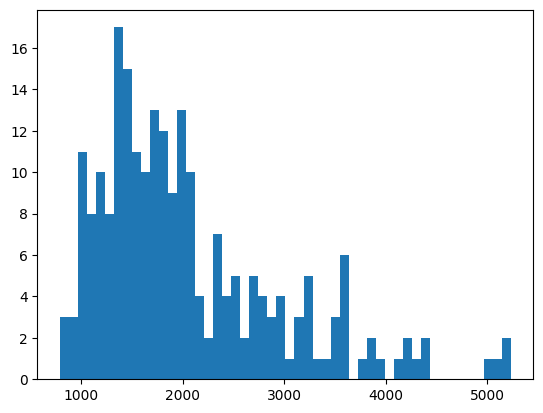

In [ ]:
plt.hist(data_both_final[data_both_final['duration_T2']<40000]['duration_T2'], bins=50)

Text(0.5, 1.0, 'R = 0.74')

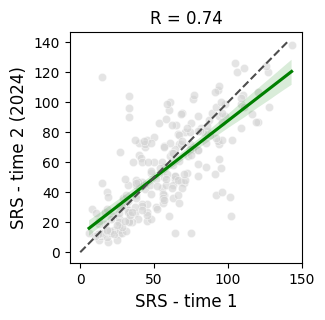

In [ ]:
#plot correlation, all subjects
fig, ax = plt.subplots(figsize=(3,3))
sns.scatterplot(data=data_both_final, x='SRS_T1',  y='SRS_T2', color = 'lightgrey', alpha=0.6)
sns.regplot(data=data_both_final, x='SRS_T1', y='SRS_T2', scatter=False, color='green')
ax.plot([0, 140], [0, 140], ls='--', c='0.3')
ax.set_xlabel('SRS - time 1', fontsize = 12)
ax.set_ylabel('SRS - time 2 (2024)', fontsize = 12)
r_value, p_value = pearsonr(data_both_final['SRS_T1'], data_both_final['SRS_T2'])
ax.set_title(f'R = {r_value:.2f}')

In [ ]:
#paired t-test between time 1 and time 2
print(np.mean(data_both_final['SRS_T1']))
print(np.mean(data_both_final['SRS_T2']))
ttest_rel(data_both_final['SRS_T1'], data_both_final['SRS_T2'])

57.01315789473684
54.916666666666664


TtestResult(statistic=1.471832289636495, pvalue=0.14245117383416706, df=227)

In [ ]:
data_both_final['recall_period'] = data_both_final['recall_period'].astype('category')
data_both_final['recall_period'] = data_both_final['recall_period'].cat.reorder_categories(['Summer2020', 'Fall2020', 'Winter2021', 'Summer2021'])

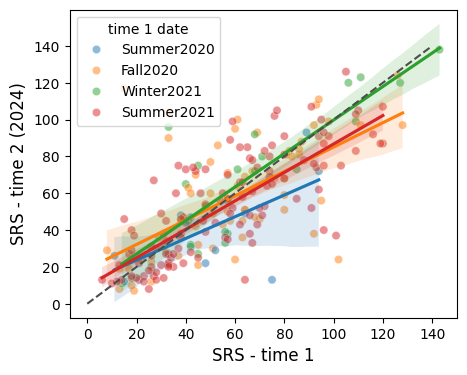

In [ ]:
#plot correlation, broken down by recall period
fig, ax = plt.subplots(figsize=(5,4))
sns.scatterplot(data=data_both_final, x='SRS_T1',  y='SRS_T2', hue = 'recall_period', alpha=0.5)
sns.regplot(data=data_both_final[data_both_final['recall_period'] == 'Summer2020'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[0])
sns.regplot(data=data_both_final[data_both_final['recall_period'] == 'Fall2020'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[1])
sns.regplot(data=data_both_final[data_both_final['recall_period'] == 'Winter2021'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[2])
sns.regplot(data=data_both_final[data_both_final['recall_period'] == 'Summer2021'], x='SRS_T1', y='SRS_T2', scatter=False, color=sns.color_palette()[3])
ax.plot([0, 140], [0, 140], ls='--', c='0.3')
ax.set_xlabel('SRS - time 1', fontsize = 12)
ax.set_ylabel('SRS - time 2 (2024)', fontsize = 12)
ax.legend(title='time 1 date')

In [ ]:
r1, p1 = pearsonr(data_both_final[data_both_final['recall_period'] == 'Summer2020']['SRS_T1'], data_both_final[data_both_final['recall_period'] == 'Summer2020']['SRS_T2'])
r2, p2 = pearsonr(data_both_final[data_both_final['recall_period'] == 'Fall2020']['SRS_T1'], data_both_final[data_both_final['recall_period'] == 'Fall2020']['SRS_T2'])
r3, p3 = pearsonr(data_both_final[data_both_final['recall_period'] == 'Winter2021']['SRS_T1'], data_both_final[data_both_final['recall_period'] == 'Winter2021']['SRS_T2'])
r4, p4 = pearsonr(data_both_final[data_both_final['recall_period'] == 'Summer2021']['SRS_T1'], data_both_final[data_both_final['recall_period'] == 'Summer2021']['SRS_T2'])
n1 = np.sum(data_both_final['recall_period'] == 'Summer2020')
n2 = np.sum(data_both_final['recall_period'] == 'Fall2020')
n3 = np.sum(data_both_final['recall_period'] == 'Winter2021')
n4 = np.sum(data_both_final['recall_period'] == 'Summer2021')
print(f'Summer 2020, N = {n1}, R = {r1:.2f}')
print(f'Fall 2020, N = {n2}, R = {r2:.2f}')
print(f'Winter 2021, N = {n3}, R = {r3:.2f}')
print(f'Summer 2021, N = {n4}, R = {r4:.2f}')

Summer 2020, N = 12, R = 0.63
Fall 2020, N = 69, R = 0.61
Winter 2021, N = 23, R = 0.84
Summer 2021, N = 124, R = 0.79


In [ ]:
#glm to test interaction
model = smf.ols('SRS_T2 ~ SRS_T1 * recall_period', data=data_both_final).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T2   R-squared:                       0.561
Model:                            OLS   Adj. R-squared:                  0.547
Method:                 Least Squares   F-statistic:                     40.20
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           4.24e-36
Time:                        19:29:07   Log-Likelihood:                -1005.6
No. Observations:                 228   AIC:                             2027.
Df Residuals:                     220   BIC:                             2055.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

In [ ]:
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

                             sum_sq     df           F        PR(>F)
recall_period           2449.698709    3.0    1.986822  1.168593e-01
SRS_T1                107481.890342    1.0  261.518738  2.755520e-39
SRS_T1:recall_period    1295.491916    3.0    1.050705  3.710046e-01
Residual               90418.056031  220.0         NaN           NaN


In [ ]:
#continuous interaction with time difference between t1 and t2 in days
data_both_final['date_diff'] = data_both_final['date_ordinal_T2'] - data_both_final['date_ordinal_T1']
data_both_final['date_diff_z'] = zscore(data_both_final['date_diff'])
model = smf.ols('SRS_T2 ~ SRS_T1 * date_diff_z', data=data_both_final).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T2   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.538
Method:                 Least Squares   F-statistic:                     89.28
Date:                Tue, 10 Sep 2024   Prob (F-statistic):           4.92e-38
Time:                        01:47:20   Log-Likelihood:                -1009.8
No. Observations:                 228   AIC:                             2028.
Df Residuals:                     224   BIC:                             2041.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             11.5426      2

In [ ]:
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

                           sum_sq     df           F        PR(>F)
SRS_T1              111447.074828    1.0  266.002529  6.066667e-40
date_diff_z            263.342772    1.0    0.628548  4.287273e-01
SRS_T1:date_diff_z      50.627768    1.0    0.120839  7.284531e-01
Residual             93849.276116  224.0         NaN           NaN


#### **Analysis #2:** Do covid scores predict SRS?

* GLM1: SRS_T1 ~ 6 covid scores at T1
* GLM2: SRS_T1 ~ 6 covid scores in 2020
* GLM3: SRS_T2 ~ 6 covid scores at T2 (2024)
* GLM4: SRS_T2 ~ 6 covid scores in 2020


In [ ]:
model1 = smf.ols('SRS_T1 ~ Covid_Q123_Anxiety_recall + Covid_Q458_LifeDisruptions_recall + Covid_Q6_NspeakFaceToFace_recall + Covid_Q7_NspeakVirtual_recall + Covid_Q9_SocialImprovements_recall + Covid_Q10_MentalHealth_recall', data=data_both_final).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T1   R-squared:                       0.157
Model:                            OLS   Adj. R-squared:                  0.134
Method:                 Least Squares   F-statistic:                     6.838
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           1.14e-06
Time:                        19:29:33   Log-Likelihood:                -1072.3
No. Observations:                 228   AIC:                             2159.
Df Residuals:                     221   BIC:                             2183.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

In [ ]:
model2 = smf.ols('SRS_T1 ~ Covid_Q123_Anxiety_2020 + Covid_Q458_LifeDisruptions_2020 + Covid_Q6_NspeakFaceToFace_2020 + Covid_Q7_NspeakVirtual_2020 + Covid_Q9_SocialImprovements_2020 + Covid_Q10_MentalHealth_2020', data=data_both_final).fit()
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T1   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.109
Method:                 Least Squares   F-statistic:                     5.624
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           1.87e-05
Time:                        19:29:34   Log-Likelihood:                -1075.5
No. Observations:                 228   AIC:                             2165.
Df Residuals:                     221   BIC:                             2189.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

In [ ]:
model3 = smf.ols('SRS_T2 ~ Covid_Q123_Anxiety_2024 + Covid_Q458_LifeDisruptions_2024 + Covid_Q6_NspeakFaceToFace_2024 + Covid_Q7_NspeakVirtual_2024 + Covid_Q9_SocialImprovements_2024 + Covid_Q10_MentalHealth_2024', data=data_both_final).fit()
print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T2   R-squared:                       0.255
Model:                            OLS   Adj. R-squared:                  0.235
Method:                 Least Squares   F-statistic:                     12.63
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           3.08e-12
Time:                        19:29:34   Log-Likelihood:                -1065.9
No. Observations:                 228   AIC:                             2146.
Df Residuals:                     221   BIC:                             2170.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

In [ ]:
model4 = smf.ols('SRS_T2 ~ Covid_Q123_Anxiety_2020 + Covid_Q458_LifeDisruptions_2020 + Covid_Q6_NspeakFaceToFace_2020 + Covid_Q7_NspeakVirtual_2020 + Covid_Q9_SocialImprovements_2020 + Covid_Q10_MentalHealth_2020', data=data_both_final).fit()
print(model4.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T2   R-squared:                       0.143
Model:                            OLS   Adj. R-squared:                  0.120
Method:                 Least Squares   F-statistic:                     6.140
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           5.69e-06
Time:                        19:29:34   Log-Likelihood:                -1081.9
No. Observations:                 228   AIC:                             2178.
Df Residuals:                     221   BIC:                             2202.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

To what extent is the change in SRS scores between T1 and T2 predicted by the change in covid questions between T1 and T2?


In [ ]:
data_both_final['SRS_diff'] = data_both_final['SRS_T2'] - data_both_final['SRS_T1']
data_both_final['SRS_AWR_diff'] = data_both_final['SRS_AWR_T2'] - data_both_final['SRS_AWR_T1']
data_both_final['SRS_COG_diff'] = data_both_final['SRS_COG_T2'] - data_both_final['SRS_COG_T1']
data_both_final['SRS_COM_diff'] = data_both_final['SRS_COM_T2'] - data_both_final['SRS_COM_T1']
data_both_final['SRS_MOT_diff'] = data_both_final['SRS_MOT_T2'] - data_both_final['SRS_MOT_T1']
data_both_final['SRS_RRB_diff'] = data_both_final['SRS_RRB_T2'] - data_both_final['SRS_RRB_T1']
data_both_final['Covid_Q123_Anxiety_diff'] = data_both_final['Covid_Q123_Anxiety_2024'] - data_both_final['Covid_Q123_Anxiety_recall']
data_both_final['Covid_Q458_LifeDisruptions_diff'] = data_both_final['Covid_Q458_LifeDisruptions_2024'] - data_both_final['Covid_Q458_LifeDisruptions_recall']
data_both_final['Covid_Q6_NspeakFaceToFace_diff'] = data_both_final['Covid_Q6_NspeakFaceToFace_2024'] - data_both_final['Covid_Q6_NspeakFaceToFace_recall']
data_both_final['Covid_Q7_NspeakVirtual_diff'] = data_both_final['Covid_Q7_NspeakVirtual_2024'] - data_both_final['Covid_Q7_NspeakVirtual_recall']
data_both_final['Covid_Q9_SocialImprovements_diff'] = data_both_final['Covid_Q9_SocialImprovements_2024'] - data_both_final['Covid_Q9_SocialImprovements_recall']
data_both_final['Covid_Q10_MentalHealth_diff'] = data_both_final['Covid_Q10_MentalHealth_2024'] - data_both_final['Covid_Q10_MentalHealth_recall']
data_both_final['Covid_Q123_Anxiety_diff2020'] = data_both_final['Covid_Q123_Anxiety_2024'] - data_both_final['Covid_Q123_Anxiety_2020']
data_both_final['Covid_Q458_LifeDisruptions_diff2020'] = data_both_final['Covid_Q458_LifeDisruptions_2024'] - data_both_final['Covid_Q458_LifeDisruptions_2020']
data_both_final['Covid_Q6_NspeakFaceToFace_diff2020'] = data_both_final['Covid_Q6_NspeakFaceToFace_2024'] - data_both_final['Covid_Q6_NspeakFaceToFace_2020']
data_both_final['Covid_Q7_NspeakVirtual_diff2020'] = data_both_final['Covid_Q7_NspeakVirtual_2024'] - data_both_final['Covid_Q7_NspeakVirtual_2020']
data_both_final['Covid_Q9_SocialImprovements_diff2020'] = data_both_final['Covid_Q9_SocialImprovements_2024'] - data_both_final['Covid_Q9_SocialImprovements_2020']
data_both_final['Covid_Q10_MentalHealth_diff2020'] = data_both_final['Covid_Q10_MentalHealth_2024'] - data_both_final['Covid_Q10_MentalHealth_2020']

In [ ]:
model5 = smf.ols('SRS_diff ~ Covid_Q123_Anxiety_diff + Covid_Q458_LifeDisruptions_diff + Covid_Q6_NspeakFaceToFace_diff + Covid_Q7_NspeakVirtual_diff + Covid_Q9_SocialImprovements_diff + Covid_Q10_MentalHealth_diff', data=data_both_final).fit()
print(model5.summary())

                            OLS Regression Results                            
Dep. Variable:               SRS_diff   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9883
Date:                Fri, 13 Sep 2024   Prob (F-statistic):              0.434
Time:                        19:29:34   Log-Likelihood:                -1019.6
No. Observations:                 228   AIC:                             2053.
Df Residuals:                     221   BIC:                             2077.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

Check the correlations between change in covid questions and change in SRS (as well as change in SRS subscales). R>0.13 would indicate significant correlation (obviously with possible multiple comparison issue)

In [ ]:
data_both_final[data_both_final.columns[data_both_final.columns.str.startswith('Covid') & data_both_final.columns.str.endswith('_diff') |data_both_final.columns.str.startswith('SRS') & data_both_final.columns.str.endswith('_diff')]].corr()

,SRS_diff,SRS_AWR_diff,SRS_COG_diff,SRS_COM_diff,SRS_MOT_diff,SRS_RRB_diff,Covid_Q123_Anxiety_diff,Covid_Q458_LifeDisruptions_diff,Covid_Q6_NspeakFaceToFace_diff,Covid_Q7_NspeakVirtual_diff,Covid_Q9_SocialImprovements_diff,Covid_Q10_MentalHealth_diff
SRS_diff,1.000000,0.696525,0.756722,0.909681,0.733382,0.847835,0.058777,-0.041505,0.017387,-0.116644,-0.087559,0.031871
SRS_AWR_diff,0.696525,1.000000,0.529592,0.587971,0.380935,0.533035,0.096043,-0.046567,-0.009155,-0.175576,-0.012112,-0.003788
SRS_COG_diff,0.756722,0.529592,1.000000,0.600557,0.385140,0.616081,0.122971,0.021931,-0.002604,-0.142889,-0.061550,0.038738
SRS_COM_diff,0.909681,0.587971,0.600557,1.000000,0.579710,0.684325,0.061357,-0.052903,0.026492,-0.109852,-0.109168,0.035134
SRS_MOT_diff,0.733382,0.380935,0.385140,0.579710,1.000000,0.506093,-0.025756,-0.048145,0.019988,0.002837,-0.092138,-0.042187
SRS_RRB_diff,0.847835,0.533035,0.616081,0.684325,0.506093,1.000000,0.018980,-0.026954,0.013850,-0.091114,-0.031410,0.080550
Covid_Q123_Anxiety_diff,0.058777,0.096043,0.122971,0.061357,-0.025756,0.018980,1.000000,0.419249,-0.183372,0.062094,0.020992,0.180184
Covid_Q458_LifeDisruptions_diff,-0.041505,-0.046567,0.021931,-0.052903,-0.048145,-0.026954,0.419249,1.000000,-0.426442,0.127165,0.233535,0.291559
Covid_Q6_NspeakFaceToFace_diff,0.017387,-0.009155,-0.002604,0.026492,0.019988,0.013850,-0.183372,-0.426442,1.000000,-0.154213,-0.175744,-0.104914
Covid_Q7_NspeakVirtual_diff,-0.116644,-0.175576,-0.142889,-0.109852,0.002837,-0.091114,0.062094,0.127165,-0.154213,1.000000,0.126007,-0.134782


Potential association between the change in number of virtual contacts and the change in awareness and cognition subscales specifically. Let's visualize the scatter plots.

Text(0.5, 1.0, 'R = -0.176')

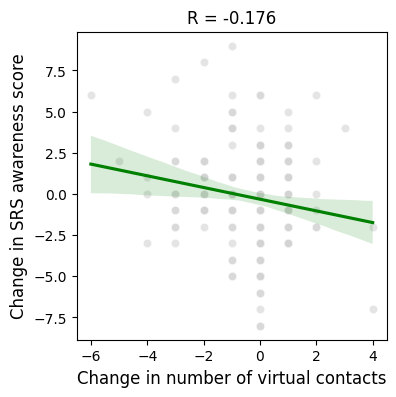

In [ ]:
fig, ax = plt.subplots(figsize=(4,4))
sns.scatterplot(data=data_both_final, x='Covid_Q7_NspeakVirtual_diff',  y='SRS_AWR_diff', color = 'lightgrey', alpha=0.6)
sns.regplot(data=data_both_final, x='Covid_Q7_NspeakVirtual_diff', y='SRS_AWR_diff', scatter=False, color='green')
#ax.plot([0, 140], [0, 140], ls='--', c='0.3')
ax.set_xlabel('Change in number of virtual contacts', fontsize = 12)
ax.set_ylabel('Change in SRS awareness score', fontsize = 12)
r_value, p_value = pearsonr(data_both_final['Covid_Q7_NspeakVirtual_diff'], data_both_final['SRS_AWR_diff'])
ax.set_title(f'R = {r_value:.3f}')

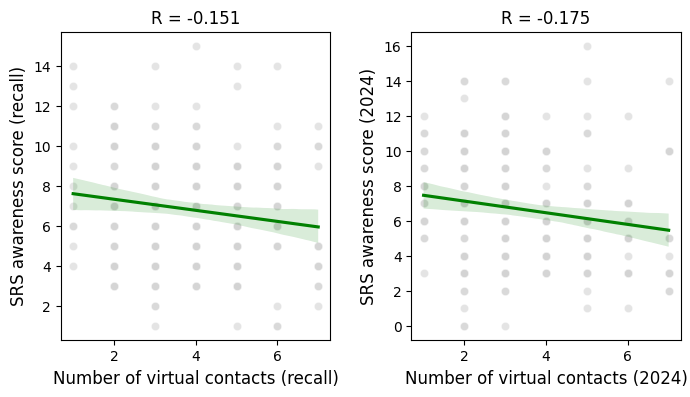

In [ ]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,4))
sns.scatterplot(data=data_both_final, x='Covid_Q7_NspeakVirtual_recall',  y='SRS_AWR_T1', ax=ax1, color = 'lightgrey', alpha=0.6)
sns.regplot(data=data_both_final, x='Covid_Q7_NspeakVirtual_recall', y='SRS_AWR_T1', ax=ax1, scatter=False, color='green')
ax1.set_xlabel('Number of virtual contacts (recall)', fontsize = 12)
ax1.set_ylabel('SRS awareness score (recall)', fontsize = 12)
r_value, p_value = pearsonr(data_both_final['Covid_Q7_NspeakVirtual_recall'], data_both_final['SRS_AWR_T1'])
ax1.set_title(f'R = {r_value:.3f}')
sns.scatterplot(data=data_both_final, x='Covid_Q7_NspeakVirtual_2024',  y='SRS_AWR_T2', ax=ax2, color = 'lightgrey', alpha=0.6)
sns.regplot(data=data_both_final, x='Covid_Q7_NspeakVirtual_2024', y='SRS_AWR_T2', ax=ax2, scatter=False, color='green')
ax2.set_xlabel('Number of virtual contacts (2024)', fontsize = 12)
ax2.set_ylabel('SRS awareness score (2024)', fontsize = 12)
r_value, p_value = pearsonr(data_both_final['Covid_Q7_NspeakVirtual_2024'], data_both_final['SRS_AWR_T2'])
ax2.set_title(f'R = {r_value:.3f}')
plt.subplots_adjust(wspace=0.3, hspace=0.4)

In [ ]:
model6 = smf.ols('SRS_diff ~ Covid_Q123_Anxiety_diff2020 + Covid_Q458_LifeDisruptions_diff2020 + Covid_Q6_NspeakFaceToFace_diff2020 + Covid_Q7_NspeakVirtual_diff2020 + Covid_Q9_SocialImprovements_diff2020 + Covid_Q10_MentalHealth_diff2020', data=data_both_final).fit()
print(model6.summary())

                            OLS Regression Results                            
Dep. Variable:               SRS_diff   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9951
Date:                Fri, 13 Sep 2024   Prob (F-statistic):              0.429
Time:                        19:29:35   Log-Likelihood:                -1019.6
No. Observations:                 228   AIC:                             2053.
Df Residuals:                     221   BIC:                             2077.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


#### **Analysis #3:** Are the correlations between covid scores and SRS driven by specific SRS subscales?

Plot correlations between covid scores and SRS subscales.

<Axes: >

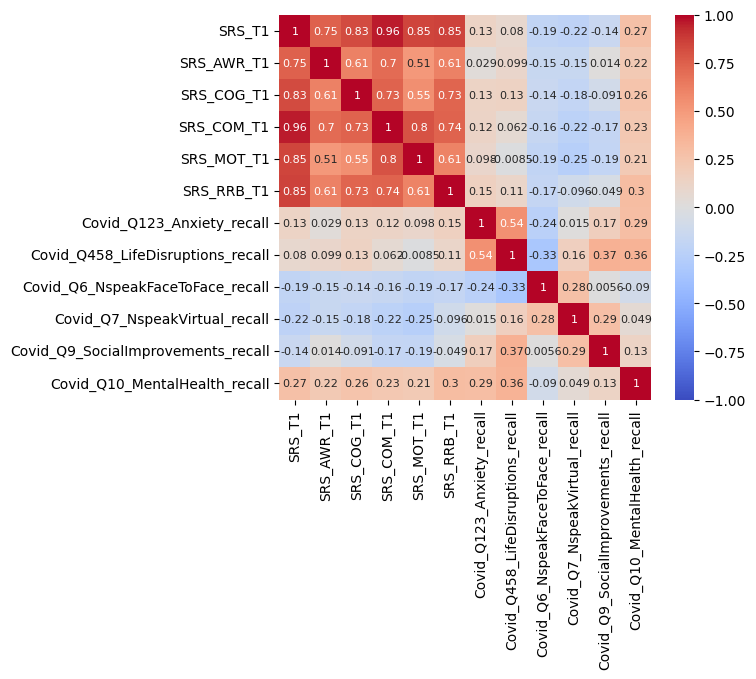

In [ ]:
#at recall
n_list = ['SRS_T1', 'SRS_AWR_T1', 'SRS_COG_T1', 'SRS_COM_T1', 'SRS_MOT_T1', 'SRS_RRB_T1']
corr_recall = data_both_final[data_both_final.columns[data_both_final.columns.str.startswith('Covid') & data_both_final.columns.str.endswith('recall') | data_both_final.columns.str.contains('|'.join(n_list))]].corr()

fig, ax = plt.subplots(figsize=(6,5))
sns.heatmap(corr_recall, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_recall.columns.values, yticklabels=corr_recall.columns.values)

<Axes: >

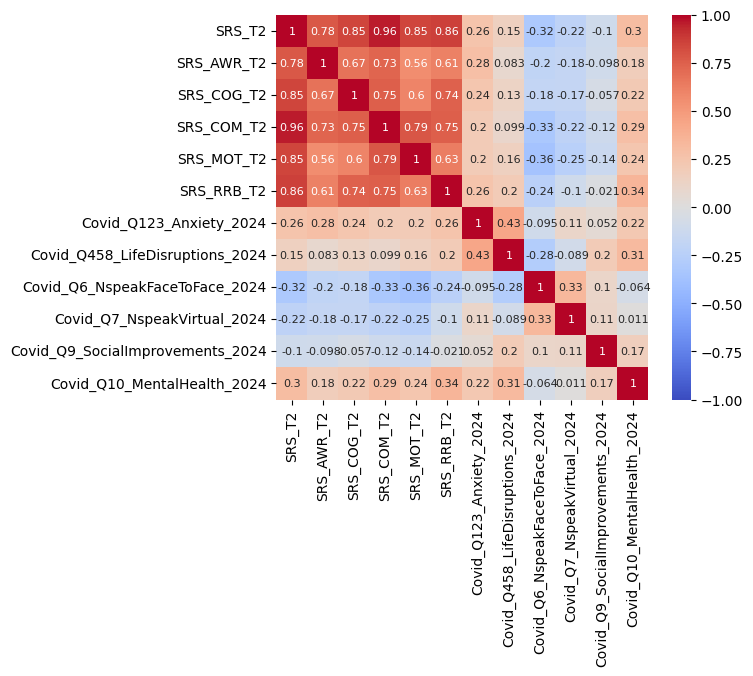

In [ ]:
#in 2024
n_list = ['SRS_T2', 'SRS_AWR_T2', 'SRS_COG_T2', 'SRS_COM_T2', 'SRS_MOT_T2', 'SRS_RRB_T2']
corr_recall = data_both_final[data_both_final.columns[data_both_final.columns.str.startswith('Covid') & data_both_final.columns.str.endswith('2024') | data_both_final.columns.str.contains('|'.join(n_list))]].corr()

fig, ax = plt.subplots(figsize=(6,5))
sns.heatmap(corr_recall, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_recall.columns.values, yticklabels=corr_recall.columns.values)

Unclear given high degree of correlation between subscales.

#### **Analysis #4:** Are covid effects driven by specific SRS items?

In [ ]:
data_both_final.head()

,ID,Gender,Race,Education,age_T1,SRS_T1,SRS_AWR_T1,SRS_COG_T1,SRS_COM_T1,SRS_MOT_T1,...,Covid_Q6_NspeakFaceToFace_diff,Covid_Q7_NspeakVirtual_diff,Covid_Q9_SocialImprovements_diff,Covid_Q10_MentalHealth_diff,Covid_Q123_Anxiety_diff2020,Covid_Q458_LifeDisruptions_diff2020,Covid_Q6_NspeakFaceToFace_diff2020,Covid_Q7_NspeakVirtual_diff2020,Covid_Q9_SocialImprovements_diff2020,Covid_Q10_MentalHealth_diff2020
0,55b249bdfdf99b28e3c14b05,f,Black / African-American,Some College,35,33,2,1,5,18,...,1,1,0,0,0.000000,-2.000000,0,1,0,0
1,55cf5cc434e9060005e56c39,f,Caucasian / White,Masters Degree,60,39,4,6,8,13,...,0,-1,0,0,-4.000000,-2.000000,1,-2,0,0
2,55ea70c37480920010aa9982,m,Black / African-American,Some College,34,37,4,5,7,16,...,1,0,0,0,-2.333333,-4.000000,2,1,0,0
3,56a37d86dbe850000bfcef9d,f,Caucasian / White,Bachelors Degree,57,57,7,11,14,19,...,1,-2,0,-1,-5.000000,-6.333333,3,-2,0,-2
4,56d0f57421cd29000a9737e4,m,Caucasian / White,Bachelors Degree,38,67,6,6,21,25,...,3,-2,-1,0,-5.333333,-4.666667,3,-2,-1,0


List highest scoring SRS items from T1, as well as items with strongest decrease between T1 and T2.

In [ ]:
item_names = []
mean_item_T1 = []
mean_item_T2 = []
mean_item_diff = []
t_stat_all = []
p_value_all = []
mean_item_diff_rev = []
t_stat_rev_all = []
reverse_coded_fields = ['SRS_3', 'SRS_7', 'SRS_11', 'SRS_12', 'SRS_15', 'SRS_17', 'SRS_21', 'SRS_22', 'SRS_26', 'SRS_32', 'SRS_38', 'SRS_40', 'SRS_43', 'SRS_45', 'SRS_48']

for n in range(1,66):
  col_name = 'SRS_'+ str(n)
  col_name_T1 = col_name + '_T1'
  col_name_T2 = col_name + '_T2'
  if col_name in reverse_coded_fields:
    sample1 = 3-data_both_final[col_name_T1]
    sample2 = 3-data_both_final[col_name_T2]
  else:
    sample1 = data_both_final[col_name_T1]
    sample2 = data_both_final[col_name_T2]

  diff = sample2 - sample1
  t_stat, p_value = ttest_rel(sample1, sample2)

  item_names.append(col_name)
  mean_item_T1.append(np.mean(sample1))
  mean_item_T2.append(np.mean(sample2))
  mean_item_diff.append(np.mean(diff))
  t_stat_all.append(t_stat)
  p_value_all.append(p_value)

df_item_diff = pd.DataFrame(data = {'SRS_item': item_names, 'T1 mean': mean_item_T1, 'T2 mean': mean_item_T2, 'diff_mean': mean_item_diff,
                                    'T': t_stat_all, 'p': p_value_all})
df_item_diff.head()

,SRS_item,T1 mean,T2 mean,diff_mean,T,p
0,SRS_1,1.359649,1.600877,0.241228,-2.765716,0.006147
1,SRS_2,0.912281,0.872807,-0.039474,0.640393,0.522563
2,SRS_3,1.675439,1.754386,0.078947,-1.287568,0.199208
3,SRS_4,0.741228,0.706140,-0.035088,0.468972,0.639540
4,SRS_5,0.552632,0.442982,-0.109649,1.946351,0.052847


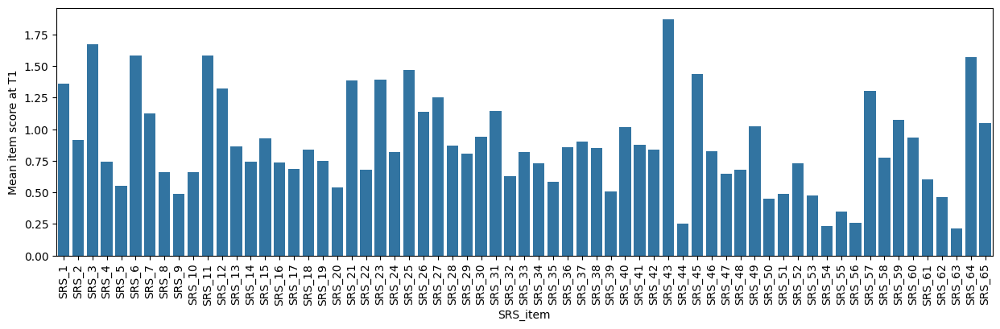

In [ ]:
#plot mean at T1
plt.figure(figsize=(15, 4))
sns.barplot(x='SRS_item', y='T1 mean', data = df_item_diff)
#plt.axhline(y=0.52, color='r', linestyle='--', linewidth=1)
plt.ylabel('Mean item score at T1')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df_item_diff.sort_values(by='T1 mean', ascending=False).head(15)

,SRS_item,T1 mean,T2 mean,diff_mean,T,p
42,SRS_43,1.868421,1.855263,-0.013158,0.225024,0.822163
2,SRS_3,1.675439,1.754386,0.078947,-1.287568,0.199208
5,SRS_6,1.583333,1.500000,-0.083333,1.448013,0.148993
10,SRS_11,1.583333,1.605263,0.021930,-0.400870,0.688893
63,SRS_64,1.570175,1.491228,-0.078947,1.108378,0.268871
24,SRS_25,1.469298,1.394737,-0.074561,1.165737,0.244944
44,SRS_45,1.438596,1.407895,-0.030702,0.483386,0.629288
22,SRS_23,1.394737,1.385965,-0.008772,0.126218,0.899671
20,SRS_21,1.385965,1.114035,-0.271930,3.983843,0.000091
0,SRS_1,1.359649,1.600877,0.241228,-2.765716,0.006147


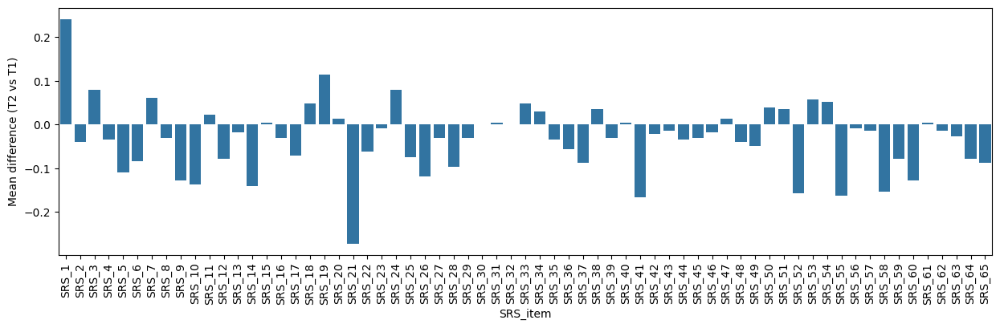

In [ ]:
#plot change between T1 and T2 per item
plt.figure(figsize=(15, 4))
sns.barplot(x='SRS_item', y='diff_mean', data = df_item_diff)
#plt.axhline(y=0.52, color='r', linestyle='--', linewidth=1)
plt.ylabel('Mean difference (T2 vs T1)')
plt.xticks(rotation=90)
plt.show()

In [ ]:
df_item_diff.sort_values(by='diff_mean', ascending=True).head(15)

,SRS_item,T1 mean,T2 mean,diff_mean,T,p
20,SRS_21,1.385965,1.114035,-0.271930,3.983843,0.000091
40,SRS_41,0.877193,0.710526,-0.166667,2.501959,0.013056
54,SRS_55,0.350877,0.188596,-0.162281,2.856898,0.004675
51,SRS_52,0.732456,0.574561,-0.157895,2.500816,0.013097
57,SRS_58,0.776316,0.622807,-0.153509,2.746985,0.006497
13,SRS_14,0.745614,0.605263,-0.140351,2.577086,0.010597
9,SRS_10,0.662281,0.526316,-0.135965,2.239417,0.026098
8,SRS_9,0.486842,0.359649,-0.127193,2.060001,0.040539
59,SRS_60,0.934211,0.807018,-0.127193,2.223824,0.027145
25,SRS_26,1.140351,1.021930,-0.118421,2.364654,0.018890


#### **Analysis #5:** Is the effect of covid scores on SRS robust to other individual differences (other questionnaires, demographic variables, timing)

Re-run model 3 from Analysis #2 above controlling for other variables in the data.

<Axes: >

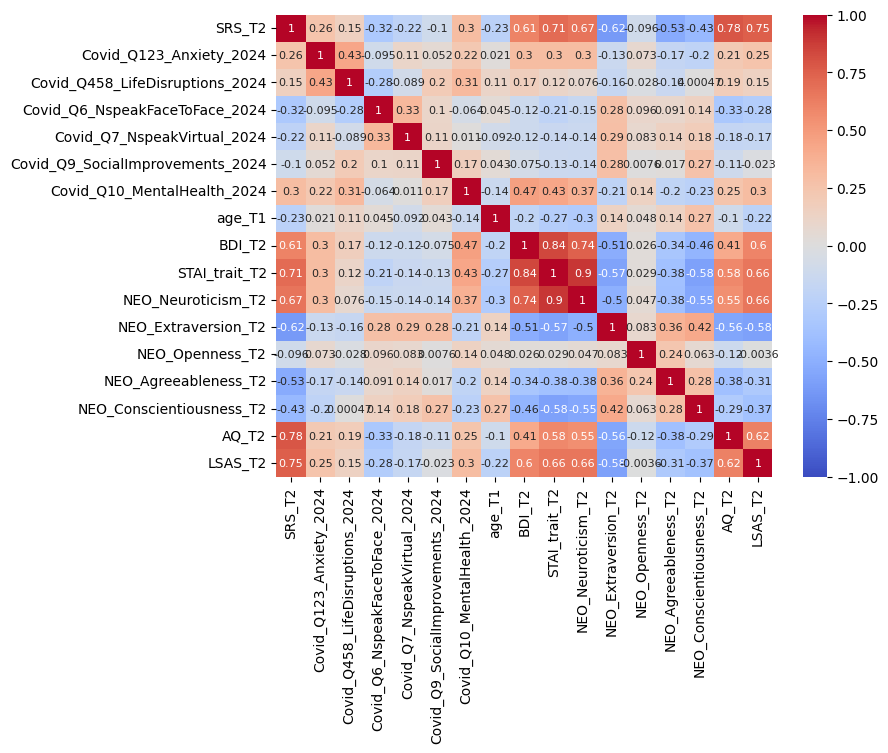

In [ ]:
cols_to_select = ['SRS_T2', 'Covid_Q123_Anxiety_2024', 'Covid_Q458_LifeDisruptions_2024', 'Covid_Q6_NspeakFaceToFace_2024', 'Covid_Q7_NspeakVirtual_2024', 'Covid_Q9_SocialImprovements_2024', 'Covid_Q10_MentalHealth_2024',
                  'age_T1', 'BDI_T2', 'STAI_trait_T2', 'NEO_Neuroticism_T2', 'NEO_Extraversion_T2', 'NEO_Openness_T2', 'NEO_Agreeableness_T2', 'NEO_Conscientiousness_T2', 'AQ_T2', 'LSAS_T2']
corr_all = data_both_final[cols_to_select].corr()

fig, ax = plt.subplots(figsize=(8,6))
sns.heatmap(corr_all, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_all.columns.values, yticklabels=corr_all.columns.values)

Given high correlation, we for now get rid of BDI, Neuroticism.

To-do:
* calculate age at T2
* recode some variables for GLM so that they have fewer levels, in particular:
  * autism_T2: keep 2 levels: No, Yes (inclusive of identifying, and in the process of receiving a diagnosis)
  * family_autism_T2: keep 2 levels: No/Unknown, Yes
  * Education: recode numerically such that higher number = more education
  * diagnose_all_T2: keep 2 levels: None vs At least 1 diagnosis



In [ ]:
data_both_final = data_both_final.rename(columns={'Gender': 'Sex'}, errors="raise")

In [ ]:
data_both_final['Education_num'] = data_both_final['Education'].replace({'Did not complete high school': 0, 'High school diploma/GED': 1, 'High School (Graduate or Equivalent)': 1,
                                                                         'Some College': 2, 'Currently in college/university': 2, "Associate's degree (2 yr)": 2,
                                                                         'Associates Degree': 2, "Bachelor's degree (4 yr)": 3, 'Bachelors Degree': 3,
                                                                         'Masters Degree': 4, "Master's degree": 4, 'Graduate Degree': 4, 'Doctoral degree': 5})
data_both_final['Education_num'].unique()

array([ 2.,  4.,  3.,  1., nan,  5.,  0.])

In [ ]:
data_both_final['autism_T2_incl'] = data_both_final['autism_T2'].replace({'Yes - as an adult': 'Yes', 'No - but I identify as being on the autism spectrum': 'Yes',
                                                                         'Do not know / rather not say': np.nan, 'Yes - as a child': 'Yes',
                                                                         'I am in the process of receiving a diagnosis': 'Yes'})
data_both_final['autism_T2_incl'].unique()

array(['No', 'Yes', nan], dtype=object)

In [ ]:
data_both_final['family_autism_T2'] = data_both_final['family_autism_T2'].replace({"I don't know": 'No'})
data_both_final['family_autism_T2'].unique()

array(['No', 'Yes'], dtype=object)

In [ ]:
data_both_final['diagnosis_bin_T2'] = data_both_final['diagnose_all_T2']
data_both_final.loc[data_both_final['diagnose_all_T2'] != 'None of these',  'diagnosis_bin_T2'] = 'At least one'
data_both_final['diagnosis_bin_T2'].unique()

array(['None of these', 'At least one'], dtype=object)

In [ ]:
data_both_final['age_approx_T2'] = data_both_final['age_T1']
date_diff = data_both_final['date_ordinal_T2'] - data_both_final['date_ordinal_T1']
data_both_final.loc[(date_diff > 365*2.5) & (date_diff <= 365*3.5), 'age_approx_T2'] += 3
data_both_final.loc[(date_diff > 365*3.5) & (date_diff <= 365*4.5), 'age_approx_T2'] += 4
data_both_final['age_approx_T2']

,age_approx_T2
0,38
1,63
2,37
3,60
4,41
...,...
223,35
224,52
225,31
226,55


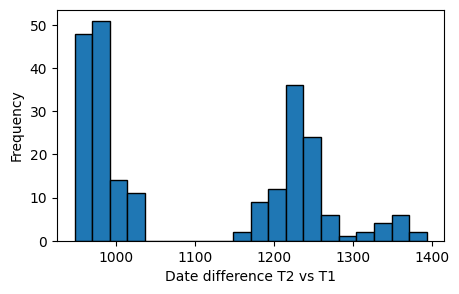

In [ ]:
plt.figure(figsize=(5, 3))
plt.hist(data_both_final['date_ordinal_T2'] - data_both_final['date_ordinal_T1'], bins=20, edgecolor='black')
plt.xlabel('Date difference T2 vs T1')
plt.ylabel('Frequency')
plt.show()

Now we can run a GLM with our new variables.

<Axes: >

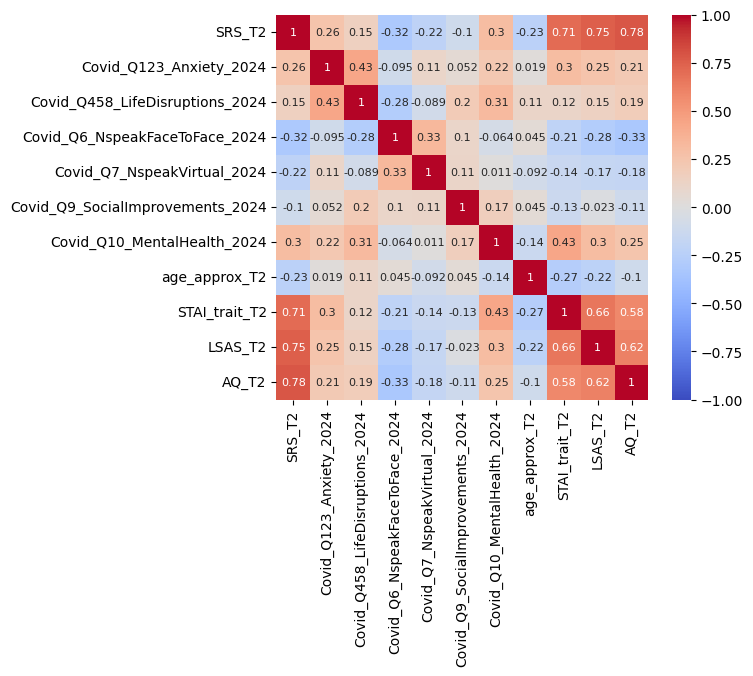

In [ ]:
#first replot the correlations
cols_to_select = ['SRS_T2', 'Covid_Q123_Anxiety_2024', 'Covid_Q458_LifeDisruptions_2024', 'Covid_Q6_NspeakFaceToFace_2024', 'Covid_Q7_NspeakVirtual_2024', 'Covid_Q9_SocialImprovements_2024', 'Covid_Q10_MentalHealth_2024',
                  'age_approx_T2', 'STAI_trait_T2', 'LSAS_T2', 'AQ_T2']
corr_all = data_both_final[cols_to_select].corr()

fig, ax = plt.subplots(figsize=(6,5))
sns.heatmap(corr_all, annot=True, annot_kws={"size": 8}, cmap='coolwarm', vmin=-1.0, vmax=1.0,
            xticklabels=corr_all.columns.values, yticklabels=corr_all.columns.values)

In [ ]:
model3_full = smf.ols('SRS_T2 ~ Covid_Q123_Anxiety_2024 + Covid_Q458_LifeDisruptions_2024 + Covid_Q6_NspeakFaceToFace_2024 + Covid_Q7_NspeakVirtual_2024 + Covid_Q9_SocialImprovements_2024 + Covid_Q10_MentalHealth_2024 + \
        Sex + age_approx_T2 + Education_num + autism_T2_incl + family_autism_T2 + diagnosis_bin_T2 + STAI_trait_T2 + LSAS_T2',
                      data=data_both_final).fit()
print(model3_full.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T2   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.689
Method:                 Least Squares   F-statistic:                     34.64
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           9.63e-46
Time:                        20:28:25   Log-Likelihood:                -899.53
No. Observations:                 214   AIC:                             1829.
Df Residuals:                     199   BIC:                             1880.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Interc

Identifying which variables specifically make the effect of covid scores disappear

In [ ]:
model3_d = smf.ols('SRS_T2 ~ Covid_Q123_Anxiety_2024 + Covid_Q458_LifeDisruptions_2024 + Covid_Q6_NspeakFaceToFace_2024 + Covid_Q7_NspeakVirtual_2024 + Covid_Q9_SocialImprovements_2024 + Covid_Q10_MentalHealth_2024 + \
        Sex + age_approx_T2 + Education_num + autism_T2_incl + family_autism_T2', data=data_both_final).fit()
print(model3_d.summary())

                            OLS Regression Results                            
Dep. Variable:                 SRS_T2   R-squared:                       0.365
Model:                            OLS   Adj. R-squared:                  0.331
Method:                 Least Squares   F-statistic:                     10.58
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           2.94e-15
Time:                        20:31:03   Log-Likelihood:                -982.97
No. Observations:                 214   AIC:                             1990.
Df Residuals:                     202   BIC:                             2030.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

In [ ]:
model3_AQ = smf.ols('AQ_T2 ~ Covid_Q123_Anxiety_2024 + Covid_Q458_LifeDisruptions_2024 + Covid_Q6_NspeakFaceToFace_2024 + Covid_Q7_NspeakVirtual_2024 + Covid_Q9_SocialImprovements_2024 + Covid_Q10_MentalHealth_2024',
                      data=data_both_final).fit()
print(model3_AQ.summary())

                            OLS Regression Results                            
Dep. Variable:                  AQ_T2   R-squared:                       0.201
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     9.276
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           4.53e-09
Time:                        20:35:16   Log-Likelihood:                -769.50
No. Observations:                 228   AIC:                             1553.
Df Residuals:                     221   BIC:                             1577.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

In [ ]:
model3_AQ_full = smf.ols('AQ_T2 ~ Covid_Q123_Anxiety_2024 + Covid_Q458_LifeDisruptions_2024 + Covid_Q6_NspeakFaceToFace_2024 + Covid_Q7_NspeakVirtual_2024 + Covid_Q9_SocialImprovements_2024 + Covid_Q10_MentalHealth_2024 + \
        Sex + age_approx_T2 + Education_num + autism_T2_incl + family_autism_T2 + diagnosis_bin_T2 + STAI_trait_T2 + LSAS_T2',
                      data=data_both_final).fit()
print(model3_AQ_full.summary())

                            OLS Regression Results                            
Dep. Variable:                  AQ_T2   R-squared:                       0.548
Model:                            OLS   Adj. R-squared:                  0.516
Method:                 Least Squares   F-statistic:                     17.20
Date:                Fri, 13 Sep 2024   Prob (F-statistic):           2.50e-27
Time:                        20:34:46   Log-Likelihood:                -662.47
No. Observations:                 214   AIC:                             1355.
Df Residuals:                     199   BIC:                             1405.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Interc